# ICA FDR (1): Independent Component Analysis followed by FDR estimation
Following the analysis workflow described in [Rotival 2011].

## Packages

In [13]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from scipy import stats
from scipy.linalg import svd
#from sklearn.manifold import MDS
from sklearn.decomposition import FastICA
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

from clusterian import ica

import utilsClust
import os

In [2]:
Doc = "/home/ldap/ipellet/Documents/"

## Data

In [3]:
rna = pd.read_csv(os.path.join(Doc,"data/DataRnaseq_Transposed.csv"), index_col=0)
g2v = pd.read_csv(os.path.join(Doc,"data/gene2vec_dim_200_iter_9.csv"), index_col=0)

In [4]:
rna.shape

(14809, 200)

In [5]:
g2v.shape

(24447, 200)

## ICA method description

ICA is a decomposition method, it represents a data-set using `n` components called "independent components". The expression of each gene is written as a linear function of these component.Each component defines groups of co-induced and/or co-repressed genes. These components may be viewed as reflecting distinct biological causes influencing gene expression, such as activation of signaling pathways, binding of transcription factors, posttranscriptional regulation...

The ICA method splits the expression data matrix $X$, with rows being the genes and columns the samples, into a matrix product.
$$X\sim SA$$
The expression level of gene $i$ in sample $j$ is :
$$x_{ij} = \sum_k s_{ik}a{kj}$$
with :
- $s_{ik}$ the contribution of component $k$ on gene expression $i$
- $a_{kj}$ the level of "activation" of that component in individual $j$

Each column of S is a vector of the linear contributions of the
component on each gene expression which can be interpreted as
the "signature" of the underlying biological process. With ICA, each component can be characterized by a set of genes for which its contributions are significantly different from zero (modules).

Importantly, different components can be characterized by overlapping sets of genes. For this reason, ICA is likely to better reflect biological reality than methods that partition genes into distinct clusters.

## Analysis workflow
RNA-seq data from the retrospective cohort is allready filtered and normalized. 

### Checking for outliers
The possible presence of outlier genes is analysed. To do so, the first two principal components obtained by MultiDimensional Scaling (MDS) of a distance between individuals is computer. The distance metrics used is `1-corr`, `corr` beeing the pairwise Pearson correlation between the gene expression data.

```
rnaCorr = rna.T.corr()
rnaDist = 1-abs(rnaCorr)
rnaDist.to_csv("../data/rnaDist.csv", header=True, index=True)
```

In [5]:
rnaDist = pd.read_csv("../data/rnaDist.csv", index_col=0)

In [6]:
rnaDist.shape

(14809, 14809)

In [7]:
rnaDistMDS = MDS(n_components=2, dissimilarity='precomputed').fit_transform(rnaDist)

KeyboardInterrupt: 

The outliers are defined as the genes whose data are located more than 4 standard deviation away from the center of the main cluster.

In [ ]:
def plotOutliersMDS(distMDS):
    center = np.median(distMDS, axis=0)
    sd = np.std(distMDS, axis=0)

    plt.figure()
    ax = plt.gca()
    ax.scatter(distMDS[:,0],distMDS[:,1], marker="+")
    ax.scatter(center[0],center[1], marker="+", color="orange")

    nstd = 4
    ellipse = Ellipse(xy=center, width=nstd*2*sd[0], height=nstd*2*sd[1], 
                            edgecolor='orange', fc='None', lw=1, ls='--')
    ax.add_patch(ellipse)
    ioutliers = np.where(np.sum(nstd*sd-abs(distMDS-center)<0, axis=1)>0)[0]
    outliers = rnaDistMDS[ioutliers,:]
    if outliers.shape[0]>0 :
        print(outliers.shape[1], "outliers detected")
        ax.scatter(outliers[:,0],outliers[:,1], marker="+", color="r")

    ax.set_xlabel("axis 1")
    ax.set_ylabel("axis 2")
    ax.set_title("Correlation-based MDS")
    plt.show()
    
    return ioutliers

In [ ]:
rnaiOutliers = plotOutliersMDS(rnaDistMDS)

No outlie detected. All genes are kept.

### Singular Value Decomposition (SVD)
SVD is used prior to ICA to reduce the dimentionality of data and to **determine the optimal number of components** to extract with the ICA. 

The screeplot of the SVD eigenvalues is used to determine the number of components required to explain non-random variation. The explained variance is recovered throught the eigenvalues and compared to the explained variance of 10 random data matrices with values drawn from a normal distribution with the same mean and standard deviation values as our dataset [Horn 1965].

<span style="color:red">Final solution : All 200 dimentions were kept to maximise the number of clusters.</span>

In [9]:
rnaFlat = rna.to_numpy().flatten()
scale = np.std(rnaFlat)
loc = np.mean(rnaFlat)

shap_stat, shap_pval = stats.shapiro(rnaFlat) 
# Shapiro-Wilks test : too much power, not accurate for large datasets
ktest_stat, ktest_pval = stats.kstest(rvs=rnaFlat, cdf="norm", args=(loc,scale))
# K-S test should be les affected by data size
shap_pval, ktest_pval

/home/ldap/ipellet/anaconda3/lib/python3.9/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


(0.0, 0.0)

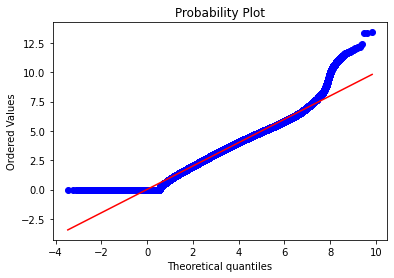

In [10]:
stats.probplot(rnaFlat, sparams=(loc,scale), plot=plt)
plt.show()

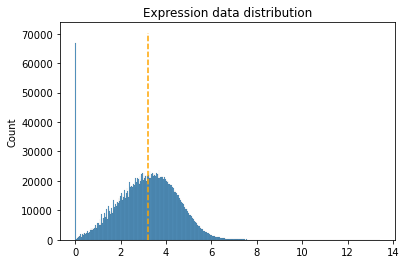

In [11]:
h = sns.histplot(rnaFlat)
plt.vlines(loc, ymin=0, ymax=h.get_ylim()[1], color="orange", ls="--")
plt.title("Expression data distribution")
plt.show()

Not very normal even if the tests p-values are $0$... We will still use the normal distribution to generate random data.

In [14]:
U,s,VT = svd(rna)
sRand = ica.randDataSVD(rna, K=10)

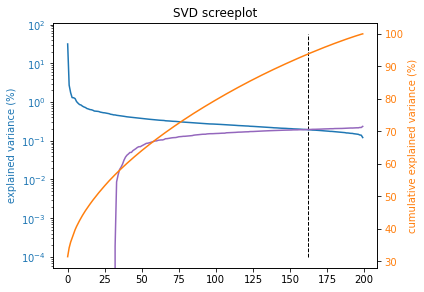

Optimal number of components : 162


In [15]:
nComp = ica.plotSVDscreeplot(s, sRand)

The optimal number of components is chosen as the maximal number of component for which the explained variance is still greater than the residual explained variance of the random data (purple line).

### FastICA with chosen number of components
The FastICA algorithm can then be run for the optimal number of components found before.

In [16]:
rnaICA = FastICA(n_components=nComp, fun='logcosh')
rnaS_ = rnaICA.fit_transform(rna)  # Reconstruct signals
# rnaA_ = rnaICA.mixing_  # Get estimated mixing matrix

### Individual-specific components removal

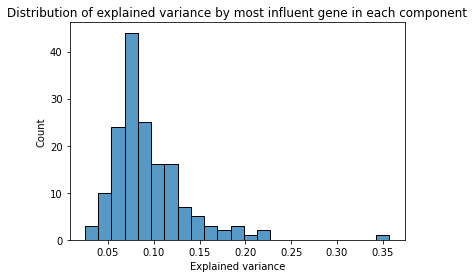

In [17]:
h = sns.histplot(np.amax(np.abs(rnaS_), axis=0))
plt.title("Distribution of explained variance by most influent gene in each component")
plt.xlabel("Explained variance")
plt.show()

The histogram shows the distribution of maximal explained variance per component.

There are few genes that contributes to explain a lot of the variance of a component. In order to avoid detecting modules with only one gene, the components whose variance is mostly explained by one gene are removed.

In [19]:
rnaS_delIndiv,_ = ica.delIndivSpe(rnaS_, threshold=0.10)

50 components are characterized by a single gene who explain more than 10.0 % of the variability of the pattern in the population.
After romving those components, 112 components remain.


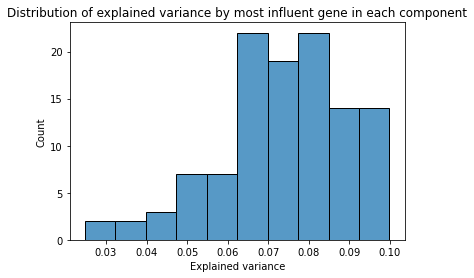

In [20]:
h = sns.histplot(np.amax(np.abs(rnaS_delIndiv), axis=0))
plt.title("Distribution of explained variance by most influent gene in each component")
plt.xlabel("Explained variance")
plt.show()

### Gaussian components removal
In order to detect interesting modules, the columns of S must be as non-gaussian as possible : a peaked ditribution with few genes at the tails to which it strongly contributes and most of the genes beeing weakly influenced. Kurtosis is used to measure the peakedness of the distributions. A high kurtosis indicates a peaked distribution and a low kurtosis will caracterise a more gaussian distribution.

In [21]:
kurt = stats.kurtosis(rnaS_delIndiv)

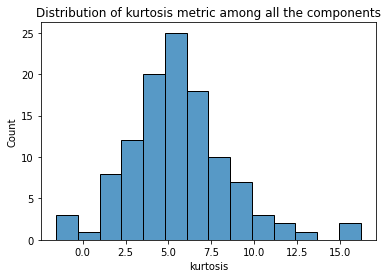

In [22]:
sns.histplot(kurt)
plt.title("Distribution of kurtosis metric among all the components")
plt.xlabel("kurtosis")
plt.show()

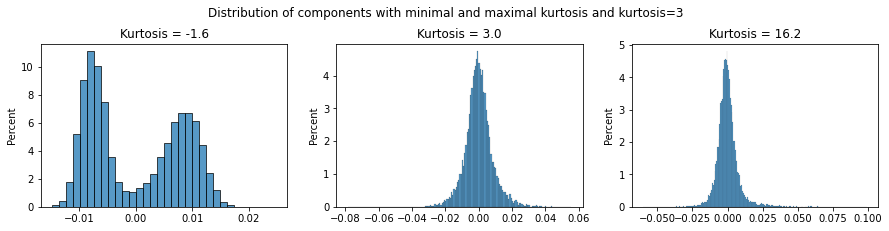

In [24]:
ica.plotKurt(rnaS_delIndiv, kurt, ktsmin = 3)

We will only keep components with $kurtosis \geq 3$

In [26]:
rnaS_delKurt,_ = ica.delKurtosis(rnaS_delIndiv, ktsmin=3)

19 components are characterized by a kurtosis < 3 and will be removed.
After romving those components, 93 components remain.


### False Discovery Rate (FDR)
For each of those kept components, we define the module as the subset of genes the most strongly influenced (genes at both extremes of the distribution). To detect those genes for each component, the z-score statistic was computed for each gene in each component from the z-scores, the False Discovery Rate (FDR) estimation was computed with the method described in [Strimmer 2008].

In [28]:
rnaS_fdr = ica.runFDRanalysis(rnaS_delKurt)

In [161]:
flatFDR = rnaS_fdr.flat
FDRmax = 1e-3

NameError: name 'rnaS_fdr' is not defined

Genes associated with an $FDR<10^{-3}$ are considered as belonging to the module characterizing the signature.

In [34]:
rnaModules = pd.DataFrame((rnaS_fdr<FDRmax).astype(int), index=rna.index)
rnaModules.head()

,0,1,2,3,4,5,6,7,8,9,...,83,84,85,86,87,88,89,90,91,92
TSPAN6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DPM1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SCYL3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
C1orf112,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
FGR,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


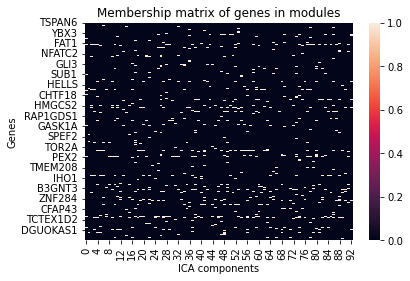

In [35]:
sns.heatmap(rnaModules)
plt.title("Membership matrix of genes in modules")
plt.xlabel("ICA components")
plt.ylabel("Genes")
plt.show()

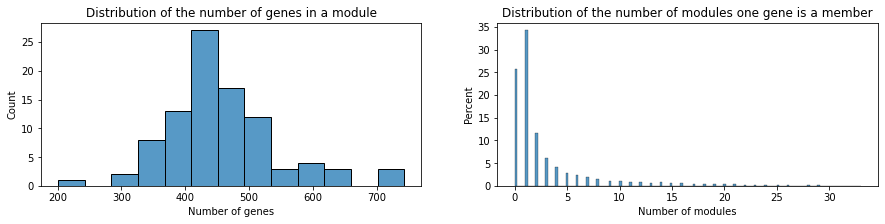

Number of genes in a module : 
- Mean : 459.47 
- Median : 447.0 
- Max : 743 
- Min : 201 

Number of modules per gene : 
- Mean : 2.89 
- Median : 1.0 
- Max : 33 
- Min : 0 

25.69 % of genes are not included in any module.
34.21 % of genes are included in only one module.
40.10 % of genes are included in more than one module.


In [37]:
ica.moduleSummary(rnaModules)

In [39]:
rnaModules.to_csv("../data/ICAmodules_rna.csv", header=True, index=True)

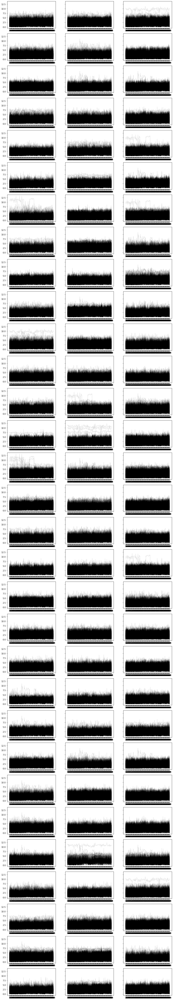

In [38]:
plotClust.profiles(rna, rnaModules)

In [178]:
from importlib import reload
reload(utilsClust)

<module 'utilsClust' from '/home/ldap/ipellet/Documents/Clustering/utilsClust.py'>

In [98]:
rnaEnrich = utilsClust.runEnrichr(rnaModules, "ICA_rna", lib = "GO", date = "2021")

In [15]:
import os
import string

In [40]:
alpha = 0.05
enrClust = pd.DataFrame([], columns=["Cluster", "n enrich"])
for d in os.listdir('./enrich/'):
    if "ICA_rna" in d:
        cl = int(d.split('_')[-1])
        #print(cl)
        countEnr = 0
        for f in os.listdir('./enrich/'+d):
            tab = pd.read_table('./enrich/'+d+'/'+f)
            countEnr += sum(tab.loc[:,"Adjusted P-value"]<=alpha)
        df = pd.DataFrame([cl, countEnr]).T
        df.columns = ["Cluster", "n enrich"]
        enrClust = pd.concat([enrClust, df])
enrClust=enrClust.sort_values(by="Cluster")

<AxesSubplot:xlabel='n enrich', ylabel='Count'>

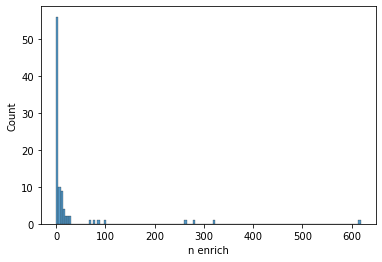

In [48]:
sns.histplot(enrClust.loc[:,"n enrich"])

<AxesSubplot:xlabel='n enrich', ylabel='Count'>

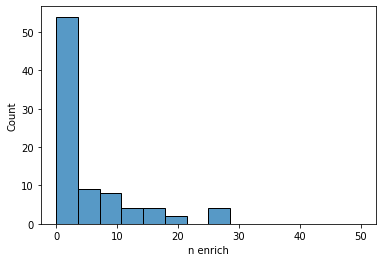

In [50]:
sns.histplot(enrClust.loc[:,"n enrich"], binrange=[0,50])

In [99]:
fileRNA = open("ICAenrichr_rna.txt", "w")
strEnr = repr(rnaEnrich)
fileRNA.write("rnaEnrich = " + strEnr + "\n")
fileRNA.close()

### Run whole analysis

In [176]:
def runICAmodDetection(data, IndivSpe=0.10, ktsmin=3, FDRmax = 1e-3, plot=True, nComp=None):
    # outlier removal
    #distMDS = MDS(n_components=2, dissimilarity='precomputed').fit_transform(dist)
    #outliersIndex = plotOutliersMDS(distMDS)
    #data_noOut = np.delete(data, outliersIndex, 0)
    data_noOut = data
    
    if nComp==None:
        # SVD
        _,s,_ = svd(data_noOut)
        sRand = randDataSVD(data_noOut, K=10)
        nComp = plotSVDscreeplot(s, sRand, plot=plot)
        del s
    
    # ICA
    ICA = FastICA(n_components=nComp, fun='logcosh')
    S_ = ICA.fit_transform(data_noOut)  # Reconstruct signals
    del ICA, data_noOut
    
    # Individual-specific components removal
    S_delIndiv,_ = delIndivSpe(S_, threshold=IndivSpe, plot=plot)
    del S_
    
    # Gaussian component removal
    S_delKurt,_ = delKurtosis(S_delIndiv, ktsmin=ktsmin, plot=plot)
    del S_delIndiv
    
    # FDR module definition
    S_fdr = runFDRanalysis(S_delKurt)
    del S_delKurt
    modules = pd.DataFrame((S_fdr<FDRmax).astype(int), index=data.index)
    if plot:
        moduleSummary(modules)
    
    return modules

In [185]:
reload(utilsClust)

<module 'utilsClust' from '/home/ldap/ipellet/Documents/Clustering/utilsClust.py'>

In [193]:
nn_ = 10
n_ = np.linspace(40,g2v.shape[1]-1,nn_, dtype=int)
cutoff_ = [eval('1e-'+str(i)) for i in range(1,11)]

In [194]:
FOM,aFOM, comb = utilsClust.multipleFOM(g2v, runICAmodDetection, sk=False, rep=10, 
                                  IndivSpe=0.10, ktsmin=3, FDRmax=cutoff_, plot=False, nComp=n_)

/home/ldap/ipellet/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:118: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn('FastICA did not converge. Consider increasing '


/home/ldap/ipellet/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:118: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn('FastICA did not converge. Consider increasing '


In [195]:
FOMdf = pd.DataFrame(FOM)
aFOMdf = pd.DataFrame(aFOM)
FOMdf.to_csv('ICA_g2v_FOM.csv')
aFOMdf.to_csv('ICA_g2v_aFOM.csv')

In [198]:
aFOMdf

,0
0,0.716380
1,0.910365
2,1.027054
3,1.139078
4,1.214400
...,...
95,0.600637
96,0.656231
97,0.674880
98,0.703089


In [200]:
combdf = pd.DataFrame(comb)

In [215]:
FOMres = pd.DataFrame([], columns=np.unique(combdf.iloc[:,1]), index=np.unique(combdf.iloc[:,0]),
                     dtype=float)

In [217]:
for i in range(len(aFOM)):
    FOMres.loc[combdf.iat[i,0],combdf.iat[i,1]] = aFOM[i]

<AxesSubplot:>

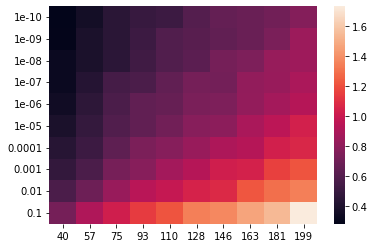

In [219]:
sns.heatmap(FOMres)

In [220]:
FOMres

,40,57,75,93,110,128,146,163,181,199
1.000000e-10,0.280548,0.355262,0.439839,0.492000,0.508319,0.600637,0.656231,0.674880,0.703089,0.767958
1.000000e-09,0.286714,0.386926,0.443775,0.511428,0.589553,0.614629,0.645892,0.673182,0.732662,0.843577
1.000000e-08,0.325645,0.386097,0.447508,0.528859,0.589232,0.622605,0.712922,0.742772,0.830428,0.852464
1.000000e-07,0.325407,0.423370,0.547250,0.569075,0.646965,0.713417,0.711793,0.809362,0.834819,0.898693
1.000000e-06,0.347854,0.452393,0.565814,0.647033,0.661267,0.730468,0.744300,0.818173,0.874283,0.932652
1.000000e-05,0.382781,0.483890,0.589463,0.645318,0.705691,0.777061,0.796108,0.888640,0.954591,1.036858
1.000000e-04,0.432704,0.508879,0.635814,0.738843,0.770945,0.834266,0.903834,0.928028,1.031418,1.064498
1.000000e-03,0.475817,0.569795,0.718300,0.779970,0.869858,0.932836,1.026333,1.044421,1.159880,1.211634
1.000000e-02,0.568794,0.685077,0.835800,0.941600,0.989216,1.051570,1.077368,1.221120,1.296057,1.345798
1.000000e-01,0.716380,0.910365,1.027054,1.139078,1.214400,1.342211,1.372875,1.470485,1.540926,1.733898


## Gene Ontology enrichment analysis of modules

In [40]:
import gseapy as gp

In [41]:
def runEnrichr(modules, desc, lib = "GO", date = "2021"):
    libNames = gp.get_library_name(organism='Human')
    gene_sets = [i for i in libNames if (lib in i) and (date in i)]
    # run enrichr
    # if you are only intrested in dataframe that enrichr returned, please set no_plot=True
    minAdjPval = []
    for i in range(modules.shape[1]):
        # list, dataframe, series inputs are supported
        genes = modules.loc[modules.iloc[:,i]==1,i].index.tolist()
        if len(genes)>1:
            enr = gp.enrichr(gene_list=genes,
                             gene_sets=gene_sets,
                             organism='Human', # don't forget to set organism to the one you desired! e.g. Yeast
                             description=desc,
                             outdir='./enrich/enrichr_mod'+str(i),
                             no_plot=True,
                             cutoff = 1
                            )
            minAdjPval.append(enr.results.loc[0,"Adjusted P-value"])
        else:
            minAdjPval.append(1)
        print("\r",round((i+1)/modules.shape[1]*100),"%",end="\r")
        
    return minAdjPval

In [42]:
RNAminAdjPval = runEnrichr(rnaModules, "GOenrichr_rna", lib = "GO", date = "2021")

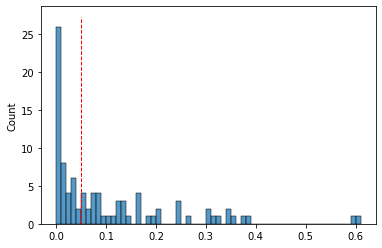

In [44]:
h = sns.histplot(RNAminAdjPval, binwidth=0.01)
plt.vlines(0.05, ymin=h.get_ylim()[0], ymax=h.get_ylim()[1], color = 'r', lw=1, ls="--")

In [47]:
pvalEnr = np.array(RNAminAdjPval)
sum(pvalEnr<0.05)/len(RNAminAdjPval)

0.4946236559139785

### Parameters Tunning (grid search)

In [251]:
nn_ = 50
n_ = np.linspace(40,rna.shape[1],nn_, dtype=int)
cutoff_ = [eval('1e-'+str(i)) for i in range(1,11)]

In [252]:
S_n_ = []
for i in range(len(n_)):
    S_n_.append(FastICA(n_components=n_[i], fun='logcosh').fit_transform(rna)) 

/home/ldap/ipellet/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:118: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn('FastICA did not converge. Consider increasing '
/home/ldap/ipellet/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:118: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn('FastICA did not converge. Consider increasing '


In [253]:
FDR_n = []
for i in range(len(n_)):
    delInd_,_ = delIndivSpe(S_n_[i], threshold=0.10)
    delKurt_,_ = delKurtosis(delInd_, ktsmin=3)
    FDR_ = runFDRanalysis(delKurt_)
    FDR_n.append(FDR_)

9 components are characterized by a single gene who explain more than 10.0 % of the variability of the pattern in the population.
After romving those components, 31 components remain.
14 components are characterized by a kurtosis < 3 and will be removed.
After romving those components, 17 components remain.
14 components are characterized by a single gene who explain more than 10.0 % of the variability of the pattern in the population.
After romving those components, 29 components remain.
16 components are characterized by a kurtosis < 3 and will be removed.
After romving those components, 13 components remain.
12 components are characterized by a single gene who explain more than 10.0 % of the variability of the pattern in the population.
After romving those components, 34 components remain.
17 components are characterized by a kurtosis < 3 and will be removed.
After romving those components, 17 components remain.
12 components are characterized by a single gene who explain more than 

In [254]:
mod_cutn = []
for i in range(len(n_)):
    mod_cut = []
    for j in range(len(cutoff_)):
        mod_ = pd.DataFrame((FDR_n[i]<cutoff_[j]).astype(int), index=rna.index)
        mod_cut.append(mod_)
    mod_cutn.append(mod_cut)

In [255]:
import pickle

In [257]:
fileParm = open("ICAparmTunning_rna.txt", "wb")
pickle.dump([n_, cutoff_, S_n_, FDR_n, mod_cutn], fileParm)
fileParm.close()

In [264]:
with open('ICAparmTunning_rna.txt', 'rb') as f:
    test = pickle.load(f)
    myVars = locals()
    newVars = ["n_0", "cutoff_", "S_n_", "FDR_n", "mod_cutn"]
    for i in range(len(test)):
        myVars[newVars[i]] = test[i]

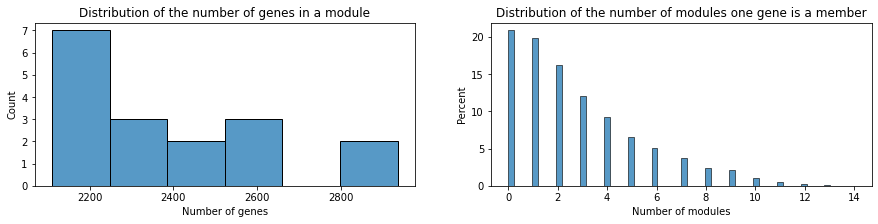

Number of genes in a module : 
- Mean : 2384.24 
- Median : 2270.0 
- Max : 2937 
- Min : 2109 

Number of modules per gene : 
- Mean : 2.74 
- Median : 2.0 
- Max : 14 
- Min : 0 

20.85 % of genes are not included in any module.
19.91 % of genes are included in only one module.
59.24 % of genes are included in more than one module.


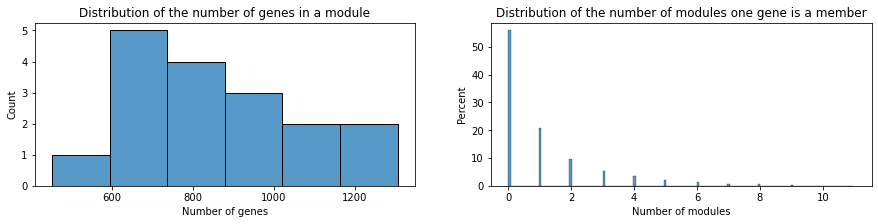

Number of genes in a module : 
- Mean : 866.29 
- Median : 815.0 
- Max : 1306 
- Min : 451 

Number of modules per gene : 
- Mean : 0.99 
- Median : 0.0 
- Max : 11 
- Min : 0 

55.90 % of genes are not included in any module.
20.70 % of genes are included in only one module.
23.40 % of genes are included in more than one module.


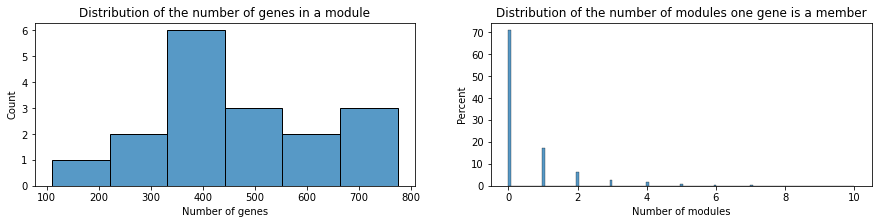

Number of genes in a module : 
- Mean : 463.24 
- Median : 428.0 
- Max : 775 
- Min : 110 

Number of modules per gene : 
- Mean : 0.53 
- Median : 0.0 
- Max : 10 
- Min : 0 

70.78 % of genes are not included in any module.
17.23 % of genes are included in only one module.
11.99 % of genes are included in more than one module.


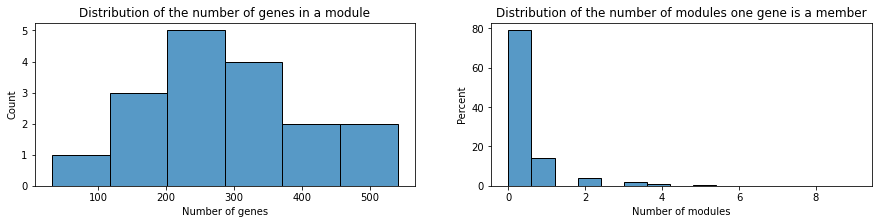

Number of genes in a module : 
- Mean : 290.53 
- Median : 285.0 
- Max : 541 
- Min : 32 

Number of modules per gene : 
- Mean : 0.33 
- Median : 0.0 
- Max : 9 
- Min : 0 

78.93 % of genes are not included in any module.
14.04 % of genes are included in only one module.
7.03 % of genes are included in more than one module.


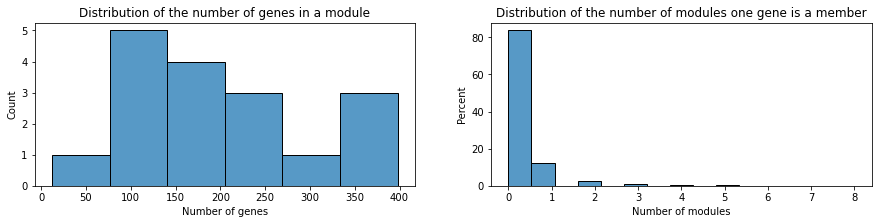

Number of genes in a module : 
- Mean : 203.59 
- Median : 182.0 
- Max : 398 
- Min : 12 

Number of modules per gene : 
- Mean : 0.23 
- Median : 0.0 
- Max : 8 
- Min : 0 

83.67 % of genes are not included in any module.
12.04 % of genes are included in only one module.
4.29 % of genes are included in more than one module.


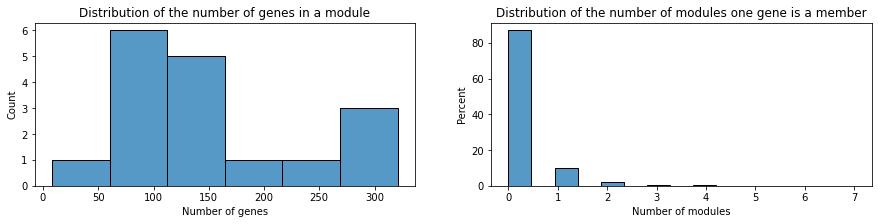

Number of genes in a module : 
- Mean : 152.00 
- Median : 128.0 
- Max : 321 
- Min : 8 

Number of modules per gene : 
- Mean : 0.17 
- Median : 0.0 
- Max : 7 
- Min : 0 

87.01 % of genes are not included in any module.
10.05 % of genes are included in only one module.
2.94 % of genes are included in more than one module.


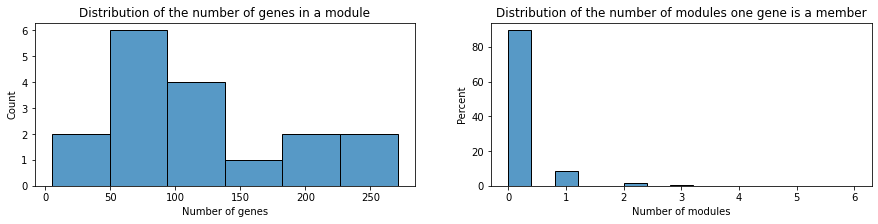

Number of genes in a module : 
- Mean : 117.94 
- Median : 95.0 
- Max : 271 
- Min : 5 

Number of modules per gene : 
- Mean : 0.14 
- Median : 0.0 
- Max : 6 
- Min : 0 

89.41 % of genes are not included in any module.
8.60 % of genes are included in only one module.
1.99 % of genes are included in more than one module.


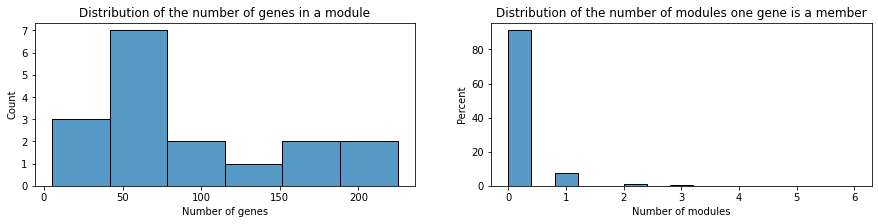

Number of genes in a module : 
- Mean : 94.82 
- Median : 72.0 
- Max : 225 
- Min : 5 

Number of modules per gene : 
- Mean : 0.11 
- Median : 0.0 
- Max : 6 
- Min : 0 

91.14 % of genes are not included in any module.
7.50 % of genes are included in only one module.
1.36 % of genes are included in more than one module.


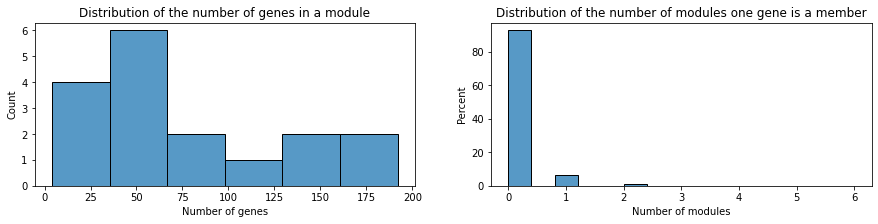

Number of genes in a module : 
- Mean : 77.12 
- Median : 53.0 
- Max : 192 
- Min : 4 

Number of modules per gene : 
- Mean : 0.09 
- Median : 0.0 
- Max : 6 
- Min : 0 

92.61 % of genes are not included in any module.
6.37 % of genes are included in only one module.
1.03 % of genes are included in more than one module.


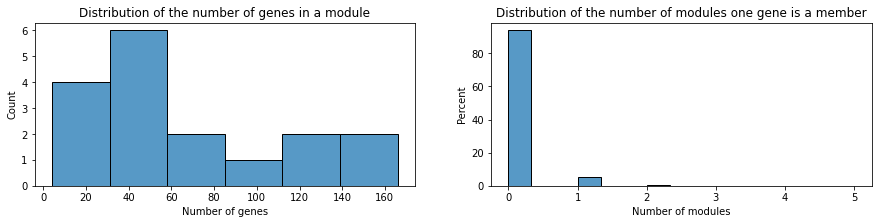

Number of genes in a module : 
- Mean : 63.71 
- Median : 40.0 
- Max : 166 
- Min : 4 

Number of modules per gene : 
- Mean : 0.07 
- Median : 0.0 
- Max : 5 
- Min : 0 

93.72 % of genes are not included in any module.
5.53 % of genes are included in only one module.
0.75 % of genes are included in more than one module.


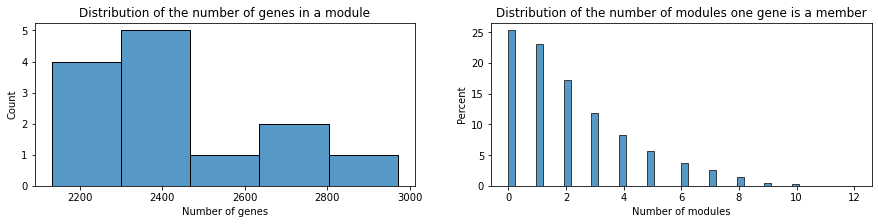

Number of genes in a module : 
- Mean : 2443.00 
- Median : 2436.0 
- Max : 2971 
- Min : 2132 

Number of modules per gene : 
- Mean : 2.14 
- Median : 2.0 
- Max : 12 
- Min : 0 

25.28 % of genes are not included in any module.
23.16 % of genes are included in only one module.
51.56 % of genes are included in more than one module.


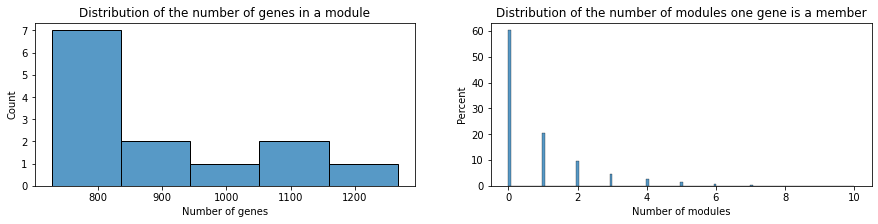

Number of genes in a module : 
- Mean : 893.31 
- Median : 812.0 
- Max : 1267 
- Min : 728 

Number of modules per gene : 
- Mean : 0.78 
- Median : 0.0 
- Max : 10 
- Min : 0 

60.17 % of genes are not included in any module.
20.51 % of genes are included in only one module.
19.31 % of genes are included in more than one module.


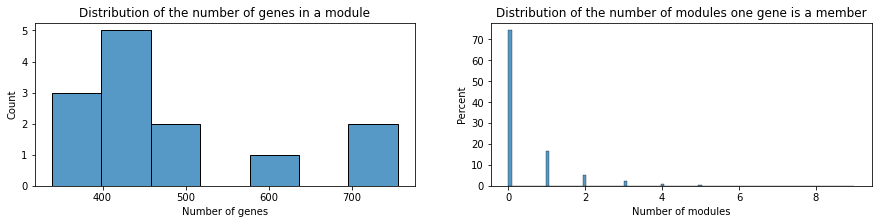

Number of genes in a module : 
- Mean : 471.23 
- Median : 424.0 
- Max : 755 
- Min : 339 

Number of modules per gene : 
- Mean : 0.41 
- Median : 0.0 
- Max : 9 
- Min : 0 

74.17 % of genes are not included in any module.
16.62 % of genes are included in only one module.
9.21 % of genes are included in more than one module.


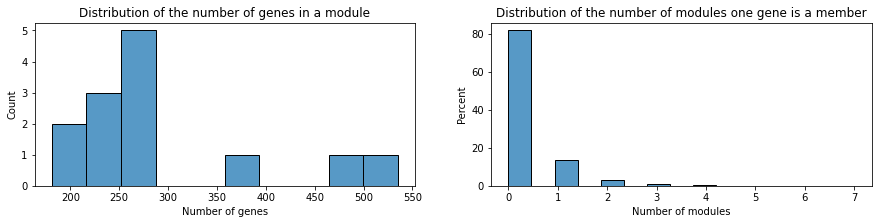

Number of genes in a module : 
- Mean : 293.15 
- Median : 264.0 
- Max : 535 
- Min : 181 

Number of modules per gene : 
- Mean : 0.26 
- Median : 0.0 
- Max : 7 
- Min : 0 

81.62 % of genes are not included in any module.
13.53 % of genes are included in only one module.
4.85 % of genes are included in more than one module.


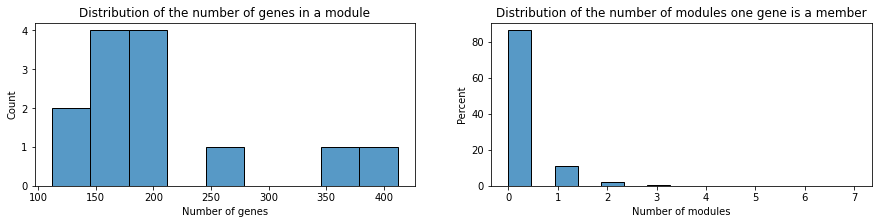

Number of genes in a module : 
- Mean : 205.69 
- Median : 182.0 
- Max : 412 
- Min : 112 

Number of modules per gene : 
- Mean : 0.18 
- Median : 0.0 
- Max : 7 
- Min : 0 

86.11 % of genes are not included in any module.
10.94 % of genes are included in only one module.
2.95 % of genes are included in more than one module.


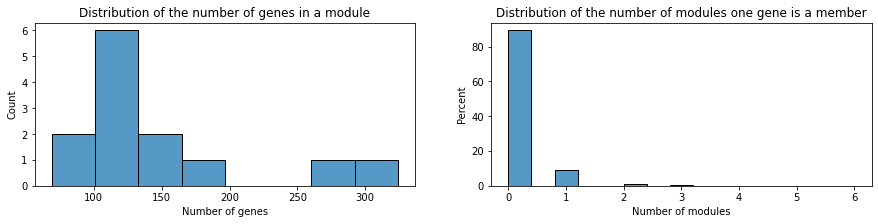

Number of genes in a module : 
- Mean : 149.31 
- Median : 120.0 
- Max : 324 
- Min : 69 

Number of modules per gene : 
- Mean : 0.13 
- Median : 0.0 
- Max : 6 
- Min : 0 

89.28 % of genes are not included in any module.
8.99 % of genes are included in only one module.
1.72 % of genes are included in more than one module.


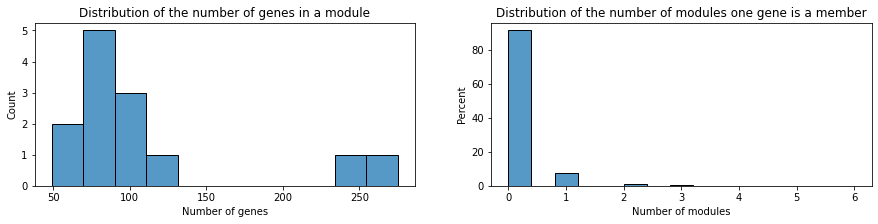

Number of genes in a module : 
- Mean : 114.15 
- Median : 89.0 
- Max : 275 
- Min : 49 

Number of modules per gene : 
- Mean : 0.10 
- Median : 0.0 
- Max : 6 
- Min : 0 

91.45 % of genes are not included in any module.
7.45 % of genes are included in only one module.
1.10 % of genes are included in more than one module.


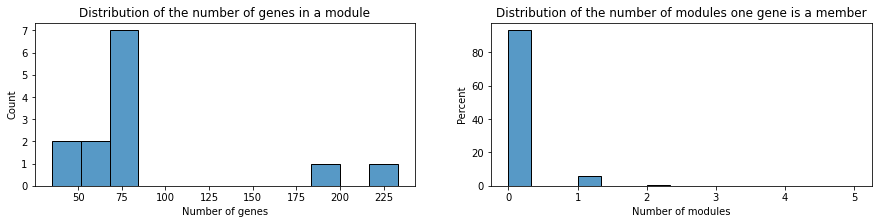

Number of genes in a module : 
- Mean : 89.54 
- Median : 73.0 
- Max : 233 
- Min : 35 

Number of modules per gene : 
- Mean : 0.08 
- Median : 0.0 
- Max : 5 
- Min : 0 

93.10 % of genes are not included in any module.
6.16 % of genes are included in only one module.
0.74 % of genes are included in more than one module.


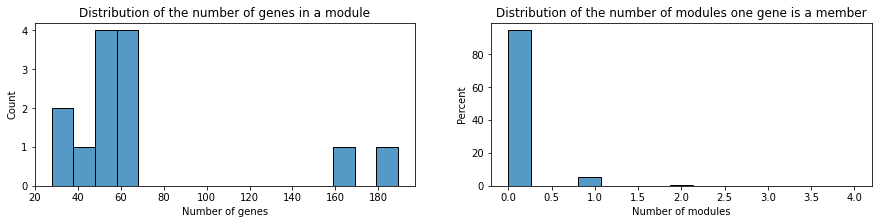

Number of genes in a module : 
- Mean : 70.62 
- Median : 58.0 
- Max : 189 
- Min : 28 

Number of modules per gene : 
- Mean : 0.06 
- Median : 0.0 
- Max : 4 
- Min : 0 

94.43 % of genes are not included in any module.
5.06 % of genes are included in only one module.
0.51 % of genes are included in more than one module.


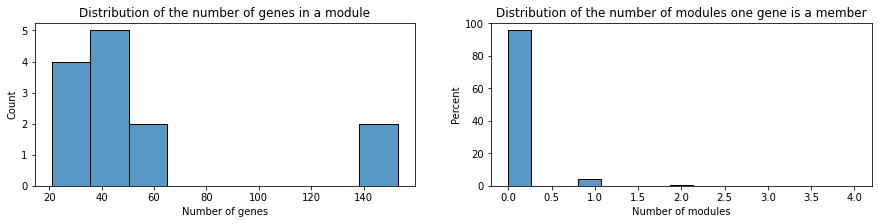

Number of genes in a module : 
- Mean : 56.77 
- Median : 47.0 
- Max : 153 
- Min : 21 

Number of modules per gene : 
- Mean : 0.05 
- Median : 0.0 
- Max : 4 
- Min : 0 

95.48 % of genes are not included in any module.
4.15 % of genes are included in only one module.
0.37 % of genes are included in more than one module.


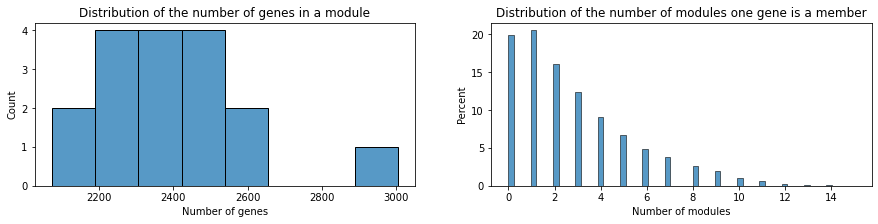

Number of genes in a module : 
- Mean : 2405.41 
- Median : 2408.0 
- Max : 3005 
- Min : 2072 

Number of modules per gene : 
- Mean : 2.76 
- Median : 2.0 
- Max : 15 
- Min : 0 

19.96 % of genes are not included in any module.
20.51 % of genes are included in only one module.
59.52 % of genes are included in more than one module.


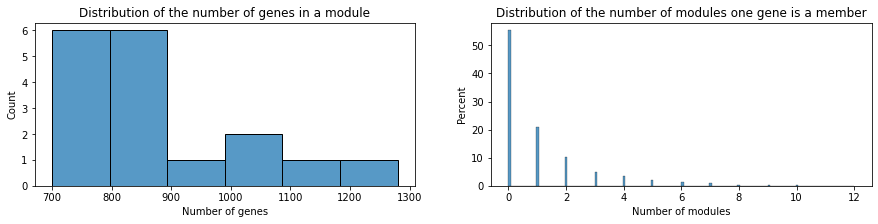

Number of genes in a module : 
- Mean : 882.65 
- Median : 835.0 
- Max : 1280 
- Min : 700 

Number of modules per gene : 
- Mean : 1.01 
- Median : 0.0 
- Max : 12 
- Min : 0 

55.29 % of genes are not included in any module.
20.97 % of genes are included in only one module.
23.74 % of genes are included in more than one module.


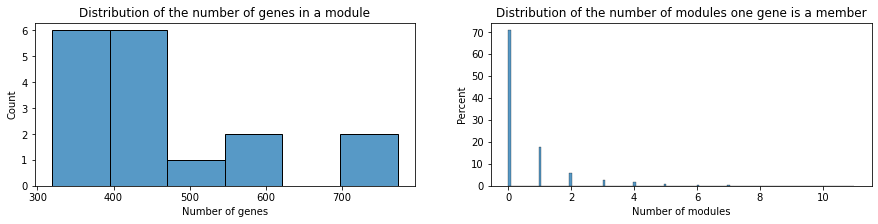

Number of genes in a module : 
- Mean : 463.24 
- Median : 421.0 
- Max : 773 
- Min : 319 

Number of modules per gene : 
- Mean : 0.53 
- Median : 0.0 
- Max : 11 
- Min : 0 

70.71 % of genes are not included in any module.
17.57 % of genes are included in only one module.
11.72 % of genes are included in more than one module.


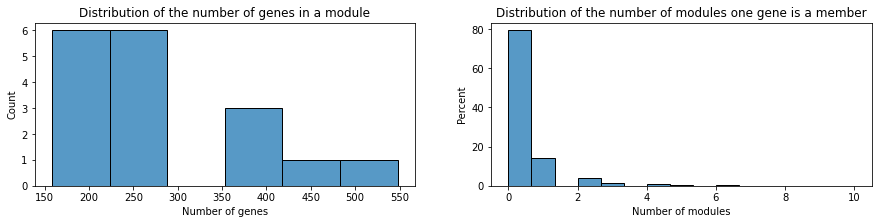

Number of genes in a module : 
- Mean : 285.06 
- Median : 246.0 
- Max : 548 
- Min : 158 

Number of modules per gene : 
- Mean : 0.33 
- Median : 0.0 
- Max : 10 
- Min : 0 

79.28 % of genes are not included in any module.
14.12 % of genes are included in only one module.
6.60 % of genes are included in more than one module.


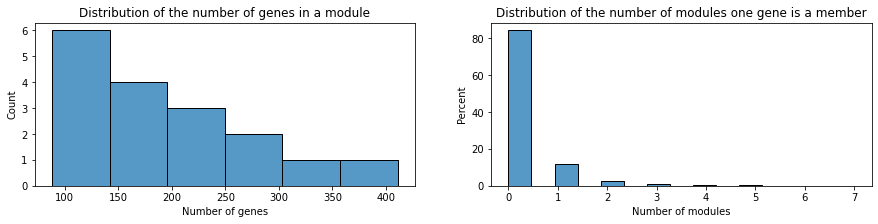

Number of genes in a module : 
- Mean : 195.82 
- Median : 166.0 
- Max : 411 
- Min : 88 

Number of modules per gene : 
- Mean : 0.22 
- Median : 0.0 
- Max : 7 
- Min : 0 

84.25 % of genes are not included in any module.
11.79 % of genes are included in only one module.
3.96 % of genes are included in more than one module.


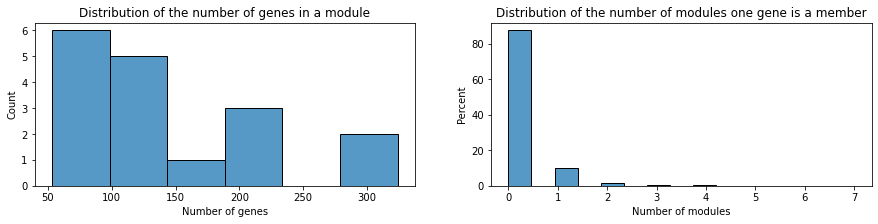

Number of genes in a module : 
- Mean : 143.47 
- Median : 124.0 
- Max : 324 
- Min : 53 

Number of modules per gene : 
- Mean : 0.16 
- Median : 0.0 
- Max : 7 
- Min : 0 

87.55 % of genes are not included in any module.
9.87 % of genes are included in only one module.
2.58 % of genes are included in more than one module.


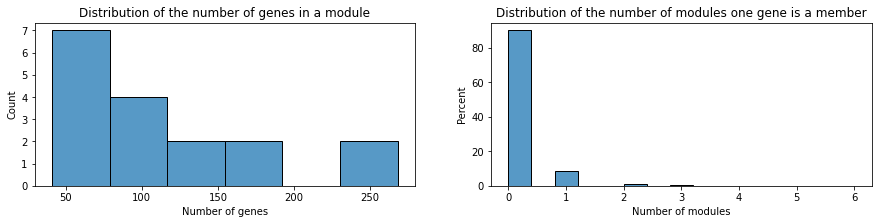

Number of genes in a module : 
- Mean : 110.88 
- Median : 101.0 
- Max : 268 
- Min : 41 

Number of modules per gene : 
- Mean : 0.13 
- Median : 0.0 
- Max : 6 
- Min : 0 

89.88 % of genes are not included in any module.
8.37 % of genes are included in only one module.
1.74 % of genes are included in more than one module.


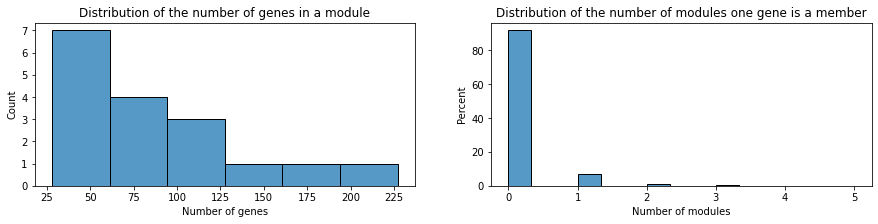

Number of genes in a module : 
- Mean : 87.35 
- Median : 79.0 
- Max : 227 
- Min : 28 

Number of modules per gene : 
- Mean : 0.10 
- Median : 0.0 
- Max : 5 
- Min : 0 

91.71 % of genes are not included in any module.
7.02 % of genes are included in only one module.
1.27 % of genes are included in more than one module.


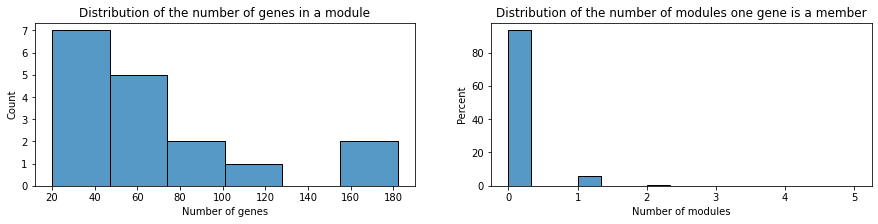

Number of genes in a module : 
- Mean : 69.00 
- Median : 58.0 
- Max : 182 
- Min : 20 

Number of modules per gene : 
- Mean : 0.08 
- Median : 0.0 
- Max : 5 
- Min : 0 

93.22 % of genes are not included in any module.
5.94 % of genes are included in only one module.
0.84 % of genes are included in more than one module.


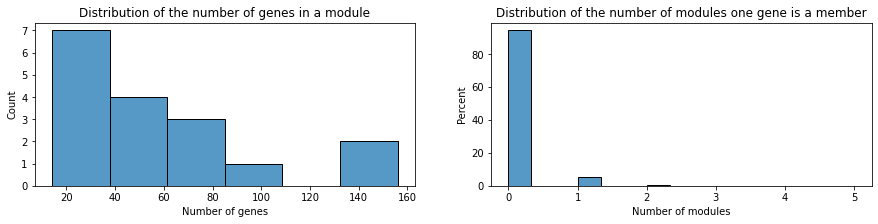

Number of genes in a module : 
- Mean : 56.41 
- Median : 45.0 
- Max : 156 
- Min : 14 

Number of modules per gene : 
- Mean : 0.06 
- Median : 0.0 
- Max : 5 
- Min : 0 

94.31 % of genes are not included in any module.
5.04 % of genes are included in only one module.
0.64 % of genes are included in more than one module.


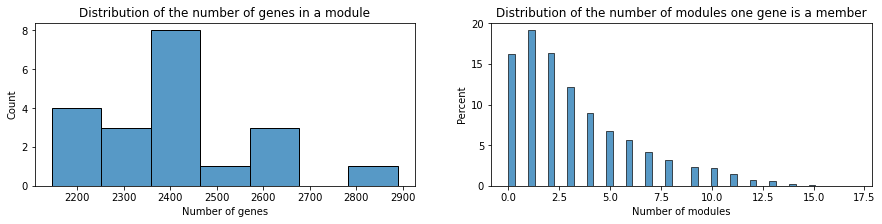

Number of genes in a module : 
- Mean : 2406.75 
- Median : 2383.5 
- Max : 2889 
- Min : 2146 

Number of modules per gene : 
- Mean : 3.25 
- Median : 2.0 
- Max : 17 
- Min : 0 

16.19 % of genes are not included in any module.
19.12 % of genes are included in only one module.
64.69 % of genes are included in more than one module.


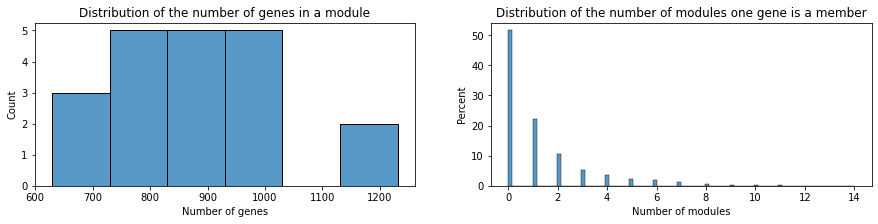

Number of genes in a module : 
- Mean : 877.10 
- Median : 885.5 
- Max : 1231 
- Min : 629 

Number of modules per gene : 
- Mean : 1.18 
- Median : 0.0 
- Max : 14 
- Min : 0 

51.60 % of genes are not included in any module.
22.05 % of genes are included in only one module.
26.36 % of genes are included in more than one module.


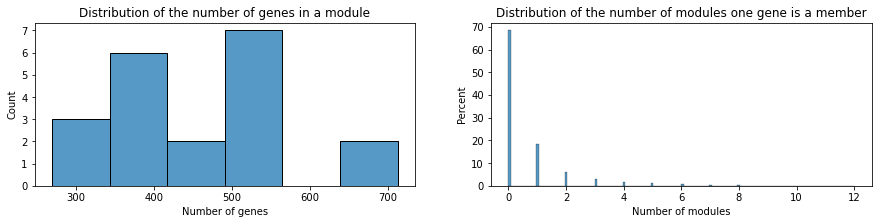

Number of genes in a module : 
- Mean : 458.45 
- Median : 462.0 
- Max : 713 
- Min : 269 

Number of modules per gene : 
- Mean : 0.62 
- Median : 0.0 
- Max : 12 
- Min : 0 

68.42 % of genes are not included in any module.
18.26 % of genes are included in only one module.
13.32 % of genes are included in more than one module.


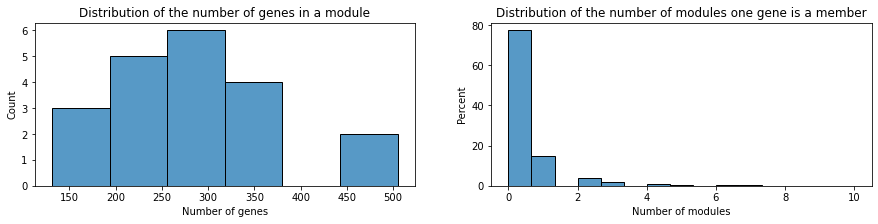

Number of genes in a module : 
- Mean : 283.90 
- Median : 284.0 
- Max : 505 
- Min : 131 

Number of modules per gene : 
- Mean : 0.38 
- Median : 0.0 
- Max : 10 
- Min : 0 

77.31 % of genes are not included in any module.
14.84 % of genes are included in only one module.
7.85 % of genes are included in more than one module.


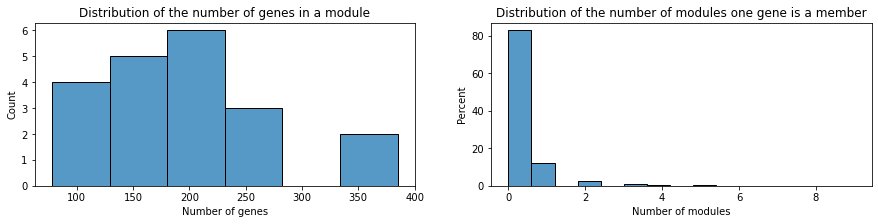

Number of genes in a module : 
- Mean : 193.85 
- Median : 187.0 
- Max : 385 
- Min : 78 

Number of modules per gene : 
- Mean : 0.26 
- Median : 0.0 
- Max : 9 
- Min : 0 

82.74 % of genes are not included in any module.
12.34 % of genes are included in only one module.
4.92 % of genes are included in more than one module.


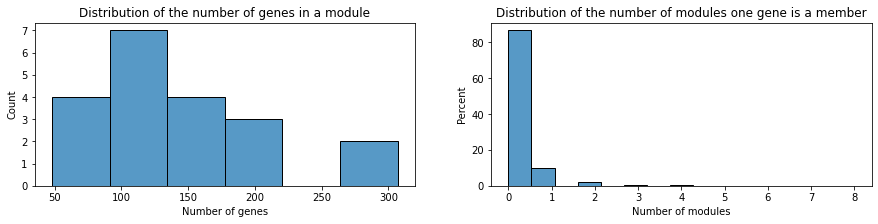

Number of genes in a module : 
- Mean : 139.85 
- Median : 117.5 
- Max : 307 
- Min : 48 

Number of modules per gene : 
- Mean : 0.19 
- Median : 0.0 
- Max : 8 
- Min : 0 

86.58 % of genes are not included in any module.
10.18 % of genes are included in only one module.
3.24 % of genes are included in more than one module.


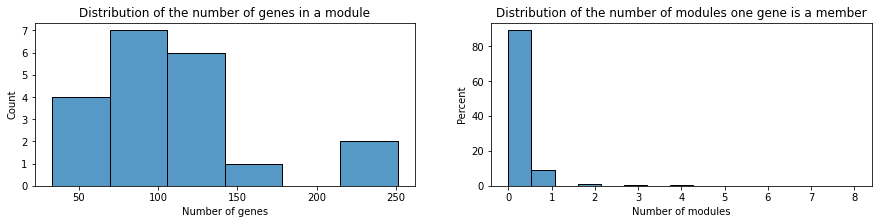

Number of genes in a module : 
- Mean : 107.95 
- Median : 87.5 
- Max : 251 
- Min : 33 

Number of modules per gene : 
- Mean : 0.15 
- Median : 0.0 
- Max : 8 
- Min : 0 

89.03 % of genes are not included in any module.
8.81 % of genes are included in only one module.
2.17 % of genes are included in more than one module.


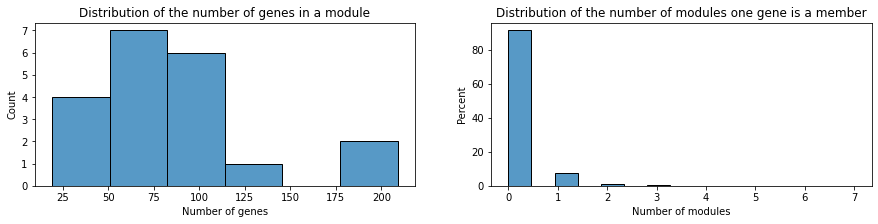

Number of genes in a module : 
- Mean : 82.95 
- Median : 72.0 
- Max : 209 
- Min : 19 

Number of modules per gene : 
- Mean : 0.11 
- Median : 0.0 
- Max : 7 
- Min : 0 

91.21 % of genes are not included in any module.
7.25 % of genes are included in only one module.
1.53 % of genes are included in more than one module.


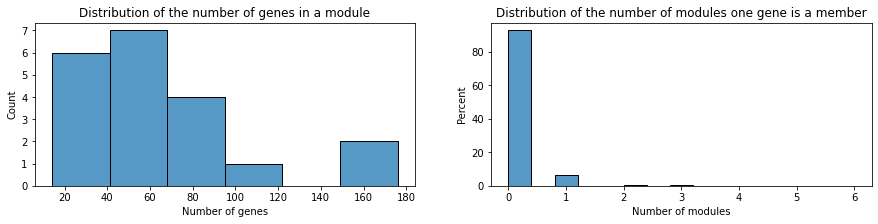

Number of genes in a module : 
- Mean : 66.40 
- Median : 62.0 
- Max : 176 
- Min : 14 

Number of modules per gene : 
- Mean : 0.09 
- Median : 0.0 
- Max : 6 
- Min : 0 

92.73 % of genes are not included in any module.
6.16 % of genes are included in only one module.
1.11 % of genes are included in more than one module.


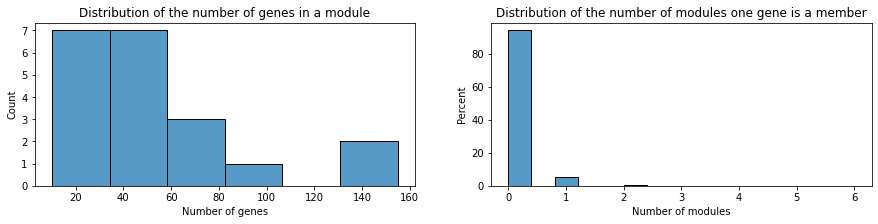

Number of genes in a module : 
- Mean : 53.70 
- Median : 47.0 
- Max : 155 
- Min : 10 

Number of modules per gene : 
- Mean : 0.07 
- Median : 0.0 
- Max : 6 
- Min : 0 

93.92 % of genes are not included in any module.
5.25 % of genes are included in only one module.
0.82 % of genes are included in more than one module.


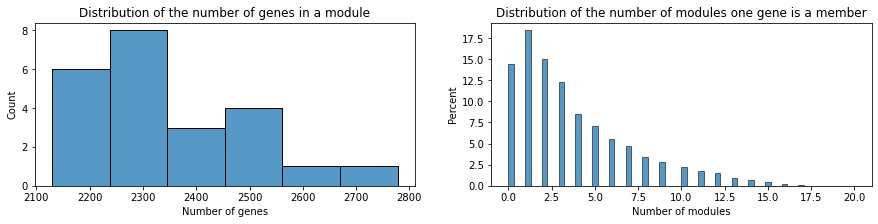

Number of genes in a module : 
- Mean : 2347.43 
- Median : 2326.0 
- Max : 2778 
- Min : 2129 

Number of modules per gene : 
- Mean : 3.65 
- Median : 3.0 
- Max : 20 
- Min : 0 

14.46 % of genes are not included in any module.
18.40 % of genes are included in only one module.
67.13 % of genes are included in more than one module.


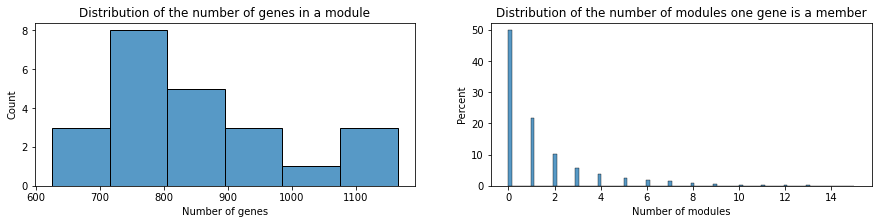

Number of genes in a module : 
- Mean : 855.65 
- Median : 806.0 
- Max : 1166 
- Min : 625 

Number of modules per gene : 
- Mean : 1.33 
- Median : 1.0 
- Max : 15 
- Min : 0 

49.84 % of genes are not included in any module.
21.88 % of genes are included in only one module.
28.28 % of genes are included in more than one module.


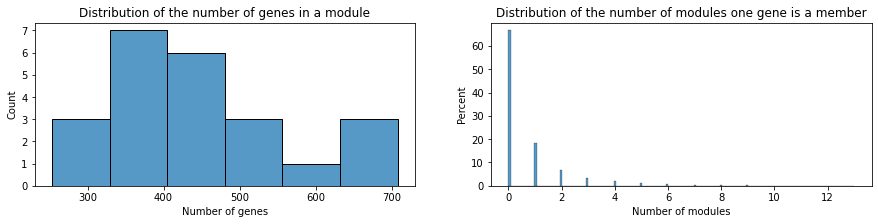

Number of genes in a module : 
- Mean : 450.74 
- Median : 431.0 
- Max : 708 
- Min : 253 

Number of modules per gene : 
- Mean : 0.70 
- Median : 0.0 
- Max : 13 
- Min : 0 

66.61 % of genes are not included in any module.
18.32 % of genes are included in only one module.
15.07 % of genes are included in more than one module.


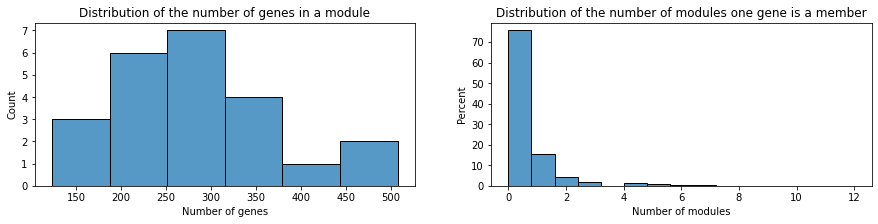

Number of genes in a module : 
- Mean : 280.61 
- Median : 262.0 
- Max : 508 
- Min : 123 

Number of modules per gene : 
- Mean : 0.44 
- Median : 0.0 
- Max : 12 
- Min : 0 

75.60 % of genes are not included in any module.
15.57 % of genes are included in only one module.
8.83 % of genes are included in more than one module.


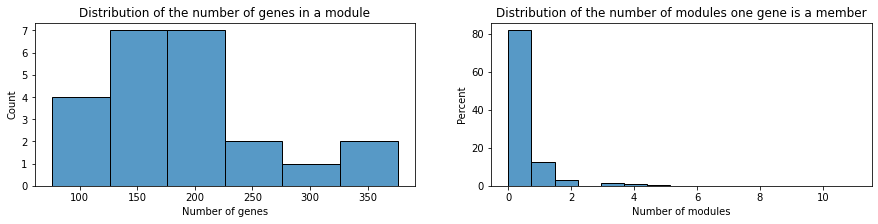

Number of genes in a module : 
- Mean : 190.96 
- Median : 180.0 
- Max : 376 
- Min : 76 

Number of modules per gene : 
- Mean : 0.30 
- Median : 0.0 
- Max : 11 
- Min : 0 

81.60 % of genes are not included in any module.
12.74 % of genes are included in only one module.
5.67 % of genes are included in more than one module.


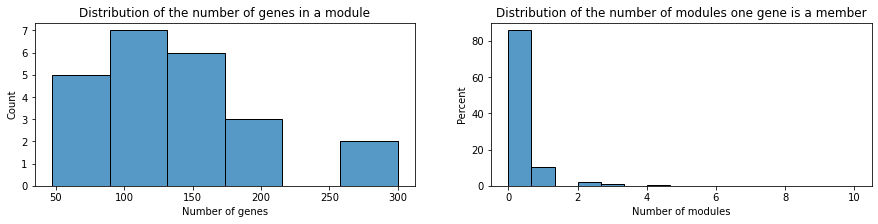

Number of genes in a module : 
- Mean : 136.48 
- Median : 131.0 
- Max : 300 
- Min : 47 

Number of modules per gene : 
- Mean : 0.21 
- Median : 0.0 
- Max : 10 
- Min : 0 

85.77 % of genes are not included in any module.
10.38 % of genes are included in only one module.
3.85 % of genes are included in more than one module.


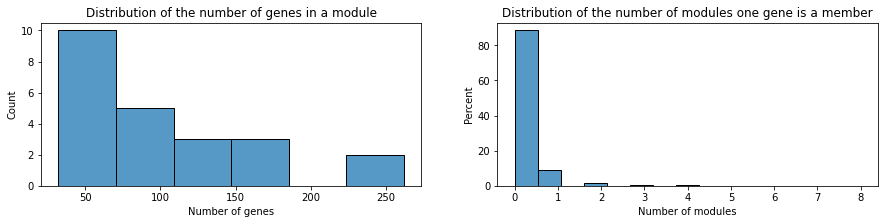

Number of genes in a module : 
- Mean : 101.74 
- Median : 90.0 
- Max : 262 
- Min : 32 

Number of modules per gene : 
- Mean : 0.16 
- Median : 0.0 
- Max : 8 
- Min : 0 

88.44 % of genes are not included in any module.
9.16 % of genes are included in only one module.
2.40 % of genes are included in more than one module.


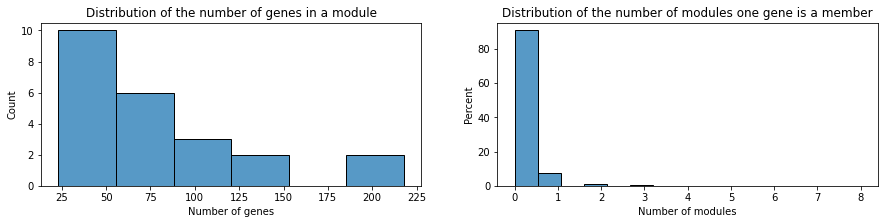

Number of genes in a module : 
- Mean : 78.87 
- Median : 73.0 
- Max : 218 
- Min : 23 

Number of modules per gene : 
- Mean : 0.12 
- Median : 0.0 
- Max : 8 
- Min : 0 

90.64 % of genes are not included in any module.
7.63 % of genes are included in only one module.
1.73 % of genes are included in more than one module.


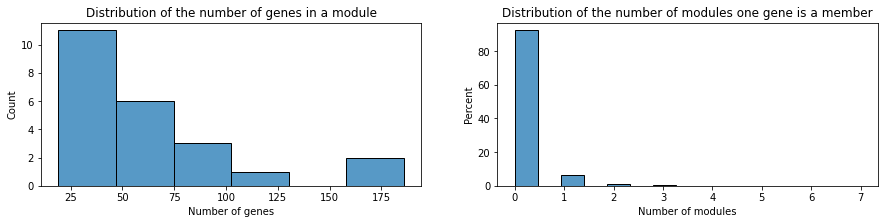

Number of genes in a module : 
- Mean : 62.35 
- Median : 60.0 
- Max : 186 
- Min : 19 

Number of modules per gene : 
- Mean : 0.10 
- Median : 0.0 
- Max : 7 
- Min : 0 

92.27 % of genes are not included in any module.
6.49 % of genes are included in only one module.
1.24 % of genes are included in more than one module.


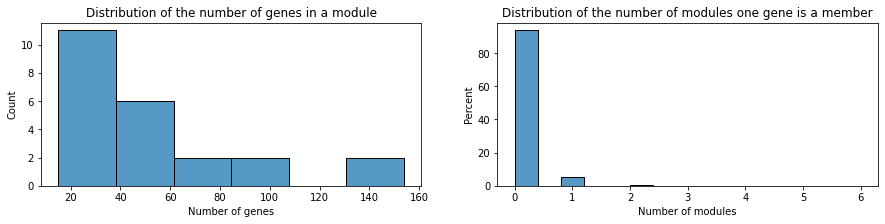

Number of genes in a module : 
- Mean : 51.17 
- Median : 47.0 
- Max : 154 
- Min : 15 

Number of modules per gene : 
- Mean : 0.08 
- Median : 0.0 
- Max : 6 
- Min : 0 

93.58 % of genes are not included in any module.
5.41 % of genes are included in only one module.
1.01 % of genes are included in more than one module.


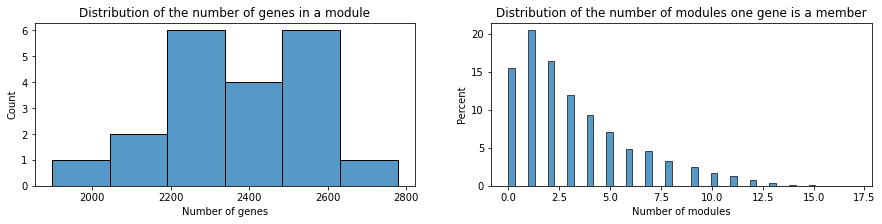

Number of genes in a module : 
- Mean : 2364.25 
- Median : 2348.5 
- Max : 2778 
- Min : 1898 

Number of modules per gene : 
- Mean : 3.19 
- Median : 2.0 
- Max : 17 
- Min : 0 

15.42 % of genes are not included in any module.
20.41 % of genes are included in only one module.
64.16 % of genes are included in more than one module.


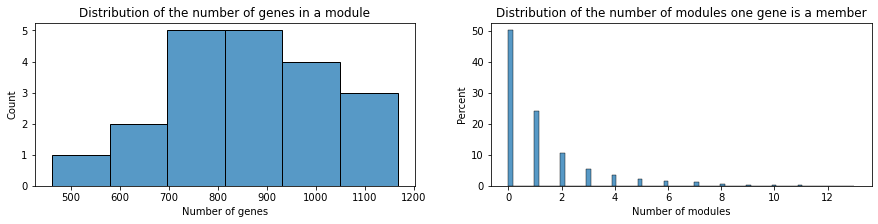

Number of genes in a module : 
- Mean : 861.85 
- Median : 853.0 
- Max : 1167 
- Min : 462 

Number of modules per gene : 
- Mean : 1.16 
- Median : 0.0 
- Max : 13 
- Min : 0 

50.08 % of genes are not included in any module.
24.24 % of genes are included in only one module.
25.69 % of genes are included in more than one module.


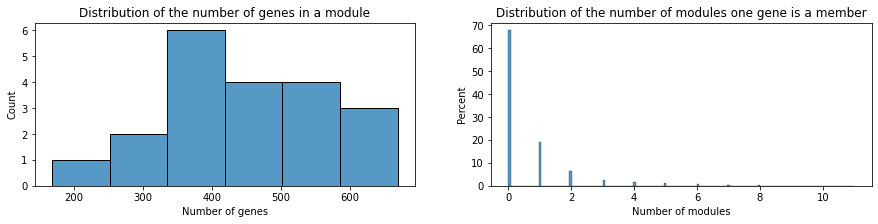

Number of genes in a module : 
- Mean : 446.95 
- Median : 447.5 
- Max : 669 
- Min : 168 

Number of modules per gene : 
- Mean : 0.60 
- Median : 0.0 
- Max : 11 
- Min : 0 

67.78 % of genes are not included in any module.
19.22 % of genes are included in only one module.
12.99 % of genes are included in more than one module.


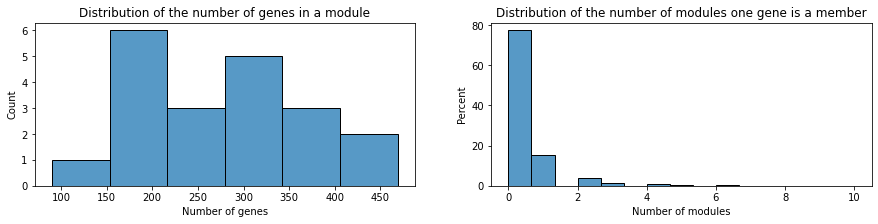

Number of genes in a module : 
- Mean : 276.80 
- Median : 277.0 
- Max : 469 
- Min : 90 

Number of modules per gene : 
- Mean : 0.37 
- Median : 0.0 
- Max : 10 
- Min : 0 

77.33 % of genes are not included in any module.
15.14 % of genes are included in only one module.
7.53 % of genes are included in more than one module.


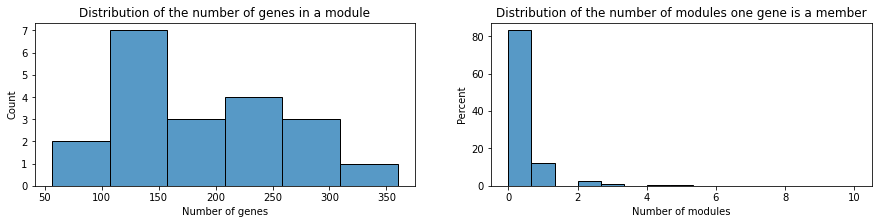

Number of genes in a module : 
- Mean : 186.70 
- Median : 189.0 
- Max : 360 
- Min : 56 

Number of modules per gene : 
- Mean : 0.25 
- Median : 0.0 
- Max : 10 
- Min : 0 

83.01 % of genes are not included in any module.
12.34 % of genes are included in only one module.
4.65 % of genes are included in more than one module.


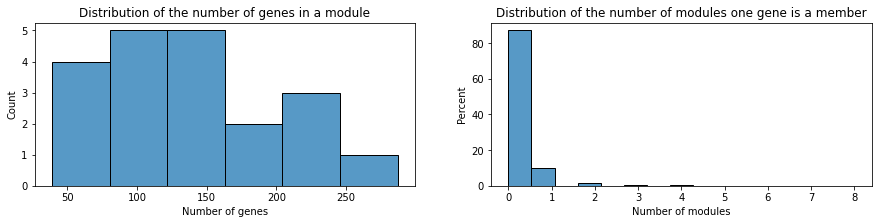

Number of genes in a module : 
- Mean : 134.35 
- Median : 127.0 
- Max : 287 
- Min : 39 

Number of modules per gene : 
- Mean : 0.18 
- Median : 0.0 
- Max : 8 
- Min : 0 

87.08 % of genes are not included in any module.
9.87 % of genes are included in only one module.
3.06 % of genes are included in more than one module.


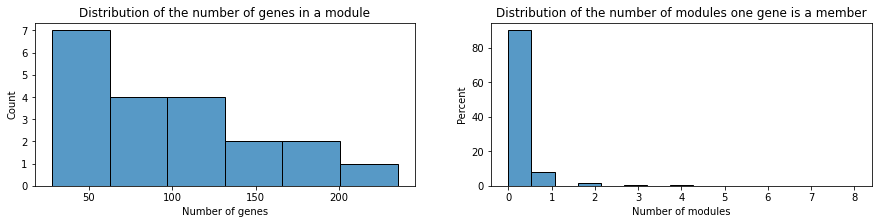

Number of genes in a module : 
- Mean : 100.30 
- Median : 84.0 
- Max : 235 
- Min : 28 

Number of modules per gene : 
- Mean : 0.14 
- Median : 0.0 
- Max : 8 
- Min : 0 

89.90 % of genes are not included in any module.
7.91 % of genes are included in only one module.
2.19 % of genes are included in more than one module.


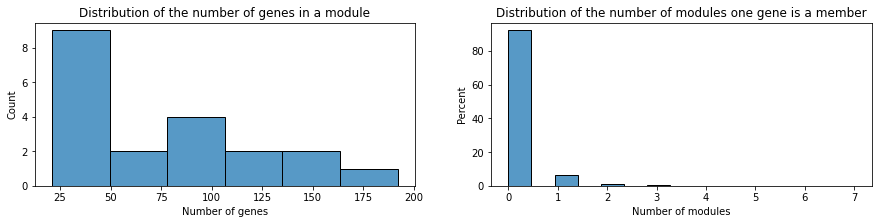

Number of genes in a module : 
- Mean : 76.30 
- Median : 58.5 
- Max : 192 
- Min : 21 

Number of modules per gene : 
- Mean : 0.10 
- Median : 0.0 
- Max : 7 
- Min : 0 

92.03 % of genes are not included in any module.
6.44 % of genes are included in only one module.
1.54 % of genes are included in more than one module.


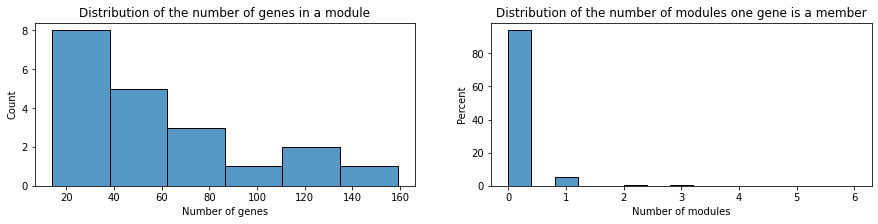

Number of genes in a module : 
- Mean : 58.65 
- Median : 41.0 
- Max : 159 
- Min : 14 

Number of modules per gene : 
- Mean : 0.08 
- Median : 0.0 
- Max : 6 
- Min : 0 

93.73 % of genes are not included in any module.
5.15 % of genes are included in only one module.
1.12 % of genes are included in more than one module.


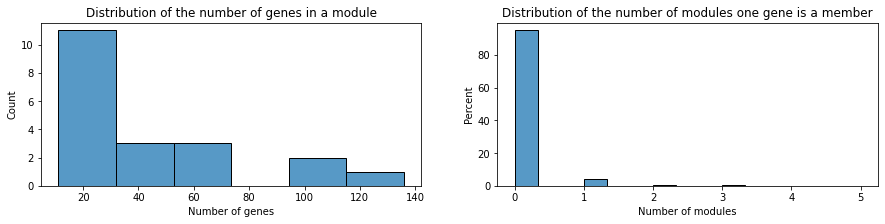

Number of genes in a module : 
- Mean : 46.00 
- Median : 30.5 
- Max : 136 
- Min : 11 

Number of modules per gene : 
- Mean : 0.06 
- Median : 0.0 
- Max : 5 
- Min : 0 

94.92 % of genes are not included in any module.
4.31 % of genes are included in only one module.
0.76 % of genes are included in more than one module.


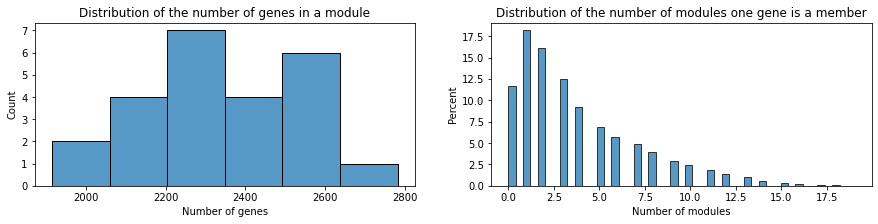

Number of genes in a module : 
- Mean : 2344.50 
- Median : 2316.5 
- Max : 2783 
- Min : 1914 

Number of modules per gene : 
- Mean : 3.80 
- Median : 3.0 
- Max : 19 
- Min : 0 

11.69 % of genes are not included in any module.
18.17 % of genes are included in only one module.
70.14 % of genes are included in more than one module.


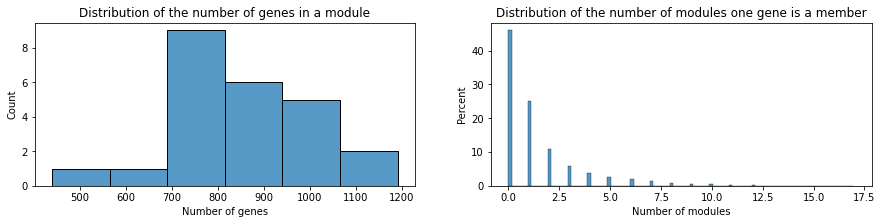

Number of genes in a module : 
- Mean : 846.83 
- Median : 842.5 
- Max : 1191 
- Min : 440 

Number of modules per gene : 
- Mean : 1.37 
- Median : 1.0 
- Max : 17 
- Min : 0 

45.95 % of genes are not included in any module.
25.13 % of genes are included in only one module.
28.92 % of genes are included in more than one module.


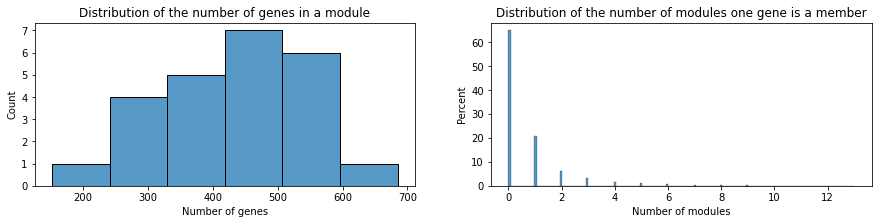

Number of genes in a module : 
- Mean : 437.50 
- Median : 433.5 
- Max : 685 
- Min : 152 

Number of modules per gene : 
- Mean : 0.71 
- Median : 0.0 
- Max : 13 
- Min : 0 

64.89 % of genes are not included in any module.
20.61 % of genes are included in only one module.
14.50 % of genes are included in more than one module.


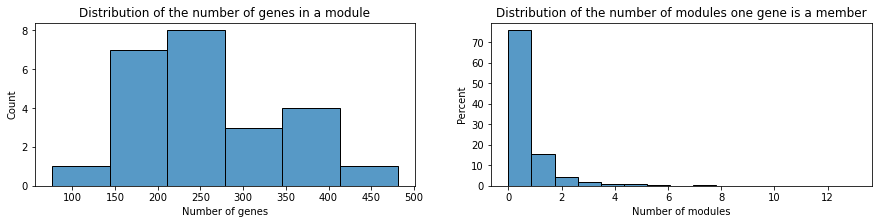

Number of genes in a module : 
- Mean : 263.25 
- Median : 262.0 
- Max : 481 
- Min : 76 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 13 
- Min : 0 

75.81 % of genes are not included in any module.
15.69 % of genes are included in only one module.
8.50 % of genes are included in more than one module.


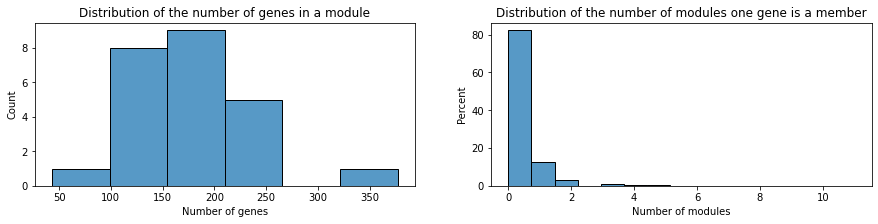

Number of genes in a module : 
- Mean : 175.92 
- Median : 173.0 
- Max : 377 
- Min : 43 

Number of modules per gene : 
- Mean : 0.29 
- Median : 0.0 
- Max : 11 
- Min : 0 

82.13 % of genes are not included in any module.
12.51 % of genes are included in only one module.
5.37 % of genes are included in more than one module.


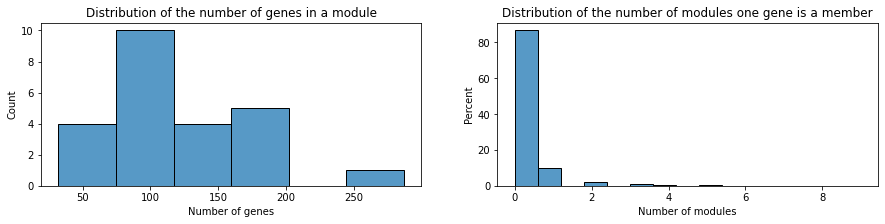

Number of genes in a module : 
- Mean : 122.88 
- Median : 112.0 
- Max : 287 
- Min : 32 

Number of modules per gene : 
- Mean : 0.20 
- Median : 0.0 
- Max : 9 
- Min : 0 

86.61 % of genes are not included in any module.
9.85 % of genes are included in only one module.
3.55 % of genes are included in more than one module.


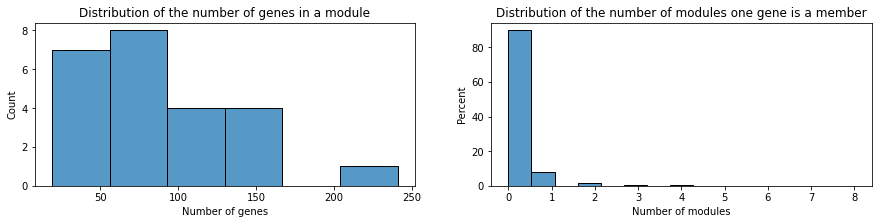

Number of genes in a module : 
- Mean : 89.62 
- Median : 79.5 
- Max : 241 
- Min : 19 

Number of modules per gene : 
- Mean : 0.15 
- Median : 0.0 
- Max : 8 
- Min : 0 

89.68 % of genes are not included in any module.
7.93 % of genes are included in only one module.
2.39 % of genes are included in more than one module.


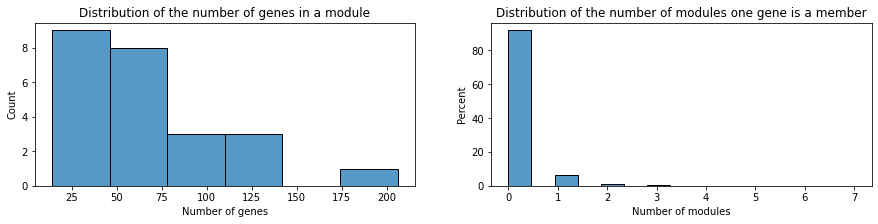

Number of genes in a module : 
- Mean : 67.54 
- Median : 57.0 
- Max : 206 
- Min : 14 

Number of modules per gene : 
- Mean : 0.11 
- Median : 0.0 
- Max : 7 
- Min : 0 

91.72 % of genes are not included in any module.
6.67 % of genes are included in only one module.
1.61 % of genes are included in more than one module.


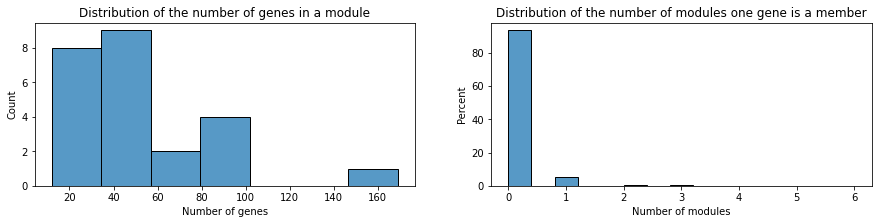

Number of genes in a module : 
- Mean : 52.83 
- Median : 43.0 
- Max : 169 
- Min : 12 

Number of modules per gene : 
- Mean : 0.09 
- Median : 0.0 
- Max : 6 
- Min : 0 

93.33 % of genes are not included in any module.
5.51 % of genes are included in only one module.
1.16 % of genes are included in more than one module.


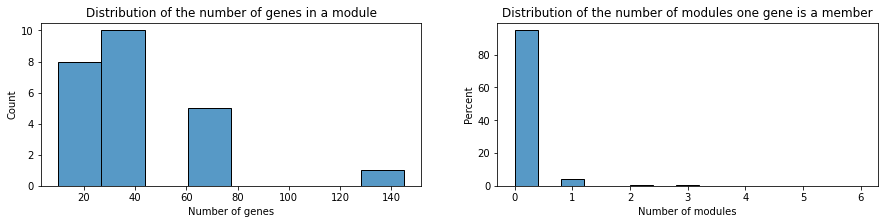

Number of genes in a module : 
- Mean : 40.88 
- Median : 32.0 
- Max : 145 
- Min : 10 

Number of modules per gene : 
- Mean : 0.07 
- Median : 0.0 
- Max : 6 
- Min : 0 

94.74 % of genes are not included in any module.
4.41 % of genes are included in only one module.
0.85 % of genes are included in more than one module.


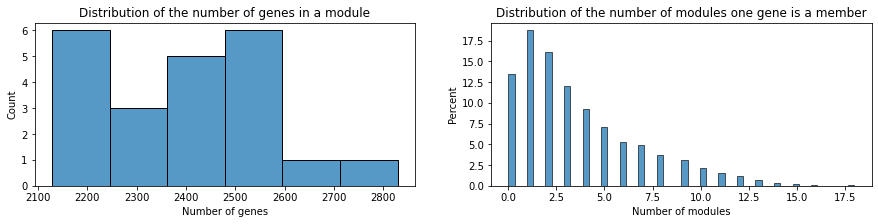

Number of genes in a module : 
- Mean : 2396.27 
- Median : 2411.5 
- Max : 2829 
- Min : 2128 

Number of modules per gene : 
- Mean : 3.56 
- Median : 3.0 
- Max : 18 
- Min : 0 

13.46 % of genes are not included in any module.
18.72 % of genes are included in only one module.
67.82 % of genes are included in more than one module.


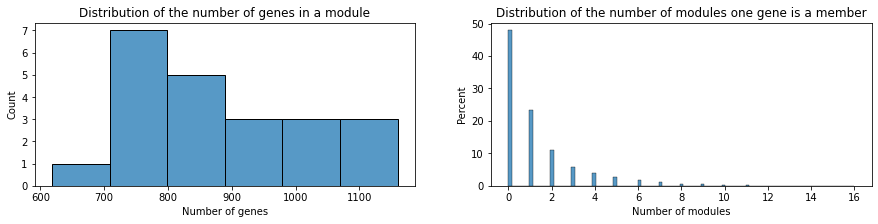

Number of genes in a module : 
- Mean : 880.86 
- Median : 835.5 
- Max : 1160 
- Min : 618 

Number of modules per gene : 
- Mean : 1.31 
- Median : 1.0 
- Max : 16 
- Min : 0 

47.85 % of genes are not included in any module.
23.49 % of genes are included in only one module.
28.67 % of genes are included in more than one module.


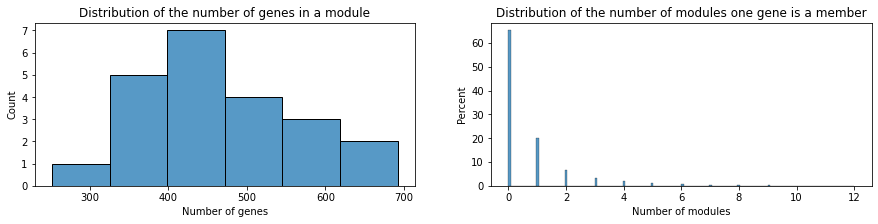

Number of genes in a module : 
- Mean : 459.91 
- Median : 433.0 
- Max : 692 
- Min : 252 

Number of modules per gene : 
- Mean : 0.68 
- Median : 0.0 
- Max : 12 
- Min : 0 

65.20 % of genes are not included in any module.
20.07 % of genes are included in only one module.
14.73 % of genes are included in more than one module.


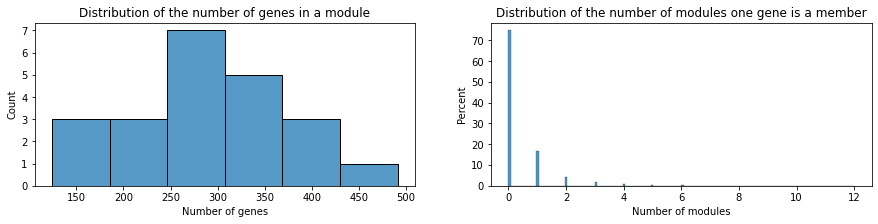

Number of genes in a module : 
- Mean : 285.68 
- Median : 290.0 
- Max : 491 
- Min : 124 

Number of modules per gene : 
- Mean : 0.42 
- Median : 0.0 
- Max : 12 
- Min : 0 

74.70 % of genes are not included in any module.
16.83 % of genes are included in only one module.
8.47 % of genes are included in more than one module.


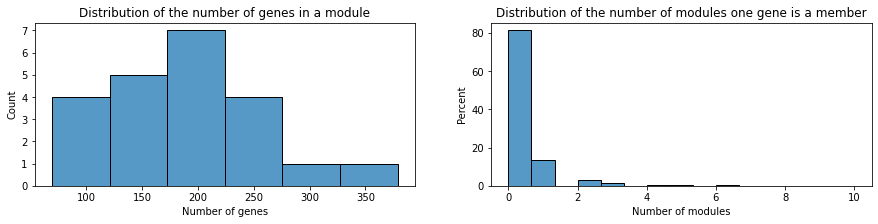

Number of genes in a module : 
- Mean : 190.95 
- Median : 199.0 
- Max : 379 
- Min : 69 

Number of modules per gene : 
- Mean : 0.28 
- Median : 0.0 
- Max : 10 
- Min : 0 

81.21 % of genes are not included in any module.
13.49 % of genes are included in only one module.
5.30 % of genes are included in more than one module.


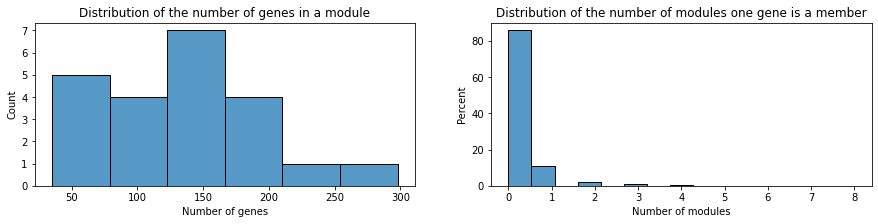

Number of genes in a module : 
- Mean : 135.32 
- Median : 136.0 
- Max : 298 
- Min : 35 

Number of modules per gene : 
- Mean : 0.20 
- Median : 0.0 
- Max : 8 
- Min : 0 

85.73 % of genes are not included in any module.
10.86 % of genes are included in only one module.
3.41 % of genes are included in more than one module.


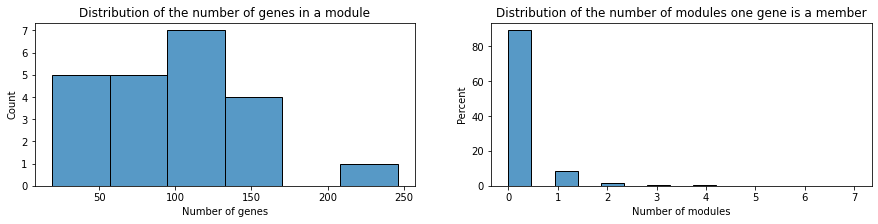

Number of genes in a module : 
- Mean : 98.59 
- Median : 98.0 
- Max : 246 
- Min : 19 

Number of modules per gene : 
- Mean : 0.15 
- Median : 0.0 
- Max : 7 
- Min : 0 

89.10 % of genes are not included in any module.
8.60 % of genes are included in only one module.
2.30 % of genes are included in more than one module.


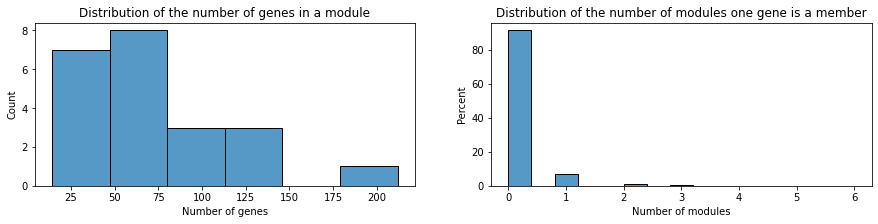

Number of genes in a module : 
- Mean : 75.55 
- Median : 74.5 
- Max : 212 
- Min : 14 

Number of modules per gene : 
- Mean : 0.11 
- Median : 0.0 
- Max : 6 
- Min : 0 

91.21 % of genes are not included in any module.
7.20 % of genes are included in only one module.
1.59 % of genes are included in more than one module.


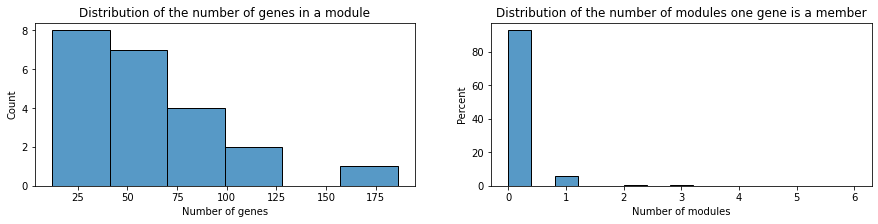

Number of genes in a module : 
- Mean : 59.00 
- Median : 55.5 
- Max : 186 
- Min : 12 

Number of modules per gene : 
- Mean : 0.09 
- Median : 0.0 
- Max : 6 
- Min : 0 

92.86 % of genes are not included in any module.
6.07 % of genes are included in only one module.
1.07 % of genes are included in more than one module.


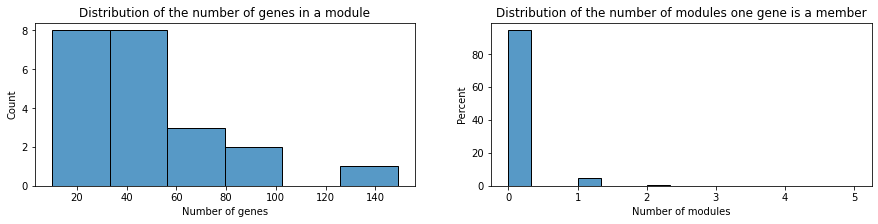

Number of genes in a module : 
- Mean : 46.14 
- Median : 41.0 
- Max : 149 
- Min : 10 

Number of modules per gene : 
- Mean : 0.07 
- Median : 0.0 
- Max : 5 
- Min : 0 

94.32 % of genes are not included in any module.
4.82 % of genes are included in only one module.
0.86 % of genes are included in more than one module.


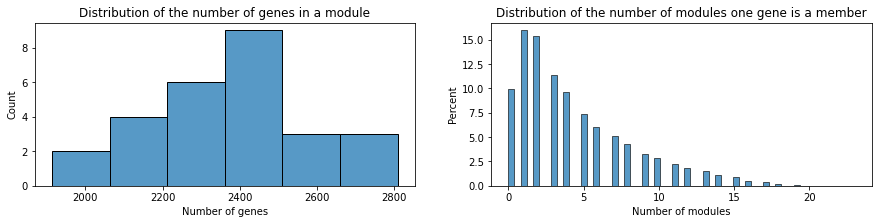

Number of genes in a module : 
- Mean : 2384.70 
- Median : 2427.0 
- Max : 2809 
- Min : 1913 

Number of modules per gene : 
- Mean : 4.35 
- Median : 3.0 
- Max : 23 
- Min : 0 

9.95 % of genes are not included in any module.
15.95 % of genes are included in only one module.
74.10 % of genes are included in more than one module.


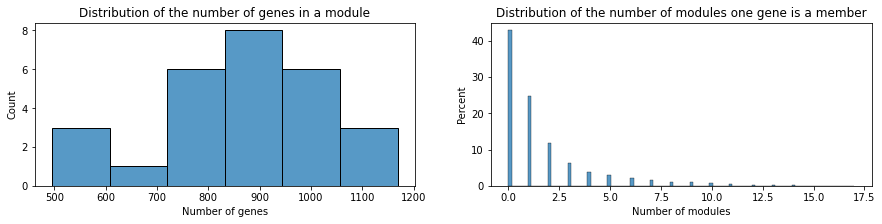

Number of genes in a module : 
- Mean : 867.85 
- Median : 887.0 
- Max : 1169 
- Min : 495 

Number of modules per gene : 
- Mean : 1.58 
- Median : 1.0 
- Max : 17 
- Min : 0 

42.82 % of genes are not included in any module.
24.63 % of genes are included in only one module.
32.55 % of genes are included in more than one module.


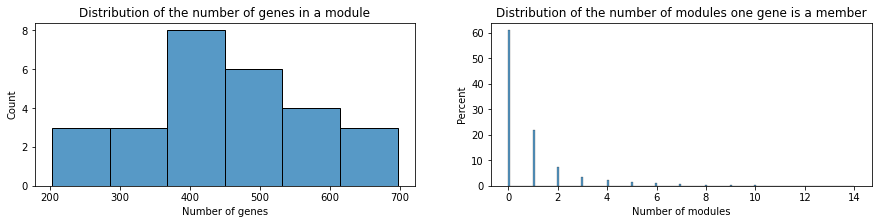

Number of genes in a module : 
- Mean : 452.41 
- Median : 442.0 
- Max : 697 
- Min : 203 

Number of modules per gene : 
- Mean : 0.82 
- Median : 0.0 
- Max : 14 
- Min : 0 

60.96 % of genes are not included in any module.
22.01 % of genes are included in only one module.
17.02 % of genes are included in more than one module.


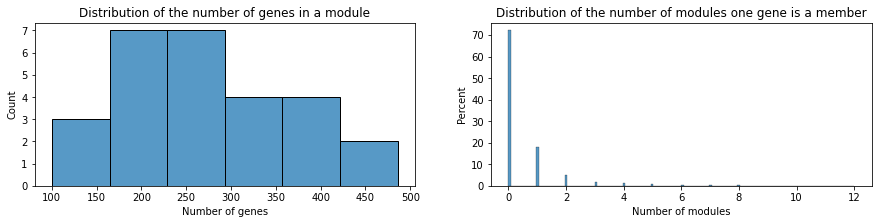

Number of genes in a module : 
- Mean : 276.11 
- Median : 263.0 
- Max : 486 
- Min : 100 

Number of modules per gene : 
- Mean : 0.50 
- Median : 0.0 
- Max : 12 
- Min : 0 

72.08 % of genes are not included in any module.
17.89 % of genes are included in only one module.
10.03 % of genes are included in more than one module.


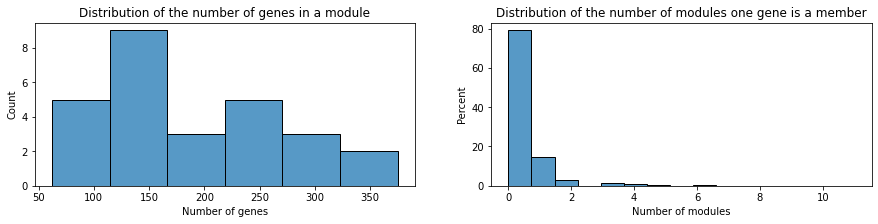

Number of genes in a module : 
- Mean : 184.37 
- Median : 162.0 
- Max : 375 
- Min : 62 

Number of modules per gene : 
- Mean : 0.34 
- Median : 0.0 
- Max : 11 
- Min : 0 

78.99 % of genes are not included in any module.
14.82 % of genes are included in only one module.
6.19 % of genes are included in more than one module.


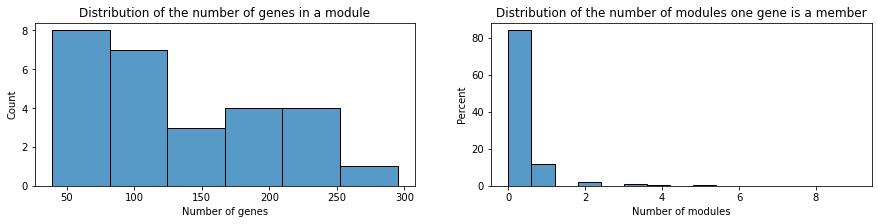

Number of genes in a module : 
- Mean : 130.78 
- Median : 111.0 
- Max : 295 
- Min : 39 

Number of modules per gene : 
- Mean : 0.24 
- Median : 0.0 
- Max : 9 
- Min : 0 

84.08 % of genes are not included in any module.
11.75 % of genes are included in only one module.
4.17 % of genes are included in more than one module.


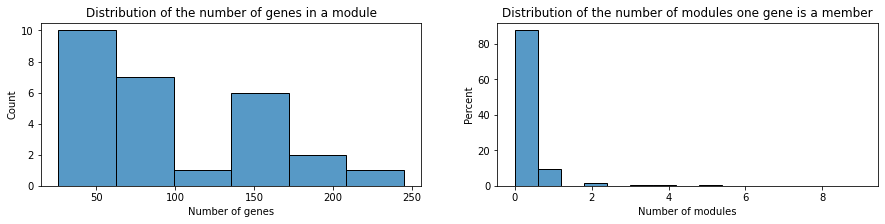

Number of genes in a module : 
- Mean : 98.30 
- Median : 76.0 
- Max : 245 
- Min : 26 

Number of modules per gene : 
- Mean : 0.18 
- Median : 0.0 
- Max : 9 
- Min : 0 

87.43 % of genes are not included in any module.
9.62 % of genes are included in only one module.
2.95 % of genes are included in more than one module.


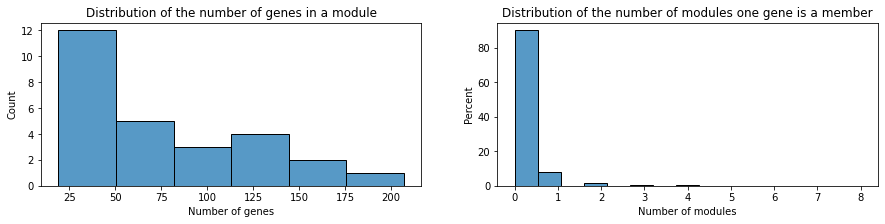

Number of genes in a module : 
- Mean : 76.19 
- Median : 53.0 
- Max : 207 
- Min : 19 

Number of modules per gene : 
- Mean : 0.14 
- Median : 0.0 
- Max : 8 
- Min : 0 

89.93 % of genes are not included in any module.
7.83 % of genes are included in only one module.
2.25 % of genes are included in more than one module.


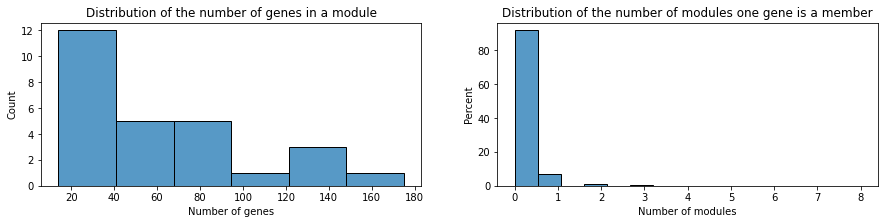

Number of genes in a module : 
- Mean : 60.07 
- Median : 42.0 
- Max : 175 
- Min : 14 

Number of modules per gene : 
- Mean : 0.11 
- Median : 0.0 
- Max : 8 
- Min : 0 

91.67 % of genes are not included in any module.
6.70 % of genes are included in only one module.
1.63 % of genes are included in more than one module.


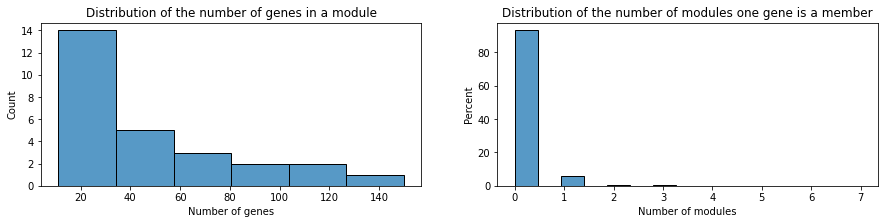

Number of genes in a module : 
- Mean : 47.81 
- Median : 33.0 
- Max : 150 
- Min : 11 

Number of modules per gene : 
- Mean : 0.09 
- Median : 0.0 
- Max : 7 
- Min : 0 

93.15 % of genes are not included in any module.
5.67 % of genes are included in only one module.
1.19 % of genes are included in more than one module.


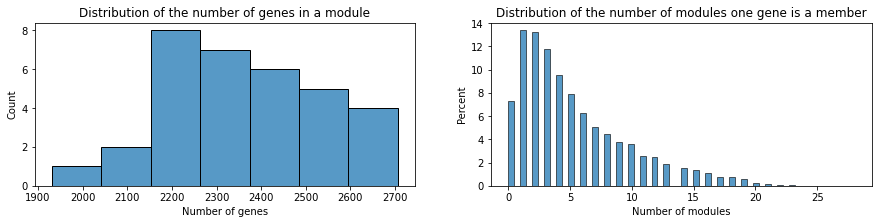

Number of genes in a module : 
- Mean : 2358.36 
- Median : 2342.0 
- Max : 2706 
- Min : 1931 

Number of modules per gene : 
- Mean : 5.26 
- Median : 4.0 
- Max : 28 
- Min : 0 

7.34 % of genes are not included in any module.
13.37 % of genes are included in only one module.
79.29 % of genes are included in more than one module.


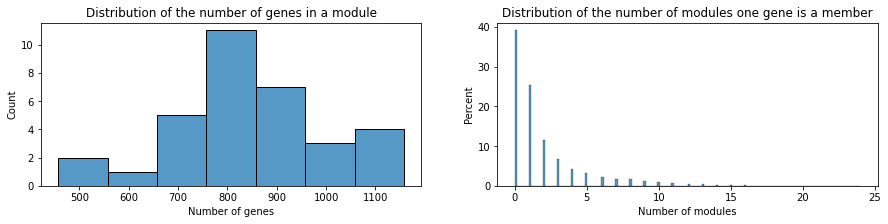

Number of genes in a module : 
- Mean : 846.55 
- Median : 834.0 
- Max : 1158 
- Min : 457 

Number of modules per gene : 
- Mean : 1.89 
- Median : 1.0 
- Max : 24 
- Min : 0 

39.06 % of genes are not included in any module.
25.36 % of genes are included in only one module.
35.58 % of genes are included in more than one module.


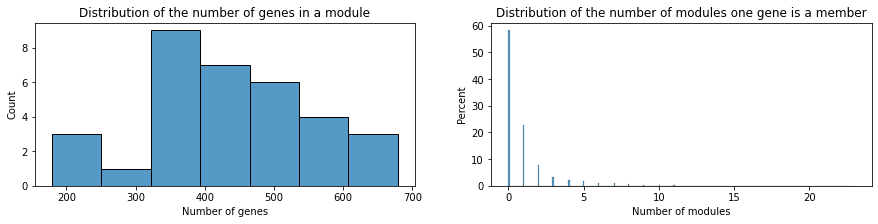

Number of genes in a module : 
- Mean : 438.18 
- Median : 413.0 
- Max : 679 
- Min : 179 

Number of modules per gene : 
- Mean : 0.98 
- Median : 0.0 
- Max : 23 
- Min : 0 

58.21 % of genes are not included in any module.
22.62 % of genes are included in only one module.
19.16 % of genes are included in more than one module.


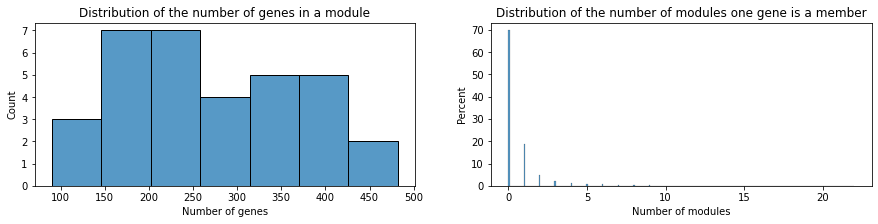

Number of genes in a module : 
- Mean : 268.64 
- Median : 244.0 
- Max : 482 
- Min : 90 

Number of modules per gene : 
- Mean : 0.60 
- Median : 0.0 
- Max : 22 
- Min : 0 

69.71 % of genes are not included in any module.
18.86 % of genes are included in only one module.
11.43 % of genes are included in more than one module.


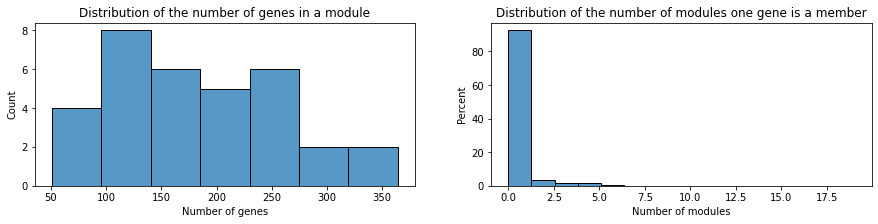

Number of genes in a module : 
- Mean : 179.58 
- Median : 161.0 
- Max : 364 
- Min : 51 

Number of modules per gene : 
- Mean : 0.40 
- Median : 0.0 
- Max : 19 
- Min : 0 

77.19 % of genes are not included in any module.
15.30 % of genes are included in only one module.
7.51 % of genes are included in more than one module.


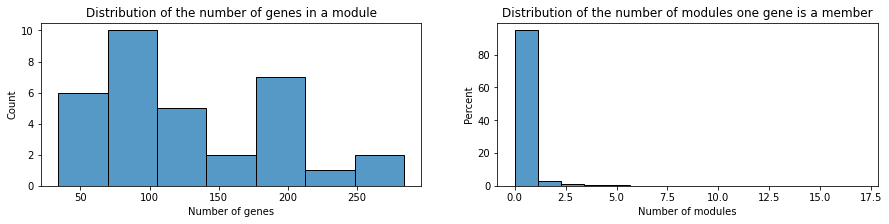

Number of genes in a module : 
- Mean : 128.09 
- Median : 114.0 
- Max : 284 
- Min : 34 

Number of modules per gene : 
- Mean : 0.29 
- Median : 0.0 
- Max : 17 
- Min : 0 

82.48 % of genes are not included in any module.
12.24 % of genes are included in only one module.
5.28 % of genes are included in more than one module.


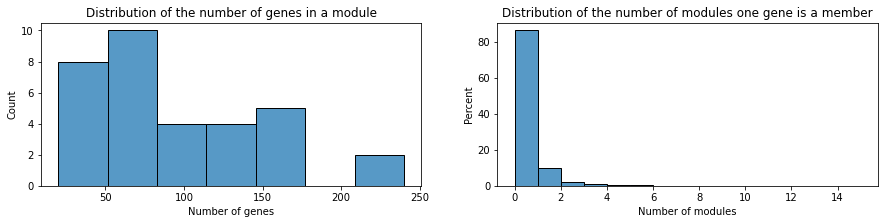

Number of genes in a module : 
- Mean : 94.03 
- Median : 76.0 
- Max : 240 
- Min : 20 

Number of modules per gene : 
- Mean : 0.21 
- Median : 0.0 
- Max : 15 
- Min : 0 

86.23 % of genes are not included in any module.
10.03 % of genes are included in only one module.
3.74 % of genes are included in more than one module.


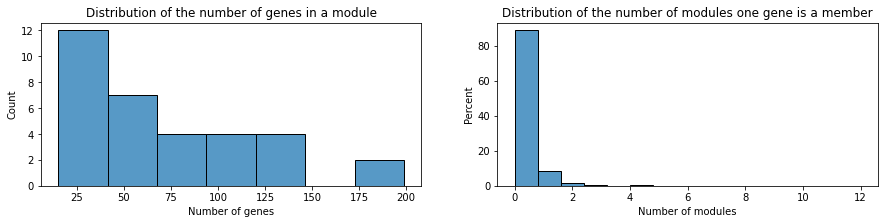

Number of genes in a module : 
- Mean : 71.88 
- Median : 54.0 
- Max : 199 
- Min : 15 

Number of modules per gene : 
- Mean : 0.16 
- Median : 0.0 
- Max : 12 
- Min : 0 

88.82 % of genes are not included in any module.
8.50 % of genes are included in only one module.
2.67 % of genes are included in more than one module.


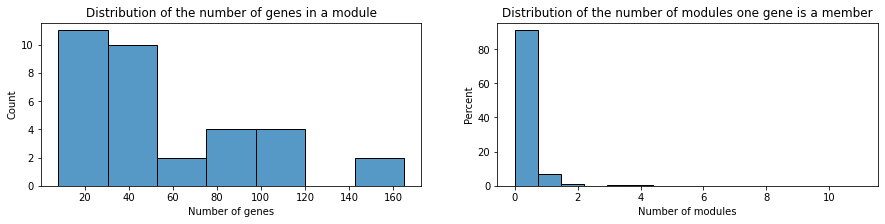

Number of genes in a module : 
- Mean : 56.52 
- Median : 44.0 
- Max : 165 
- Min : 8 

Number of modules per gene : 
- Mean : 0.13 
- Median : 0.0 
- Max : 11 
- Min : 0 

90.89 % of genes are not included in any module.
7.14 % of genes are included in only one module.
1.97 % of genes are included in more than one module.


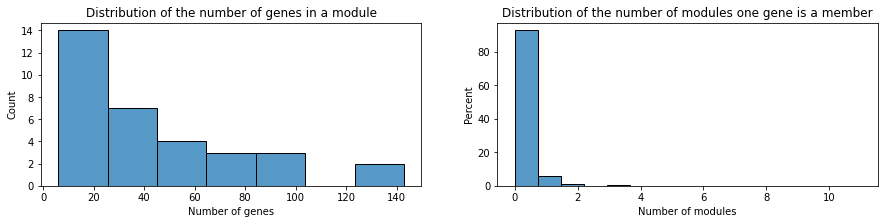

Number of genes in a module : 
- Mean : 44.64 
- Median : 28.0 
- Max : 143 
- Min : 6 

Number of modules per gene : 
- Mean : 0.10 
- Median : 0.0 
- Max : 11 
- Min : 0 

92.55 % of genes are not included in any module.
5.96 % of genes are included in only one module.
1.49 % of genes are included in more than one module.


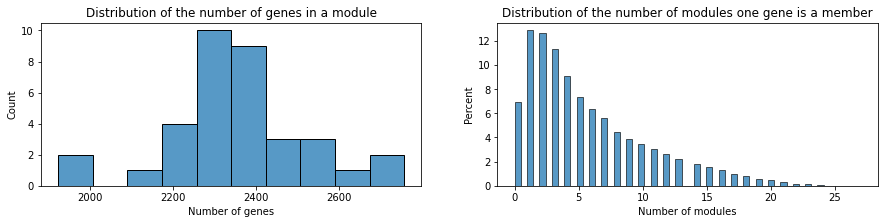

Number of genes in a module : 
- Mean : 2359.69 
- Median : 2351.0 
- Max : 2757 
- Min : 1923 

Number of modules per gene : 
- Mean : 5.58 
- Median : 4.0 
- Max : 27 
- Min : 0 

6.95 % of genes are not included in any module.
12.85 % of genes are included in only one module.
80.20 % of genes are included in more than one module.


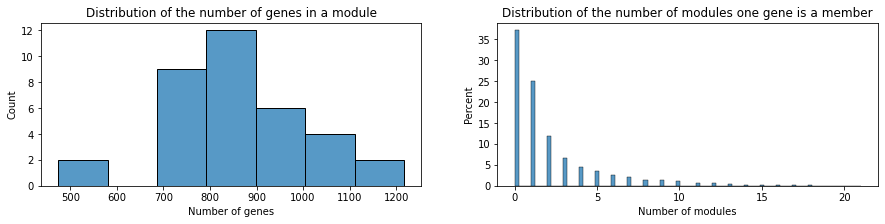

Number of genes in a module : 
- Mean : 856.74 
- Median : 838.0 
- Max : 1217 
- Min : 474 

Number of modules per gene : 
- Mean : 2.02 
- Median : 1.0 
- Max : 21 
- Min : 0 

37.15 % of genes are not included in any module.
25.07 % of genes are included in only one module.
37.78 % of genes are included in more than one module.


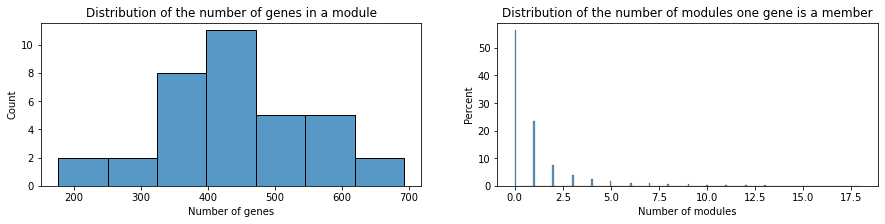

Number of genes in a module : 
- Mean : 443.40 
- Median : 425.0 
- Max : 693 
- Min : 177 

Number of modules per gene : 
- Mean : 1.05 
- Median : 0.0 
- Max : 18 
- Min : 0 

56.30 % of genes are not included in any module.
23.61 % of genes are included in only one module.
20.09 % of genes are included in more than one module.


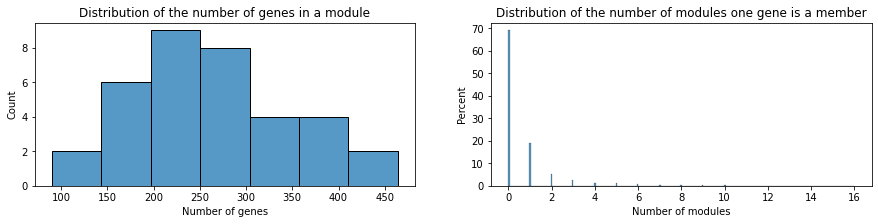

Number of genes in a module : 
- Mean : 268.51 
- Median : 255.0 
- Max : 464 
- Min : 90 

Number of modules per gene : 
- Mean : 0.63 
- Median : 0.0 
- Max : 16 
- Min : 0 

68.98 % of genes are not included in any module.
18.88 % of genes are included in only one module.
12.14 % of genes are included in more than one module.


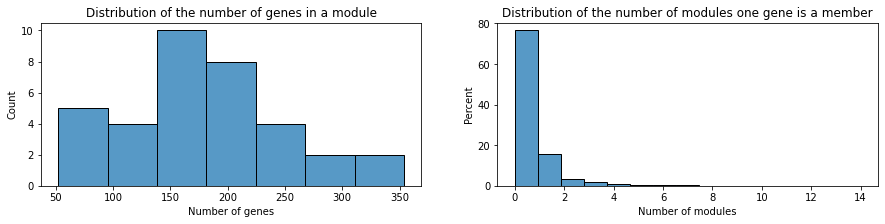

Number of genes in a module : 
- Mean : 179.94 
- Median : 167.0 
- Max : 354 
- Min : 52 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 14 
- Min : 0 

76.53 % of genes are not included in any module.
15.52 % of genes are included in only one module.
7.95 % of genes are included in more than one module.


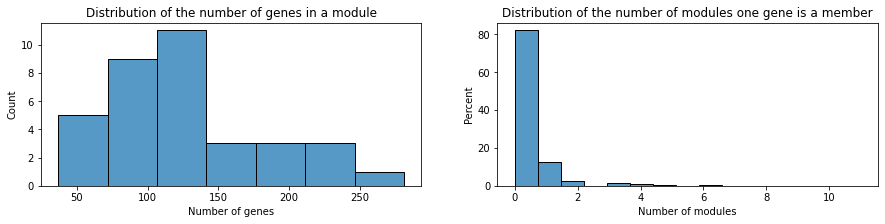

Number of genes in a module : 
- Mean : 127.51 
- Median : 114.0 
- Max : 281 
- Min : 37 

Number of modules per gene : 
- Mean : 0.30 
- Median : 0.0 
- Max : 11 
- Min : 0 

81.92 % of genes are not included in any module.
12.48 % of genes are included in only one module.
5.60 % of genes are included in more than one module.


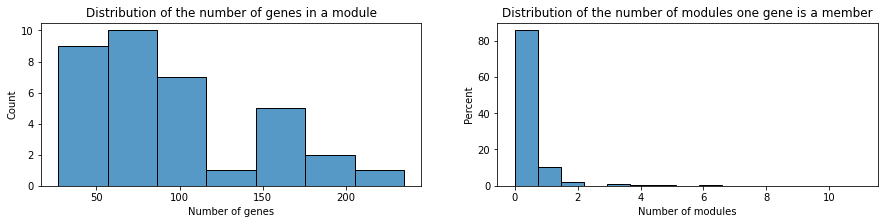

Number of genes in a module : 
- Mean : 95.26 
- Median : 85.0 
- Max : 235 
- Min : 27 

Number of modules per gene : 
- Mean : 0.23 
- Median : 0.0 
- Max : 11 
- Min : 0 

85.57 % of genes are not included in any module.
10.45 % of genes are included in only one module.
3.98 % of genes are included in more than one module.


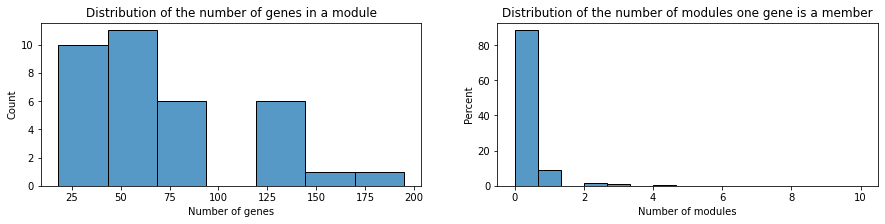

Number of genes in a module : 
- Mean : 72.17 
- Median : 63.0 
- Max : 195 
- Min : 18 

Number of modules per gene : 
- Mean : 0.17 
- Median : 0.0 
- Max : 10 
- Min : 0 

88.30 % of genes are not included in any module.
8.91 % of genes are included in only one module.
2.80 % of genes are included in more than one module.


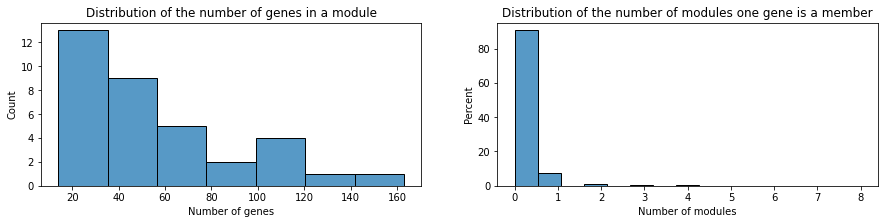

Number of genes in a module : 
- Mean : 56.23 
- Median : 45.0 
- Max : 163 
- Min : 14 

Number of modules per gene : 
- Mean : 0.13 
- Median : 0.0 
- Max : 8 
- Min : 0 

90.55 % of genes are not included in any module.
7.26 % of genes are included in only one module.
2.19 % of genes are included in more than one module.


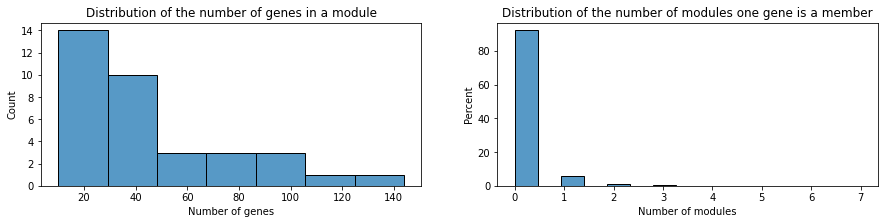

Number of genes in a module : 
- Mean : 45.03 
- Median : 35.0 
- Max : 144 
- Min : 10 

Number of modules per gene : 
- Mean : 0.11 
- Median : 0.0 
- Max : 7 
- Min : 0 

92.19 % of genes are not included in any module.
6.10 % of genes are included in only one module.
1.71 % of genes are included in more than one module.


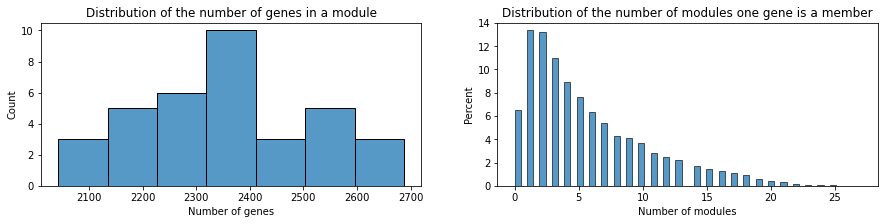

Number of genes in a module : 
- Mean : 2354.57 
- Median : 2348.0 
- Max : 2688 
- Min : 2042 

Number of modules per gene : 
- Mean : 5.56 
- Median : 4.0 
- Max : 27 
- Min : 0 

6.48 % of genes are not included in any module.
13.34 % of genes are included in only one module.
80.19 % of genes are included in more than one module.


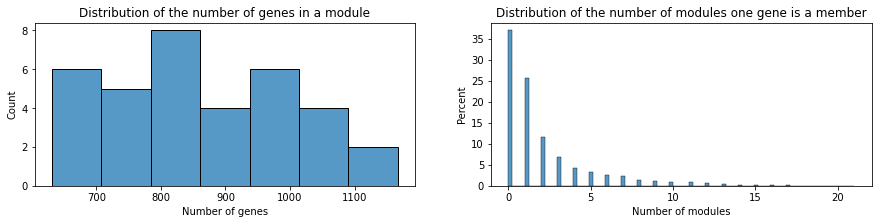

Number of genes in a module : 
- Mean : 857.31 
- Median : 852.0 
- Max : 1167 
- Min : 631 

Number of modules per gene : 
- Mean : 2.03 
- Median : 1.0 
- Max : 21 
- Min : 0 

36.97 % of genes are not included in any module.
25.69 % of genes are included in only one module.
37.34 % of genes are included in more than one module.


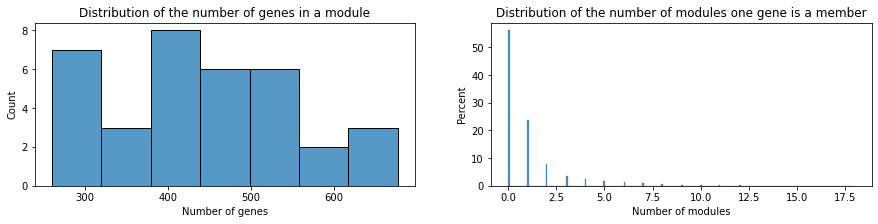

Number of genes in a module : 
- Mean : 444.94 
- Median : 424.0 
- Max : 677 
- Min : 260 

Number of modules per gene : 
- Mean : 1.05 
- Median : 0.0 
- Max : 18 
- Min : 0 

56.12 % of genes are not included in any module.
23.67 % of genes are included in only one module.
20.20 % of genes are included in more than one module.


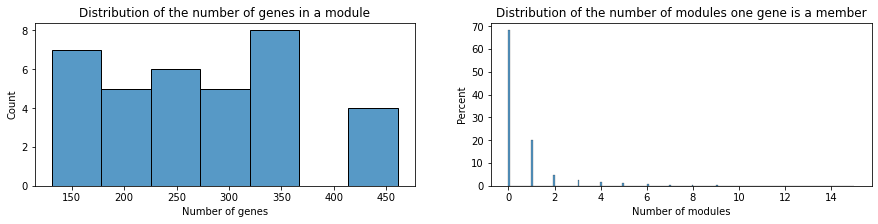

Number of genes in a module : 
- Mean : 271.77 
- Median : 271.0 
- Max : 461 
- Min : 131 

Number of modules per gene : 
- Mean : 0.64 
- Median : 0.0 
- Max : 15 
- Min : 0 

68.08 % of genes are not included in any module.
19.97 % of genes are included in only one module.
11.95 % of genes are included in more than one module.


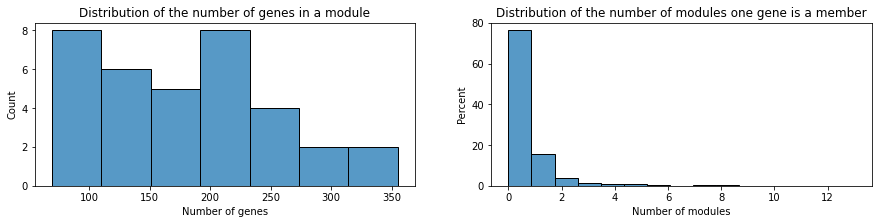

Number of genes in a module : 
- Mean : 180.83 
- Median : 178.0 
- Max : 355 
- Min : 69 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 13 
- Min : 0 

76.27 % of genes are not included in any module.
15.75 % of genes are included in only one module.
7.97 % of genes are included in more than one module.


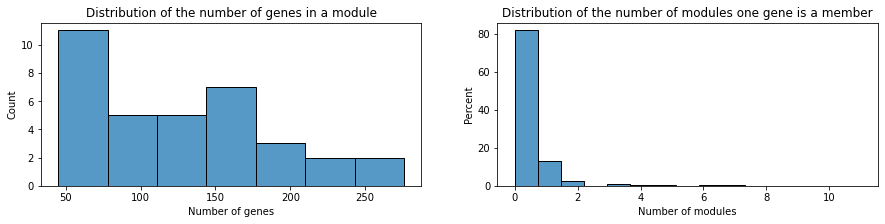

Number of genes in a module : 
- Mean : 126.40 
- Median : 123.0 
- Max : 276 
- Min : 45 

Number of modules per gene : 
- Mean : 0.30 
- Median : 0.0 
- Max : 11 
- Min : 0 

81.68 % of genes are not included in any module.
12.92 % of genes are included in only one module.
5.40 % of genes are included in more than one module.


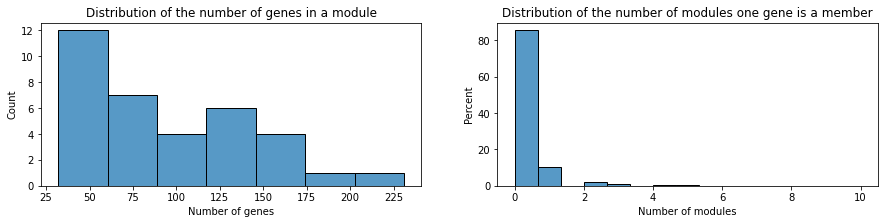

Number of genes in a module : 
- Mean : 94.31 
- Median : 79.0 
- Max : 231 
- Min : 32 

Number of modules per gene : 
- Mean : 0.22 
- Median : 0.0 
- Max : 10 
- Min : 0 

85.44 % of genes are not included in any module.
10.56 % of genes are included in only one module.
4.00 % of genes are included in more than one module.


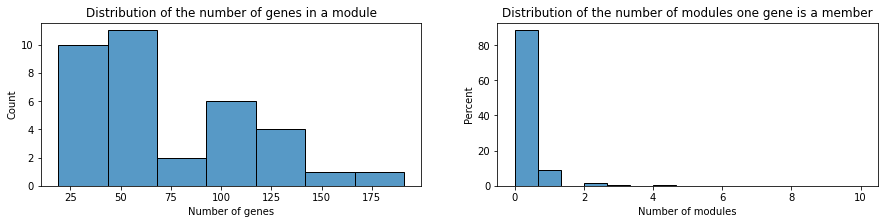

Number of genes in a module : 
- Mean : 72.03 
- Median : 59.0 
- Max : 191 
- Min : 19 

Number of modules per gene : 
- Mean : 0.17 
- Median : 0.0 
- Max : 10 
- Min : 0 

88.29 % of genes are not included in any module.
8.79 % of genes are included in only one module.
2.92 % of genes are included in more than one module.


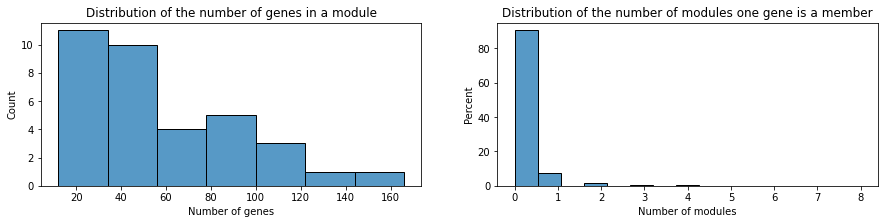

Number of genes in a module : 
- Mean : 56.91 
- Median : 43.0 
- Max : 166 
- Min : 12 

Number of modules per gene : 
- Mean : 0.13 
- Median : 0.0 
- Max : 8 
- Min : 0 

90.38 % of genes are not included in any module.
7.35 % of genes are included in only one module.
2.26 % of genes are included in more than one module.


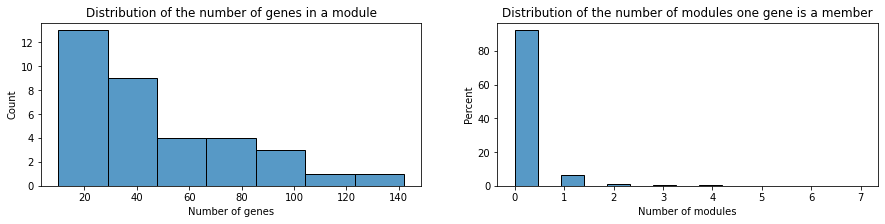

Number of genes in a module : 
- Mean : 44.91 
- Median : 32.0 
- Max : 142 
- Min : 10 

Number of modules per gene : 
- Mean : 0.11 
- Median : 0.0 
- Max : 7 
- Min : 0 

92.05 % of genes are not included in any module.
6.29 % of genes are included in only one module.
1.66 % of genes are included in more than one module.


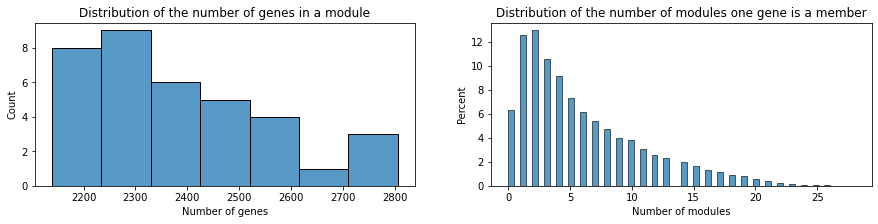

Number of genes in a module : 
- Mean : 2385.64 
- Median : 2368.0 
- Max : 2805 
- Min : 2139 

Number of modules per gene : 
- Mean : 5.80 
- Median : 4.0 
- Max : 28 
- Min : 0 

6.28 % of genes are not included in any module.
12.55 % of genes are included in only one module.
81.17 % of genes are included in more than one module.


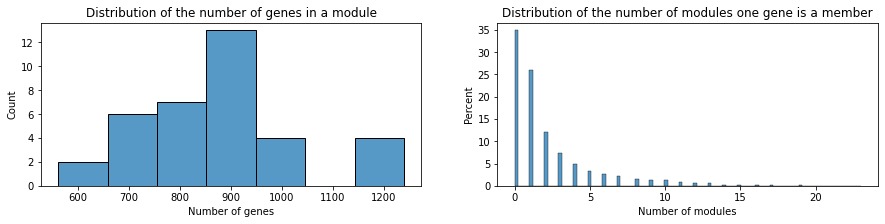

Number of genes in a module : 
- Mean : 874.75 
- Median : 888.0 
- Max : 1240 
- Min : 561 

Number of modules per gene : 
- Mean : 2.13 
- Median : 1.0 
- Max : 23 
- Min : 0 

34.86 % of genes are not included in any module.
25.99 % of genes are included in only one module.
39.15 % of genes are included in more than one module.


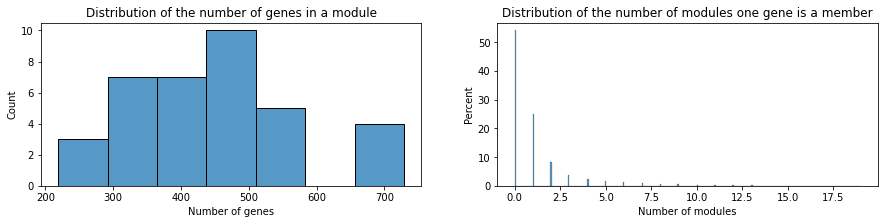

Number of genes in a module : 
- Mean : 453.22 
- Median : 461.0 
- Max : 729 
- Min : 219 

Number of modules per gene : 
- Mean : 1.10 
- Median : 0.0 
- Max : 19 
- Min : 0 

54.12 % of genes are not included in any module.
24.88 % of genes are included in only one module.
21.01 % of genes are included in more than one module.


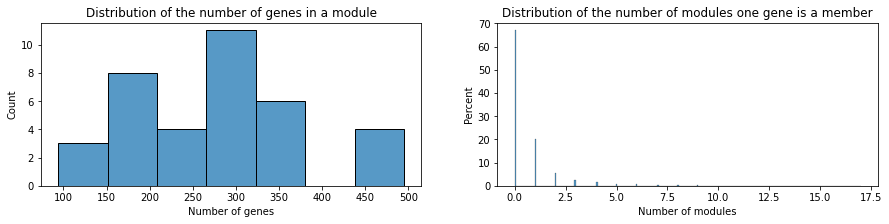

Number of genes in a module : 
- Mean : 277.14 
- Median : 287.0 
- Max : 495 
- Min : 94 

Number of modules per gene : 
- Mean : 0.67 
- Median : 0.0 
- Max : 17 
- Min : 0 

66.93 % of genes are not included in any module.
20.23 % of genes are included in only one module.
12.84 % of genes are included in more than one module.


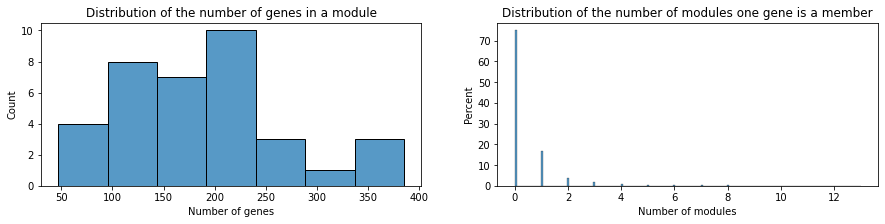

Number of genes in a module : 
- Mean : 186.14 
- Median : 183.5 
- Max : 385 
- Min : 47 

Number of modules per gene : 
- Mean : 0.45 
- Median : 0.0 
- Max : 13 
- Min : 0 

74.85 % of genes are not included in any module.
16.83 % of genes are included in only one module.
8.33 % of genes are included in more than one module.


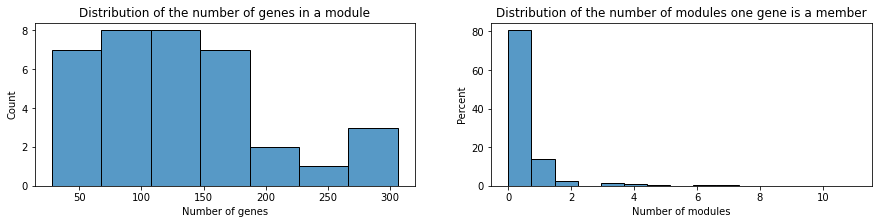

Number of genes in a module : 
- Mean : 132.33 
- Median : 126.0 
- Max : 306 
- Min : 28 

Number of modules per gene : 
- Mean : 0.32 
- Median : 0.0 
- Max : 11 
- Min : 0 

80.52 % of genes are not included in any module.
13.83 % of genes are included in only one module.
5.65 % of genes are included in more than one module.


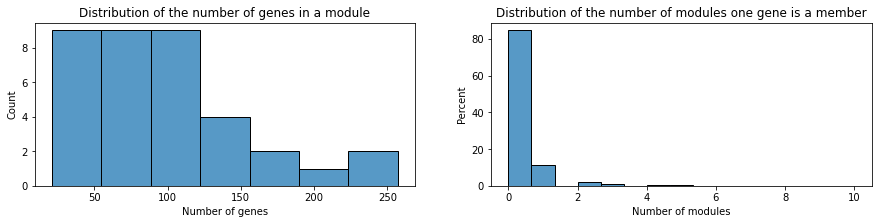

Number of genes in a module : 
- Mean : 98.17 
- Median : 86.5 
- Max : 257 
- Min : 21 

Number of modules per gene : 
- Mean : 0.24 
- Median : 0.0 
- Max : 10 
- Min : 0 

84.62 % of genes are not included in any module.
11.30 % of genes are included in only one module.
4.08 % of genes are included in more than one module.


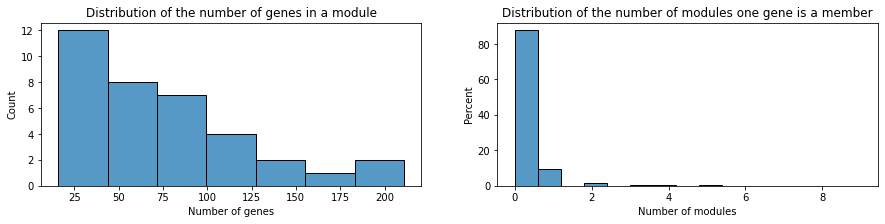

Number of genes in a module : 
- Mean : 74.56 
- Median : 63.0 
- Max : 211 
- Min : 16 

Number of modules per gene : 
- Mean : 0.18 
- Median : 0.0 
- Max : 9 
- Min : 0 

87.65 % of genes are not included in any module.
9.37 % of genes are included in only one module.
2.98 % of genes are included in more than one module.


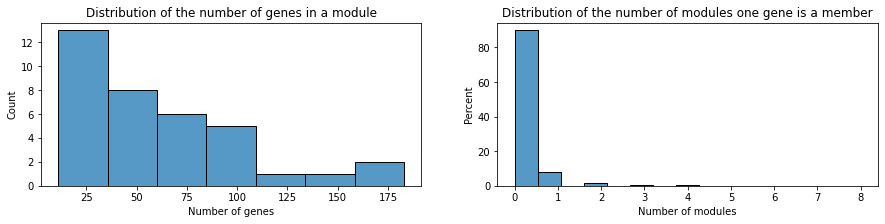

Number of genes in a module : 
- Mean : 59.06 
- Median : 45.0 
- Max : 183 
- Min : 11 

Number of modules per gene : 
- Mean : 0.14 
- Median : 0.0 
- Max : 8 
- Min : 0 

89.81 % of genes are not included in any module.
7.90 % of genes are included in only one module.
2.29 % of genes are included in more than one module.


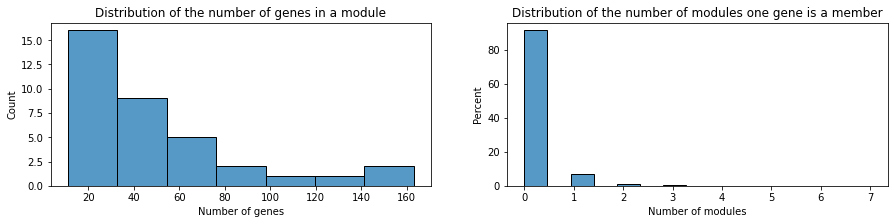

Number of genes in a module : 
- Mean : 47.61 
- Median : 33.5 
- Max : 163 
- Min : 11 

Number of modules per gene : 
- Mean : 0.12 
- Median : 0.0 
- Max : 7 
- Min : 0 

91.44 % of genes are not included in any module.
6.83 % of genes are included in only one module.
1.73 % of genes are included in more than one module.


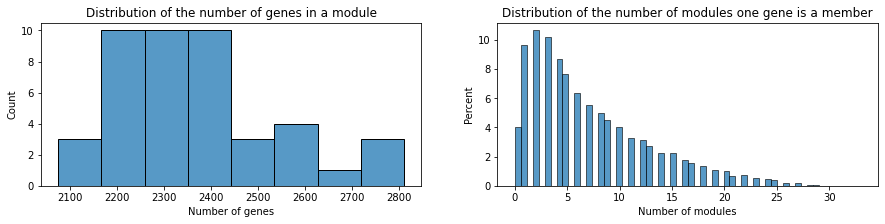

Number of genes in a module : 
- Mean : 2371.45 
- Median : 2344.5 
- Max : 2810 
- Min : 2076 

Number of modules per gene : 
- Mean : 7.05 
- Median : 5.0 
- Max : 33 
- Min : 0 

4.05 % of genes are not included in any module.
9.62 % of genes are included in only one module.
86.33 % of genes are included in more than one module.


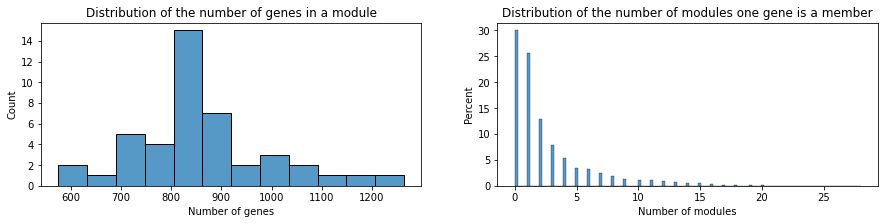

Number of genes in a module : 
- Mean : 857.39 
- Median : 843.0 
- Max : 1264 
- Min : 575 

Number of modules per gene : 
- Mean : 2.55 
- Median : 1.0 
- Max : 28 
- Min : 0 

29.99 % of genes are not included in any module.
25.69 % of genes are included in only one module.
44.32 % of genes are included in more than one module.


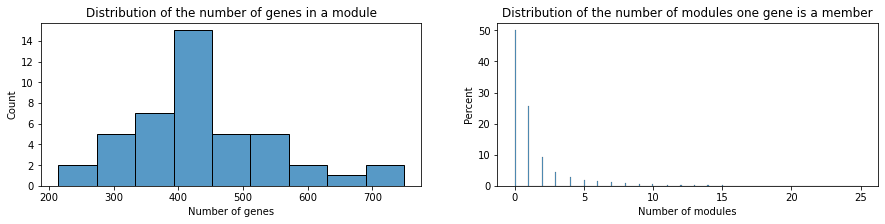

Number of genes in a module : 
- Mean : 438.43 
- Median : 422.5 
- Max : 749 
- Min : 214 

Number of modules per gene : 
- Mean : 1.30 
- Median : 1.0 
- Max : 25 
- Min : 0 

49.96 % of genes are not included in any module.
25.64 % of genes are included in only one module.
24.40 % of genes are included in more than one module.


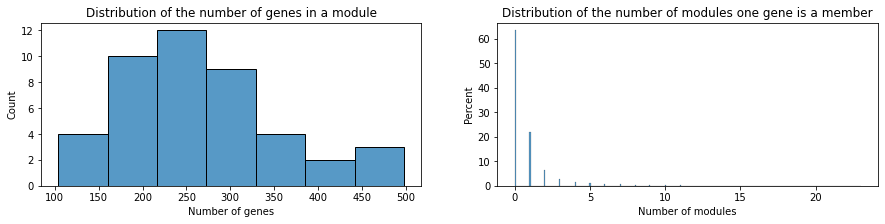

Number of genes in a module : 
- Mean : 263.68 
- Median : 248.0 
- Max : 498 
- Min : 104 

Number of modules per gene : 
- Mean : 0.78 
- Median : 0.0 
- Max : 23 
- Min : 0 

63.47 % of genes are not included in any module.
21.82 % of genes are included in only one module.
14.71 % of genes are included in more than one module.


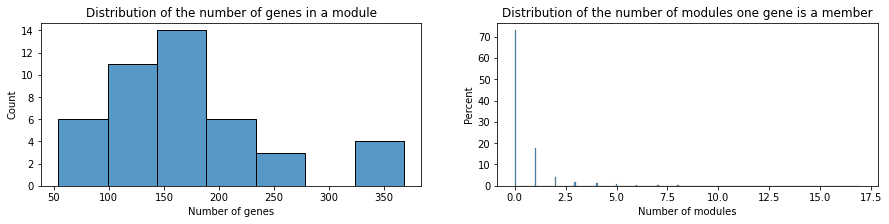

Number of genes in a module : 
- Mean : 174.00 
- Median : 165.5 
- Max : 368 
- Min : 54 

Number of modules per gene : 
- Mean : 0.52 
- Median : 0.0 
- Max : 17 
- Min : 0 

72.83 % of genes are not included in any module.
17.66 % of genes are included in only one module.
9.51 % of genes are included in more than one module.


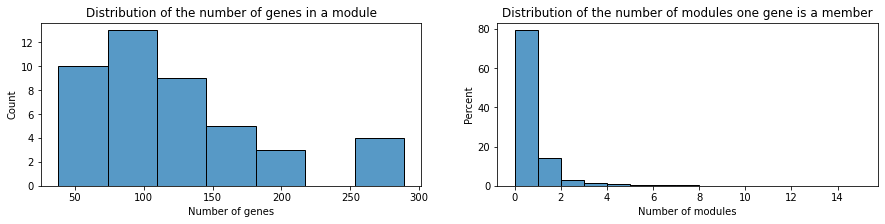

Number of genes in a module : 
- Mean : 121.57 
- Median : 107.5 
- Max : 289 
- Min : 38 

Number of modules per gene : 
- Mean : 0.36 
- Median : 0.0 
- Max : 15 
- Min : 0 

79.13 % of genes are not included in any module.
14.34 % of genes are included in only one module.
6.53 % of genes are included in more than one module.


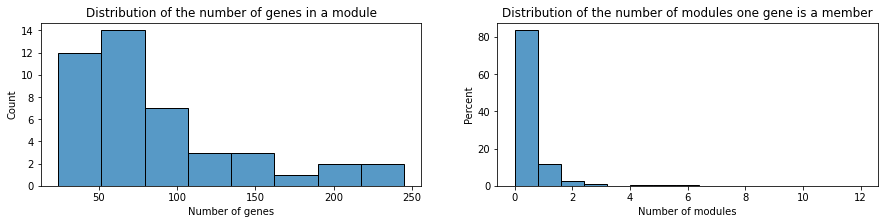

Number of genes in a module : 
- Mean : 89.43 
- Median : 73.5 
- Max : 245 
- Min : 24 

Number of modules per gene : 
- Mean : 0.27 
- Median : 0.0 
- Max : 12 
- Min : 0 

83.45 % of genes are not included in any module.
11.80 % of genes are included in only one module.
4.75 % of genes are included in more than one module.


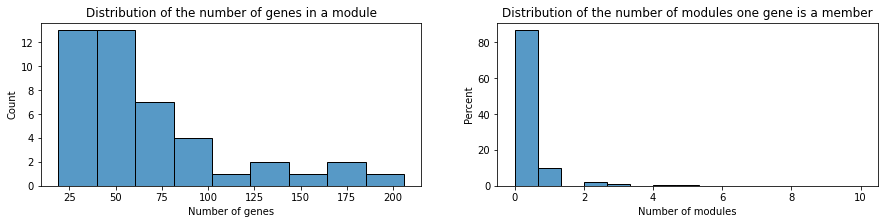

Number of genes in a module : 
- Mean : 67.89 
- Median : 51.0 
- Max : 206 
- Min : 19 

Number of modules per gene : 
- Mean : 0.20 
- Median : 0.0 
- Max : 10 
- Min : 0 

86.65 % of genes are not included in any module.
9.90 % of genes are included in only one module.
3.45 % of genes are included in more than one module.


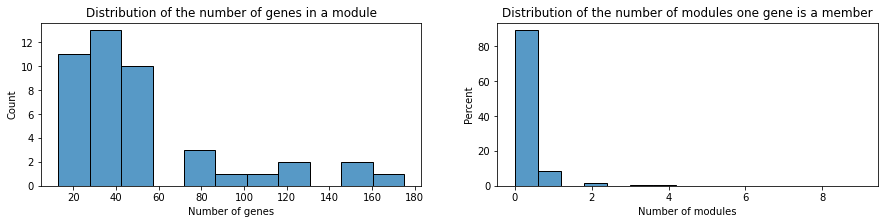

Number of genes in a module : 
- Mean : 52.02 
- Median : 36.0 
- Max : 175 
- Min : 13 

Number of modules per gene : 
- Mean : 0.15 
- Median : 0.0 
- Max : 9 
- Min : 0 

89.18 % of genes are not included in any module.
8.33 % of genes are included in only one module.
2.48 % of genes are included in more than one module.


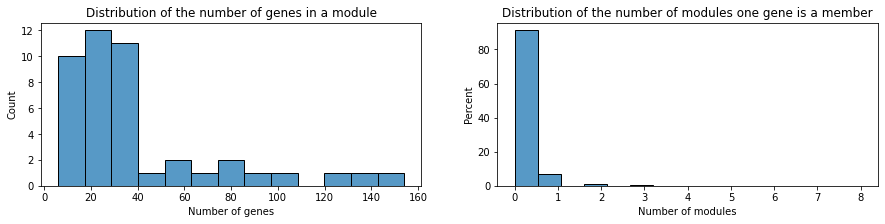

Number of genes in a module : 
- Mean : 40.93 
- Median : 28.5 
- Max : 154 
- Min : 6 

Number of modules per gene : 
- Mean : 0.12 
- Median : 0.0 
- Max : 8 
- Min : 0 

91.13 % of genes are not included in any module.
6.99 % of genes are included in only one module.
1.88 % of genes are included in more than one module.


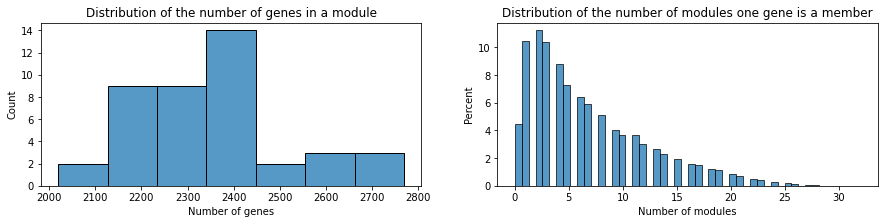

Number of genes in a module : 
- Mean : 2352.43 
- Median : 2354.5 
- Max : 2769 
- Min : 2020 

Number of modules per gene : 
- Mean : 6.67 
- Median : 5.0 
- Max : 32 
- Min : 0 

4.48 % of genes are not included in any module.
10.43 % of genes are included in only one module.
85.08 % of genes are included in more than one module.


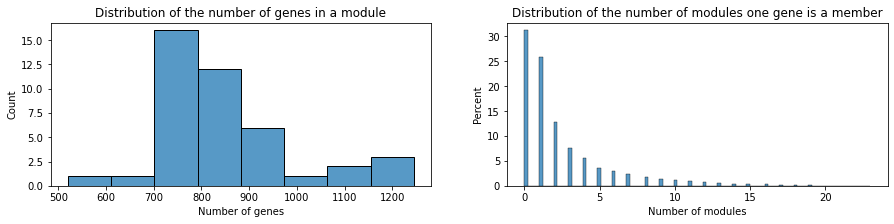

Number of genes in a module : 
- Mean : 849.33 
- Median : 823.0 
- Max : 1245 
- Min : 520 

Number of modules per gene : 
- Mean : 2.41 
- Median : 1.0 
- Max : 23 
- Min : 0 

31.16 % of genes are not included in any module.
25.87 % of genes are included in only one module.
42.97 % of genes are included in more than one module.


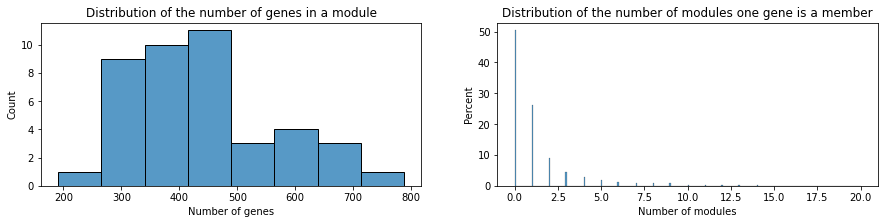

Number of genes in a module : 
- Mean : 438.60 
- Median : 424.0 
- Max : 788 
- Min : 191 

Number of modules per gene : 
- Mean : 1.24 
- Median : 0.0 
- Max : 20 
- Min : 0 

50.33 % of genes are not included in any module.
26.04 % of genes are included in only one module.
23.63 % of genes are included in more than one module.


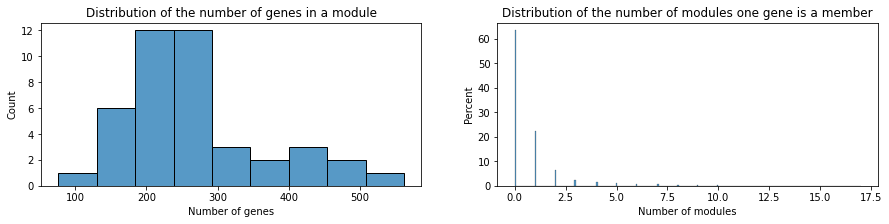

Number of genes in a module : 
- Mean : 264.62 
- Median : 247.5 
- Max : 562 
- Min : 76 

Number of modules per gene : 
- Mean : 0.75 
- Median : 0.0 
- Max : 17 
- Min : 0 

63.38 % of genes are not included in any module.
22.41 % of genes are included in only one module.
14.21 % of genes are included in more than one module.


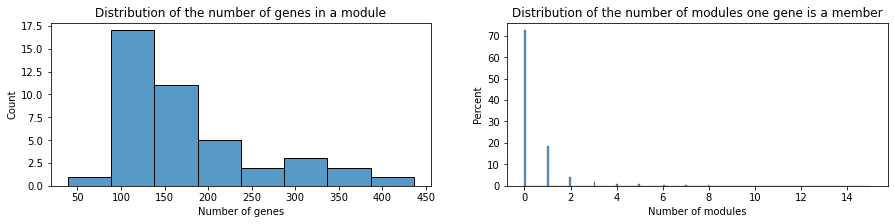

Number of genes in a module : 
- Mean : 175.86 
- Median : 154.5 
- Max : 436 
- Min : 39 

Number of modules per gene : 
- Mean : 0.50 
- Median : 0.0 
- Max : 15 
- Min : 0 

72.40 % of genes are not included in any module.
18.45 % of genes are included in only one module.
9.14 % of genes are included in more than one module.


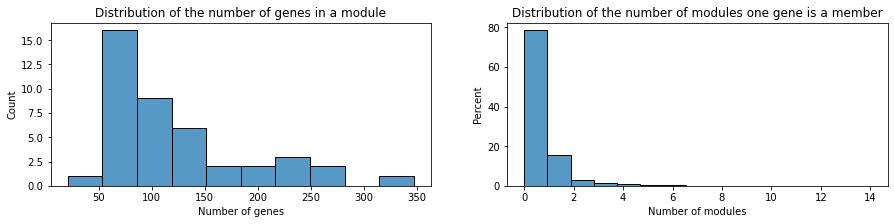

Number of genes in a module : 
- Mean : 122.90 
- Median : 100.0 
- Max : 347 
- Min : 21 

Number of modules per gene : 
- Mean : 0.35 
- Median : 0.0 
- Max : 14 
- Min : 0 

78.43 % of genes are not included in any module.
15.49 % of genes are included in only one module.
6.08 % of genes are included in more than one module.


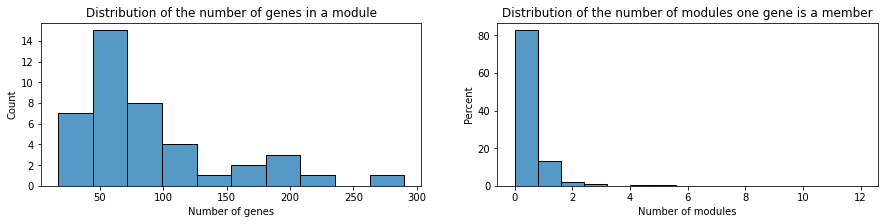

Number of genes in a module : 
- Mean : 91.95 
- Median : 68.5 
- Max : 290 
- Min : 17 

Number of modules per gene : 
- Mean : 0.26 
- Median : 0.0 
- Max : 12 
- Min : 0 

82.54 % of genes are not included in any module.
13.19 % of genes are included in only one module.
4.26 % of genes are included in more than one module.


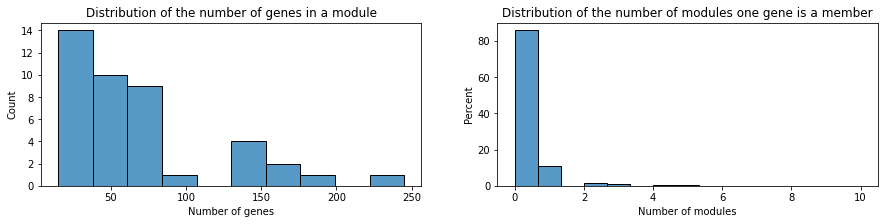

Number of genes in a module : 
- Mean : 70.40 
- Median : 50.0 
- Max : 245 
- Min : 15 

Number of modules per gene : 
- Mean : 0.20 
- Median : 0.0 
- Max : 10 
- Min : 0 

85.81 % of genes are not included in any module.
11.06 % of genes are included in only one module.
3.13 % of genes are included in more than one module.


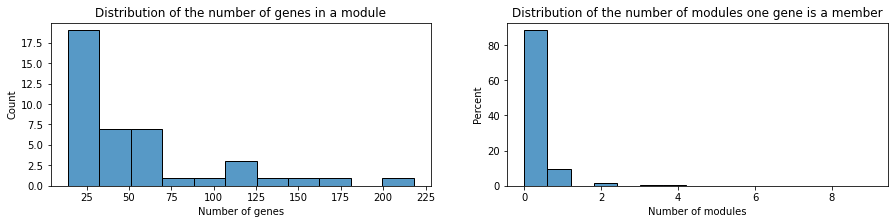

Number of genes in a module : 
- Mean : 55.79 
- Median : 36.0 
- Max : 218 
- Min : 14 

Number of modules per gene : 
- Mean : 0.16 
- Median : 0.0 
- Max : 9 
- Min : 0 

88.31 % of genes are not included in any module.
9.30 % of genes are included in only one module.
2.39 % of genes are included in more than one module.


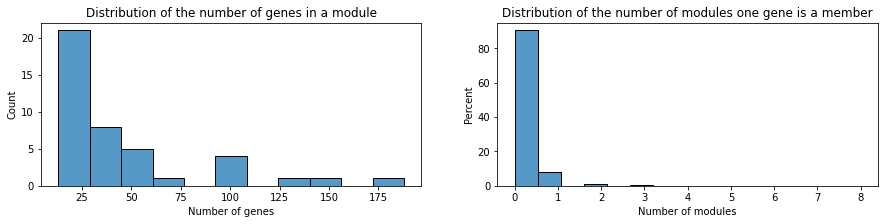

Number of genes in a module : 
- Mean : 44.33 
- Median : 28.0 
- Max : 188 
- Min : 13 

Number of modules per gene : 
- Mean : 0.13 
- Median : 0.0 
- Max : 8 
- Min : 0 

90.25 % of genes are not included in any module.
8.03 % of genes are included in only one module.
1.72 % of genes are included in more than one module.


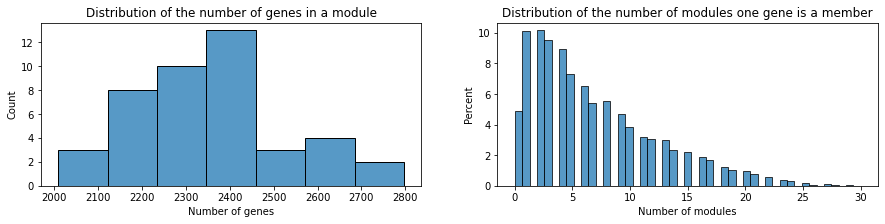

Number of genes in a module : 
- Mean : 2361.14 
- Median : 2353.0 
- Max : 2797 
- Min : 2010 

Number of modules per gene : 
- Mean : 6.86 
- Median : 5.0 
- Max : 30 
- Min : 0 

4.92 % of genes are not included in any module.
10.10 % of genes are included in only one module.
84.98 % of genes are included in more than one module.


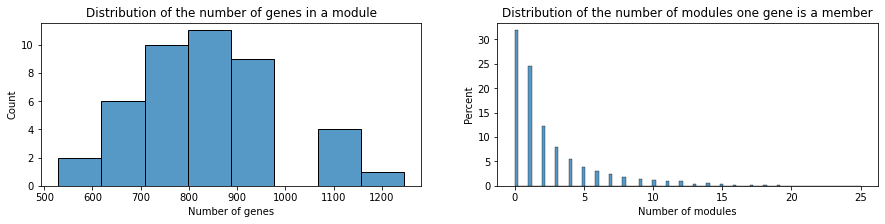

Number of genes in a module : 
- Mean : 838.53 
- Median : 809.0 
- Max : 1246 
- Min : 529 

Number of modules per gene : 
- Mean : 2.43 
- Median : 1.0 
- Max : 25 
- Min : 0 

31.80 % of genes are not included in any module.
24.59 % of genes are included in only one module.
43.61 % of genes are included in more than one module.


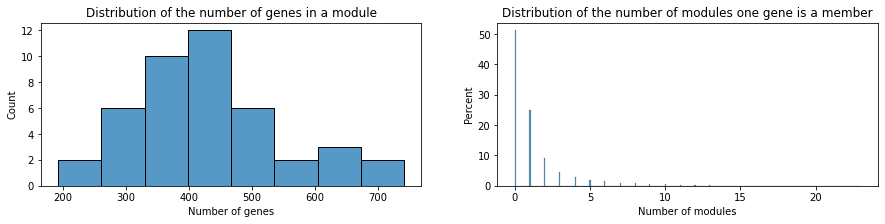

Number of genes in a module : 
- Mean : 425.28 
- Median : 408.0 
- Max : 742 
- Min : 192 

Number of modules per gene : 
- Mean : 1.23 
- Median : 0.0 
- Max : 23 
- Min : 0 

51.16 % of genes are not included in any module.
24.94 % of genes are included in only one module.
23.90 % of genes are included in more than one module.


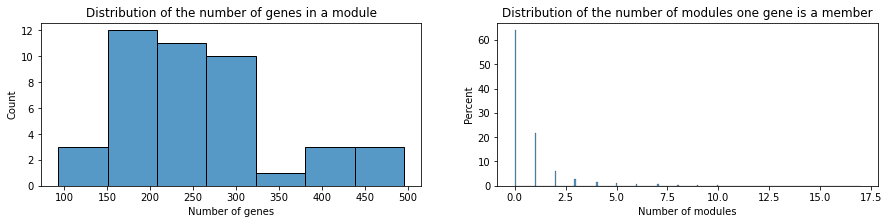

Number of genes in a module : 
- Mean : 257.30 
- Median : 245.0 
- Max : 496 
- Min : 93 

Number of modules per gene : 
- Mean : 0.75 
- Median : 0.0 
- Max : 17 
- Min : 0 

63.85 % of genes are not included in any module.
21.91 % of genes are included in only one module.
14.24 % of genes are included in more than one module.


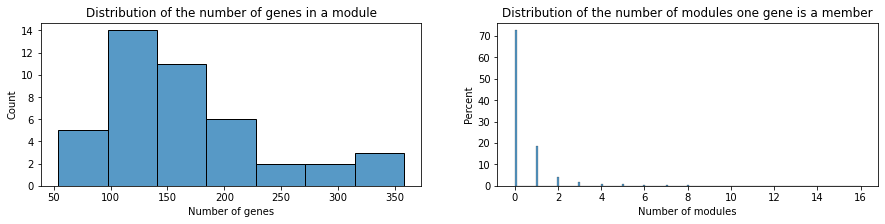

Number of genes in a module : 
- Mean : 169.40 
- Median : 156.0 
- Max : 358 
- Min : 54 

Number of modules per gene : 
- Mean : 0.49 
- Median : 0.0 
- Max : 16 
- Min : 0 

72.53 % of genes are not included in any module.
18.42 % of genes are included in only one module.
9.05 % of genes are included in more than one module.


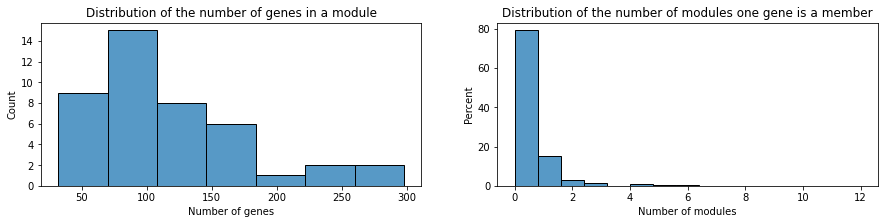

Number of genes in a module : 
- Mean : 116.95 
- Median : 102.0 
- Max : 298 
- Min : 32 

Number of modules per gene : 
- Mean : 0.34 
- Median : 0.0 
- Max : 12 
- Min : 0 

79.07 % of genes are not included in any module.
14.98 % of genes are included in only one module.
5.95 % of genes are included in more than one module.


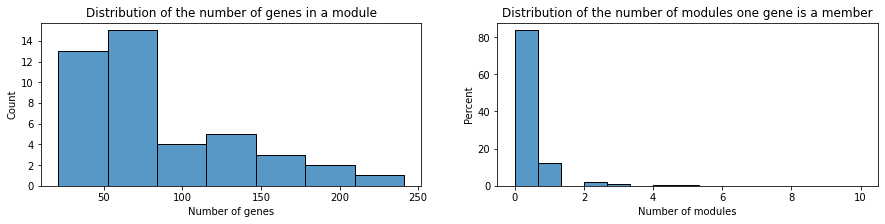

Number of genes in a module : 
- Mean : 86.16 
- Median : 71.0 
- Max : 241 
- Min : 21 

Number of modules per gene : 
- Mean : 0.25 
- Median : 0.0 
- Max : 10 
- Min : 0 

83.56 % of genes are not included in any module.
12.23 % of genes are included in only one module.
4.21 % of genes are included in more than one module.


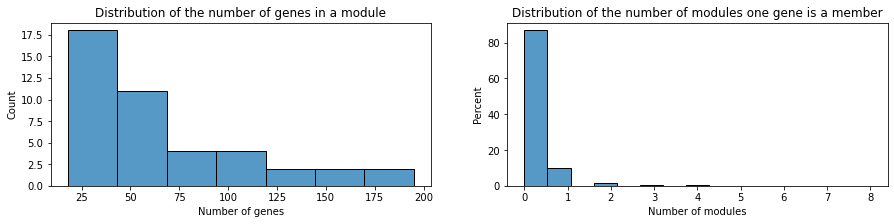

Number of genes in a module : 
- Mean : 65.02 
- Median : 49.0 
- Max : 195 
- Min : 18 

Number of modules per gene : 
- Mean : 0.19 
- Median : 0.0 
- Max : 8 
- Min : 0 

86.85 % of genes are not included in any module.
10.06 % of genes are included in only one module.
3.09 % of genes are included in more than one module.


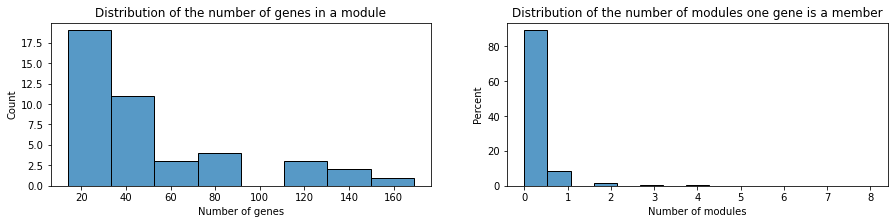

Number of genes in a module : 
- Mean : 51.21 
- Median : 39.0 
- Max : 169 
- Min : 14 

Number of modules per gene : 
- Mean : 0.15 
- Median : 0.0 
- Max : 8 
- Min : 0 

89.09 % of genes are not included in any module.
8.63 % of genes are included in only one module.
2.28 % of genes are included in more than one module.


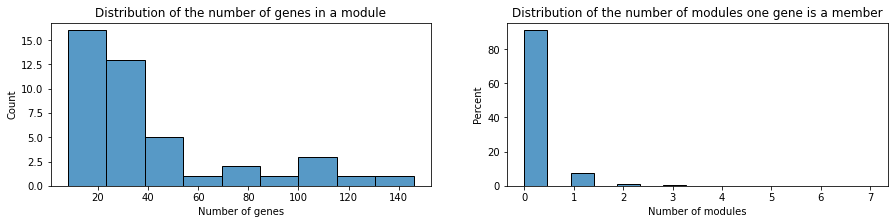

Number of genes in a module : 
- Mean : 40.58 
- Median : 27.0 
- Max : 146 
- Min : 8 

Number of modules per gene : 
- Mean : 0.12 
- Median : 0.0 
- Max : 7 
- Min : 0 

90.92 % of genes are not included in any module.
7.38 % of genes are included in only one module.
1.69 % of genes are included in more than one module.


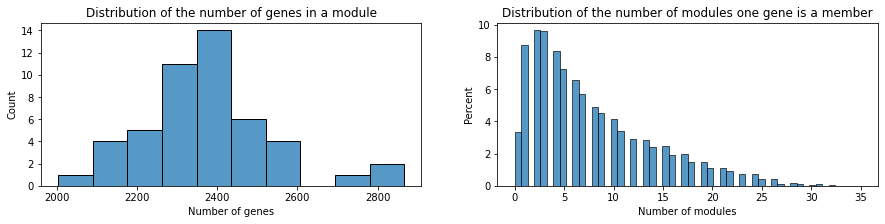

Number of genes in a module : 
- Mean : 2378.21 
- Median : 2370.0 
- Max : 2866 
- Min : 2004 

Number of modules per gene : 
- Mean : 7.71 
- Median : 6.0 
- Max : 35 
- Min : 0 

3.31 % of genes are not included in any module.
8.76 % of genes are included in only one module.
87.93 % of genes are included in more than one module.


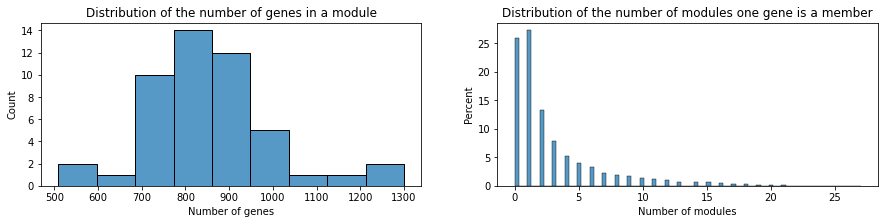

Number of genes in a module : 
- Mean : 860.02 
- Median : 844.5 
- Max : 1300 
- Min : 509 

Number of modules per gene : 
- Mean : 2.79 
- Median : 1.0 
- Max : 27 
- Min : 0 

25.94 % of genes are not included in any module.
27.28 % of genes are included in only one module.
46.78 % of genes are included in more than one module.


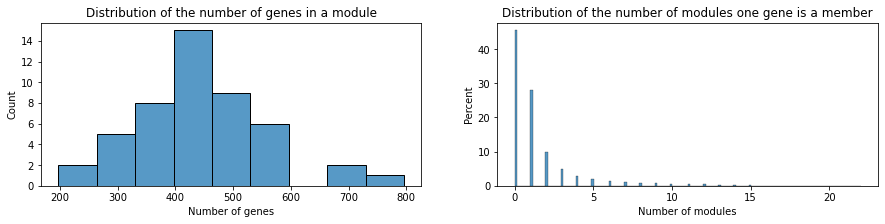

Number of genes in a module : 
- Mean : 445.56 
- Median : 418.0 
- Max : 796 
- Min : 197 

Number of modules per gene : 
- Mean : 1.44 
- Median : 1.0 
- Max : 22 
- Min : 0 

45.43 % of genes are not included in any module.
28.14 % of genes are included in only one module.
26.44 % of genes are included in more than one module.


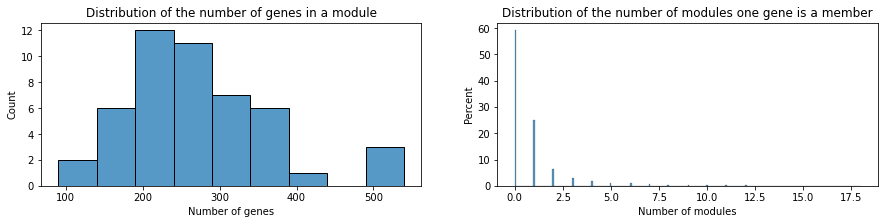

Number of genes in a module : 
- Mean : 271.90 
- Median : 256.0 
- Max : 540 
- Min : 90 

Number of modules per gene : 
- Mean : 0.88 
- Median : 0.0 
- Max : 18 
- Min : 0 

59.09 % of genes are not included in any module.
25.08 % of genes are included in only one module.
15.83 % of genes are included in more than one module.


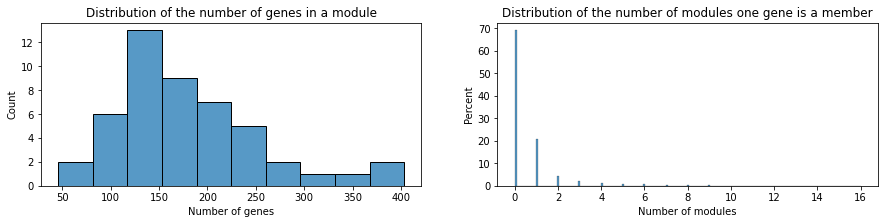

Number of genes in a module : 
- Mean : 181.50 
- Median : 167.5 
- Max : 403 
- Min : 46 

Number of modules per gene : 
- Mean : 0.59 
- Median : 0.0 
- Max : 16 
- Min : 0 

68.99 % of genes are not included in any module.
20.77 % of genes are included in only one module.
10.24 % of genes are included in more than one module.


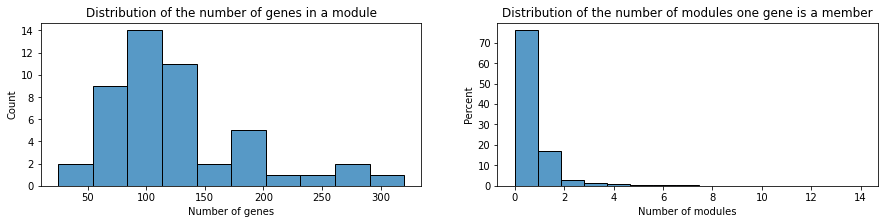

Number of genes in a module : 
- Mean : 127.73 
- Median : 111.5 
- Max : 320 
- Min : 25 

Number of modules per gene : 
- Mean : 0.41 
- Median : 0.0 
- Max : 14 
- Min : 0 

75.91 % of genes are not included in any module.
17.06 % of genes are included in only one module.
7.03 % of genes are included in more than one module.


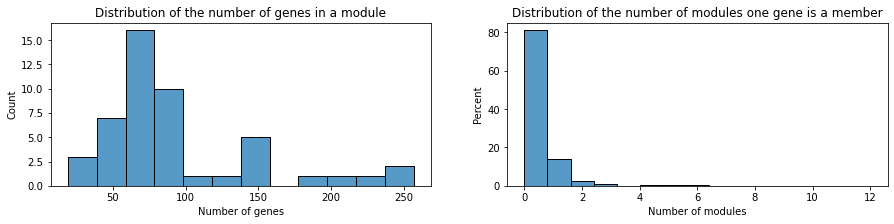

Number of genes in a module : 
- Mean : 93.71 
- Median : 75.0 
- Max : 257 
- Min : 19 

Number of modules per gene : 
- Mean : 0.30 
- Median : 0.0 
- Max : 12 
- Min : 0 

81.02 % of genes are not included in any module.
13.94 % of genes are included in only one module.
5.04 % of genes are included in more than one module.


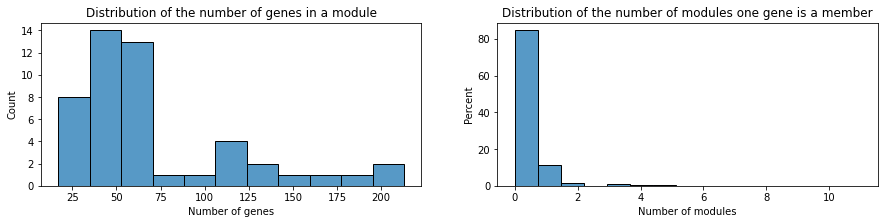

Number of genes in a module : 
- Mean : 72.23 
- Median : 56.5 
- Max : 213 
- Min : 17 

Number of modules per gene : 
- Mean : 0.23 
- Median : 0.0 
- Max : 11 
- Min : 0 

84.64 % of genes are not included in any module.
11.59 % of genes are included in only one module.
3.76 % of genes are included in more than one module.


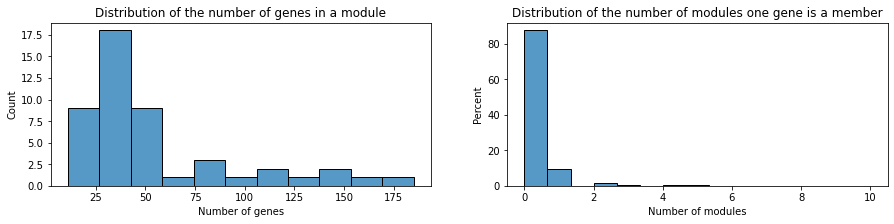

Number of genes in a module : 
- Mean : 55.12 
- Median : 39.0 
- Max : 185 
- Min : 11 

Number of modules per gene : 
- Mean : 0.18 
- Median : 0.0 
- Max : 10 
- Min : 0 

87.60 % of genes are not included in any module.
9.66 % of genes are included in only one module.
2.73 % of genes are included in more than one module.


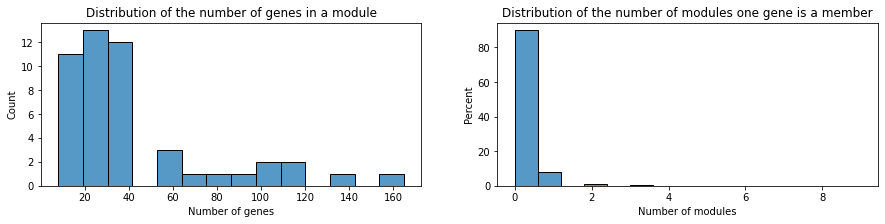

Number of genes in a module : 
- Mean : 43.67 
- Median : 30.5 
- Max : 165 
- Min : 8 

Number of modules per gene : 
- Mean : 0.14 
- Median : 0.0 
- Max : 9 
- Min : 0 

89.82 % of genes are not included in any module.
8.05 % of genes are included in only one module.
2.13 % of genes are included in more than one module.


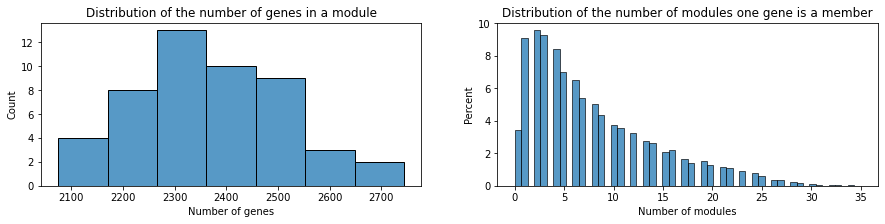

Number of genes in a module : 
- Mean : 2373.80 
- Median : 2361.0 
- Max : 2744 
- Min : 2075 

Number of modules per gene : 
- Mean : 7.85 
- Median : 6.0 
- Max : 35 
- Min : 0 

3.41 % of genes are not included in any module.
9.10 % of genes are included in only one module.
87.49 % of genes are included in more than one module.


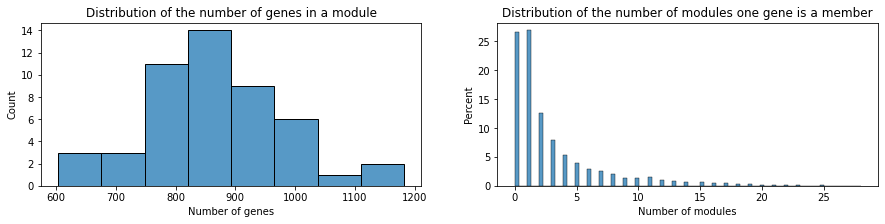

Number of genes in a module : 
- Mean : 867.63 
- Median : 860.0 
- Max : 1182 
- Min : 604 

Number of modules per gene : 
- Mean : 2.87 
- Median : 1.0 
- Max : 28 
- Min : 0 

26.60 % of genes are not included in any module.
26.90 % of genes are included in only one module.
46.50 % of genes are included in more than one module.


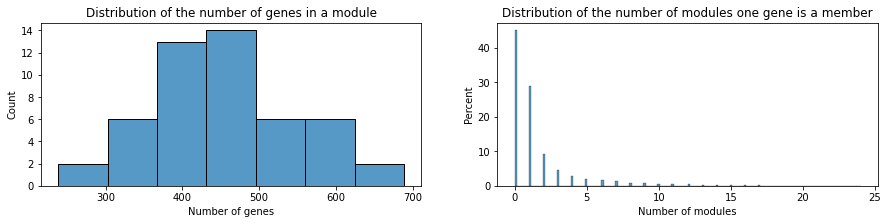

Number of genes in a module : 
- Mean : 453.24 
- Median : 453.0 
- Max : 689 
- Min : 238 

Number of modules per gene : 
- Mean : 1.50 
- Median : 1.0 
- Max : 24 
- Min : 0 

44.99 % of genes are not included in any module.
28.81 % of genes are included in only one module.
26.20 % of genes are included in more than one module.


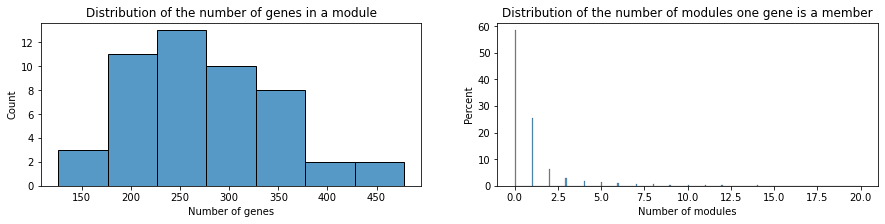

Number of genes in a module : 
- Mean : 278.35 
- Median : 268.0 
- Max : 478 
- Min : 126 

Number of modules per gene : 
- Mean : 0.92 
- Median : 0.0 
- Max : 20 
- Min : 0 

58.36 % of genes are not included in any module.
25.53 % of genes are included in only one module.
16.11 % of genes are included in more than one module.


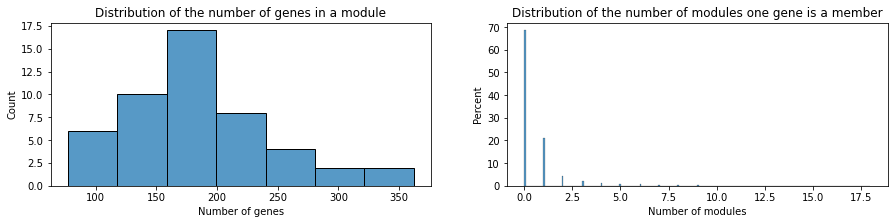

Number of genes in a module : 
- Mean : 184.29 
- Median : 176.0 
- Max : 362 
- Min : 77 

Number of modules per gene : 
- Mean : 0.61 
- Median : 0.0 
- Max : 18 
- Min : 0 

68.53 % of genes are not included in any module.
21.03 % of genes are included in only one module.
10.44 % of genes are included in more than one module.


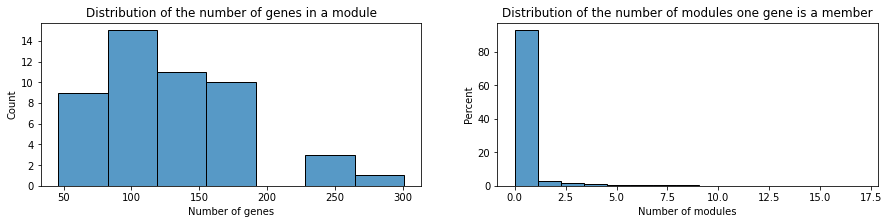

Number of genes in a module : 
- Mean : 129.63 
- Median : 119.0 
- Max : 301 
- Min : 46 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 17 
- Min : 0 

75.75 % of genes are not included in any module.
17.06 % of genes are included in only one module.
7.19 % of genes are included in more than one module.


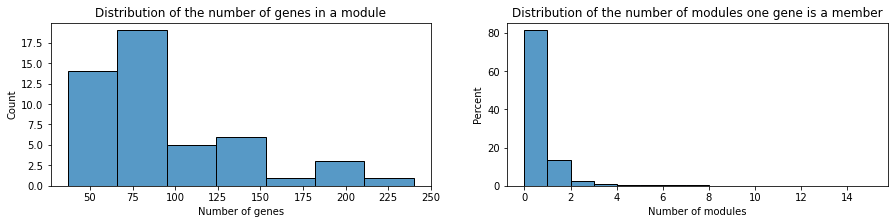

Number of genes in a module : 
- Mean : 93.29 
- Median : 82.0 
- Max : 240 
- Min : 37 

Number of modules per gene : 
- Mean : 0.31 
- Median : 0.0 
- Max : 15 
- Min : 0 

81.25 % of genes are not included in any module.
13.60 % of genes are included in only one module.
5.15 % of genes are included in more than one module.


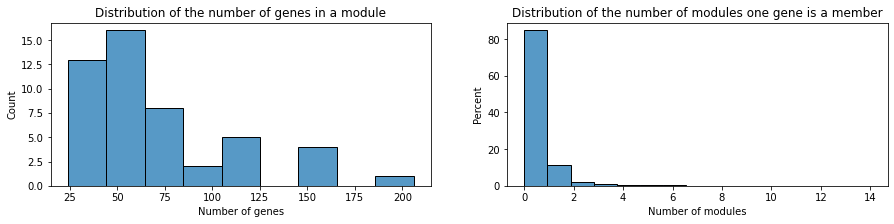

Number of genes in a module : 
- Mean : 71.31 
- Median : 61.0 
- Max : 206 
- Min : 24 

Number of modules per gene : 
- Mean : 0.24 
- Median : 0.0 
- Max : 14 
- Min : 0 

84.66 % of genes are not included in any module.
11.55 % of genes are included in only one module.
3.79 % of genes are included in more than one module.


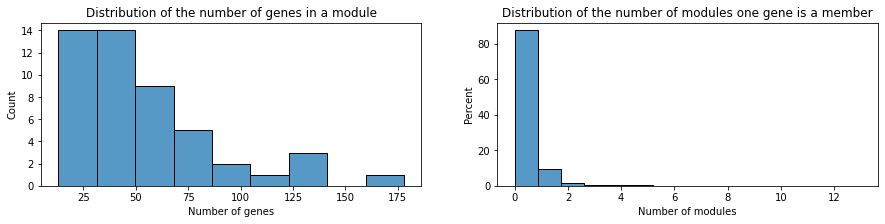

Number of genes in a module : 
- Mean : 55.65 
- Median : 45.0 
- Max : 178 
- Min : 13 

Number of modules per gene : 
- Mean : 0.18 
- Median : 0.0 
- Max : 13 
- Min : 0 

87.54 % of genes are not included in any module.
9.55 % of genes are included in only one module.
2.91 % of genes are included in more than one module.


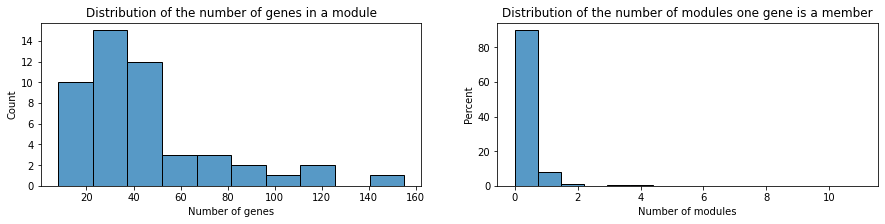

Number of genes in a module : 
- Mean : 44.18 
- Median : 36.0 
- Max : 155 
- Min : 8 

Number of modules per gene : 
- Mean : 0.15 
- Median : 0.0 
- Max : 11 
- Min : 0 

89.71 % of genes are not included in any module.
8.12 % of genes are included in only one module.
2.17 % of genes are included in more than one module.


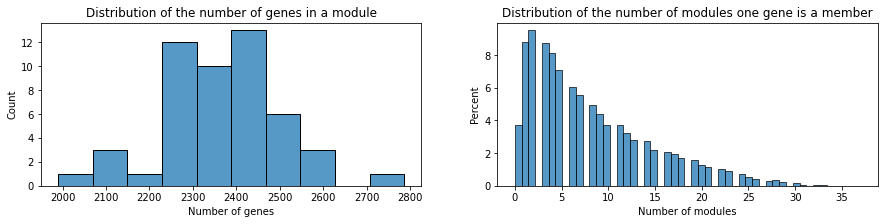

Number of genes in a module : 
- Mean : 2363.82 
- Median : 2369.0 
- Max : 2786 
- Min : 1990 

Number of modules per gene : 
- Mean : 7.98 
- Median : 6.0 
- Max : 37 
- Min : 0 

3.69 % of genes are not included in any module.
8.82 % of genes are included in only one module.
87.49 % of genes are included in more than one module.


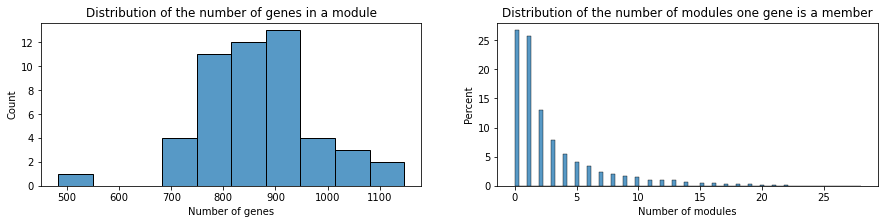

Number of genes in a module : 
- Mean : 862.84 
- Median : 841.5 
- Max : 1147 
- Min : 483 

Number of modules per gene : 
- Mean : 2.91 
- Median : 1.0 
- Max : 28 
- Min : 0 

26.67 % of genes are not included in any module.
25.72 % of genes are included in only one module.
47.61 % of genes are included in more than one module.


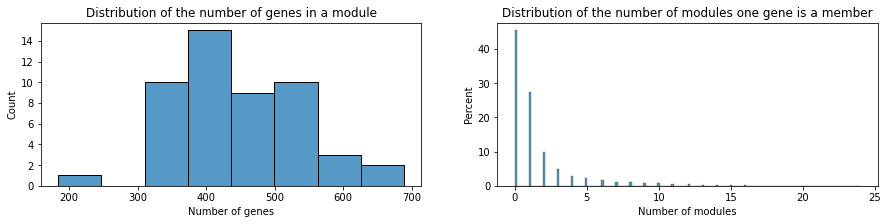

Number of genes in a module : 
- Mean : 446.16 
- Median : 429.5 
- Max : 689 
- Min : 184 

Number of modules per gene : 
- Mean : 1.51 
- Median : 1.0 
- Max : 24 
- Min : 0 

45.34 % of genes are not included in any module.
27.52 % of genes are included in only one module.
27.13 % of genes are included in more than one module.


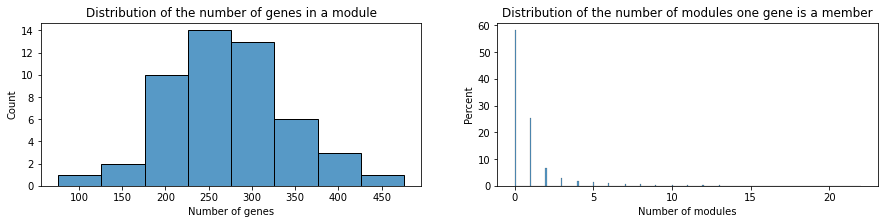

Number of genes in a module : 
- Mean : 274.00 
- Median : 266.0 
- Max : 476 
- Min : 76 

Number of modules per gene : 
- Mean : 0.93 
- Median : 0.0 
- Max : 22 
- Min : 0 

58.13 % of genes are not included in any module.
25.36 % of genes are included in only one module.
16.51 % of genes are included in more than one module.


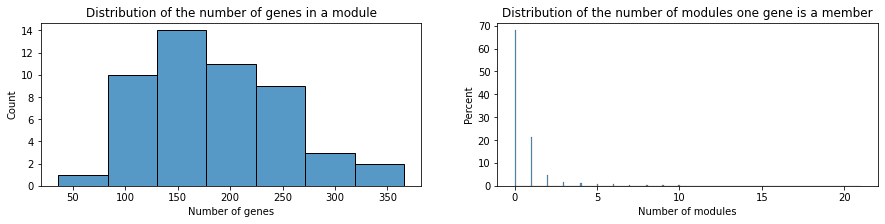

Number of genes in a module : 
- Mean : 184.26 
- Median : 175.5 
- Max : 366 
- Min : 36 

Number of modules per gene : 
- Mean : 0.62 
- Median : 0.0 
- Max : 21 
- Min : 0 

67.92 % of genes are not included in any module.
21.26 % of genes are included in only one module.
10.81 % of genes are included in more than one module.


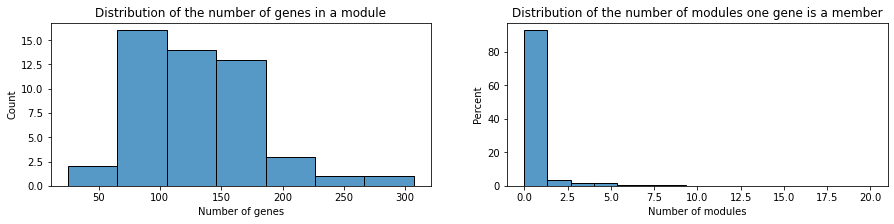

Number of genes in a module : 
- Mean : 130.38 
- Median : 123.0 
- Max : 307 
- Min : 25 

Number of modules per gene : 
- Mean : 0.44 
- Median : 0.0 
- Max : 20 
- Min : 0 

75.15 % of genes are not included in any module.
17.42 % of genes are included in only one module.
7.43 % of genes are included in more than one module.


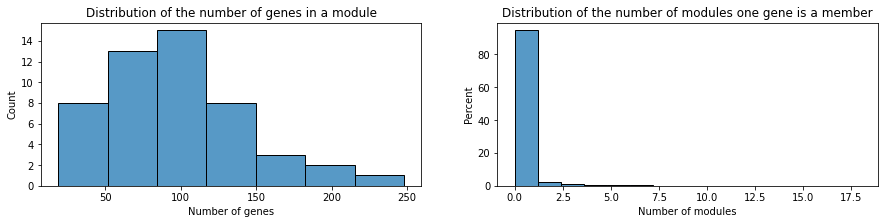

Number of genes in a module : 
- Mean : 96.46 
- Median : 90.5 
- Max : 248 
- Min : 19 

Number of modules per gene : 
- Mean : 0.33 
- Median : 0.0 
- Max : 18 
- Min : 0 

80.26 % of genes are not included in any module.
14.29 % of genes are included in only one module.
5.46 % of genes are included in more than one module.


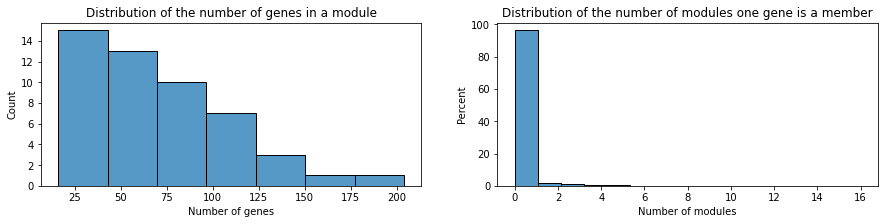

Number of genes in a module : 
- Mean : 72.24 
- Median : 63.5 
- Max : 204 
- Min : 16 

Number of modules per gene : 
- Mean : 0.24 
- Median : 0.0 
- Max : 16 
- Min : 0 

84.10 % of genes are not included in any module.
12.10 % of genes are included in only one module.
3.80 % of genes are included in more than one module.


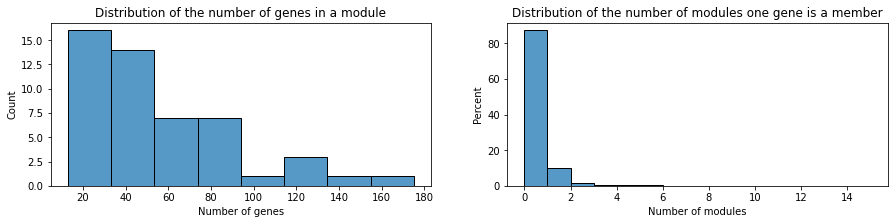

Number of genes in a module : 
- Mean : 55.38 
- Median : 47.0 
- Max : 175 
- Min : 13 

Number of modules per gene : 
- Mean : 0.19 
- Median : 0.0 
- Max : 15 
- Min : 0 

87.25 % of genes are not included in any module.
9.89 % of genes are included in only one module.
2.86 % of genes are included in more than one module.


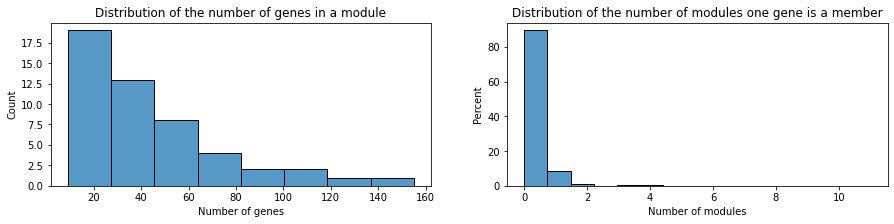

Number of genes in a module : 
- Mean : 44.38 
- Median : 38.0 
- Max : 155 
- Min : 9 

Number of modules per gene : 
- Mean : 0.15 
- Median : 0.0 
- Max : 11 
- Min : 0 

89.40 % of genes are not included in any module.
8.35 % of genes are included in only one module.
2.25 % of genes are included in more than one module.


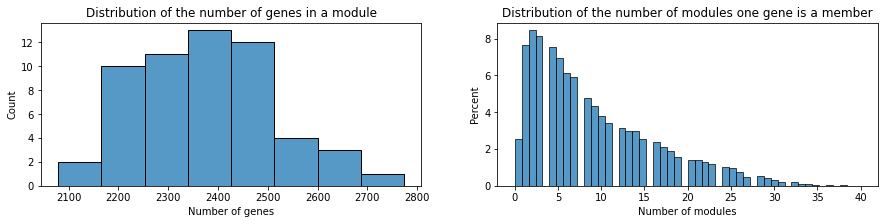

Number of genes in a module : 
- Mean : 2378.18 
- Median : 2378.5 
- Max : 2774 
- Min : 2079 

Number of modules per gene : 
- Mean : 8.99 
- Median : 7.0 
- Max : 40 
- Min : 0 

2.55 % of genes are not included in any module.
7.66 % of genes are included in only one module.
89.79 % of genes are included in more than one module.


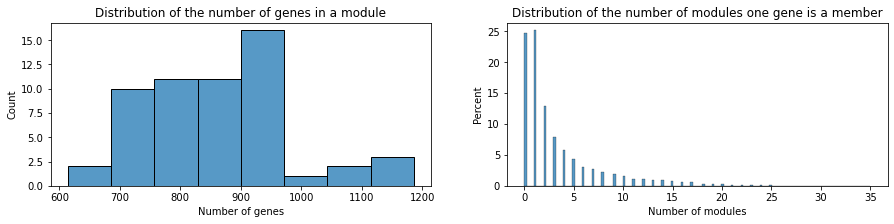

Number of genes in a module : 
- Mean : 862.00 
- Median : 868.5 
- Max : 1186 
- Min : 614 

Number of modules per gene : 
- Mean : 3.26 
- Median : 2.0 
- Max : 35 
- Min : 0 

24.72 % of genes are not included in any module.
25.11 % of genes are included in only one module.
50.17 % of genes are included in more than one module.


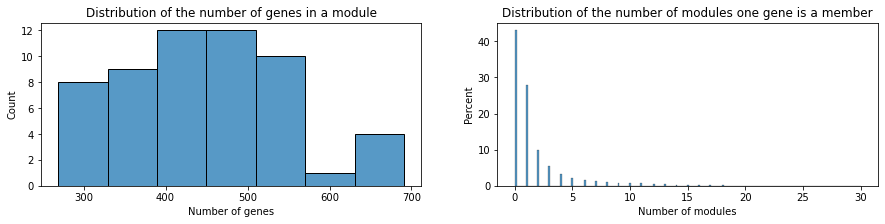

Number of genes in a module : 
- Mean : 447.52 
- Median : 442.0 
- Max : 691 
- Min : 269 

Number of modules per gene : 
- Mean : 1.69 
- Median : 1.0 
- Max : 30 
- Min : 0 

43.02 % of genes are not included in any module.
27.86 % of genes are included in only one module.
29.12 % of genes are included in more than one module.


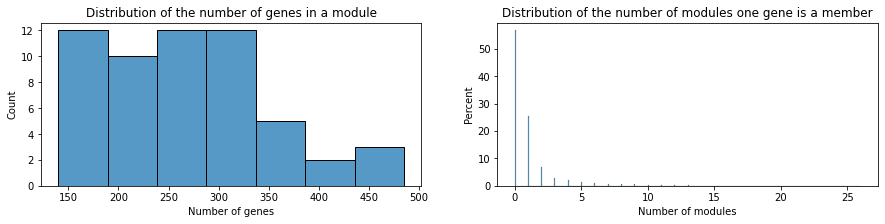

Number of genes in a module : 
- Mean : 272.55 
- Median : 279.0 
- Max : 485 
- Min : 140 

Number of modules per gene : 
- Mean : 1.03 
- Median : 0.0 
- Max : 26 
- Min : 0 

56.69 % of genes are not included in any module.
25.42 % of genes are included in only one module.
17.89 % of genes are included in more than one module.


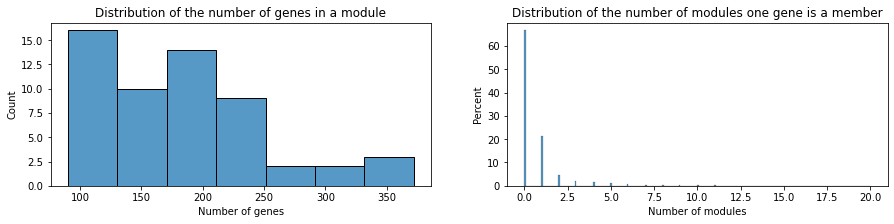

Number of genes in a module : 
- Mean : 182.32 
- Median : 184.0 
- Max : 372 
- Min : 90 

Number of modules per gene : 
- Mean : 0.69 
- Median : 0.0 
- Max : 20 
- Min : 0 

66.66 % of genes are not included in any module.
21.47 % of genes are included in only one module.
11.88 % of genes are included in more than one module.


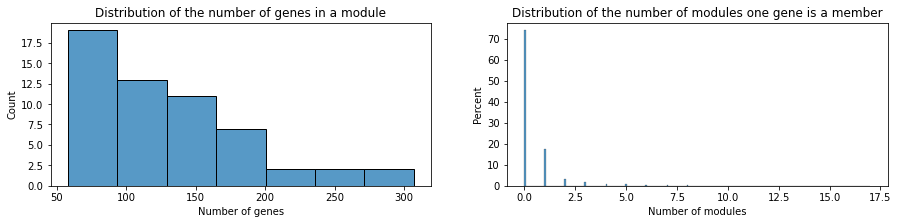

Number of genes in a module : 
- Mean : 129.61 
- Median : 123.5 
- Max : 307 
- Min : 58 

Number of modules per gene : 
- Mean : 0.49 
- Median : 0.0 
- Max : 17 
- Min : 0 

73.95 % of genes are not included in any module.
17.70 % of genes are included in only one module.
8.35 % of genes are included in more than one module.


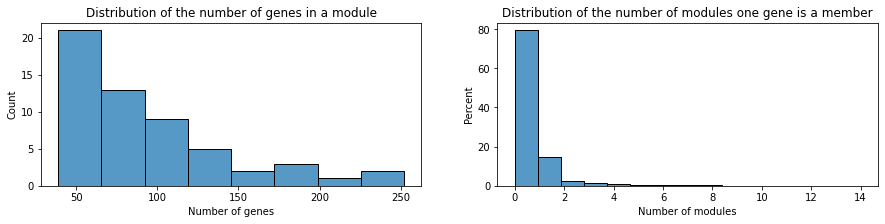

Number of genes in a module : 
- Mean : 95.52 
- Median : 81.0 
- Max : 252 
- Min : 39 

Number of modules per gene : 
- Mean : 0.36 
- Median : 0.0 
- Max : 14 
- Min : 0 

79.30 % of genes are not included in any module.
14.62 % of genes are included in only one module.
6.08 % of genes are included in more than one module.


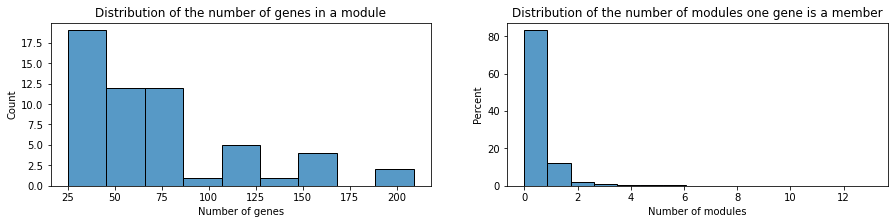

Number of genes in a module : 
- Mean : 72.84 
- Median : 57.0 
- Max : 209 
- Min : 25 

Number of modules per gene : 
- Mean : 0.28 
- Median : 0.0 
- Max : 13 
- Min : 0 

83.06 % of genes are not included in any module.
12.35 % of genes are included in only one module.
4.59 % of genes are included in more than one module.


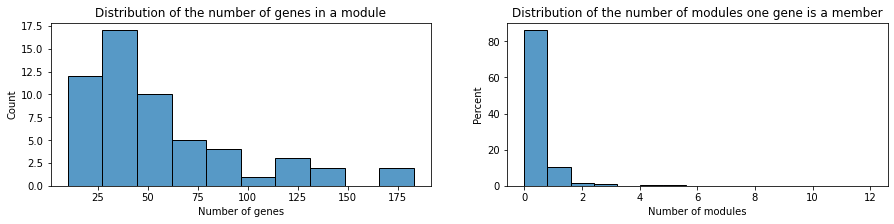

Number of genes in a module : 
- Mean : 56.55 
- Median : 42.0 
- Max : 183 
- Min : 10 

Number of modules per gene : 
- Mean : 0.21 
- Median : 0.0 
- Max : 12 
- Min : 0 

86.02 % of genes are not included in any module.
10.53 % of genes are included in only one module.
3.44 % of genes are included in more than one module.


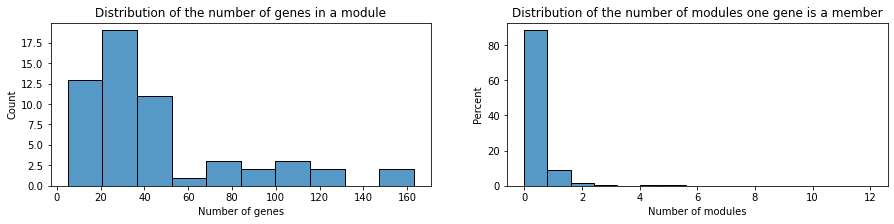

Number of genes in a module : 
- Mean : 45.32 
- Median : 28.5 
- Max : 163 
- Min : 5 

Number of modules per gene : 
- Mean : 0.17 
- Median : 0.0 
- Max : 12 
- Min : 0 

88.34 % of genes are not included in any module.
9.01 % of genes are included in only one module.
2.65 % of genes are included in more than one module.


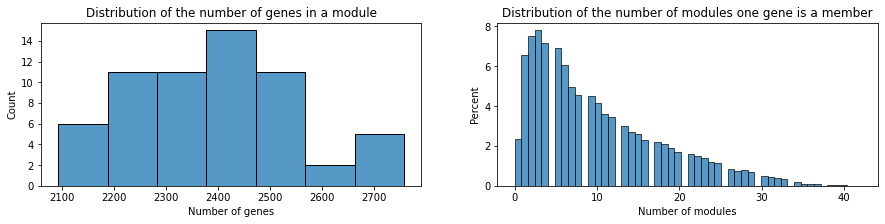

Number of genes in a module : 
- Mean : 2389.46 
- Median : 2386.0 
- Max : 2759 
- Min : 2092 

Number of modules per gene : 
- Mean : 9.84 
- Median : 8.0 
- Max : 42 
- Min : 0 

2.34 % of genes are not included in any module.
6.54 % of genes are included in only one module.
91.12 % of genes are included in more than one module.


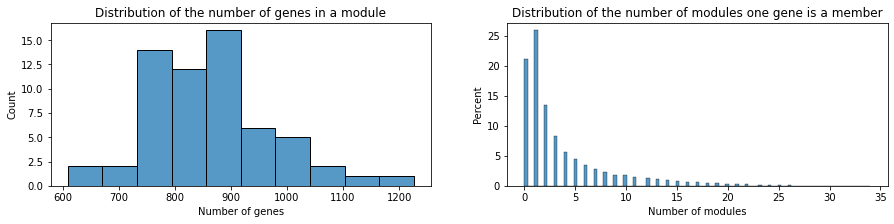

Number of genes in a module : 
- Mean : 865.31 
- Median : 857.0 
- Max : 1226 
- Min : 609 

Number of modules per gene : 
- Mean : 3.56 
- Median : 2.0 
- Max : 34 
- Min : 0 

21.09 % of genes are not included in any module.
25.86 % of genes are included in only one module.
53.06 % of genes are included in more than one module.


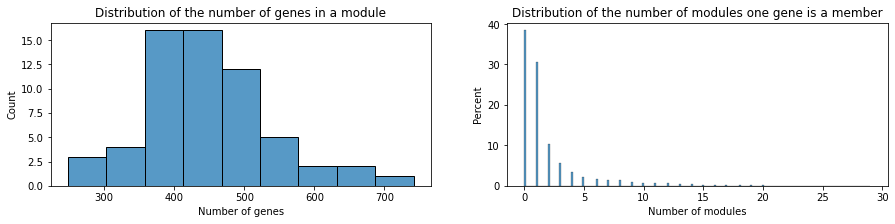

Number of genes in a module : 
- Mean : 447.90 
- Median : 448.0 
- Max : 742 
- Min : 248 

Number of modules per gene : 
- Mean : 1.84 
- Median : 1.0 
- Max : 29 
- Min : 0 

38.40 % of genes are not included in any module.
30.58 % of genes are included in only one module.
31.01 % of genes are included in more than one module.


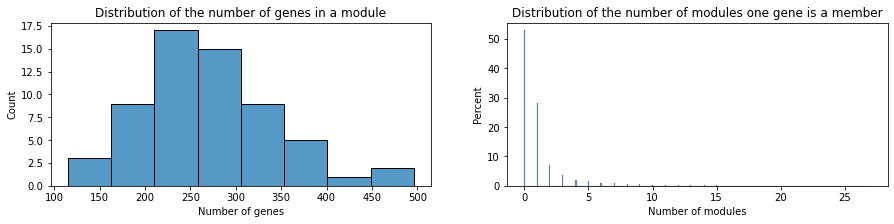

Number of genes in a module : 
- Mean : 271.16 
- Median : 265.0 
- Max : 496 
- Min : 115 

Number of modules per gene : 
- Mean : 1.12 
- Median : 0.0 
- Max : 27 
- Min : 0 

52.88 % of genes are not included in any module.
28.12 % of genes are included in only one module.
19.00 % of genes are included in more than one module.


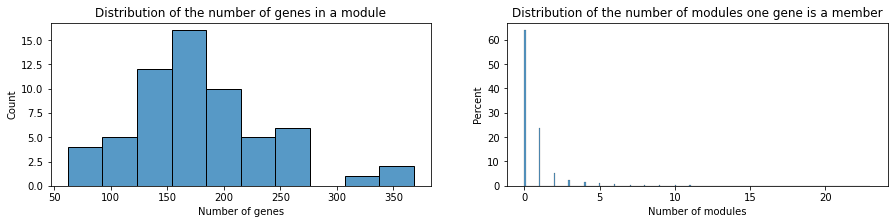

Number of genes in a module : 
- Mean : 179.13 
- Median : 164.0 
- Max : 368 
- Min : 62 

Number of modules per gene : 
- Mean : 0.74 
- Median : 0.0 
- Max : 23 
- Min : 0 

63.79 % of genes are not included in any module.
23.76 % of genes are included in only one module.
12.46 % of genes are included in more than one module.


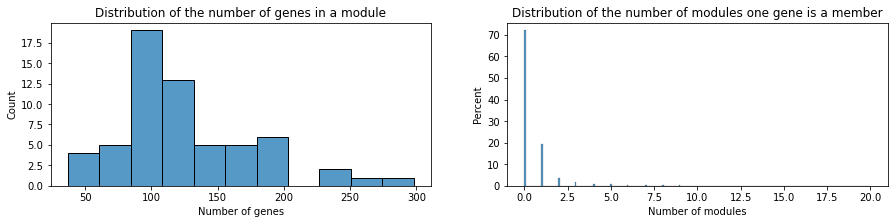

Number of genes in a module : 
- Mean : 126.56 
- Median : 119.0 
- Max : 298 
- Min : 37 

Number of modules per gene : 
- Mean : 0.52 
- Median : 0.0 
- Max : 20 
- Min : 0 

72.02 % of genes are not included in any module.
19.33 % of genes are included in only one module.
8.65 % of genes are included in more than one module.


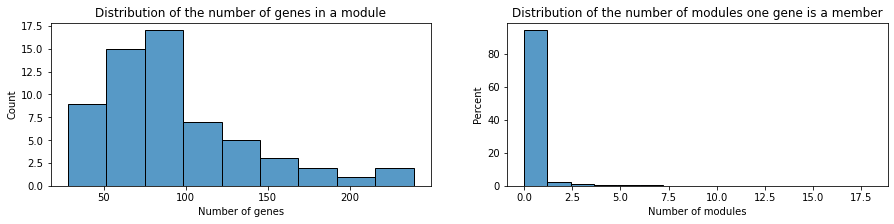

Number of genes in a module : 
- Mean : 93.16 
- Median : 82.0 
- Max : 239 
- Min : 28 

Number of modules per gene : 
- Mean : 0.38 
- Median : 0.0 
- Max : 18 
- Min : 0 

77.95 % of genes are not included in any module.
16.02 % of genes are included in only one module.
6.03 % of genes are included in more than one module.


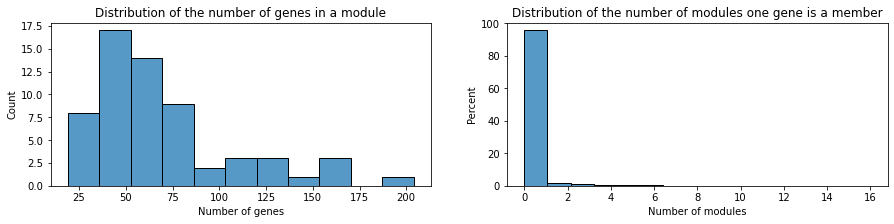

Number of genes in a module : 
- Mean : 70.05 
- Median : 61.0 
- Max : 204 
- Min : 19 

Number of modules per gene : 
- Mean : 0.29 
- Median : 0.0 
- Max : 16 
- Min : 0 

82.36 % of genes are not included in any module.
13.20 % of genes are included in only one module.
4.44 % of genes are included in more than one module.


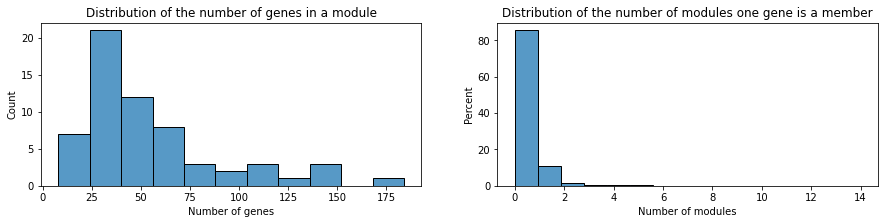

Number of genes in a module : 
- Mean : 55.16 
- Median : 45.0 
- Max : 184 
- Min : 8 

Number of modules per gene : 
- Mean : 0.23 
- Median : 0.0 
- Max : 14 
- Min : 0 

85.33 % of genes are not included in any module.
11.15 % of genes are included in only one module.
3.52 % of genes are included in more than one module.


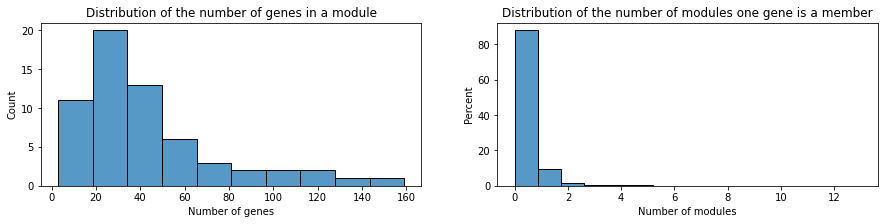

Number of genes in a module : 
- Mean : 43.69 
- Median : 34.0 
- Max : 159 
- Min : 3 

Number of modules per gene : 
- Mean : 0.18 
- Median : 0.0 
- Max : 13 
- Min : 0 

87.81 % of genes are not included in any module.
9.41 % of genes are included in only one module.
2.78 % of genes are included in more than one module.


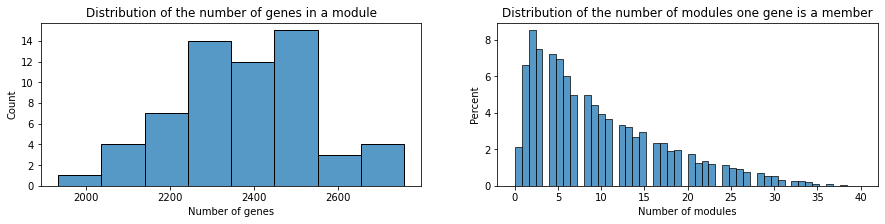

Number of genes in a module : 
- Mean : 2369.98 
- Median : 2368.5 
- Max : 2758 
- Min : 1935 

Number of modules per gene : 
- Mean : 9.60 
- Median : 8.0 
- Max : 40 
- Min : 0 

2.13 % of genes are not included in any module.
6.63 % of genes are included in only one module.
91.24 % of genes are included in more than one module.


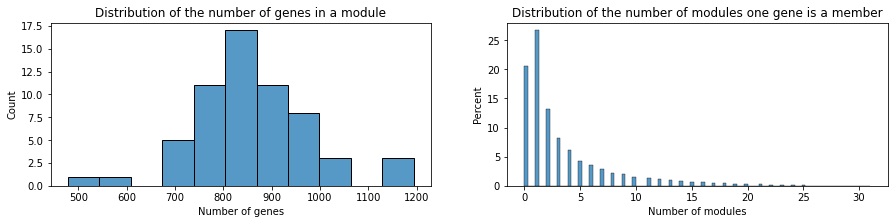

Number of genes in a module : 
- Mean : 860.70 
- Median : 850.0 
- Max : 1194 
- Min : 478 

Number of modules per gene : 
- Mean : 3.49 
- Median : 2.0 
- Max : 31 
- Min : 0 

20.64 % of genes are not included in any module.
26.68 % of genes are included in only one module.
52.68 % of genes are included in more than one module.


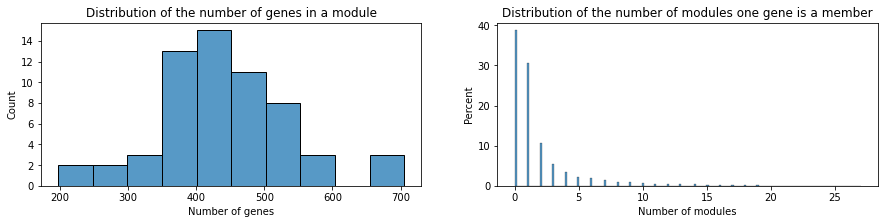

Number of genes in a module : 
- Mean : 441.02 
- Median : 442.0 
- Max : 705 
- Min : 198 

Number of modules per gene : 
- Mean : 1.79 
- Median : 1.0 
- Max : 27 
- Min : 0 

38.69 % of genes are not included in any module.
30.64 % of genes are included in only one module.
30.68 % of genes are included in more than one module.


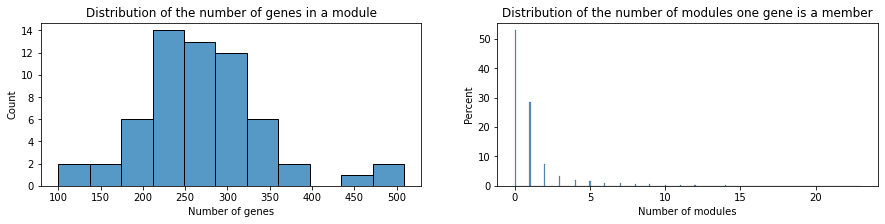

Number of genes in a module : 
- Mean : 268.48 
- Median : 257.0 
- Max : 509 
- Min : 100 

Number of modules per gene : 
- Mean : 1.09 
- Median : 0.0 
- Max : 23 
- Min : 0 

52.77 % of genes are not included in any module.
28.34 % of genes are included in only one module.
18.89 % of genes are included in more than one module.


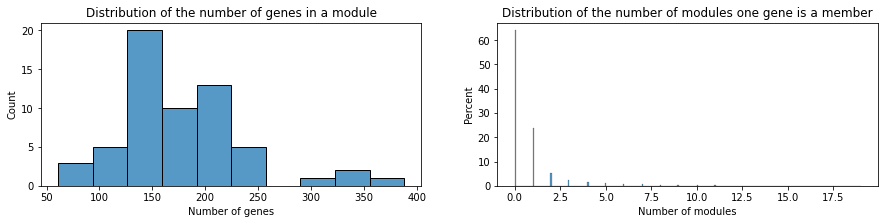

Number of genes in a module : 
- Mean : 177.95 
- Median : 168.5 
- Max : 388 
- Min : 61 

Number of modules per gene : 
- Mean : 0.72 
- Median : 0.0 
- Max : 19 
- Min : 0 

63.99 % of genes are not included in any module.
23.65 % of genes are included in only one module.
12.36 % of genes are included in more than one module.


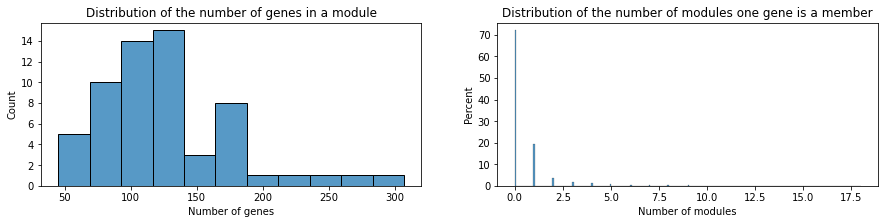

Number of genes in a module : 
- Mean : 124.68 
- Median : 117.0 
- Max : 307 
- Min : 45 

Number of modules per gene : 
- Mean : 0.51 
- Median : 0.0 
- Max : 18 
- Min : 0 

72.03 % of genes are not included in any module.
19.58 % of genes are included in only one module.
8.39 % of genes are included in more than one module.


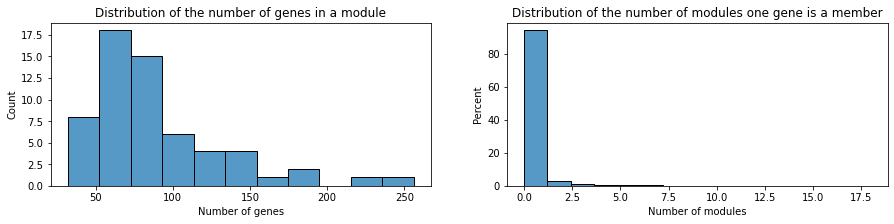

Number of genes in a module : 
- Mean : 90.32 
- Median : 81.0 
- Max : 256 
- Min : 32 

Number of modules per gene : 
- Mean : 0.37 
- Median : 0.0 
- Max : 18 
- Min : 0 

78.02 % of genes are not included in any module.
16.00 % of genes are included in only one module.
5.98 % of genes are included in more than one module.


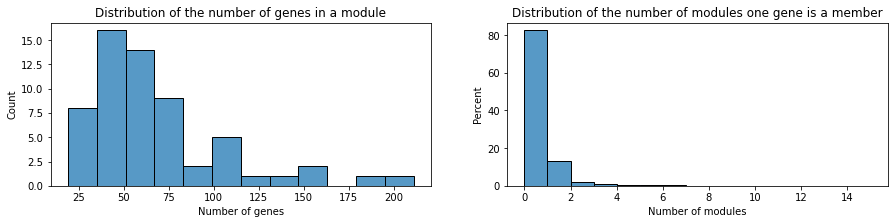

Number of genes in a module : 
- Mean : 68.55 
- Median : 60.0 
- Max : 211 
- Min : 19 

Number of modules per gene : 
- Mean : 0.28 
- Median : 0.0 
- Max : 15 
- Min : 0 

82.44 % of genes are not included in any module.
13.05 % of genes are included in only one module.
4.51 % of genes are included in more than one module.


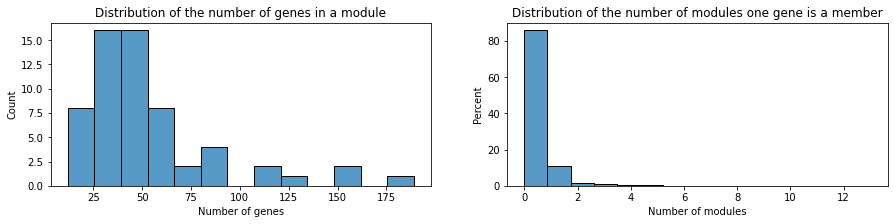

Number of genes in a module : 
- Mean : 53.47 
- Median : 47.0 
- Max : 189 
- Min : 12 

Number of modules per gene : 
- Mean : 0.22 
- Median : 0.0 
- Max : 13 
- Min : 0 

85.68 % of genes are not included in any module.
10.84 % of genes are included in only one module.
3.47 % of genes are included in more than one module.


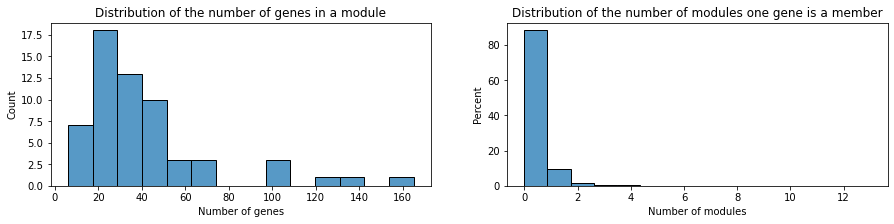

Number of genes in a module : 
- Mean : 42.18 
- Median : 32.5 
- Max : 165 
- Min : 6 

Number of modules per gene : 
- Mean : 0.17 
- Median : 0.0 
- Max : 13 
- Min : 0 

88.13 % of genes are not included in any module.
9.25 % of genes are included in only one module.
2.62 % of genes are included in more than one module.


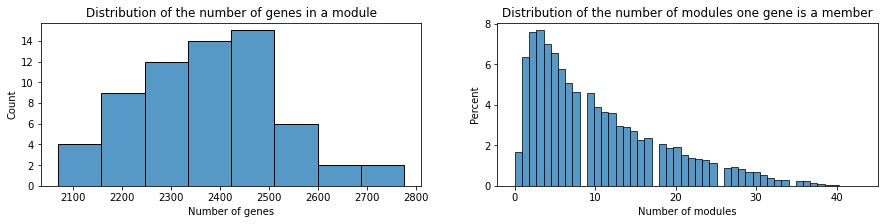

Number of genes in a module : 
- Mean : 2372.20 
- Median : 2368.0 
- Max : 2775 
- Min : 2069 

Number of modules per gene : 
- Mean : 10.25 
- Median : 8.0 
- Max : 43 
- Min : 0 

1.66 % of genes are not included in any module.
6.35 % of genes are included in only one module.
91.98 % of genes are included in more than one module.


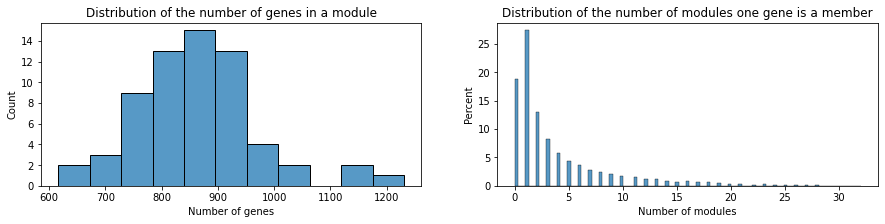

Number of genes in a module : 
- Mean : 864.50 
- Median : 858.5 
- Max : 1231 
- Min : 616 

Number of modules per gene : 
- Mean : 3.74 
- Median : 2.0 
- Max : 32 
- Min : 0 

18.77 % of genes are not included in any module.
27.35 % of genes are included in only one module.
53.88 % of genes are included in more than one module.


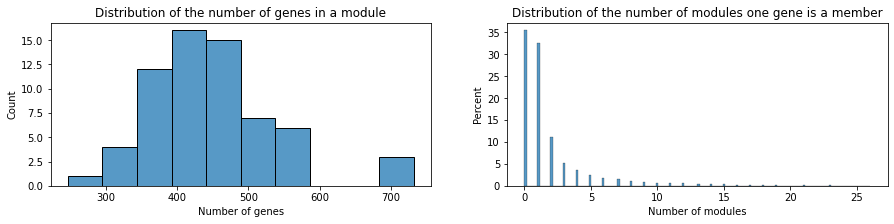

Number of genes in a module : 
- Mean : 448.77 
- Median : 437.0 
- Max : 732 
- Min : 247 

Number of modules per gene : 
- Mean : 1.94 
- Median : 1.0 
- Max : 26 
- Min : 0 

35.40 % of genes are not included in any module.
32.51 % of genes are included in only one module.
32.09 % of genes are included in more than one module.


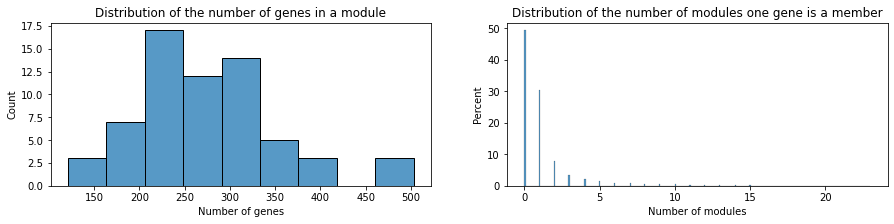

Number of genes in a module : 
- Mean : 276.03 
- Median : 262.0 
- Max : 503 
- Min : 121 

Number of modules per gene : 
- Mean : 1.19 
- Median : 1.0 
- Max : 23 
- Min : 0 

49.36 % of genes are not included in any module.
30.55 % of genes are included in only one module.
20.10 % of genes are included in more than one module.


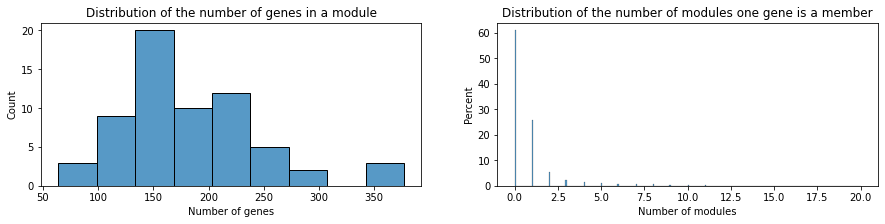

Number of genes in a module : 
- Mean : 183.72 
- Median : 170.0 
- Max : 377 
- Min : 64 

Number of modules per gene : 
- Mean : 0.79 
- Median : 0.0 
- Max : 20 
- Min : 0 

60.86 % of genes are not included in any module.
25.91 % of genes are included in only one module.
13.23 % of genes are included in more than one module.


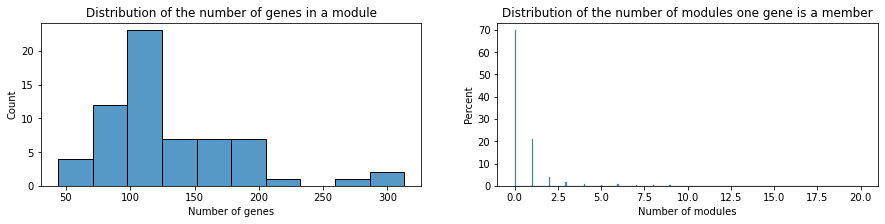

Number of genes in a module : 
- Mean : 129.38 
- Median : 115.5 
- Max : 313 
- Min : 44 

Number of modules per gene : 
- Mean : 0.56 
- Median : 0.0 
- Max : 20 
- Min : 0 

69.72 % of genes are not included in any module.
21.07 % of genes are included in only one module.
9.21 % of genes are included in more than one module.


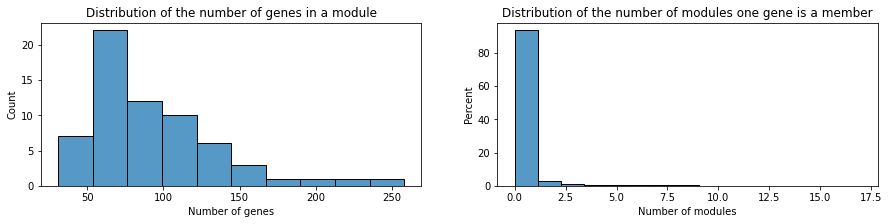

Number of genes in a module : 
- Mean : 94.09 
- Median : 81.5 
- Max : 258 
- Min : 31 

Number of modules per gene : 
- Mean : 0.41 
- Median : 0.0 
- Max : 17 
- Min : 0 

76.46 % of genes are not included in any module.
16.92 % of genes are included in only one module.
6.62 % of genes are included in more than one module.


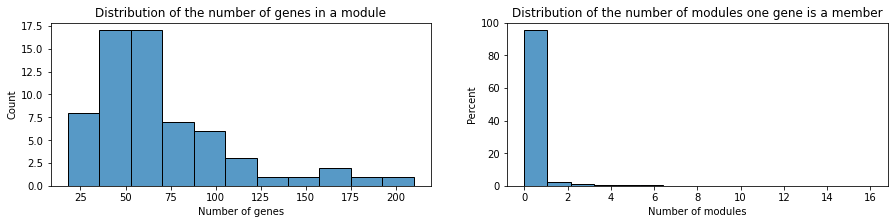

Number of genes in a module : 
- Mean : 70.61 
- Median : 60.0 
- Max : 210 
- Min : 18 

Number of modules per gene : 
- Mean : 0.31 
- Median : 0.0 
- Max : 16 
- Min : 0 

81.27 % of genes are not included in any module.
14.00 % of genes are included in only one module.
4.73 % of genes are included in more than one module.


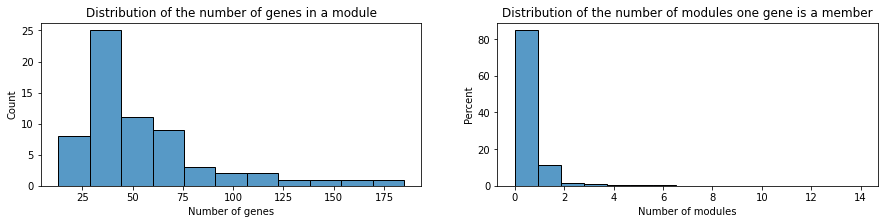

Number of genes in a module : 
- Mean : 55.19 
- Median : 43.5 
- Max : 185 
- Min : 13 

Number of modules per gene : 
- Mean : 0.24 
- Median : 0.0 
- Max : 14 
- Min : 0 

84.74 % of genes are not included in any module.
11.61 % of genes are included in only one module.
3.65 % of genes are included in more than one module.


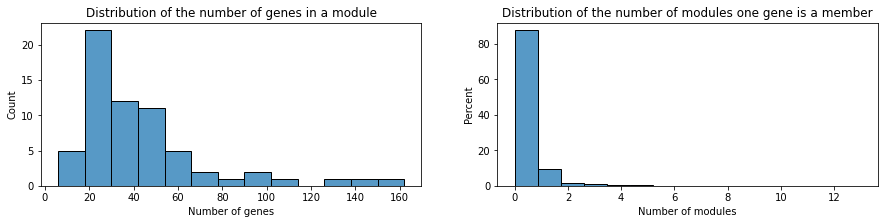

Number of genes in a module : 
- Mean : 43.59 
- Median : 31.5 
- Max : 162 
- Min : 6 

Number of modules per gene : 
- Mean : 0.19 
- Median : 0.0 
- Max : 13 
- Min : 0 

87.46 % of genes are not included in any module.
9.64 % of genes are included in only one module.
2.90 % of genes are included in more than one module.


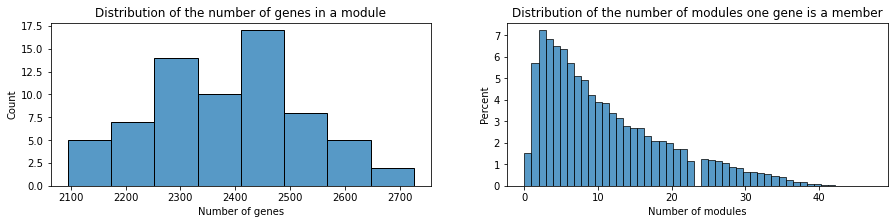

Number of genes in a module : 
- Mean : 2382.44 
- Median : 2407.0 
- Max : 2725 
- Min : 2095 

Number of modules per gene : 
- Mean : 10.94 
- Median : 9.0 
- Max : 47 
- Min : 0 

1.52 % of genes are not included in any module.
5.71 % of genes are included in only one module.
92.77 % of genes are included in more than one module.


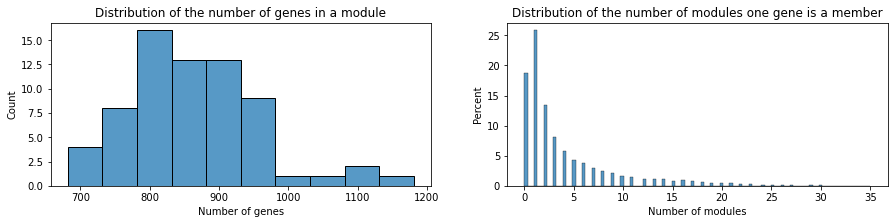

Number of genes in a module : 
- Mean : 863.99 
- Median : 852.0 
- Max : 1181 
- Min : 682 

Number of modules per gene : 
- Mean : 3.97 
- Median : 2.0 
- Max : 35 
- Min : 0 

18.82 % of genes are not included in any module.
25.80 % of genes are included in only one module.
55.38 % of genes are included in more than one module.


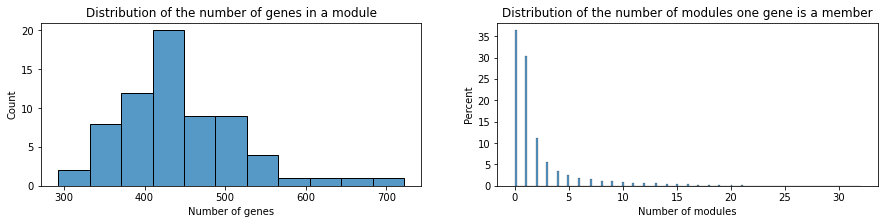

Number of genes in a module : 
- Mean : 445.96 
- Median : 436.5 
- Max : 722 
- Min : 293 

Number of modules per gene : 
- Mean : 2.05 
- Median : 1.0 
- Max : 32 
- Min : 0 

36.35 % of genes are not included in any module.
30.36 % of genes are included in only one module.
33.29 % of genes are included in more than one module.


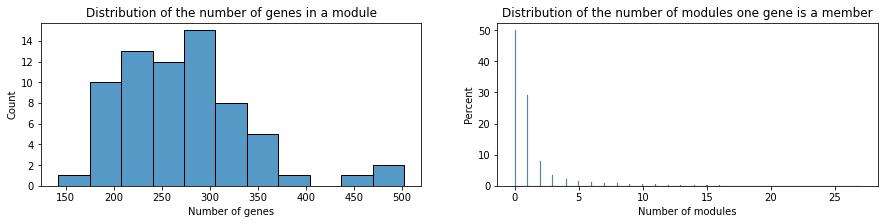

Number of genes in a module : 
- Mean : 271.90 
- Median : 264.5 
- Max : 502 
- Min : 142 

Number of modules per gene : 
- Mean : 1.25 
- Median : 1.0 
- Max : 27 
- Min : 0 

49.91 % of genes are not included in any module.
29.29 % of genes are included in only one module.
20.80 % of genes are included in more than one module.


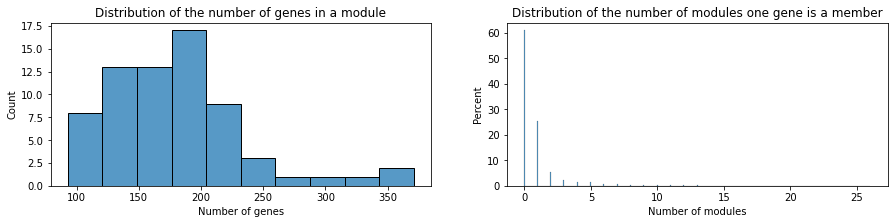

Number of genes in a module : 
- Mean : 182.96 
- Median : 175.0 
- Max : 371 
- Min : 93 

Number of modules per gene : 
- Mean : 0.84 
- Median : 0.0 
- Max : 26 
- Min : 0 

60.82 % of genes are not included in any module.
25.43 % of genes are included in only one module.
13.75 % of genes are included in more than one module.


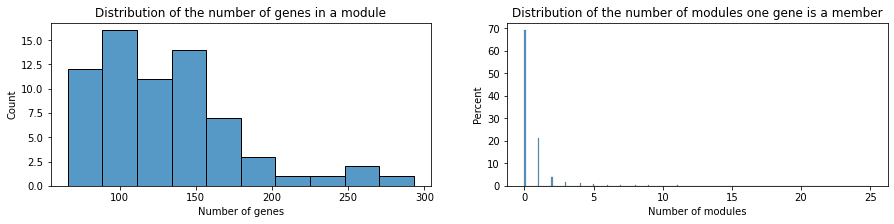

Number of genes in a module : 
- Mean : 129.76 
- Median : 120.0 
- Max : 293 
- Min : 66 

Number of modules per gene : 
- Mean : 0.60 
- Median : 0.0 
- Max : 25 
- Min : 0 

69.09 % of genes are not included in any module.
21.24 % of genes are included in only one module.
9.68 % of genes are included in more than one module.


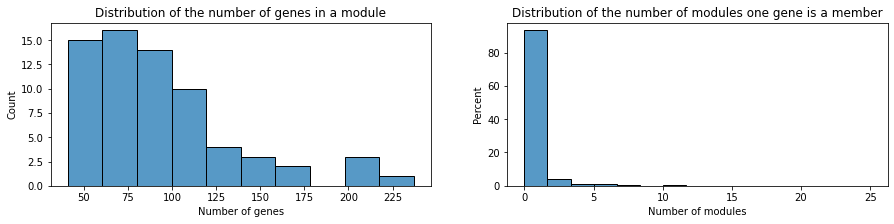

Number of genes in a module : 
- Mean : 94.40 
- Median : 85.0 
- Max : 237 
- Min : 41 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 25 
- Min : 0 

75.59 % of genes are not included in any module.
17.65 % of genes are included in only one module.
6.76 % of genes are included in more than one module.


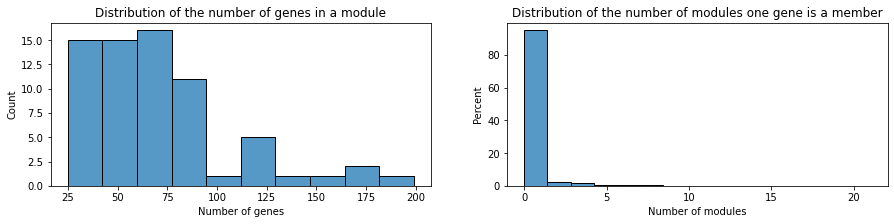

Number of genes in a module : 
- Mean : 71.40 
- Median : 65.0 
- Max : 199 
- Min : 25 

Number of modules per gene : 
- Mean : 0.33 
- Median : 0.0 
- Max : 21 
- Min : 0 

80.36 % of genes are not included in any module.
14.57 % of genes are included in only one module.
5.07 % of genes are included in more than one module.


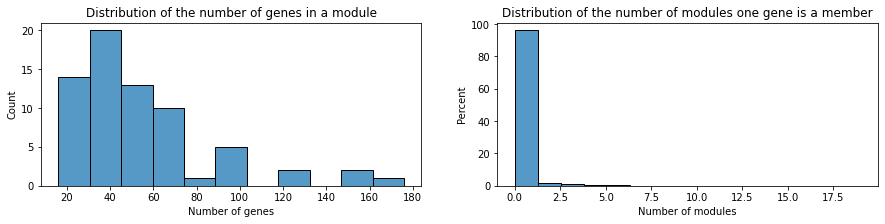

Number of genes in a module : 
- Mean : 55.12 
- Median : 46.0 
- Max : 176 
- Min : 16 

Number of modules per gene : 
- Mean : 0.25 
- Median : 0.0 
- Max : 19 
- Min : 0 

83.98 % of genes are not included in any module.
12.11 % of genes are included in only one module.
3.91 % of genes are included in more than one module.


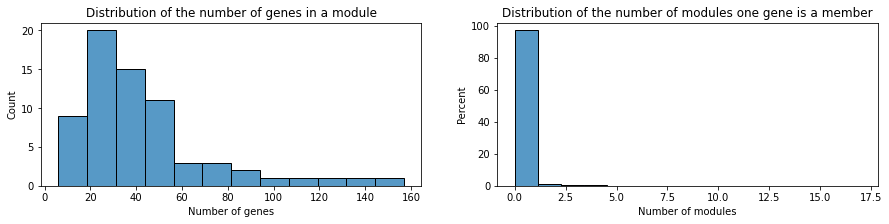

Number of genes in a module : 
- Mean : 43.24 
- Median : 35.0 
- Max : 157 
- Min : 6 

Number of modules per gene : 
- Mean : 0.20 
- Median : 0.0 
- Max : 17 
- Min : 0 

86.70 % of genes are not included in any module.
10.36 % of genes are included in only one module.
2.94 % of genes are included in more than one module.


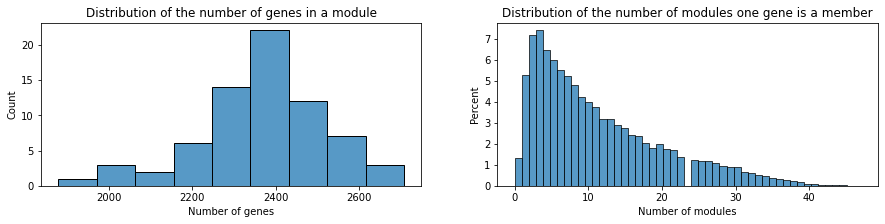

Number of genes in a module : 
- Mean : 2362.34 
- Median : 2356.5 
- Max : 2708 
- Min : 1878 

Number of modules per gene : 
- Mean : 11.17 
- Median : 9.0 
- Max : 47 
- Min : 0 

1.31 % of genes are not included in any module.
5.27 % of genes are included in only one module.
93.42 % of genes are included in more than one module.


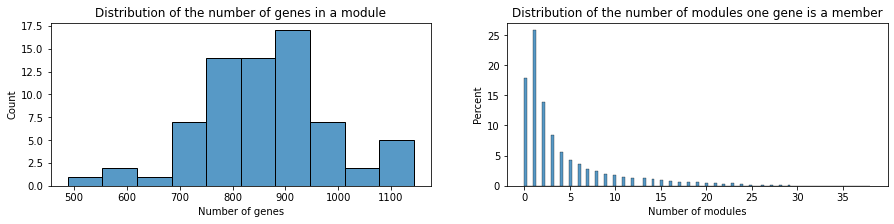

Number of genes in a module : 
- Mean : 859.96 
- Median : 864.0 
- Max : 1143 
- Min : 488 

Number of modules per gene : 
- Mean : 4.06 
- Median : 2.0 
- Max : 38 
- Min : 0 

17.89 % of genes are not included in any module.
25.75 % of genes are included in only one module.
56.36 % of genes are included in more than one module.


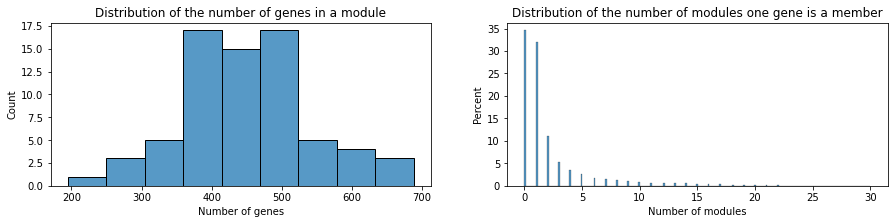

Number of genes in a module : 
- Mean : 448.73 
- Median : 446.5 
- Max : 688 
- Min : 195 

Number of modules per gene : 
- Mean : 2.12 
- Median : 1.0 
- Max : 30 
- Min : 0 

34.57 % of genes are not included in any module.
32.10 % of genes are included in only one module.
33.34 % of genes are included in more than one module.


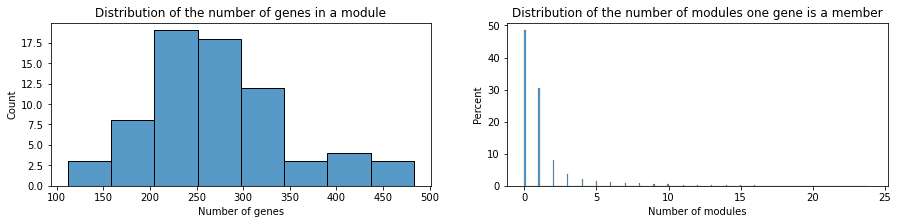

Number of genes in a module : 
- Mean : 273.54 
- Median : 263.5 
- Max : 483 
- Min : 112 

Number of modules per gene : 
- Mean : 1.29 
- Median : 1.0 
- Max : 24 
- Min : 0 

48.44 % of genes are not included in any module.
30.39 % of genes are included in only one module.
21.17 % of genes are included in more than one module.


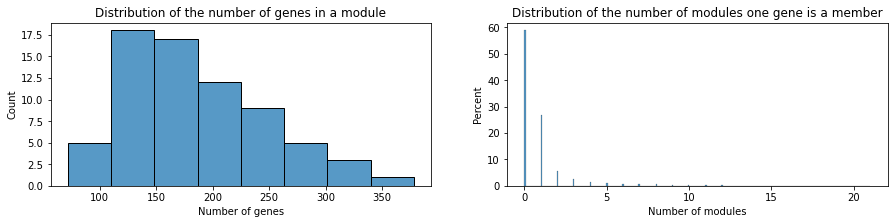

Number of genes in a module : 
- Mean : 185.36 
- Median : 174.5 
- Max : 378 
- Min : 72 

Number of modules per gene : 
- Mean : 0.88 
- Median : 0.0 
- Max : 21 
- Min : 0 

58.84 % of genes are not included in any module.
26.94 % of genes are included in only one module.
14.22 % of genes are included in more than one module.


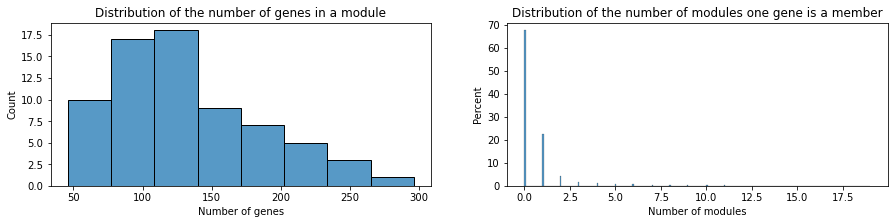

Number of genes in a module : 
- Mean : 132.03 
- Median : 124.0 
- Max : 296 
- Min : 46 

Number of modules per gene : 
- Mean : 0.62 
- Median : 0.0 
- Max : 19 
- Min : 0 

67.44 % of genes are not included in any module.
22.61 % of genes are included in only one module.
9.95 % of genes are included in more than one module.


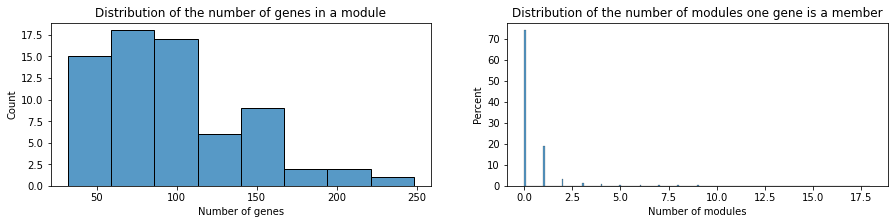

Number of genes in a module : 
- Mean : 98.54 
- Median : 87.0 
- Max : 248 
- Min : 32 

Number of modules per gene : 
- Mean : 0.47 
- Median : 0.0 
- Max : 18 
- Min : 0 

73.83 % of genes are not included in any module.
18.81 % of genes are included in only one module.
7.36 % of genes are included in more than one module.


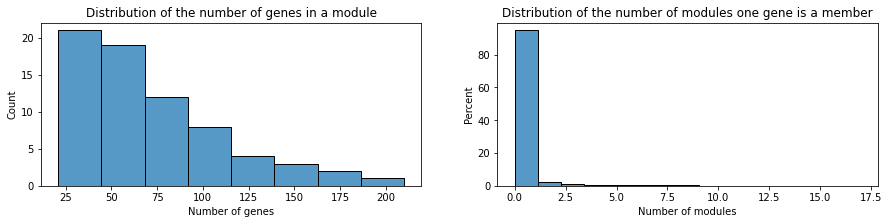

Number of genes in a module : 
- Mean : 74.21 
- Median : 63.0 
- Max : 210 
- Min : 21 

Number of modules per gene : 
- Mean : 0.35 
- Median : 0.0 
- Max : 17 
- Min : 0 

78.86 % of genes are not included in any module.
15.84 % of genes are included in only one module.
5.30 % of genes are included in more than one module.


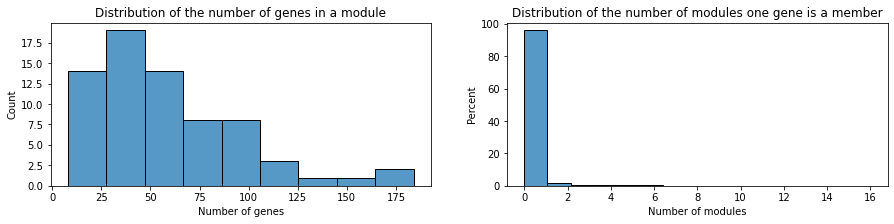

Number of genes in a module : 
- Mean : 57.87 
- Median : 48.5 
- Max : 184 
- Min : 8 

Number of modules per gene : 
- Mean : 0.27 
- Median : 0.0 
- Max : 16 
- Min : 0 

82.62 % of genes are not included in any module.
13.29 % of genes are included in only one module.
4.09 % of genes are included in more than one module.


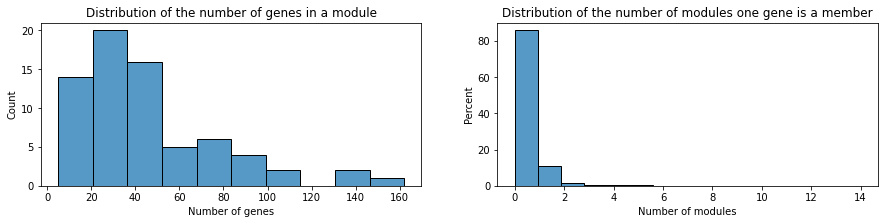

Number of genes in a module : 
- Mean : 45.50 
- Median : 37.5 
- Max : 162 
- Min : 5 

Number of modules per gene : 
- Mean : 0.22 
- Median : 0.0 
- Max : 14 
- Min : 0 

85.81 % of genes are not included in any module.
10.95 % of genes are included in only one module.
3.24 % of genes are included in more than one module.


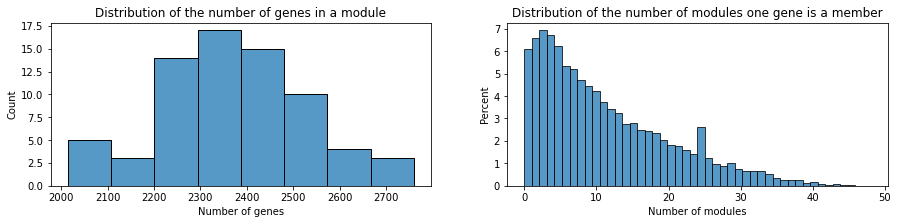

Number of genes in a module : 
- Mean : 2370.97 
- Median : 2335.0 
- Max : 2760 
- Min : 2014 

Number of modules per gene : 
- Mean : 11.37 
- Median : 9.0 
- Max : 48 
- Min : 0 

1.26 % of genes are not included in any module.
4.83 % of genes are included in only one module.
93.91 % of genes are included in more than one module.


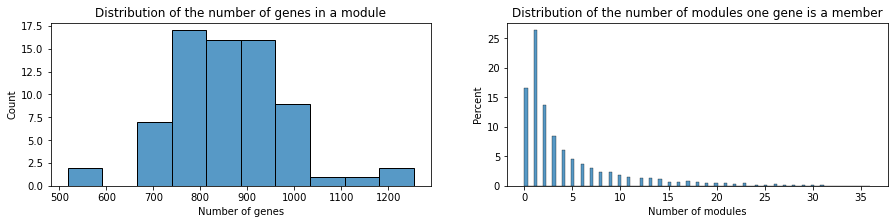

Number of genes in a module : 
- Mean : 859.65 
- Median : 862.0 
- Max : 1254 
- Min : 518 

Number of modules per gene : 
- Mean : 4.12 
- Median : 2.0 
- Max : 36 
- Min : 0 

16.55 % of genes are not included in any module.
26.31 % of genes are included in only one module.
57.14 % of genes are included in more than one module.


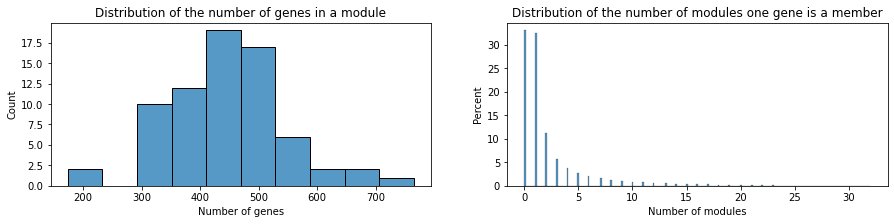

Number of genes in a module : 
- Mean : 449.62 
- Median : 455.0 
- Max : 765 
- Min : 174 

Number of modules per gene : 
- Mean : 2.16 
- Median : 1.0 
- Max : 32 
- Min : 0 

33.00 % of genes are not included in any module.
32.55 % of genes are included in only one module.
34.45 % of genes are included in more than one module.


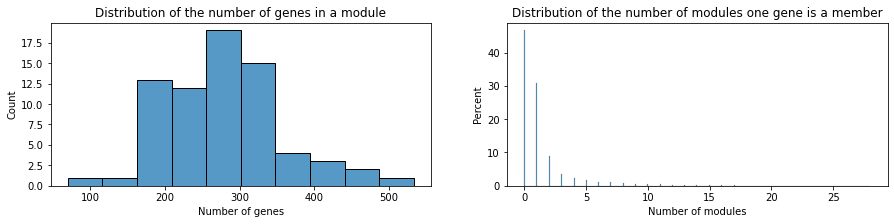

Number of genes in a module : 
- Mean : 277.15 
- Median : 271.0 
- Max : 533 
- Min : 70 

Number of modules per gene : 
- Mean : 1.33 
- Median : 1.0 
- Max : 28 
- Min : 0 

46.61 % of genes are not included in any module.
30.91 % of genes are included in only one module.
22.48 % of genes are included in more than one module.


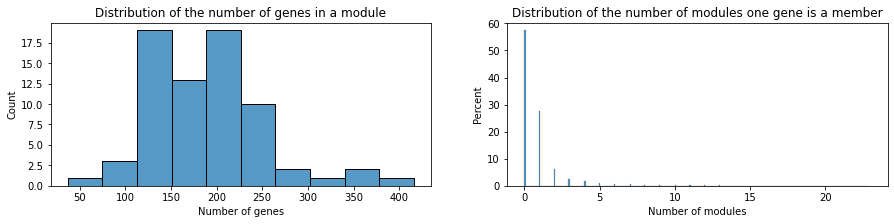

Number of genes in a module : 
- Mean : 188.62 
- Median : 186.0 
- Max : 416 
- Min : 37 

Number of modules per gene : 
- Mean : 0.90 
- Median : 0.0 
- Max : 23 
- Min : 0 

57.39 % of genes are not included in any module.
27.52 % of genes are included in only one module.
15.09 % of genes are included in more than one module.


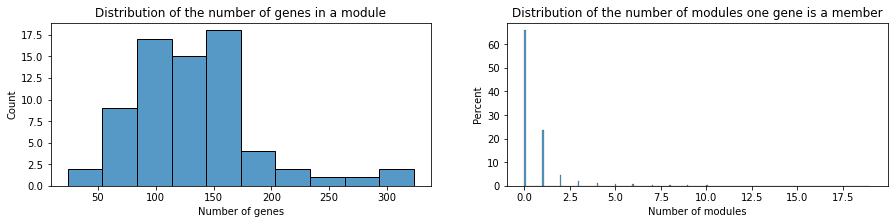

Number of genes in a module : 
- Mean : 133.75 
- Median : 128.0 
- Max : 323 
- Min : 24 

Number of modules per gene : 
- Mean : 0.64 
- Median : 0.0 
- Max : 19 
- Min : 0 

65.84 % of genes are not included in any module.
23.67 % of genes are included in only one module.
10.49 % of genes are included in more than one module.


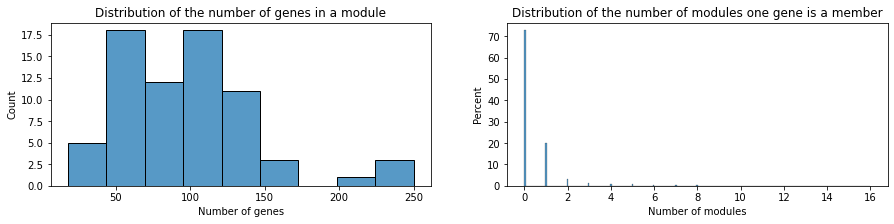

Number of genes in a module : 
- Mean : 97.80 
- Median : 96.0 
- Max : 250 
- Min : 18 

Number of modules per gene : 
- Mean : 0.47 
- Median : 0.0 
- Max : 16 
- Min : 0 

72.71 % of genes are not included in any module.
19.89 % of genes are included in only one module.
7.39 % of genes are included in more than one module.


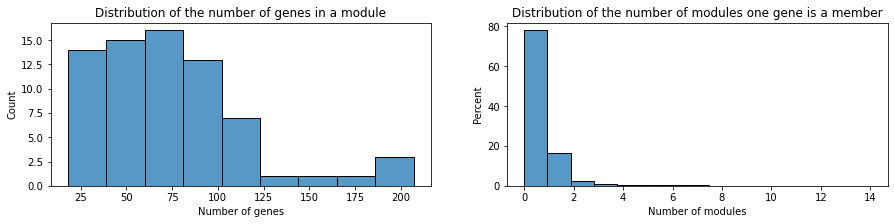

Number of genes in a module : 
- Mean : 73.86 
- Median : 69.0 
- Max : 207 
- Min : 18 

Number of modules per gene : 
- Mean : 0.35 
- Median : 0.0 
- Max : 14 
- Min : 0 

77.93 % of genes are not included in any module.
16.59 % of genes are included in only one module.
5.48 % of genes are included in more than one module.


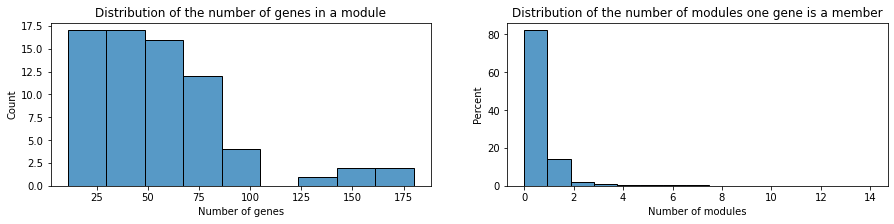

Number of genes in a module : 
- Mean : 57.23 
- Median : 51.0 
- Max : 180 
- Min : 11 

Number of modules per gene : 
- Mean : 0.27 
- Median : 0.0 
- Max : 14 
- Min : 0 

82.04 % of genes are not included in any module.
13.99 % of genes are included in only one module.
3.96 % of genes are included in more than one module.


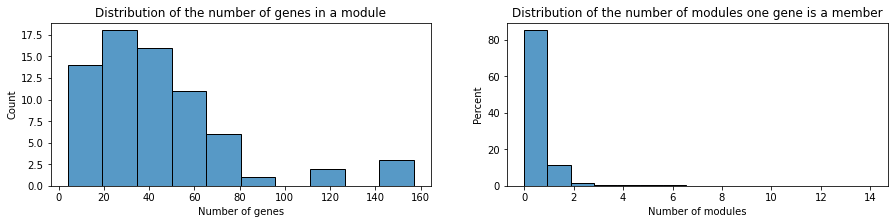

Number of genes in a module : 
- Mean : 45.63 
- Median : 38.0 
- Max : 157 
- Min : 4 

Number of modules per gene : 
- Mean : 0.22 
- Median : 0.0 
- Max : 14 
- Min : 0 

85.20 % of genes are not included in any module.
11.59 % of genes are included in only one module.
3.20 % of genes are included in more than one module.


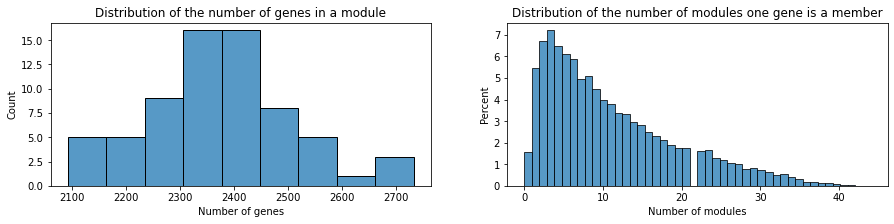

Number of genes in a module : 
- Mean : 2373.94 
- Median : 2369.0 
- Max : 2733 
- Min : 2092 

Number of modules per gene : 
- Mean : 10.90 
- Median : 9.0 
- Max : 44 
- Min : 0 

1.57 % of genes are not included in any module.
5.45 % of genes are included in only one module.
92.98 % of genes are included in more than one module.


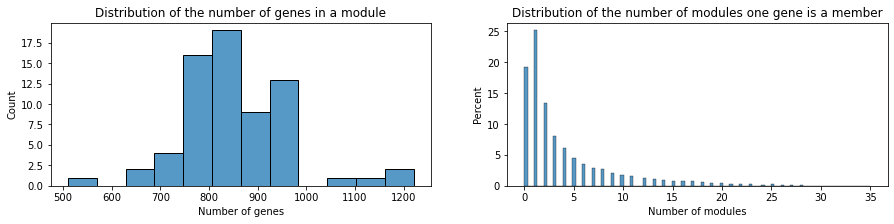

Number of genes in a module : 
- Mean : 852.75 
- Median : 839.5 
- Max : 1221 
- Min : 510 

Number of modules per gene : 
- Mean : 3.92 
- Median : 2.0 
- Max : 35 
- Min : 0 

19.27 % of genes are not included in any module.
25.16 % of genes are included in only one module.
55.57 % of genes are included in more than one module.


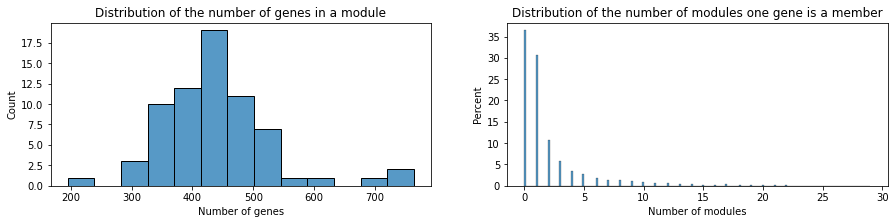

Number of genes in a module : 
- Mean : 439.38 
- Median : 425.0 
- Max : 764 
- Min : 195 

Number of modules per gene : 
- Mean : 2.02 
- Median : 1.0 
- Max : 29 
- Min : 0 

36.41 % of genes are not included in any module.
30.64 % of genes are included in only one module.
32.95 % of genes are included in more than one module.


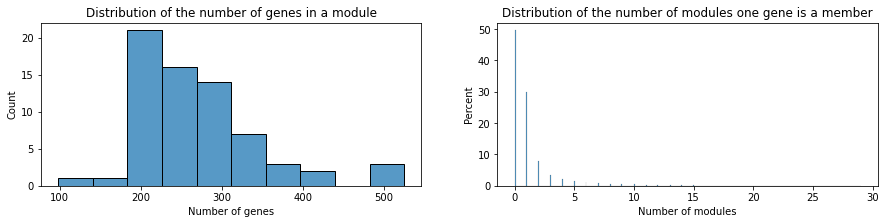

Number of genes in a module : 
- Mean : 270.00 
- Median : 257.0 
- Max : 525 
- Min : 98 

Number of modules per gene : 
- Mean : 1.24 
- Median : 1.0 
- Max : 29 
- Min : 0 

49.54 % of genes are not included in any module.
29.78 % of genes are included in only one module.
20.68 % of genes are included in more than one module.


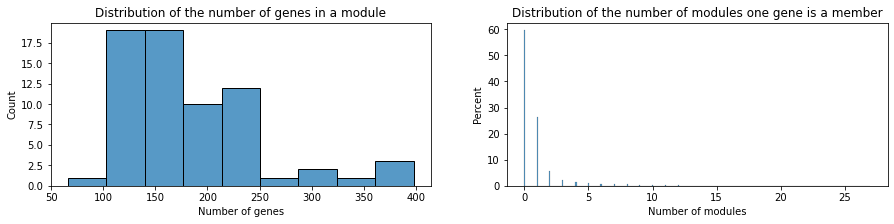

Number of genes in a module : 
- Mean : 183.22 
- Median : 167.5 
- Max : 398 
- Min : 66 

Number of modules per gene : 
- Mean : 0.84 
- Median : 0.0 
- Max : 27 
- Min : 0 

59.56 % of genes are not included in any module.
26.56 % of genes are included in only one module.
13.88 % of genes are included in more than one module.


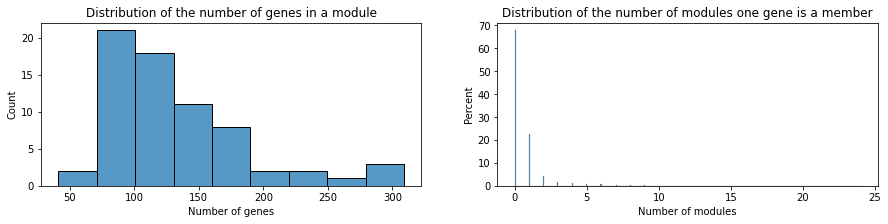

Number of genes in a module : 
- Mean : 130.24 
- Median : 109.5 
- Max : 309 
- Min : 41 

Number of modules per gene : 
- Mean : 0.60 
- Median : 0.0 
- Max : 24 
- Min : 0 

67.79 % of genes are not included in any module.
22.60 % of genes are included in only one module.
9.61 % of genes are included in more than one module.


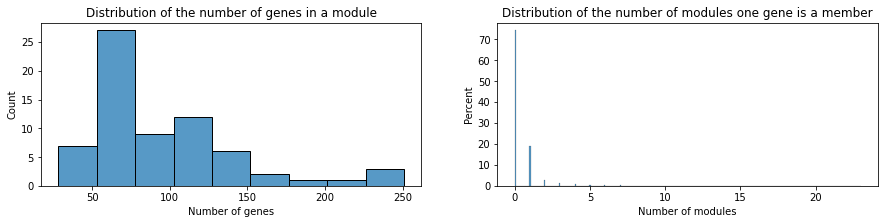

Number of genes in a module : 
- Mean : 95.97 
- Median : 77.0 
- Max : 251 
- Min : 28 

Number of modules per gene : 
- Mean : 0.44 
- Median : 0.0 
- Max : 23 
- Min : 0 

74.13 % of genes are not included in any module.
19.00 % of genes are included in only one module.
6.87 % of genes are included in more than one module.


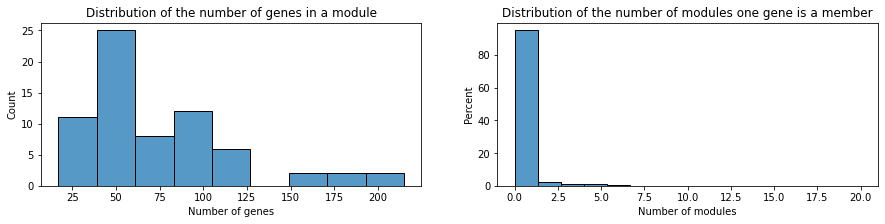

Number of genes in a module : 
- Mean : 72.78 
- Median : 55.5 
- Max : 215 
- Min : 17 

Number of modules per gene : 
- Mean : 0.33 
- Median : 0.0 
- Max : 20 
- Min : 0 

79.07 % of genes are not included in any module.
15.77 % of genes are included in only one module.
5.15 % of genes are included in more than one module.


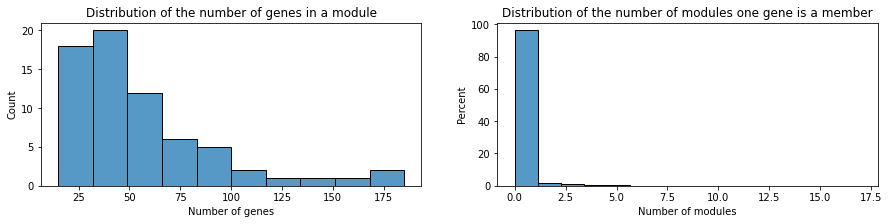

Number of genes in a module : 
- Mean : 56.13 
- Median : 41.5 
- Max : 185 
- Min : 15 

Number of modules per gene : 
- Mean : 0.26 
- Median : 0.0 
- Max : 17 
- Min : 0 

82.98 % of genes are not included in any module.
13.16 % of genes are included in only one module.
3.86 % of genes are included in more than one module.


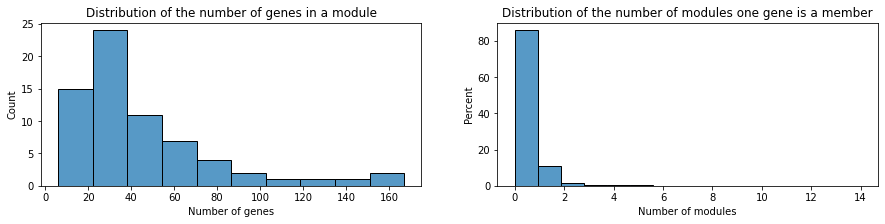

Number of genes in a module : 
- Mean : 45.13 
- Median : 35.0 
- Max : 167 
- Min : 6 

Number of modules per gene : 
- Mean : 0.21 
- Median : 0.0 
- Max : 14 
- Min : 0 

85.81 % of genes are not included in any module.
11.07 % of genes are included in only one module.
3.13 % of genes are included in more than one module.


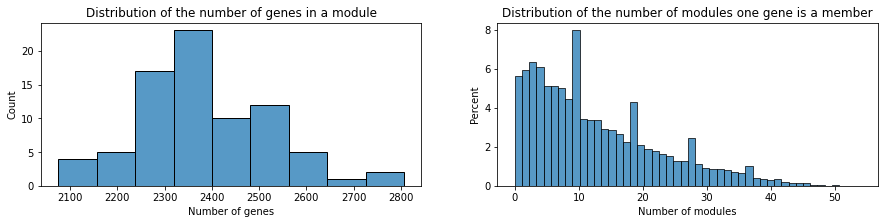

Number of genes in a module : 
- Mean : 2384.19 
- Median : 2372.0 
- Max : 2807 
- Min : 2075 

Number of modules per gene : 
- Mean : 12.72 
- Median : 10.0 
- Max : 54 
- Min : 0 

1.11 % of genes are not included in any module.
4.52 % of genes are included in only one module.
94.37 % of genes are included in more than one module.


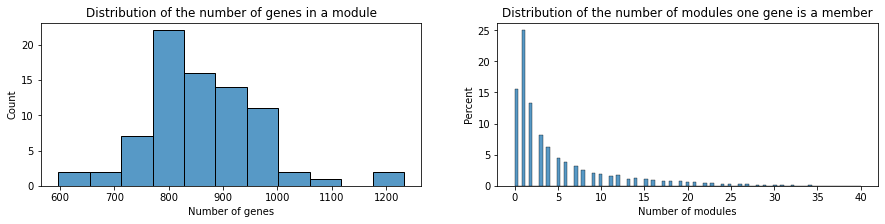

Number of genes in a module : 
- Mean : 866.97 
- Median : 856.0 
- Max : 1233 
- Min : 597 

Number of modules per gene : 
- Mean : 4.62 
- Median : 2.0 
- Max : 40 
- Min : 0 

15.50 % of genes are not included in any module.
24.95 % of genes are included in only one module.
59.54 % of genes are included in more than one module.


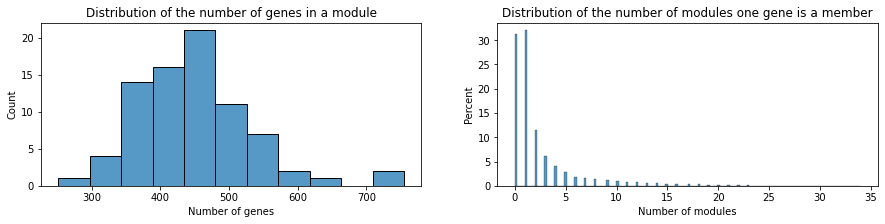

Number of genes in a module : 
- Mean : 449.71 
- Median : 447.0 
- Max : 755 
- Min : 251 

Number of modules per gene : 
- Mean : 2.40 
- Median : 1.0 
- Max : 34 
- Min : 0 

31.26 % of genes are not included in any module.
31.97 % of genes are included in only one module.
36.77 % of genes are included in more than one module.


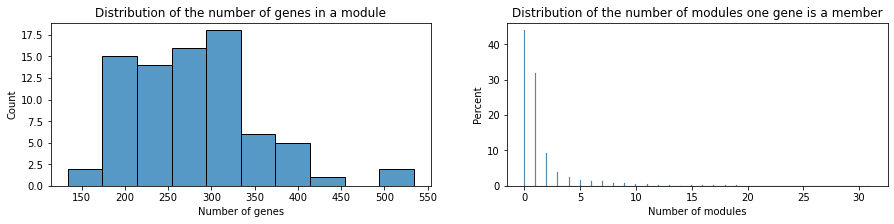

Number of genes in a module : 
- Mean : 278.13 
- Median : 266.0 
- Max : 534 
- Min : 134 

Number of modules per gene : 
- Mean : 1.48 
- Median : 1.0 
- Max : 31 
- Min : 0 

43.86 % of genes are not included in any module.
31.94 % of genes are included in only one module.
24.20 % of genes are included in more than one module.


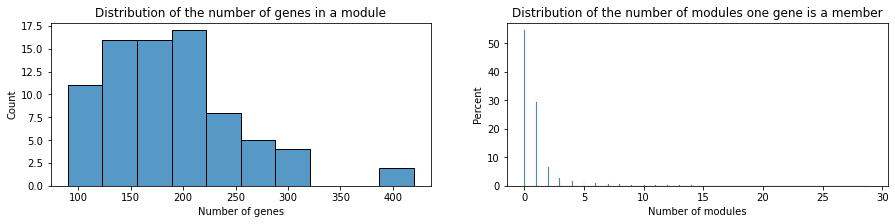

Number of genes in a module : 
- Mean : 188.68 
- Median : 183.0 
- Max : 420 
- Min : 90 

Number of modules per gene : 
- Mean : 1.01 
- Median : 0.0 
- Max : 29 
- Min : 0 

54.47 % of genes are not included in any module.
29.28 % of genes are included in only one module.
16.25 % of genes are included in more than one module.


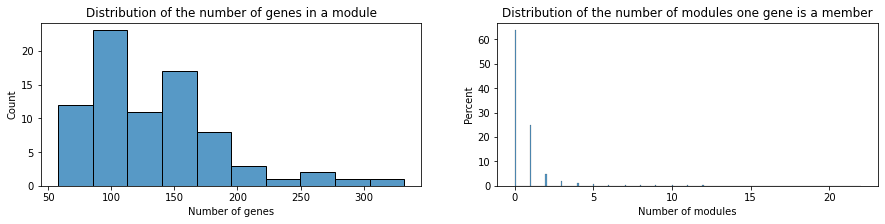

Number of genes in a module : 
- Mean : 133.84 
- Median : 123.0 
- Max : 332 
- Min : 58 

Number of modules per gene : 
- Mean : 0.71 
- Median : 0.0 
- Max : 22 
- Min : 0 

63.62 % of genes are not included in any module.
25.01 % of genes are included in only one module.
11.38 % of genes are included in more than one module.


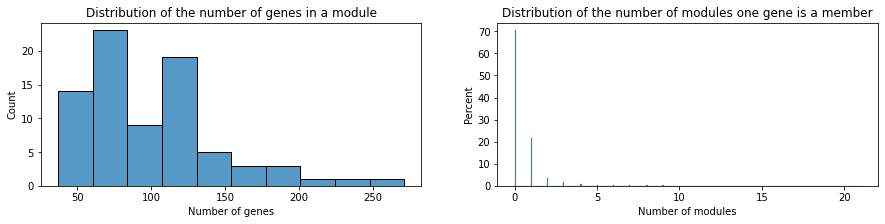

Number of genes in a module : 
- Mean : 99.72 
- Median : 89.0 
- Max : 271 
- Min : 37 

Number of modules per gene : 
- Mean : 0.53 
- Median : 0.0 
- Max : 21 
- Min : 0 

70.40 % of genes are not included in any module.
21.46 % of genes are included in only one module.
8.14 % of genes are included in more than one module.


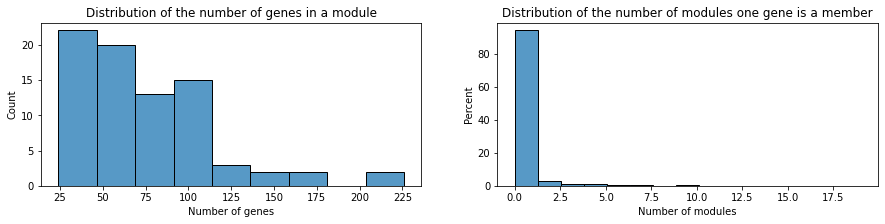

Number of genes in a module : 
- Mean : 75.42 
- Median : 63.0 
- Max : 226 
- Min : 24 

Number of modules per gene : 
- Mean : 0.40 
- Median : 0.0 
- Max : 19 
- Min : 0 

76.17 % of genes are not included in any module.
17.84 % of genes are included in only one module.
5.99 % of genes are included in more than one module.


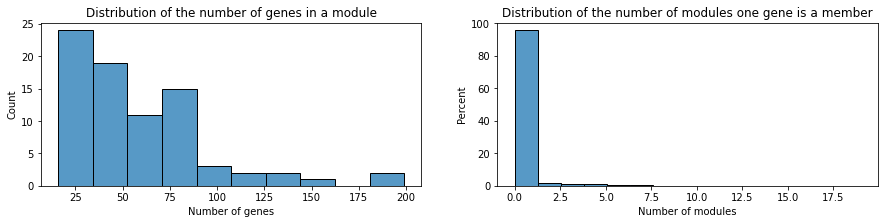

Number of genes in a module : 
- Mean : 58.09 
- Median : 50.0 
- Max : 199 
- Min : 16 

Number of modules per gene : 
- Mean : 0.31 
- Median : 0.0 
- Max : 19 
- Min : 0 

80.55 % of genes are not included in any module.
14.96 % of genes are included in only one module.
4.49 % of genes are included in more than one module.


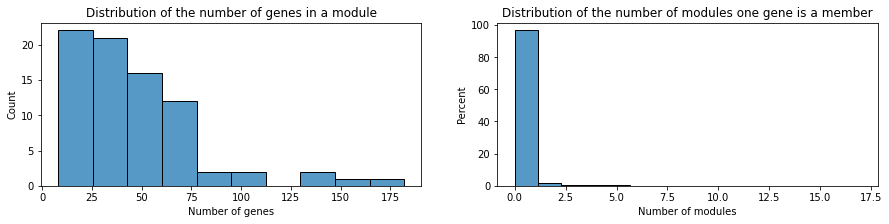

Number of genes in a module : 
- Mean : 46.67 
- Median : 36.0 
- Max : 182 
- Min : 8 

Number of modules per gene : 
- Mean : 0.25 
- Median : 0.0 
- Max : 17 
- Min : 0 

83.65 % of genes are not included in any module.
12.87 % of genes are included in only one module.
3.48 % of genes are included in more than one module.


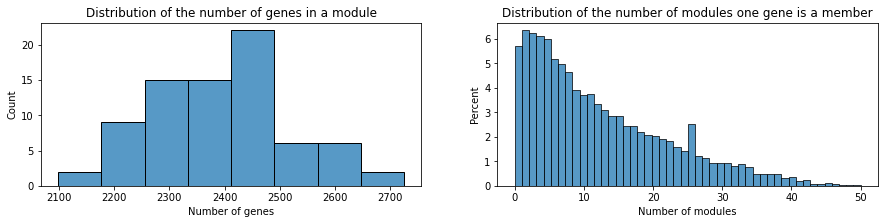

Number of genes in a module : 
- Mean : 2391.51 
- Median : 2396.0 
- Max : 2726 
- Min : 2098 

Number of modules per gene : 
- Mean : 12.43 
- Median : 10.0 
- Max : 50 
- Min : 0 

1.07 % of genes are not included in any module.
4.62 % of genes are included in only one module.
94.31 % of genes are included in more than one module.


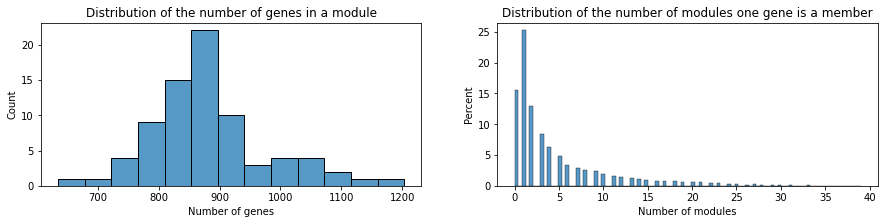

Number of genes in a module : 
- Mean : 880.48 
- Median : 868.0 
- Max : 1203 
- Min : 635 

Number of modules per gene : 
- Mean : 4.58 
- Median : 2.0 
- Max : 39 
- Min : 0 

15.61 % of genes are not included in any module.
25.21 % of genes are included in only one module.
59.18 % of genes are included in more than one module.


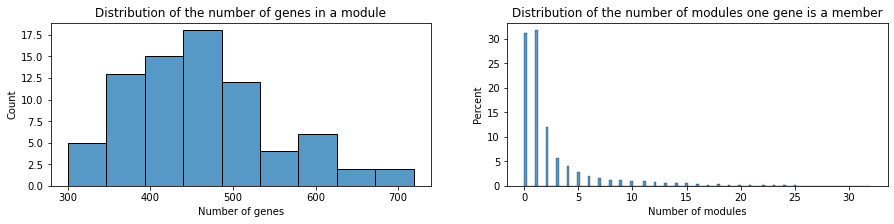

Number of genes in a module : 
- Mean : 461.55 
- Median : 450.0 
- Max : 719 
- Min : 300 

Number of modules per gene : 
- Mean : 2.40 
- Median : 1.0 
- Max : 32 
- Min : 0 

31.26 % of genes are not included in any module.
31.68 % of genes are included in only one module.
37.07 % of genes are included in more than one module.


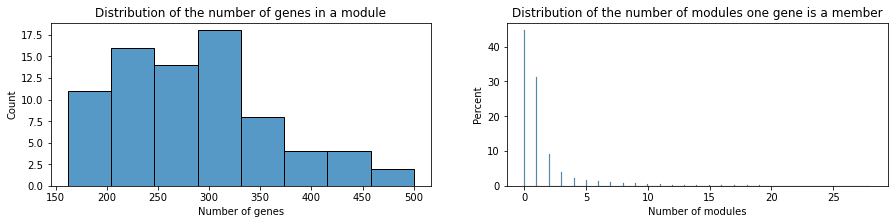

Number of genes in a module : 
- Mean : 285.52 
- Median : 274.0 
- Max : 500 
- Min : 162 

Number of modules per gene : 
- Mean : 1.48 
- Median : 1.0 
- Max : 28 
- Min : 0 

44.61 % of genes are not included in any module.
31.14 % of genes are included in only one module.
24.24 % of genes are included in more than one module.


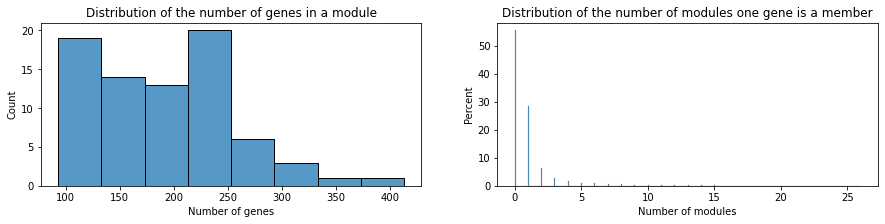

Number of genes in a module : 
- Mean : 191.83 
- Median : 180.0 
- Max : 413 
- Min : 93 

Number of modules per gene : 
- Mean : 1.00 
- Median : 0.0 
- Max : 26 
- Min : 0 

55.47 % of genes are not included in any module.
28.37 % of genes are included in only one module.
16.15 % of genes are included in more than one module.


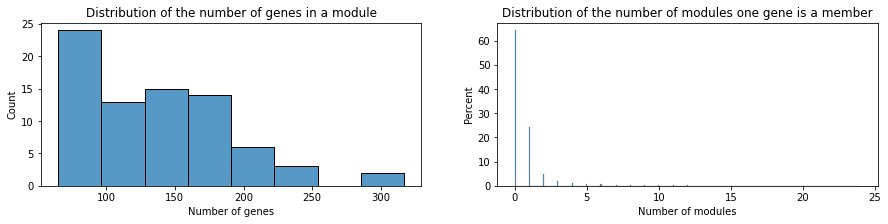

Number of genes in a module : 
- Mean : 137.40 
- Median : 135.0 
- Max : 317 
- Min : 65 

Number of modules per gene : 
- Mean : 0.71 
- Median : 0.0 
- Max : 24 
- Min : 0 

64.27 % of genes are not included in any module.
24.34 % of genes are included in only one module.
11.38 % of genes are included in more than one module.


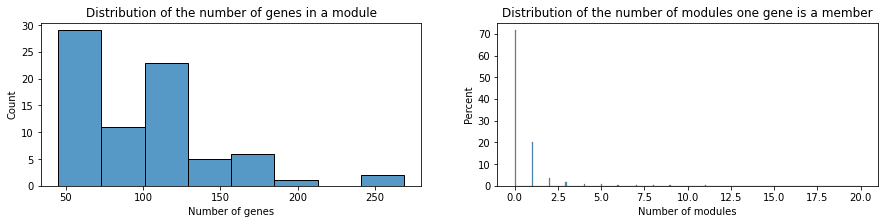

Number of genes in a module : 
- Mean : 101.01 
- Median : 91.0 
- Max : 269 
- Min : 45 

Number of modules per gene : 
- Mean : 0.53 
- Median : 0.0 
- Max : 20 
- Min : 0 

71.54 % of genes are not included in any module.
20.24 % of genes are included in only one module.
8.22 % of genes are included in more than one module.


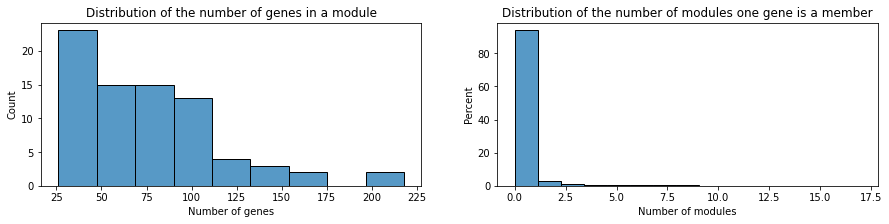

Number of genes in a module : 
- Mean : 76.49 
- Median : 69.0 
- Max : 218 
- Min : 26 

Number of modules per gene : 
- Mean : 0.40 
- Median : 0.0 
- Max : 17 
- Min : 0 

76.83 % of genes are not included in any module.
17.00 % of genes are included in only one module.
6.17 % of genes are included in more than one module.


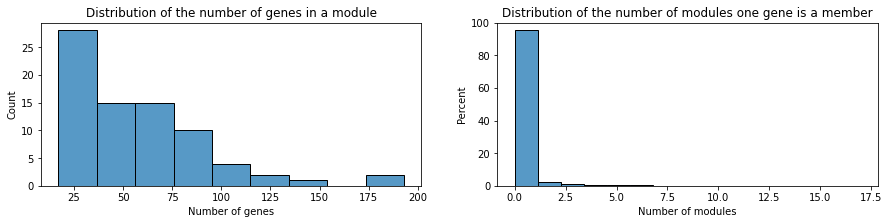

Number of genes in a module : 
- Mean : 59.64 
- Median : 51.0 
- Max : 193 
- Min : 17 

Number of modules per gene : 
- Mean : 0.31 
- Median : 0.0 
- Max : 17 
- Min : 0 

81.11 % of genes are not included in any module.
14.17 % of genes are included in only one module.
4.72 % of genes are included in more than one module.


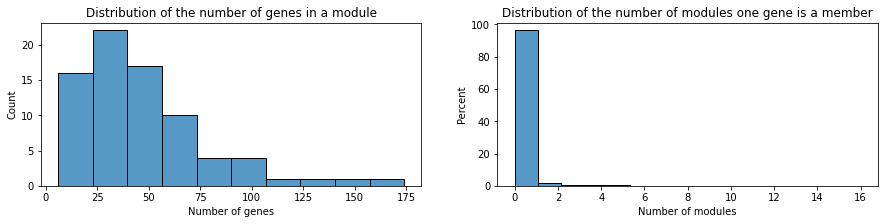

Number of genes in a module : 
- Mean : 47.25 
- Median : 40.0 
- Max : 174 
- Min : 6 

Number of modules per gene : 
- Mean : 0.25 
- Median : 0.0 
- Max : 16 
- Min : 0 

84.48 % of genes are not included in any module.
11.76 % of genes are included in only one module.
3.76 % of genes are included in more than one module.


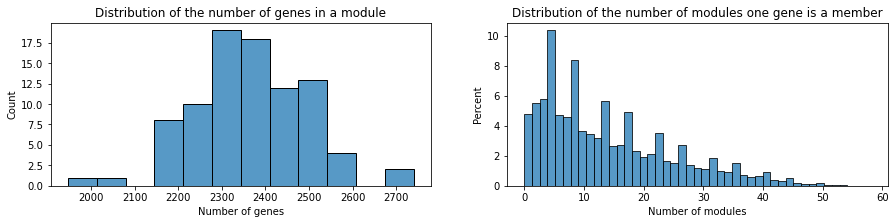

Number of genes in a module : 
- Mean : 2368.36 
- Median : 2363.5 
- Max : 2740 
- Min : 1947 

Number of modules per gene : 
- Mean : 14.07 
- Median : 11.0 
- Max : 58 
- Min : 0 

0.80 % of genes are not included in any module.
3.98 % of genes are included in only one module.
95.22 % of genes are included in more than one module.


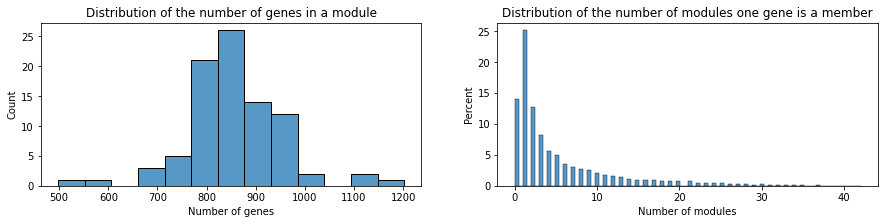

Number of genes in a module : 
- Mean : 856.01 
- Median : 855.0 
- Max : 1202 
- Min : 498 

Number of modules per gene : 
- Mean : 5.09 
- Median : 2.0 
- Max : 42 
- Min : 0 

13.96 % of genes are not included in any module.
25.10 % of genes are included in only one module.
60.94 % of genes are included in more than one module.


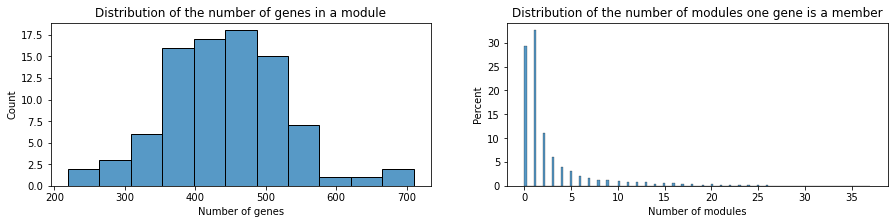

Number of genes in a module : 
- Mean : 441.15 
- Median : 442.5 
- Max : 710 
- Min : 219 

Number of modules per gene : 
- Mean : 2.62 
- Median : 1.0 
- Max : 37 
- Min : 0 

29.41 % of genes are not included in any module.
32.59 % of genes are included in only one module.
38.00 % of genes are included in more than one module.


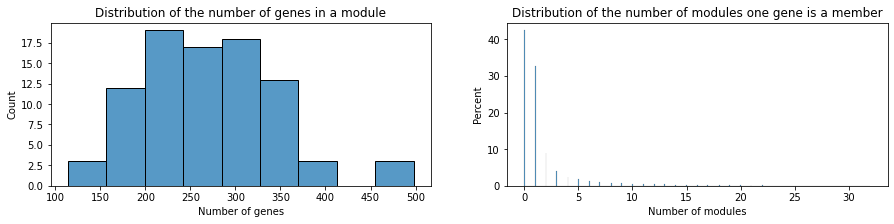

Number of genes in a module : 
- Mean : 271.95 
- Median : 266.5 
- Max : 498 
- Min : 114 

Number of modules per gene : 
- Mean : 1.62 
- Median : 1.0 
- Max : 32 
- Min : 0 

42.43 % of genes are not included in any module.
32.72 % of genes are included in only one module.
24.86 % of genes are included in more than one module.


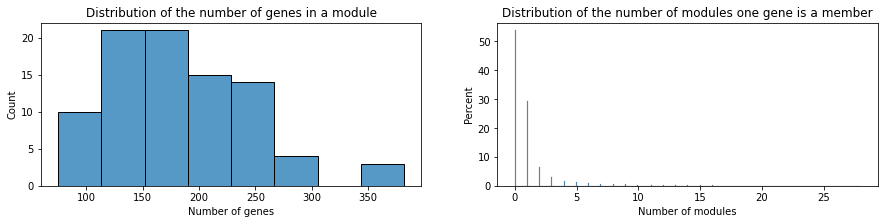

Number of genes in a module : 
- Mean : 183.01 
- Median : 174.0 
- Max : 382 
- Min : 75 

Number of modules per gene : 
- Mean : 1.09 
- Median : 0.0 
- Max : 28 
- Min : 0 

53.76 % of genes are not included in any module.
29.39 % of genes are included in only one module.
16.84 % of genes are included in more than one module.


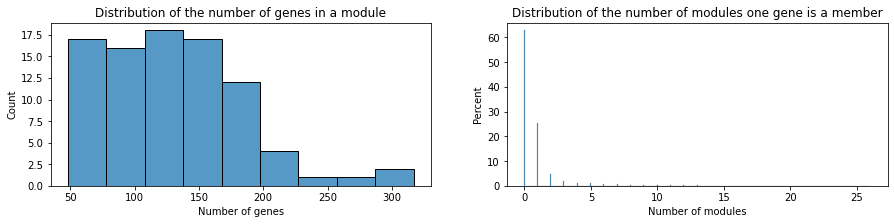

Number of genes in a module : 
- Mean : 130.64 
- Median : 124.5 
- Max : 317 
- Min : 48 

Number of modules per gene : 
- Mean : 0.78 
- Median : 0.0 
- Max : 26 
- Min : 0 

62.75 % of genes are not included in any module.
25.30 % of genes are included in only one module.
11.96 % of genes are included in more than one module.


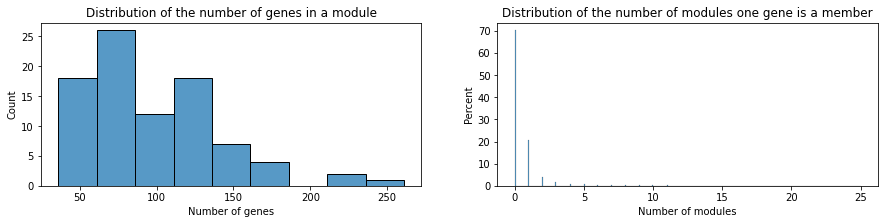

Number of genes in a module : 
- Mean : 96.77 
- Median : 85.0 
- Max : 261 
- Min : 36 

Number of modules per gene : 
- Mean : 0.58 
- Median : 0.0 
- Max : 25 
- Min : 0 

70.17 % of genes are not included in any module.
20.89 % of genes are included in only one module.
8.95 % of genes are included in more than one module.


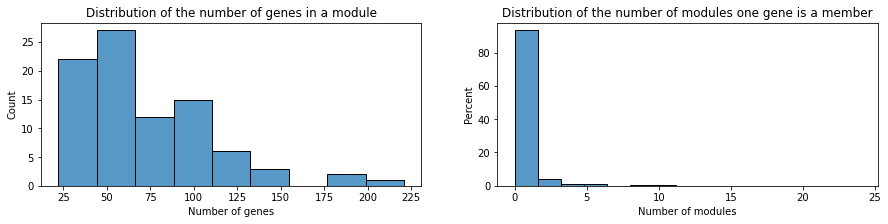

Number of genes in a module : 
- Mean : 73.06 
- Median : 61.0 
- Max : 221 
- Min : 22 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 24 
- Min : 0 

76.10 % of genes are not included in any module.
17.16 % of genes are included in only one module.
6.75 % of genes are included in more than one module.


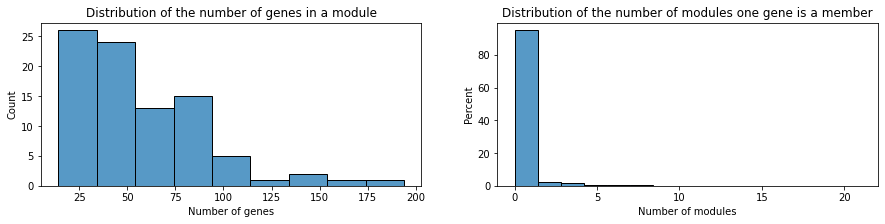

Number of genes in a module : 
- Mean : 56.78 
- Median : 47.0 
- Max : 194 
- Min : 14 

Number of modules per gene : 
- Mean : 0.34 
- Median : 0.0 
- Max : 21 
- Min : 0 

80.23 % of genes are not included in any module.
14.57 % of genes are included in only one module.
5.20 % of genes are included in more than one module.


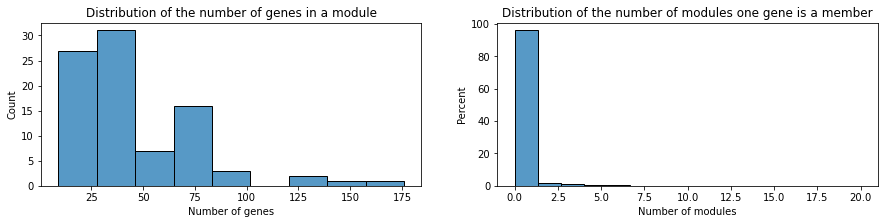

Number of genes in a module : 
- Mean : 45.73 
- Median : 36.5 
- Max : 176 
- Min : 9 

Number of modules per gene : 
- Mean : 0.27 
- Median : 0.0 
- Max : 20 
- Min : 0 

83.44 % of genes are not included in any module.
12.47 % of genes are included in only one module.
4.10 % of genes are included in more than one module.


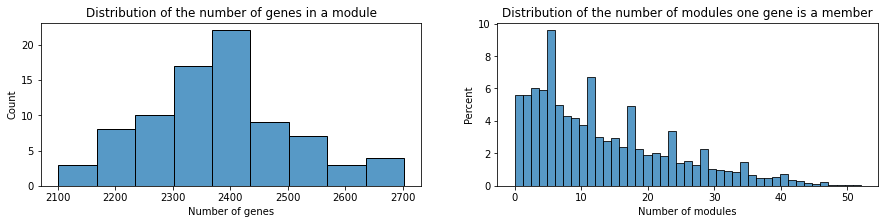

Number of genes in a module : 
- Mean : 2382.89 
- Median : 2380.0 
- Max : 2702 
- Min : 2101 

Number of modules per gene : 
- Mean : 13.36 
- Median : 11.0 
- Max : 52 
- Min : 0 

1.26 % of genes are not included in any module.
4.35 % of genes are included in only one module.
94.40 % of genes are included in more than one module.


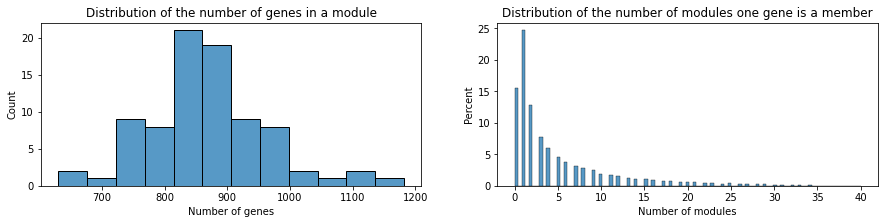

Number of genes in a module : 
- Mean : 867.77 
- Median : 860.0 
- Max : 1182 
- Min : 630 

Number of modules per gene : 
- Mean : 4.86 
- Median : 2.0 
- Max : 40 
- Min : 0 

15.52 % of genes are not included in any module.
24.65 % of genes are included in only one module.
59.82 % of genes are included in more than one module.


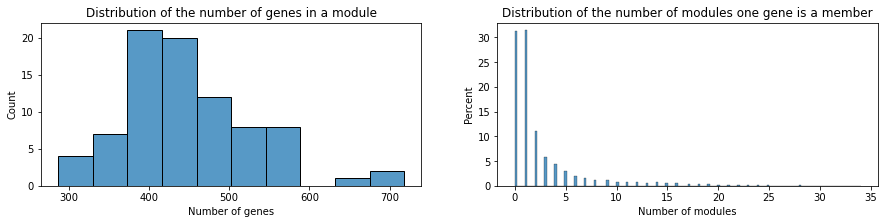

Number of genes in a module : 
- Mean : 448.64 
- Median : 442.0 
- Max : 718 
- Min : 287 

Number of modules per gene : 
- Mean : 2.51 
- Median : 1.0 
- Max : 34 
- Min : 0 

31.36 % of genes are not included in any module.
31.38 % of genes are included in only one module.
37.26 % of genes are included in more than one module.


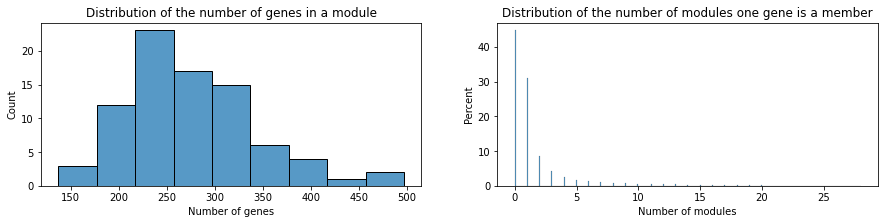

Number of genes in a module : 
- Mean : 275.99 
- Median : 263.0 
- Max : 497 
- Min : 137 

Number of modules per gene : 
- Mean : 1.55 
- Median : 1.0 
- Max : 28 
- Min : 0 

44.69 % of genes are not included in any module.
30.90 % of genes are included in only one module.
24.41 % of genes are included in more than one module.


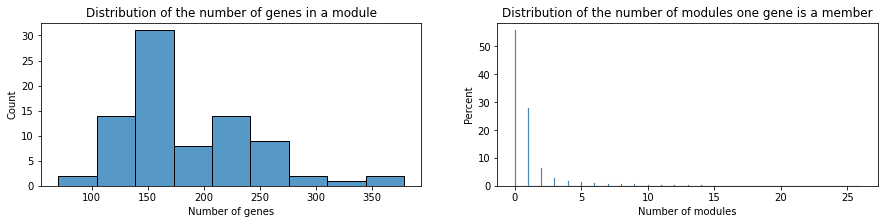

Number of genes in a module : 
- Mean : 185.87 
- Median : 168.0 
- Max : 379 
- Min : 70 

Number of modules per gene : 
- Mean : 1.04 
- Median : 0.0 
- Max : 26 
- Min : 0 

55.70 % of genes are not included in any module.
27.86 % of genes are included in only one module.
16.44 % of genes are included in more than one module.


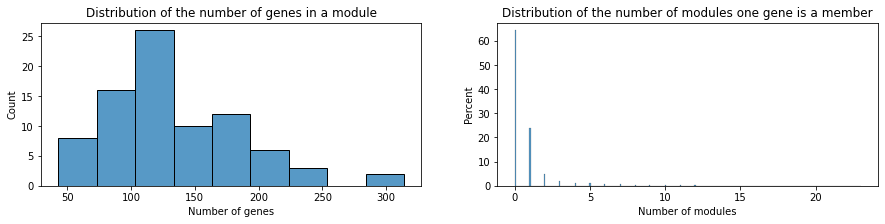

Number of genes in a module : 
- Mean : 132.51 
- Median : 117.0 
- Max : 314 
- Min : 43 

Number of modules per gene : 
- Mean : 0.74 
- Median : 0.0 
- Max : 23 
- Min : 0 

64.31 % of genes are not included in any module.
24.05 % of genes are included in only one module.
11.65 % of genes are included in more than one module.


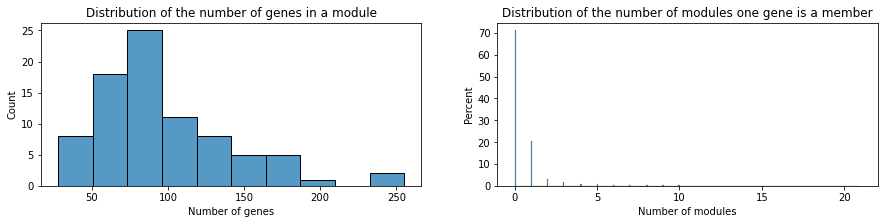

Number of genes in a module : 
- Mean : 98.31 
- Median : 88.0 
- Max : 255 
- Min : 28 

Number of modules per gene : 
- Mean : 0.55 
- Median : 0.0 
- Max : 21 
- Min : 0 

71.09 % of genes are not included in any module.
20.52 % of genes are included in only one module.
8.39 % of genes are included in more than one module.


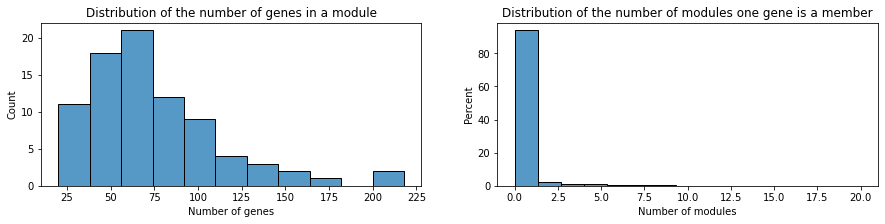

Number of genes in a module : 
- Mean : 74.67 
- Median : 66.0 
- Max : 218 
- Min : 20 

Number of modules per gene : 
- Mean : 0.42 
- Median : 0.0 
- Max : 20 
- Min : 0 

76.45 % of genes are not included in any module.
17.30 % of genes are included in only one module.
6.25 % of genes are included in more than one module.


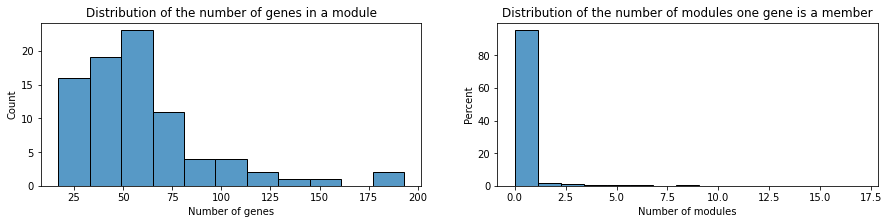

Number of genes in a module : 
- Mean : 58.58 
- Median : 50.0 
- Max : 193 
- Min : 17 

Number of modules per gene : 
- Mean : 0.33 
- Median : 0.0 
- Max : 17 
- Min : 0 

80.80 % of genes are not included in any module.
14.37 % of genes are included in only one module.
4.83 % of genes are included in more than one module.


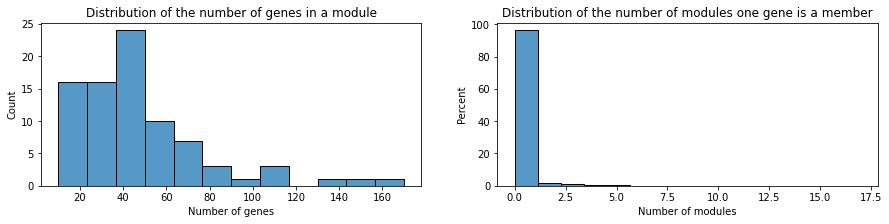

Number of genes in a module : 
- Mean : 46.73 
- Median : 41.0 
- Max : 170 
- Min : 10 

Number of modules per gene : 
- Mean : 0.26 
- Median : 0.0 
- Max : 17 
- Min : 0 

84.08 % of genes are not included in any module.
12.02 % of genes are included in only one module.
3.90 % of genes are included in more than one module.


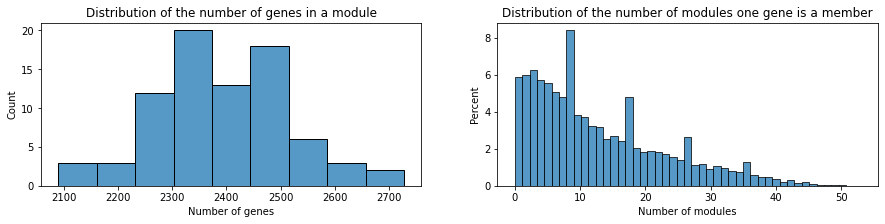

Number of genes in a module : 
- Mean : 2391.74 
- Median : 2382.5 
- Max : 2728 
- Min : 2090 

Number of modules per gene : 
- Mean : 12.92 
- Median : 10.0 
- Max : 53 
- Min : 0 

1.15 % of genes are not included in any module.
4.71 % of genes are included in only one module.
94.15 % of genes are included in more than one module.


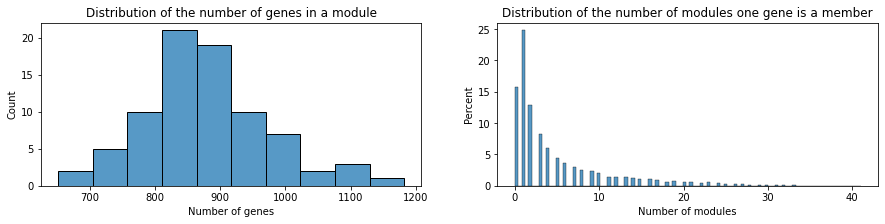

Number of genes in a module : 
- Mean : 877.02 
- Median : 869.0 
- Max : 1182 
- Min : 652 

Number of modules per gene : 
- Mean : 4.74 
- Median : 2.0 
- Max : 41 
- Min : 0 

15.83 % of genes are not included in any module.
24.79 % of genes are included in only one module.
59.38 % of genes are included in more than one module.


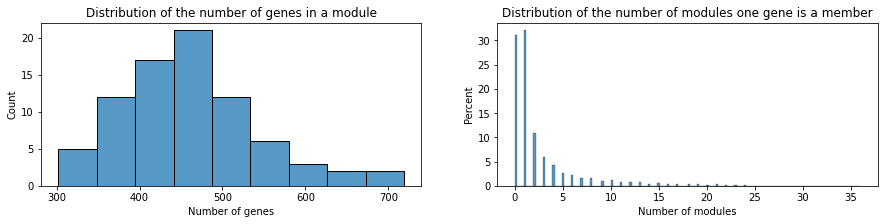

Number of genes in a module : 
- Mean : 460.32 
- Median : 450.0 
- Max : 719 
- Min : 302 

Number of modules per gene : 
- Mean : 2.49 
- Median : 1.0 
- Max : 36 
- Min : 0 

31.12 % of genes are not included in any module.
32.04 % of genes are included in only one module.
36.84 % of genes are included in more than one module.


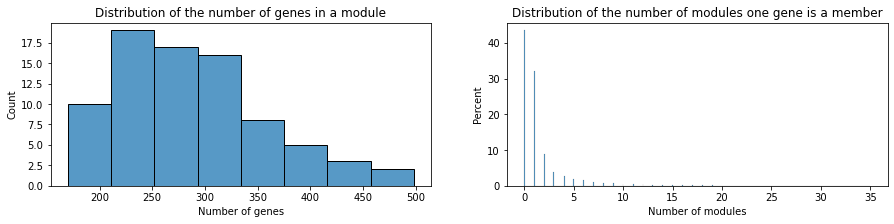

Number of genes in a module : 
- Mean : 287.51 
- Median : 276.0 
- Max : 498 
- Min : 170 

Number of modules per gene : 
- Mean : 1.55 
- Median : 1.0 
- Max : 35 
- Min : 0 

43.45 % of genes are not included in any module.
32.05 % of genes are included in only one module.
24.50 % of genes are included in more than one module.


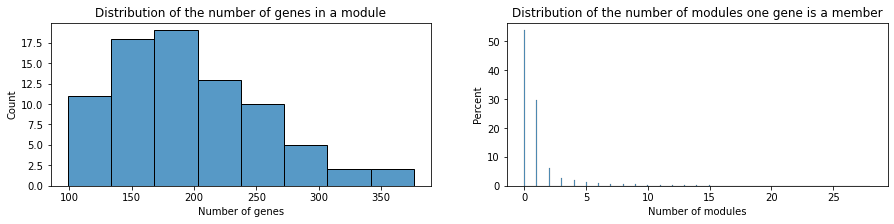

Number of genes in a module : 
- Mean : 196.76 
- Median : 187.0 
- Max : 376 
- Min : 99 

Number of modules per gene : 
- Mean : 1.06 
- Median : 0.0 
- Max : 28 
- Min : 0 

53.76 % of genes are not included in any module.
29.56 % of genes are included in only one module.
16.68 % of genes are included in more than one module.


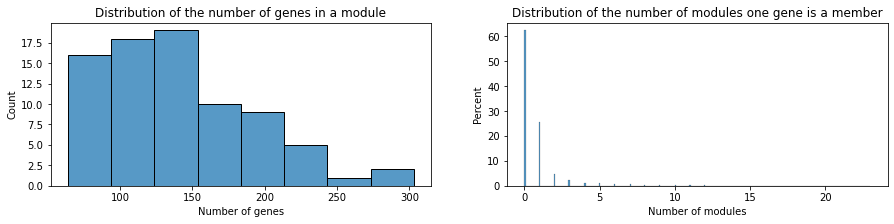

Number of genes in a module : 
- Mean : 141.62 
- Median : 134.0 
- Max : 303 
- Min : 64 

Number of modules per gene : 
- Mean : 0.77 
- Median : 0.0 
- Max : 23 
- Min : 0 

62.38 % of genes are not included in any module.
25.69 % of genes are included in only one module.
11.93 % of genes are included in more than one module.


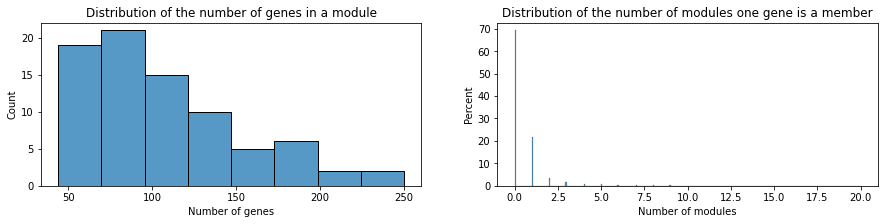

Number of genes in a module : 
- Mean : 106.15 
- Median : 97.0 
- Max : 250 
- Min : 44 

Number of modules per gene : 
- Mean : 0.57 
- Median : 0.0 
- Max : 20 
- Min : 0 

69.19 % of genes are not included in any module.
21.91 % of genes are included in only one module.
8.91 % of genes are included in more than one module.


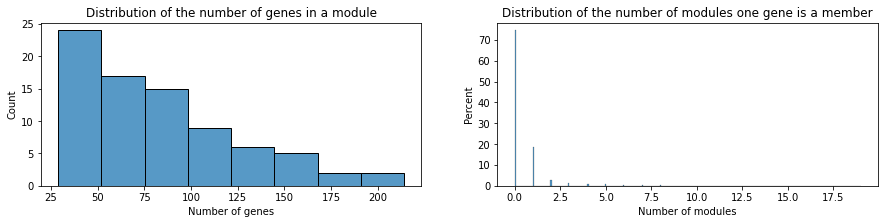

Number of genes in a module : 
- Mean : 82.44 
- Median : 74.0 
- Max : 214 
- Min : 29 

Number of modules per gene : 
- Mean : 0.45 
- Median : 0.0 
- Max : 19 
- Min : 0 

74.49 % of genes are not included in any module.
18.71 % of genes are included in only one module.
6.80 % of genes are included in more than one module.


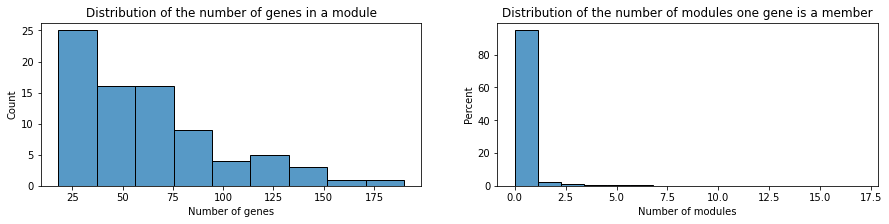

Number of genes in a module : 
- Mean : 64.21 
- Median : 55.0 
- Max : 190 
- Min : 18 

Number of modules per gene : 
- Mean : 0.35 
- Median : 0.0 
- Max : 17 
- Min : 0 

79.00 % of genes are not included in any module.
15.67 % of genes are included in only one module.
5.33 % of genes are included in more than one module.


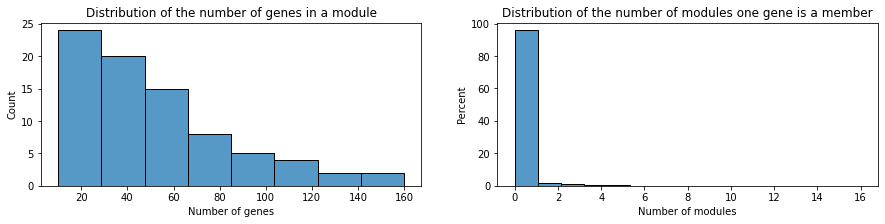

Number of genes in a module : 
- Mean : 51.74 
- Median : 43.0 
- Max : 160 
- Min : 10 

Number of modules per gene : 
- Mean : 0.28 
- Median : 0.0 
- Max : 16 
- Min : 0 

82.38 % of genes are not included in any module.
13.38 % of genes are included in only one module.
4.24 % of genes are included in more than one module.


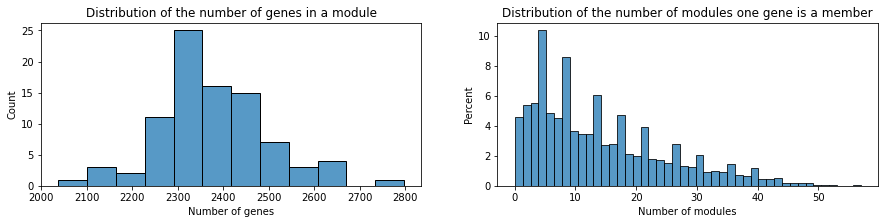

Number of genes in a module : 
- Mean : 2377.39 
- Median : 2365.5 
- Max : 2797 
- Min : 2037 

Number of modules per gene : 
- Mean : 14.13 
- Median : 11.0 
- Max : 57 
- Min : 0 

0.61 % of genes are not included in any module.
3.94 % of genes are included in only one module.
95.45 % of genes are included in more than one module.


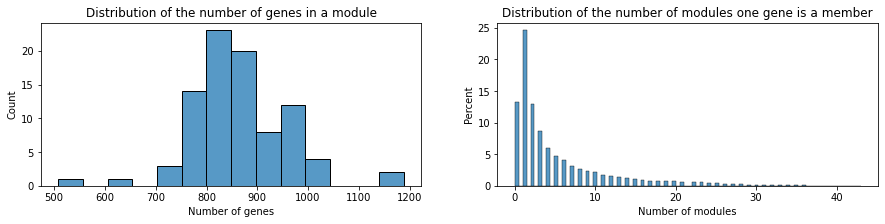

Number of genes in a module : 
- Mean : 863.57 
- Median : 851.0 
- Max : 1189 
- Min : 508 

Number of modules per gene : 
- Mean : 5.13 
- Median : 2.0 
- Max : 43 
- Min : 0 

13.28 % of genes are not included in any module.
24.59 % of genes are included in only one module.
62.12 % of genes are included in more than one module.


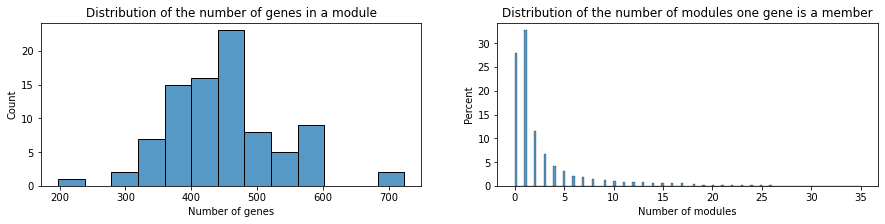

Number of genes in a module : 
- Mean : 449.28 
- Median : 448.0 
- Max : 723 
- Min : 198 

Number of modules per gene : 
- Mean : 2.67 
- Median : 1.0 
- Max : 35 
- Min : 0 

28.02 % of genes are not included in any module.
32.68 % of genes are included in only one module.
39.29 % of genes are included in more than one module.


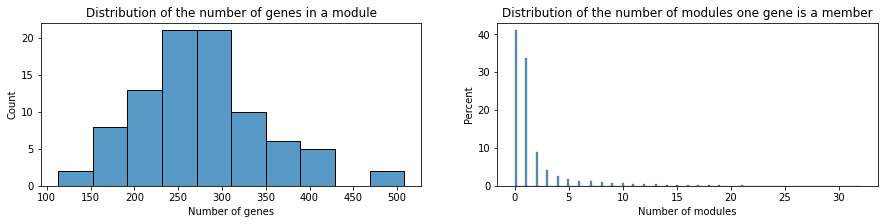

Number of genes in a module : 
- Mean : 276.78 
- Median : 271.0 
- Max : 508 
- Min : 113 

Number of modules per gene : 
- Mean : 1.64 
- Median : 1.0 
- Max : 32 
- Min : 0 

40.95 % of genes are not included in any module.
33.66 % of genes are included in only one module.
25.40 % of genes are included in more than one module.


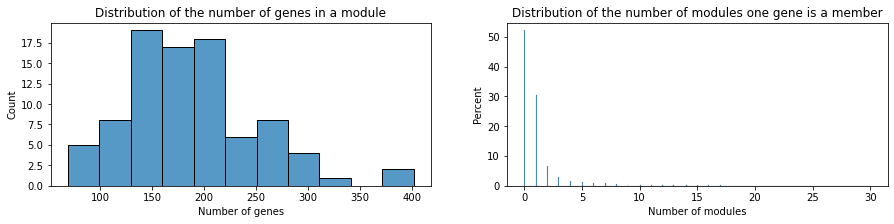

Number of genes in a module : 
- Mean : 187.57 
- Median : 177.0 
- Max : 402 
- Min : 69 

Number of modules per gene : 
- Mean : 1.11 
- Median : 0.0 
- Max : 30 
- Min : 0 

52.15 % of genes are not included in any module.
30.54 % of genes are included in only one module.
17.31 % of genes are included in more than one module.


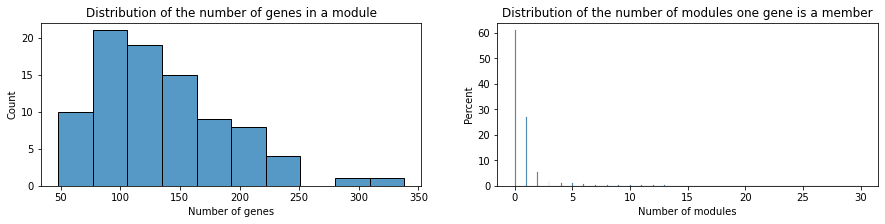

Number of genes in a module : 
- Mean : 134.99 
- Median : 118.0 
- Max : 338 
- Min : 48 

Number of modules per gene : 
- Mean : 0.80 
- Median : 0.0 
- Max : 30 
- Min : 0 

60.83 % of genes are not included in any module.
26.77 % of genes are included in only one module.
12.40 % of genes are included in more than one module.


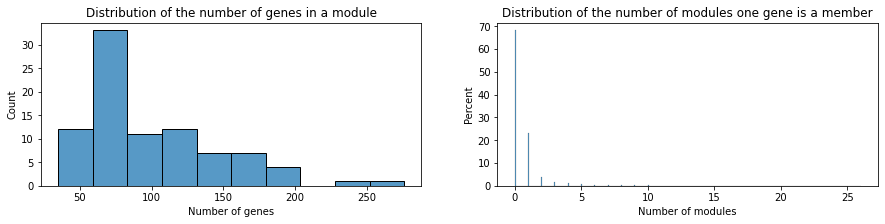

Number of genes in a module : 
- Mean : 100.74 
- Median : 83.0 
- Max : 276 
- Min : 35 

Number of modules per gene : 
- Mean : 0.60 
- Median : 0.0 
- Max : 26 
- Min : 0 

68.07 % of genes are not included in any module.
23.10 % of genes are included in only one module.
8.83 % of genes are included in more than one module.


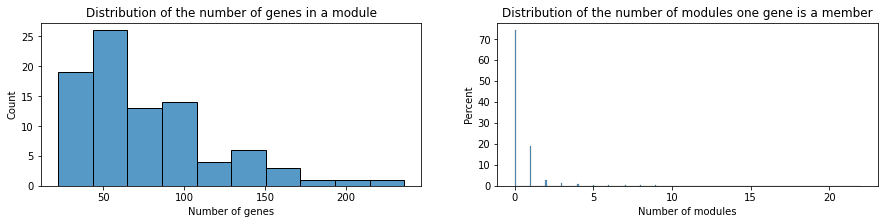

Number of genes in a module : 
- Mean : 76.58 
- Median : 62.5 
- Max : 236 
- Min : 22 

Number of modules per gene : 
- Mean : 0.46 
- Median : 0.0 
- Max : 22 
- Min : 0 

74.08 % of genes are not included in any module.
19.20 % of genes are included in only one module.
6.72 % of genes are included in more than one module.


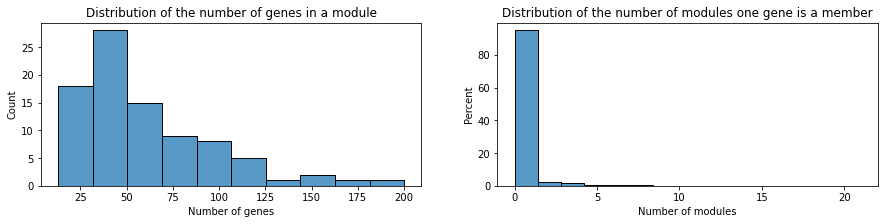

Number of genes in a module : 
- Mean : 60.23 
- Median : 49.0 
- Max : 200 
- Min : 13 

Number of modules per gene : 
- Mean : 0.36 
- Median : 0.0 
- Max : 21 
- Min : 0 

78.59 % of genes are not included in any module.
16.24 % of genes are included in only one module.
5.17 % of genes are included in more than one module.


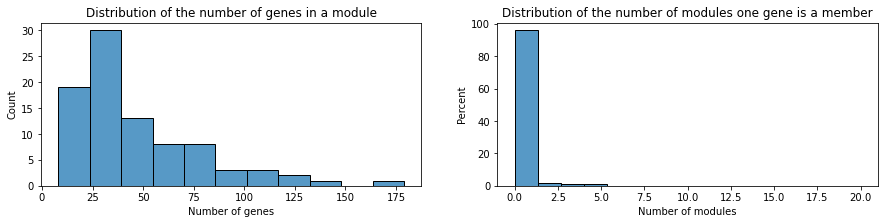

Number of genes in a module : 
- Mean : 48.00 
- Median : 37.5 
- Max : 179 
- Min : 8 

Number of modules per gene : 
- Mean : 0.29 
- Median : 0.0 
- Max : 20 
- Min : 0 

82.13 % of genes are not included in any module.
13.86 % of genes are included in only one module.
4.00 % of genes are included in more than one module.


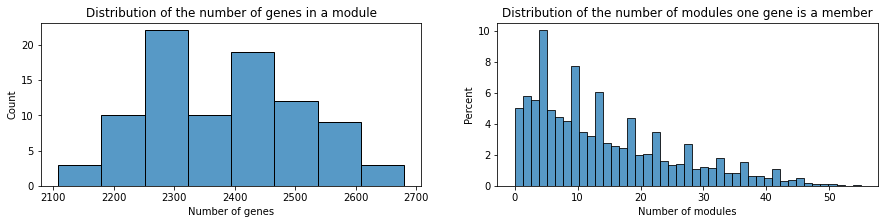

Number of genes in a module : 
- Mean : 2383.17 
- Median : 2386.5 
- Max : 2680 
- Min : 2108 

Number of modules per gene : 
- Mean : 14.16 
- Median : 11.0 
- Max : 55 
- Min : 0 

1.10 % of genes are not included in any module.
3.93 % of genes are included in only one module.
94.97 % of genes are included in more than one module.


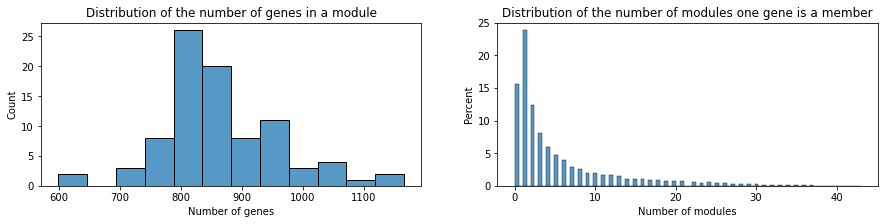

Number of genes in a module : 
- Mean : 865.73 
- Median : 847.5 
- Max : 1166 
- Min : 599 

Number of modules per gene : 
- Mean : 5.14 
- Median : 2.0 
- Max : 43 
- Min : 0 

15.61 % of genes are not included in any module.
23.82 % of genes are included in only one module.
60.58 % of genes are included in more than one module.


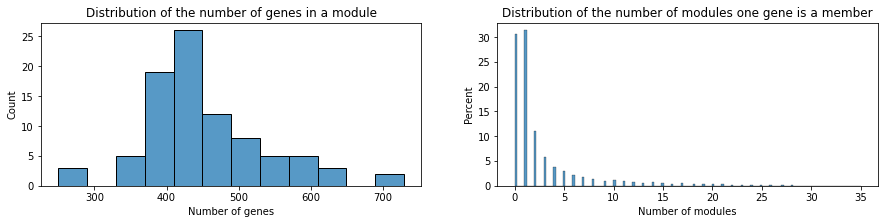

Number of genes in a module : 
- Mean : 452.80 
- Median : 430.0 
- Max : 729 
- Min : 250 

Number of modules per gene : 
- Mean : 2.69 
- Median : 1.0 
- Max : 35 
- Min : 0 

30.54 % of genes are not included in any module.
31.33 % of genes are included in only one module.
38.13 % of genes are included in more than one module.


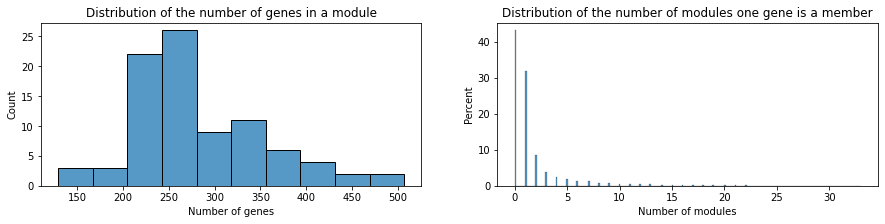

Number of genes in a module : 
- Mean : 282.62 
- Median : 263.0 
- Max : 507 
- Min : 129 

Number of modules per gene : 
- Mean : 1.68 
- Median : 1.0 
- Max : 33 
- Min : 0 

43.09 % of genes are not included in any module.
31.82 % of genes are included in only one module.
25.09 % of genes are included in more than one module.


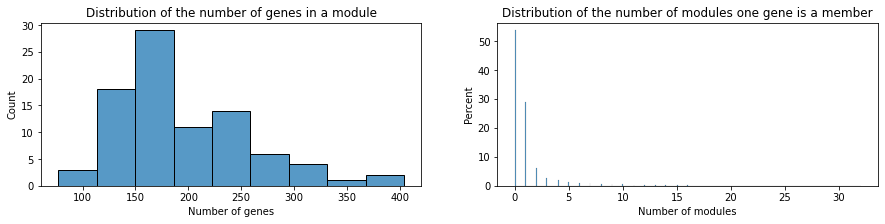

Number of genes in a module : 
- Mean : 192.99 
- Median : 181.5 
- Max : 404 
- Min : 77 

Number of modules per gene : 
- Mean : 1.15 
- Median : 0.0 
- Max : 32 
- Min : 0 

53.67 % of genes are not included in any module.
29.00 % of genes are included in only one module.
17.33 % of genes are included in more than one module.


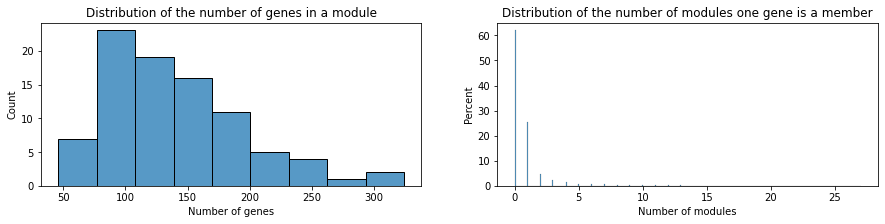

Number of genes in a module : 
- Mean : 139.52 
- Median : 129.5 
- Max : 324 
- Min : 46 

Number of modules per gene : 
- Mean : 0.83 
- Median : 0.0 
- Max : 27 
- Min : 0 

61.95 % of genes are not included in any module.
25.46 % of genes are included in only one module.
12.59 % of genes are included in more than one module.


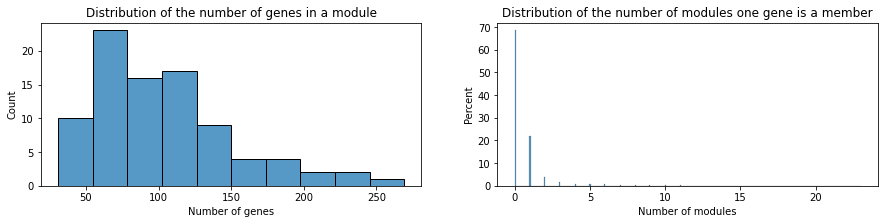

Number of genes in a module : 
- Mean : 104.52 
- Median : 92.0 
- Max : 269 
- Min : 31 

Number of modules per gene : 
- Mean : 0.62 
- Median : 0.0 
- Max : 23 
- Min : 0 

68.51 % of genes are not included in any module.
22.11 % of genes are included in only one module.
9.39 % of genes are included in more than one module.


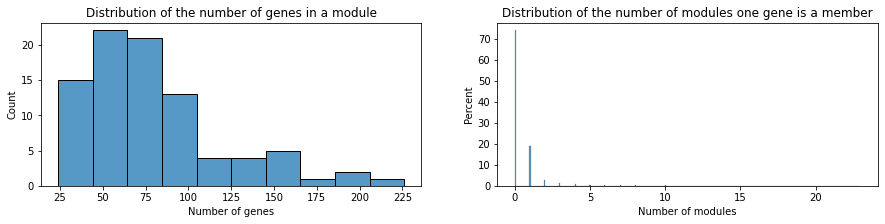

Number of genes in a module : 
- Mean : 80.53 
- Median : 68.0 
- Max : 226 
- Min : 24 

Number of modules per gene : 
- Mean : 0.48 
- Median : 0.0 
- Max : 23 
- Min : 0 

73.97 % of genes are not included in any module.
18.99 % of genes are included in only one module.
7.04 % of genes are included in more than one module.


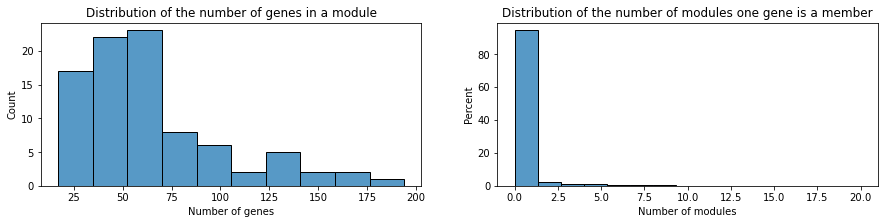

Number of genes in a module : 
- Mean : 64.34 
- Median : 54.0 
- Max : 194 
- Min : 17 

Number of modules per gene : 
- Mean : 0.38 
- Median : 0.0 
- Max : 20 
- Min : 0 

78.17 % of genes are not included in any module.
16.15 % of genes are included in only one module.
5.69 % of genes are included in more than one module.


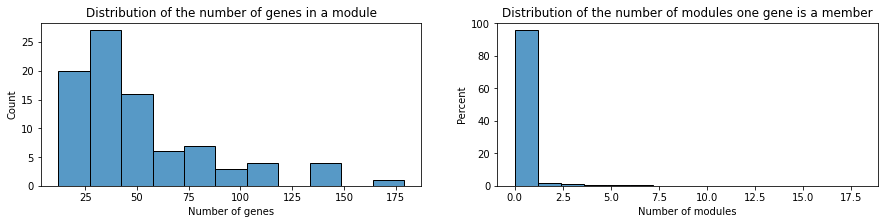

Number of genes in a module : 
- Mean : 51.94 
- Median : 41.0 
- Max : 179 
- Min : 12 

Number of modules per gene : 
- Mean : 0.31 
- Median : 0.0 
- Max : 18 
- Min : 0 

81.40 % of genes are not included in any module.
14.04 % of genes are included in only one module.
4.56 % of genes are included in more than one module.


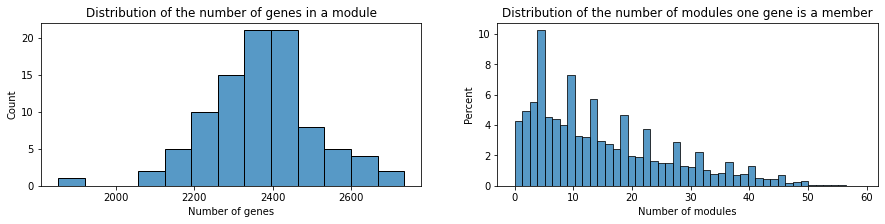

Number of genes in a module : 
- Mean : 2373.09 
- Median : 2386.5 
- Max : 2735 
- Min : 1854 

Number of modules per gene : 
- Mean : 15.06 
- Median : 12.0 
- Max : 59 
- Min : 0 

0.74 % of genes are not included in any module.
3.52 % of genes are included in only one module.
95.73 % of genes are included in more than one module.


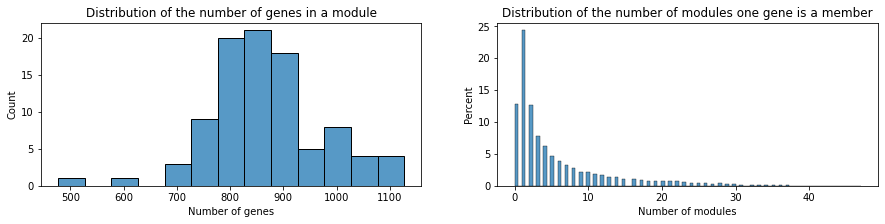

Number of genes in a module : 
- Mean : 866.99 
- Median : 865.0 
- Max : 1127 
- Min : 477 

Number of modules per gene : 
- Mean : 5.50 
- Median : 3.0 
- Max : 47 
- Min : 0 

12.82 % of genes are not included in any module.
24.31 % of genes are included in only one module.
62.87 % of genes are included in more than one module.


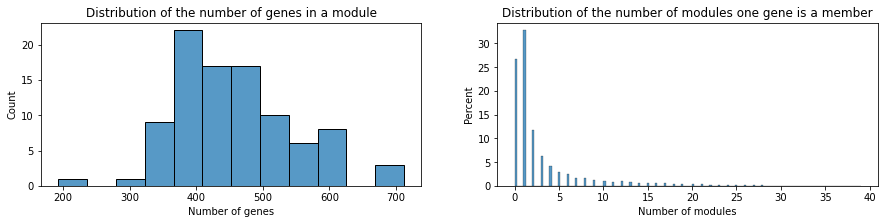

Number of genes in a module : 
- Mean : 457.80 
- Median : 440.0 
- Max : 712 
- Min : 193 

Number of modules per gene : 
- Mean : 2.91 
- Median : 1.0 
- Max : 39 
- Min : 0 

26.76 % of genes are not included in any module.
32.72 % of genes are included in only one module.
40.52 % of genes are included in more than one module.


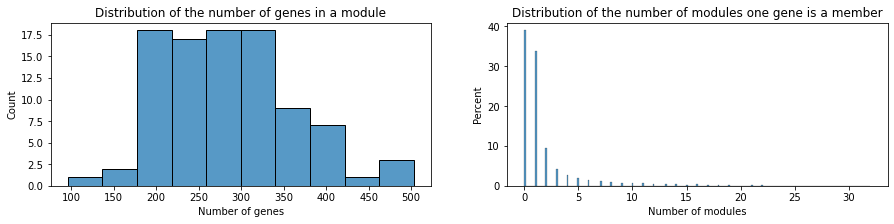

Number of genes in a module : 
- Mean : 285.27 
- Median : 270.0 
- Max : 503 
- Min : 96 

Number of modules per gene : 
- Mean : 1.81 
- Median : 1.0 
- Max : 32 
- Min : 0 

39.00 % of genes are not included in any module.
33.86 % of genes are included in only one module.
27.15 % of genes are included in more than one module.


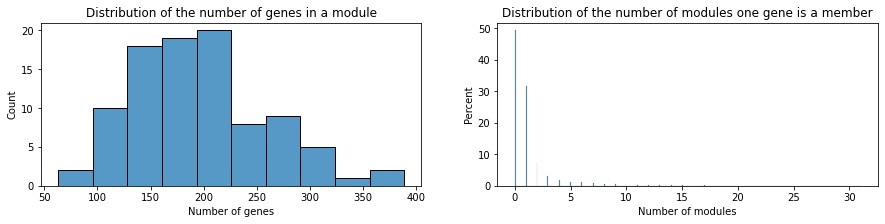

Number of genes in a module : 
- Mean : 195.95 
- Median : 188.0 
- Max : 389 
- Min : 63 

Number of modules per gene : 
- Mean : 1.24 
- Median : 1.0 
- Max : 31 
- Min : 0 

49.34 % of genes are not included in any module.
31.70 % of genes are included in only one module.
18.96 % of genes are included in more than one module.


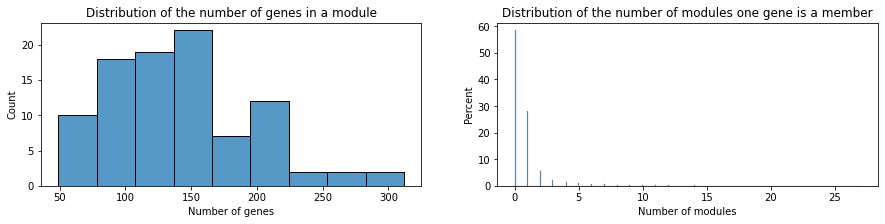

Number of genes in a module : 
- Mean : 141.05 
- Median : 135.5 
- Max : 312 
- Min : 49 

Number of modules per gene : 
- Mean : 0.90 
- Median : 0.0 
- Max : 27 
- Min : 0 

58.41 % of genes are not included in any module.
27.98 % of genes are included in only one module.
13.61 % of genes are included in more than one module.


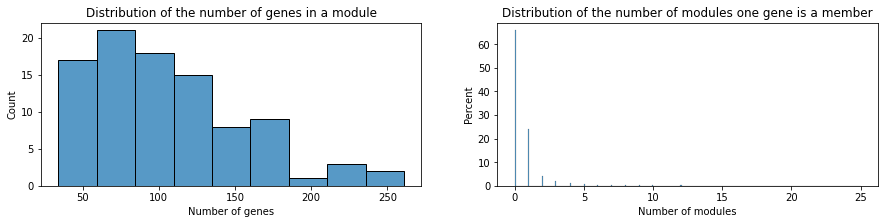

Number of genes in a module : 
- Mean : 105.73 
- Median : 97.0 
- Max : 261 
- Min : 34 

Number of modules per gene : 
- Mean : 0.67 
- Median : 0.0 
- Max : 25 
- Min : 0 

65.76 % of genes are not included in any module.
23.92 % of genes are included in only one module.
10.32 % of genes are included in more than one module.


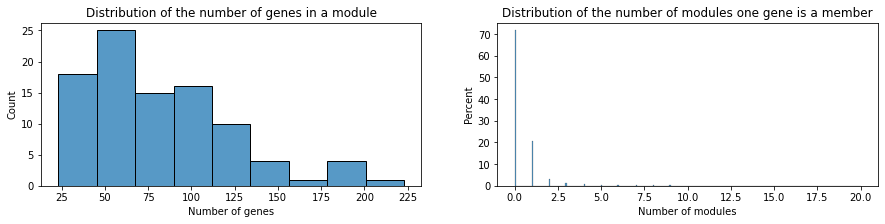

Number of genes in a module : 
- Mean : 81.85 
- Median : 70.5 
- Max : 223 
- Min : 23 

Number of modules per gene : 
- Mean : 0.52 
- Median : 0.0 
- Max : 20 
- Min : 0 

71.67 % of genes are not included in any module.
20.49 % of genes are included in only one module.
7.83 % of genes are included in more than one module.


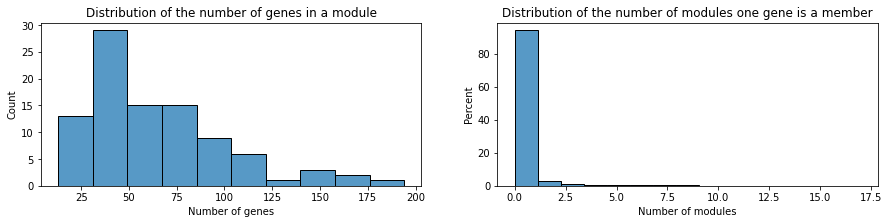

Number of genes in a module : 
- Mean : 63.88 
- Median : 54.0 
- Max : 194 
- Min : 13 

Number of modules per gene : 
- Mean : 0.41 
- Median : 0.0 
- Max : 17 
- Min : 0 

76.53 % of genes are not included in any module.
17.42 % of genes are included in only one module.
6.05 % of genes are included in more than one module.


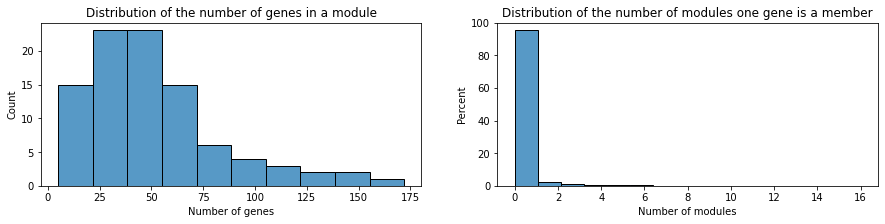

Number of genes in a module : 
- Mean : 51.07 
- Median : 41.0 
- Max : 172 
- Min : 5 

Number of modules per gene : 
- Mean : 0.32 
- Median : 0.0 
- Max : 16 
- Min : 0 

80.15 % of genes are not included in any module.
15.14 % of genes are included in only one module.
4.71 % of genes are included in more than one module.


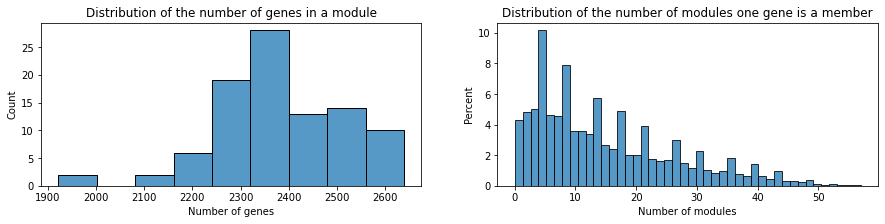

Number of genes in a module : 
- Mean : 2378.96 
- Median : 2379.5 
- Max : 2639 
- Min : 1922 

Number of modules per gene : 
- Mean : 15.10 
- Median : 12.0 
- Max : 57 
- Min : 0 

0.74 % of genes are not included in any module.
3.59 % of genes are included in only one module.
95.68 % of genes are included in more than one module.


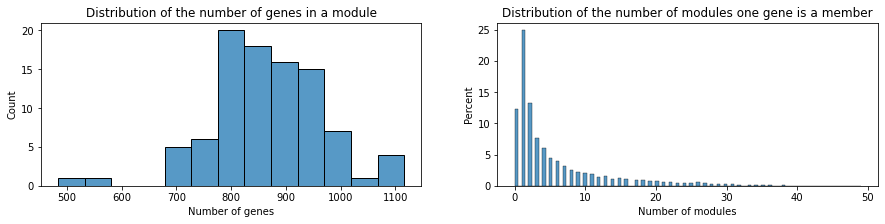

Number of genes in a module : 
- Mean : 866.12 
- Median : 859.0 
- Max : 1116 
- Min : 484 

Number of modules per gene : 
- Mean : 5.50 
- Median : 2.0 
- Max : 49 
- Min : 0 

12.30 % of genes are not included in any module.
24.86 % of genes are included in only one module.
62.84 % of genes are included in more than one module.


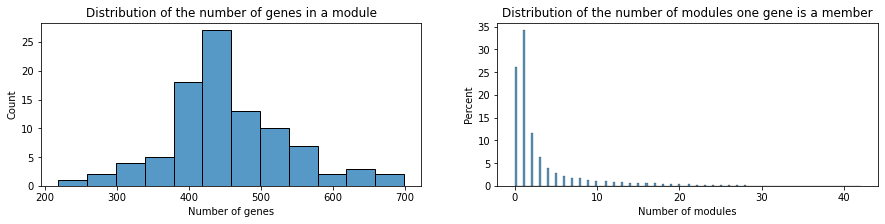

Number of genes in a module : 
- Mean : 454.33 
- Median : 446.0 
- Max : 699 
- Min : 218 

Number of modules per gene : 
- Mean : 2.88 
- Median : 1.0 
- Max : 42 
- Min : 0 

26.17 % of genes are not included in any module.
34.13 % of genes are included in only one module.
39.70 % of genes are included in more than one module.


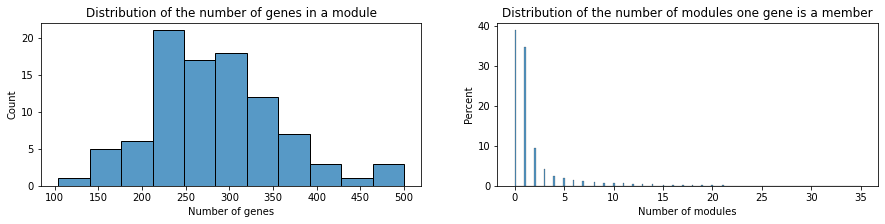

Number of genes in a module : 
- Mean : 283.09 
- Median : 276.0 
- Max : 500 
- Min : 104 

Number of modules per gene : 
- Mean : 1.80 
- Median : 1.0 
- Max : 35 
- Min : 0 

38.81 % of genes are not included in any module.
34.56 % of genes are included in only one module.
26.63 % of genes are included in more than one module.


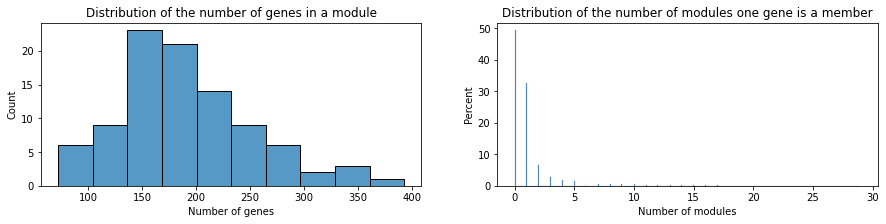

Number of genes in a module : 
- Mean : 193.60 
- Median : 182.5 
- Max : 393 
- Min : 72 

Number of modules per gene : 
- Mean : 1.23 
- Median : 1.0 
- Max : 29 
- Min : 0 

49.25 % of genes are not included in any module.
32.74 % of genes are included in only one module.
18.02 % of genes are included in more than one module.


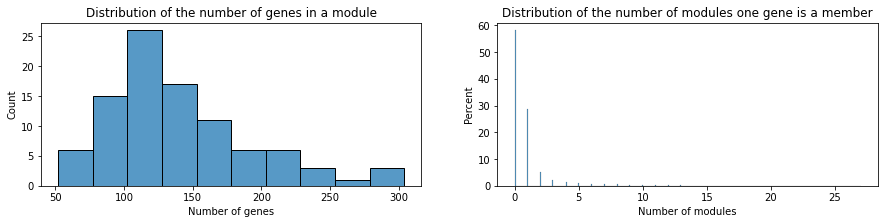

Number of genes in a module : 
- Mean : 140.46 
- Median : 128.0 
- Max : 304 
- Min : 52 

Number of modules per gene : 
- Mean : 0.89 
- Median : 0.0 
- Max : 27 
- Min : 0 

58.11 % of genes are not included in any module.
28.72 % of genes are included in only one module.
13.17 % of genes are included in more than one module.


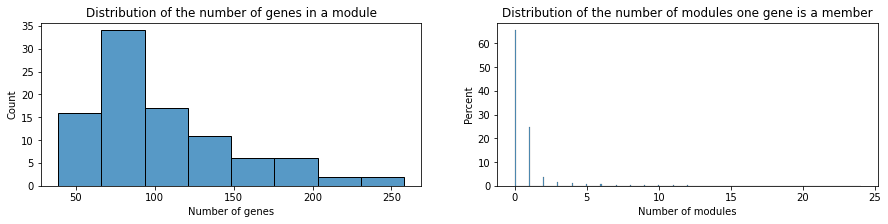

Number of genes in a module : 
- Mean : 105.30 
- Median : 89.5 
- Max : 258 
- Min : 39 

Number of modules per gene : 
- Mean : 0.67 
- Median : 0.0 
- Max : 24 
- Min : 0 

65.45 % of genes are not included in any module.
24.78 % of genes are included in only one module.
9.78 % of genes are included in more than one module.


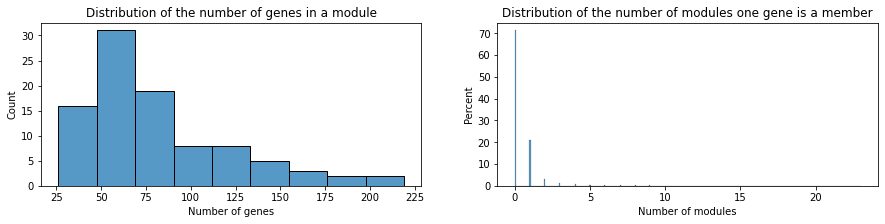

Number of genes in a module : 
- Mean : 81.82 
- Median : 67.5 
- Max : 219 
- Min : 26 

Number of modules per gene : 
- Mean : 0.52 
- Median : 0.0 
- Max : 23 
- Min : 0 

71.25 % of genes are not included in any module.
21.23 % of genes are included in only one module.
7.52 % of genes are included in more than one module.


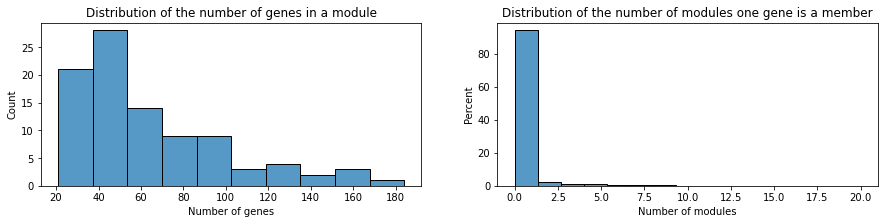

Number of genes in a module : 
- Mean : 63.59 
- Median : 51.5 
- Max : 184 
- Min : 21 

Number of modules per gene : 
- Mean : 0.40 
- Median : 0.0 
- Max : 20 
- Min : 0 

76.28 % of genes are not included in any module.
17.87 % of genes are included in only one module.
5.85 % of genes are included in more than one module.


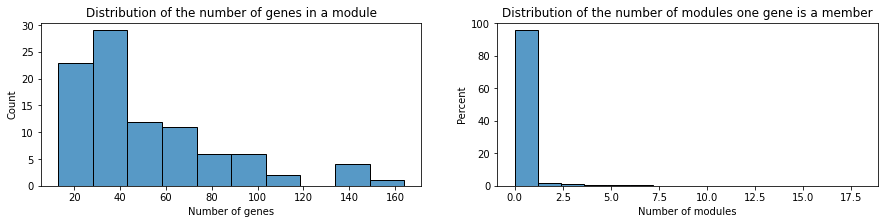

Number of genes in a module : 
- Mean : 51.00 
- Median : 40.5 
- Max : 164 
- Min : 13 

Number of modules per gene : 
- Mean : 0.32 
- Median : 0.0 
- Max : 18 
- Min : 0 

80.20 % of genes are not included in any module.
15.21 % of genes are included in only one module.
4.59 % of genes are included in more than one module.


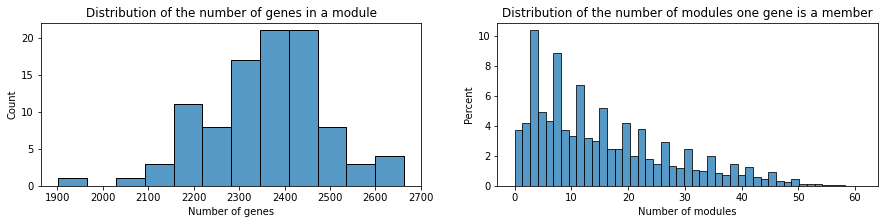

Number of genes in a module : 
- Mean : 2358.74 
- Median : 2371.0 
- Max : 2663 
- Min : 1902 

Number of modules per gene : 
- Mean : 15.61 
- Median : 12.0 
- Max : 61 
- Min : 0 

0.49 % of genes are not included in any module.
3.25 % of genes are included in only one module.
96.26 % of genes are included in more than one module.


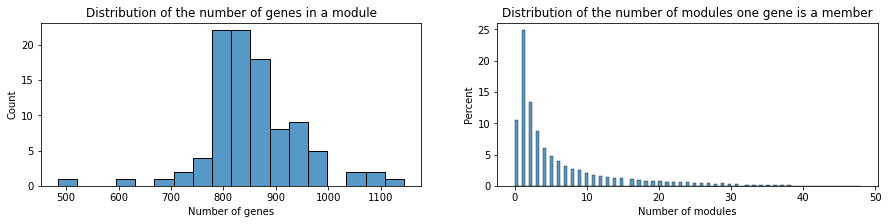

Number of genes in a module : 
- Mean : 857.11 
- Median : 845.0 
- Max : 1145 
- Min : 485 

Number of modules per gene : 
- Mean : 5.67 
- Median : 3.0 
- Max : 48 
- Min : 0 

10.48 % of genes are not included in any module.
24.84 % of genes are included in only one module.
64.68 % of genes are included in more than one module.


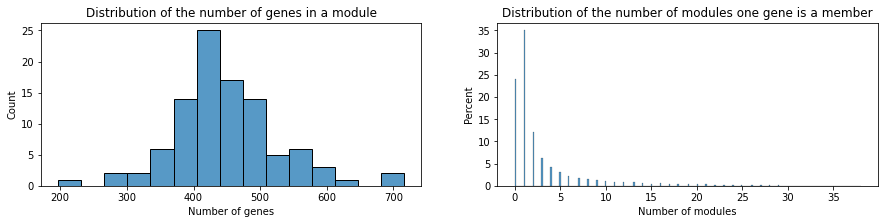

Number of genes in a module : 
- Mean : 448.07 
- Median : 438.5 
- Max : 716 
- Min : 197 

Number of modules per gene : 
- Mean : 2.97 
- Median : 1.0 
- Max : 38 
- Min : 0 

24.01 % of genes are not included in any module.
34.98 % of genes are included in only one module.
41.02 % of genes are included in more than one module.


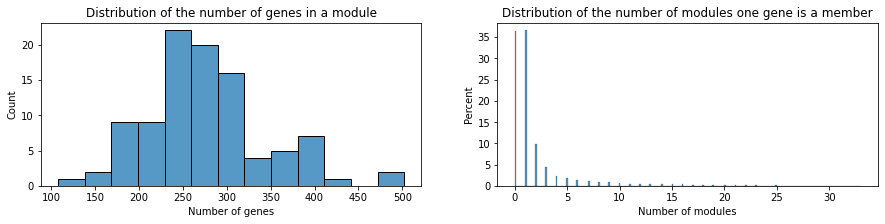

Number of genes in a module : 
- Mean : 277.66 
- Median : 269.5 
- Max : 502 
- Min : 108 

Number of modules per gene : 
- Mean : 1.84 
- Median : 1.0 
- Max : 33 
- Min : 0 

36.40 % of genes are not included in any module.
36.53 % of genes are included in only one module.
27.07 % of genes are included in more than one module.


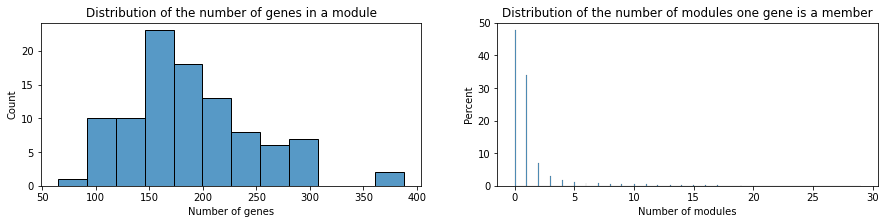

Number of genes in a module : 
- Mean : 189.12 
- Median : 179.5 
- Max : 388 
- Min : 65 

Number of modules per gene : 
- Mean : 1.25 
- Median : 1.0 
- Max : 29 
- Min : 0 

47.67 % of genes are not included in any module.
34.01 % of genes are included in only one module.
18.32 % of genes are included in more than one module.


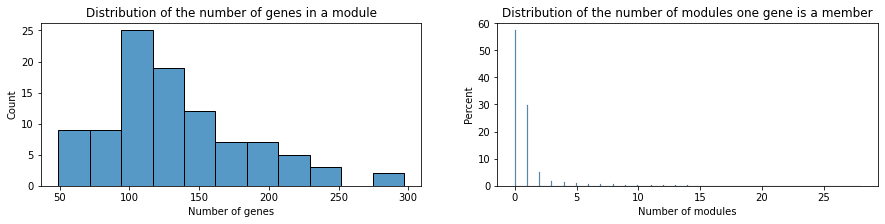

Number of genes in a module : 
- Mean : 135.91 
- Median : 125.5 
- Max : 297 
- Min : 49 

Number of modules per gene : 
- Mean : 0.90 
- Median : 0.0 
- Max : 28 
- Min : 0 

57.28 % of genes are not included in any module.
29.73 % of genes are included in only one module.
12.99 % of genes are included in more than one module.


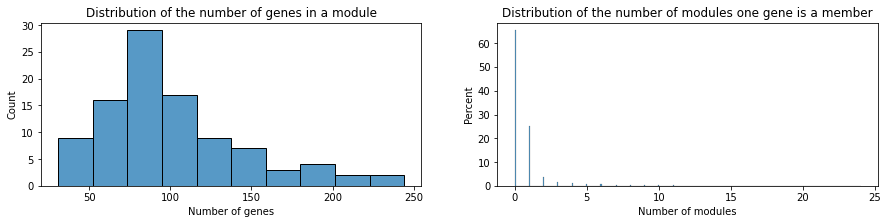

Number of genes in a module : 
- Mean : 101.43 
- Median : 89.0 
- Max : 244 
- Min : 31 

Number of modules per gene : 
- Mean : 0.67 
- Median : 0.0 
- Max : 24 
- Min : 0 

65.35 % of genes are not included in any module.
25.15 % of genes are included in only one module.
9.50 % of genes are included in more than one module.


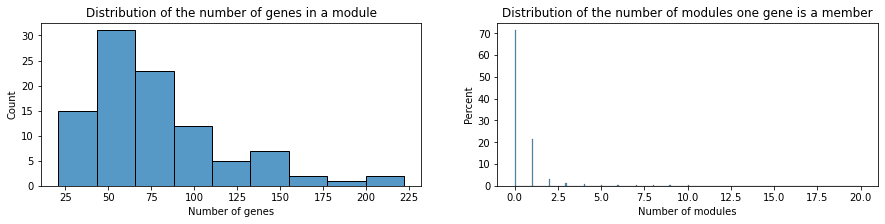

Number of genes in a module : 
- Mean : 78.59 
- Median : 68.5 
- Max : 222 
- Min : 21 

Number of modules per gene : 
- Mean : 0.52 
- Median : 0.0 
- Max : 20 
- Min : 0 

71.22 % of genes are not included in any module.
21.26 % of genes are included in only one module.
7.52 % of genes are included in more than one module.


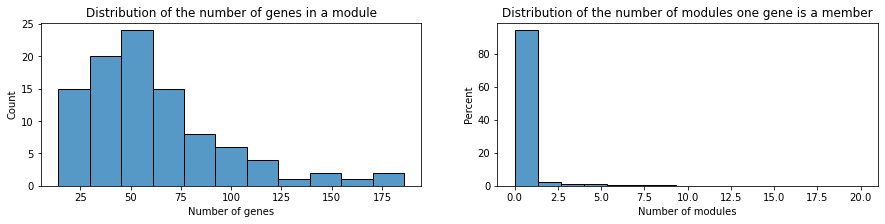

Number of genes in a module : 
- Mean : 61.23 
- Median : 53.0 
- Max : 186 
- Min : 14 

Number of modules per gene : 
- Mean : 0.41 
- Median : 0.0 
- Max : 20 
- Min : 0 

76.16 % of genes are not included in any module.
18.02 % of genes are included in only one module.
5.82 % of genes are included in more than one module.


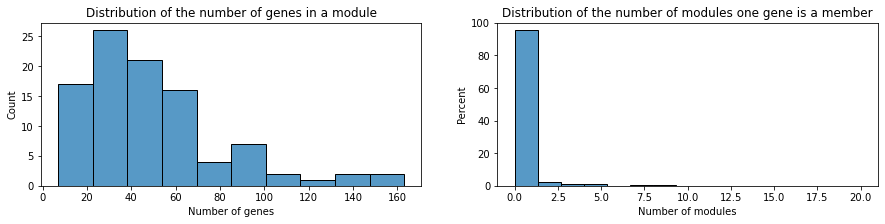

Number of genes in a module : 
- Mean : 49.49 
- Median : 42.5 
- Max : 163 
- Min : 7 

Number of modules per gene : 
- Mean : 0.33 
- Median : 0.0 
- Max : 20 
- Min : 0 

79.78 % of genes are not included in any module.
15.56 % of genes are included in only one module.
4.67 % of genes are included in more than one module.


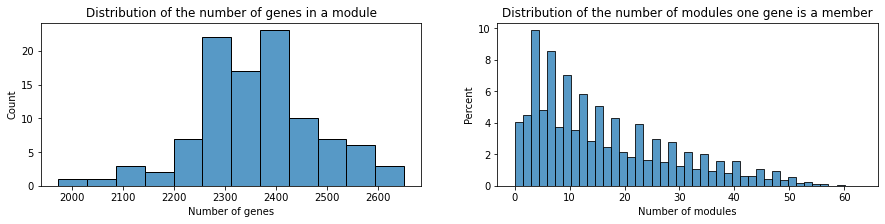

Number of genes in a module : 
- Mean : 2360.37 
- Median : 2361.0 
- Max : 2651 
- Min : 1974 

Number of modules per gene : 
- Mean : 16.26 
- Median : 13.0 
- Max : 63 
- Min : 0 

0.75 % of genes are not included in any module.
3.30 % of genes are included in only one module.
95.95 % of genes are included in more than one module.


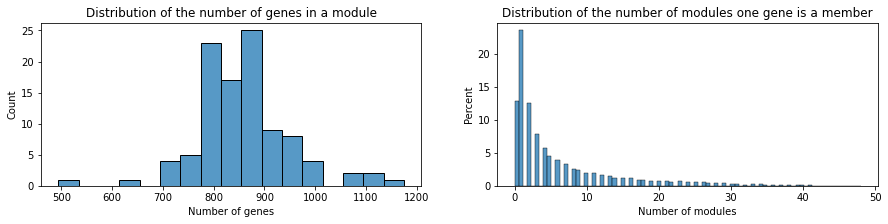

Number of genes in a module : 
- Mean : 855.95 
- Median : 853.0 
- Max : 1175 
- Min : 494 

Number of modules per gene : 
- Mean : 5.90 
- Median : 3.0 
- Max : 48 
- Min : 0 

12.88 % of genes are not included in any module.
23.55 % of genes are included in only one module.
63.56 % of genes are included in more than one module.


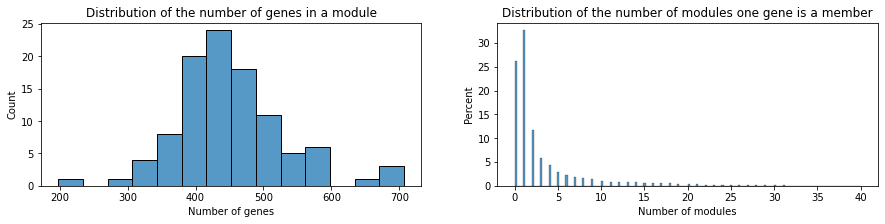

Number of genes in a module : 
- Mean : 451.47 
- Median : 438.5 
- Max : 707 
- Min : 198 

Number of modules per gene : 
- Mean : 3.11 
- Median : 1.0 
- Max : 40 
- Min : 0 

26.27 % of genes are not included in any module.
32.60 % of genes are included in only one module.
41.13 % of genes are included in more than one module.


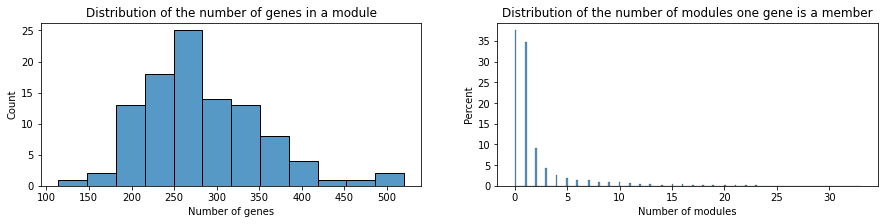

Number of genes in a module : 
- Mean : 283.99 
- Median : 264.0 
- Max : 520 
- Min : 114 

Number of modules per gene : 
- Mean : 1.96 
- Median : 1.0 
- Max : 33 
- Min : 0 

37.53 % of genes are not included in any module.
34.79 % of genes are included in only one module.
27.68 % of genes are included in more than one module.


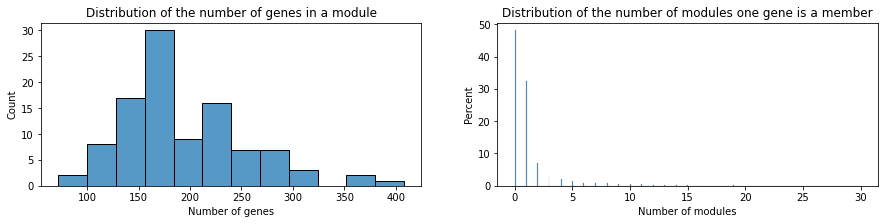

Number of genes in a module : 
- Mean : 194.04 
- Median : 176.5 
- Max : 408 
- Min : 72 

Number of modules per gene : 
- Mean : 1.34 
- Median : 1.0 
- Max : 30 
- Min : 0 

48.07 % of genes are not included in any module.
32.57 % of genes are included in only one module.
19.35 % of genes are included in more than one module.


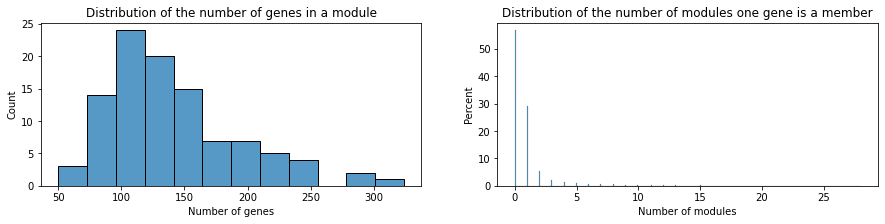

Number of genes in a module : 
- Mean : 141.07 
- Median : 128.0 
- Max : 324 
- Min : 50 

Number of modules per gene : 
- Mean : 0.97 
- Median : 0.0 
- Max : 28 
- Min : 0 

56.73 % of genes are not included in any module.
29.08 % of genes are included in only one module.
14.19 % of genes are included in more than one module.


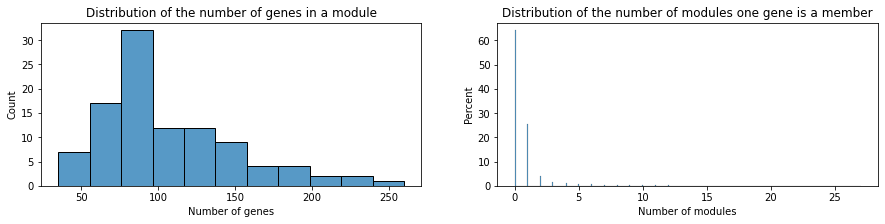

Number of genes in a module : 
- Mean : 106.46 
- Median : 94.0 
- Max : 260 
- Min : 35 

Number of modules per gene : 
- Mean : 0.73 
- Median : 0.0 
- Max : 27 
- Min : 0 

64.03 % of genes are not included in any module.
25.34 % of genes are included in only one module.
10.63 % of genes are included in more than one module.


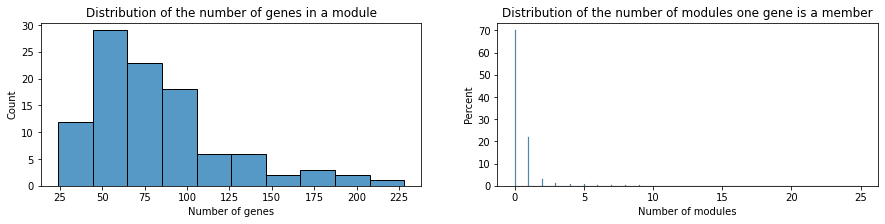

Number of genes in a module : 
- Mean : 82.48 
- Median : 69.5 
- Max : 228 
- Min : 24 

Number of modules per gene : 
- Mean : 0.57 
- Median : 0.0 
- Max : 25 
- Min : 0 

69.98 % of genes are not included in any module.
21.76 % of genes are included in only one module.
8.26 % of genes are included in more than one module.


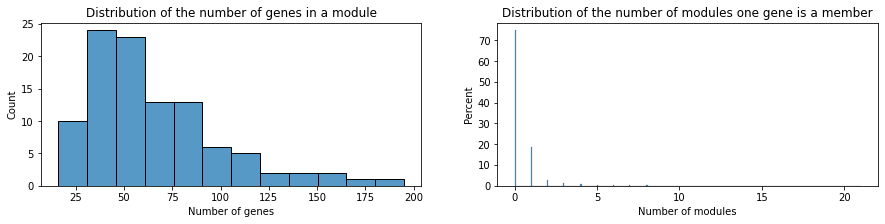

Number of genes in a module : 
- Mean : 65.44 
- Median : 55.0 
- Max : 195 
- Min : 16 

Number of modules per gene : 
- Mean : 0.45 
- Median : 0.0 
- Max : 21 
- Min : 0 

74.74 % of genes are not included in any module.
18.67 % of genes are included in only one module.
6.59 % of genes are included in more than one module.


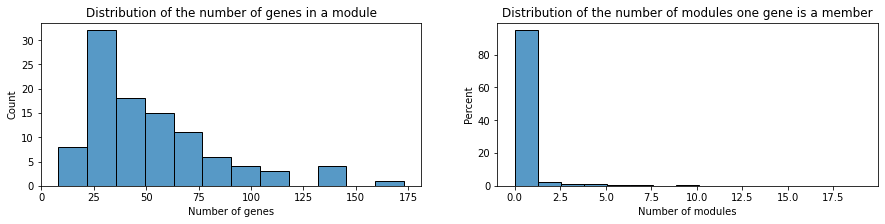

Number of genes in a module : 
- Mean : 52.60 
- Median : 43.0 
- Max : 173 
- Min : 8 

Number of modules per gene : 
- Mean : 0.36 
- Median : 0.0 
- Max : 19 
- Min : 0 

78.78 % of genes are not included in any module.
15.95 % of genes are included in only one module.
5.27 % of genes are included in more than one module.


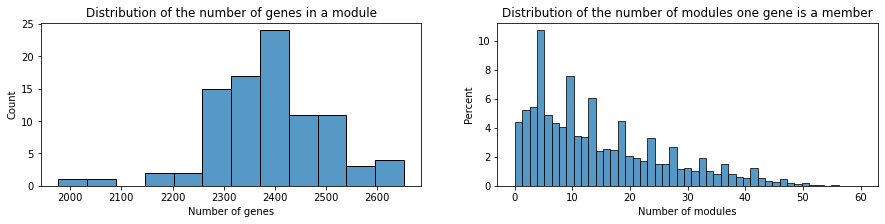

Number of genes in a module : 
- Mean : 2387.68 
- Median : 2387.0 
- Max : 2652 
- Min : 1977 

Number of modules per gene : 
- Mean : 14.67 
- Median : 12.0 
- Max : 60 
- Min : 0 

0.70 % of genes are not included in any module.
3.71 % of genes are included in only one module.
95.59 % of genes are included in more than one module.


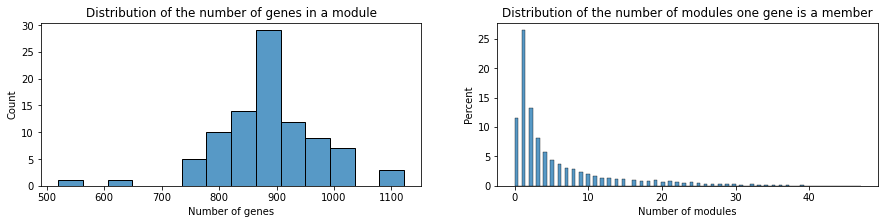

Number of genes in a module : 
- Mean : 885.38 
- Median : 886.0 
- Max : 1122 
- Min : 520 

Number of modules per gene : 
- Mean : 5.44 
- Median : 2.0 
- Max : 47 
- Min : 0 

11.47 % of genes are not included in any module.
26.42 % of genes are included in only one module.
62.12 % of genes are included in more than one module.


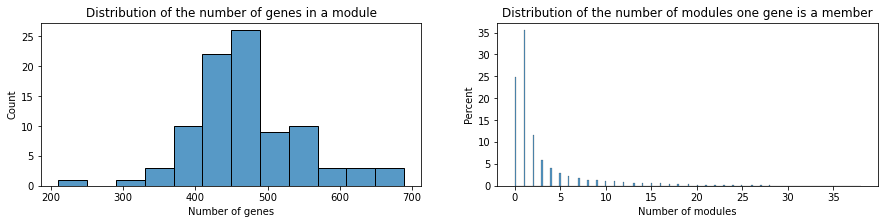

Number of genes in a module : 
- Mean : 471.29 
- Median : 462.0 
- Max : 689 
- Min : 210 

Number of modules per gene : 
- Mean : 2.90 
- Median : 1.0 
- Max : 38 
- Min : 0 

24.93 % of genes are not included in any module.
35.46 % of genes are included in only one module.
39.60 % of genes are included in more than one module.


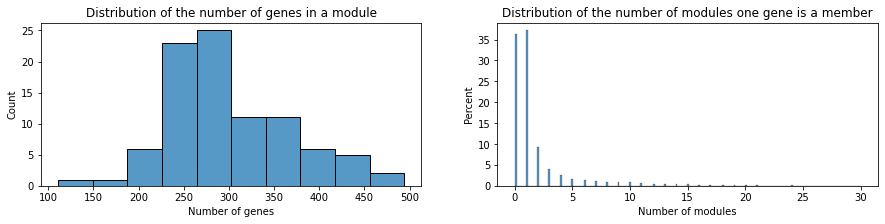

Number of genes in a module : 
- Mean : 299.95 
- Median : 291.0 
- Max : 494 
- Min : 111 

Number of modules per gene : 
- Mean : 1.84 
- Median : 1.0 
- Max : 30 
- Min : 0 

36.29 % of genes are not included in any module.
37.18 % of genes are included in only one module.
26.53 % of genes are included in more than one module.


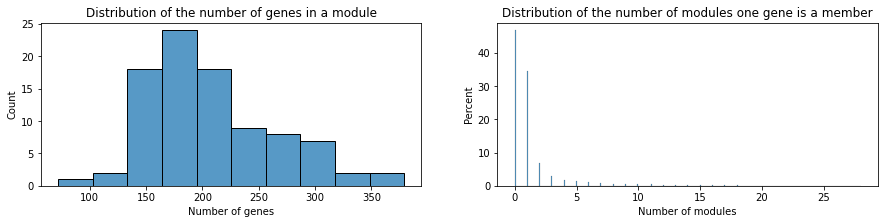

Number of genes in a module : 
- Mean : 208.10 
- Median : 198.0 
- Max : 379 
- Min : 72 

Number of modules per gene : 
- Mean : 1.28 
- Median : 1.0 
- Max : 28 
- Min : 0 

46.78 % of genes are not included in any module.
34.66 % of genes are included in only one module.
18.56 % of genes are included in more than one module.


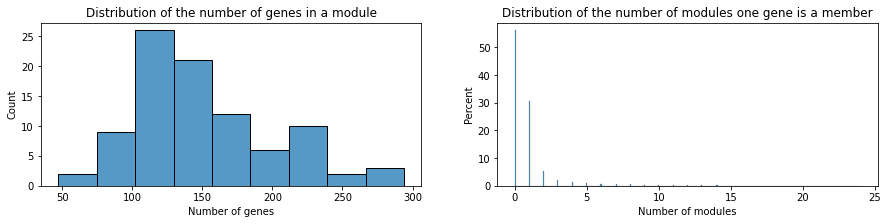

Number of genes in a module : 
- Mean : 150.64 
- Median : 143.0 
- Max : 294 
- Min : 47 

Number of modules per gene : 
- Mean : 0.93 
- Median : 0.0 
- Max : 24 
- Min : 0 

56.09 % of genes are not included in any module.
30.52 % of genes are included in only one module.
13.39 % of genes are included in more than one module.


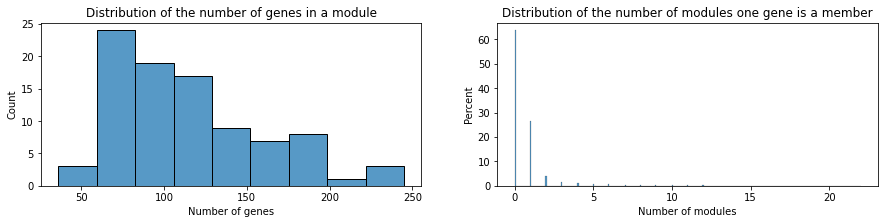

Number of genes in a module : 
- Mean : 114.76 
- Median : 104.0 
- Max : 245 
- Min : 36 

Number of modules per gene : 
- Mean : 0.71 
- Median : 0.0 
- Max : 22 
- Min : 0 

63.58 % of genes are not included in any module.
26.40 % of genes are included in only one module.
10.01 % of genes are included in more than one module.


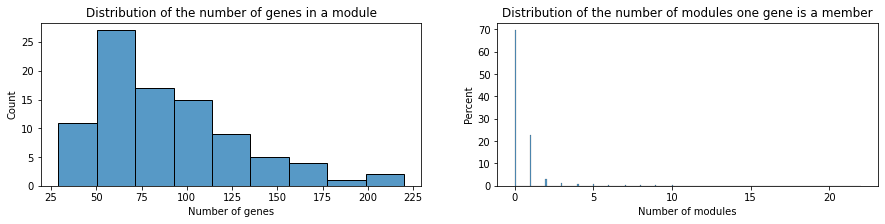

Number of genes in a module : 
- Mean : 89.60 
- Median : 81.0 
- Max : 220 
- Min : 29 

Number of modules per gene : 
- Mean : 0.55 
- Median : 0.0 
- Max : 22 
- Min : 0 

69.55 % of genes are not included in any module.
22.76 % of genes are included in only one module.
7.70 % of genes are included in more than one module.


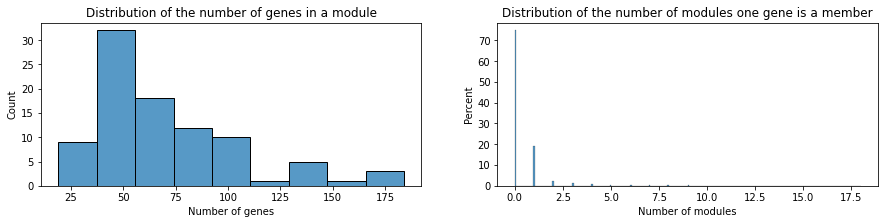

Number of genes in a module : 
- Mean : 70.49 
- Median : 62.0 
- Max : 184 
- Min : 19 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 18 
- Min : 0 

74.70 % of genes are not included in any module.
19.20 % of genes are included in only one module.
6.09 % of genes are included in more than one module.


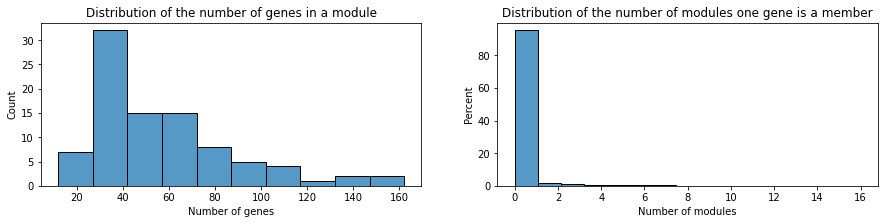

Number of genes in a module : 
- Mean : 56.45 
- Median : 49.0 
- Max : 162 
- Min : 12 

Number of modules per gene : 
- Mean : 0.35 
- Median : 0.0 
- Max : 16 
- Min : 0 

78.78 % of genes are not included in any module.
16.38 % of genes are included in only one module.
4.84 % of genes are included in more than one module.


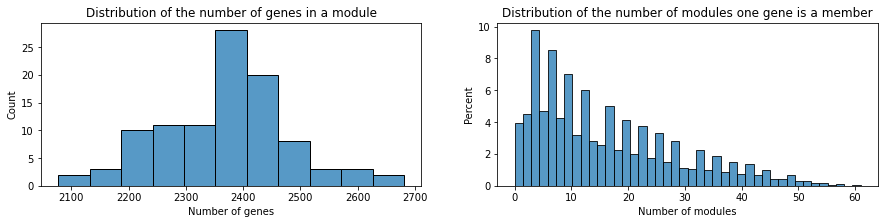

Number of genes in a module : 
- Mean : 2368.06 
- Median : 2381.0 
- Max : 2681 
- Min : 2077 

Number of modules per gene : 
- Mean : 16.15 
- Median : 13.0 
- Max : 61 
- Min : 0 

0.57 % of genes are not included in any module.
3.39 % of genes are included in only one module.
96.04 % of genes are included in more than one module.


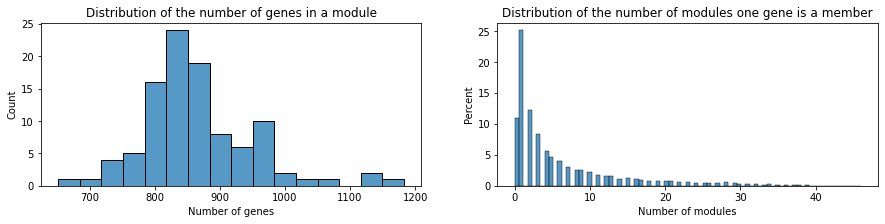

Number of genes in a module : 
- Mean : 865.05 
- Median : 851.0 
- Max : 1183 
- Min : 652 

Number of modules per gene : 
- Mean : 5.90 
- Median : 3.0 
- Max : 46 
- Min : 0 

10.99 % of genes are not included in any module.
25.11 % of genes are included in only one module.
63.91 % of genes are included in more than one module.


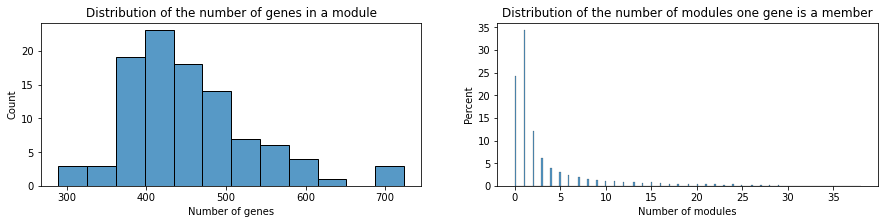

Number of genes in a module : 
- Mean : 454.50 
- Median : 440.0 
- Max : 724 
- Min : 289 

Number of modules per gene : 
- Mean : 3.10 
- Median : 1.0 
- Max : 38 
- Min : 0 

24.30 % of genes are not included in any module.
34.30 % of genes are included in only one module.
41.39 % of genes are included in more than one module.


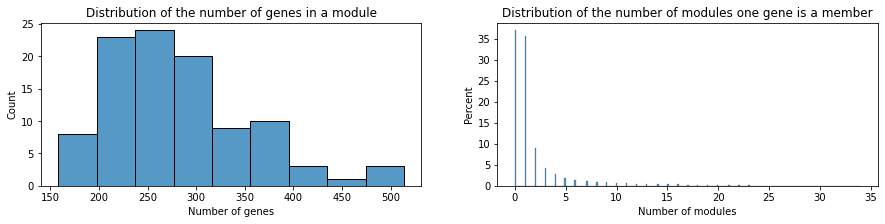

Number of genes in a module : 
- Mean : 282.79 
- Median : 273.0 
- Max : 514 
- Min : 158 

Number of modules per gene : 
- Mean : 1.93 
- Median : 1.0 
- Max : 34 
- Min : 0 

36.96 % of genes are not included in any module.
35.69 % of genes are included in only one module.
27.35 % of genes are included in more than one module.


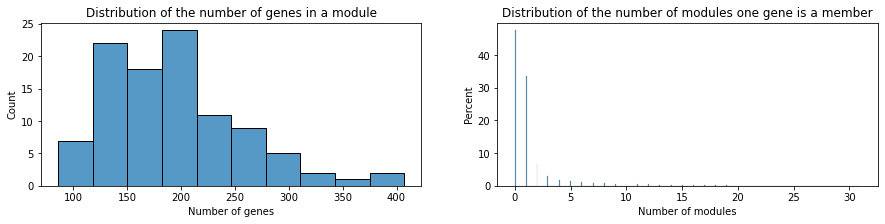

Number of genes in a module : 
- Mean : 193.93 
- Median : 186.0 
- Max : 407 
- Min : 86 

Number of modules per gene : 
- Mean : 1.32 
- Median : 1.0 
- Max : 31 
- Min : 0 

47.50 % of genes are not included in any module.
33.50 % of genes are included in only one module.
19.00 % of genes are included in more than one module.


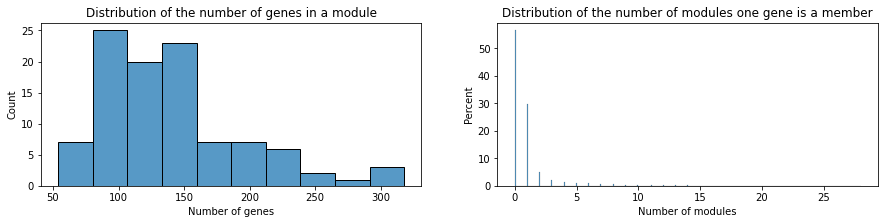

Number of genes in a module : 
- Mean : 140.35 
- Median : 133.0 
- Max : 318 
- Min : 54 

Number of modules per gene : 
- Mean : 0.96 
- Median : 0.0 
- Max : 28 
- Min : 0 

56.42 % of genes are not included in any module.
29.85 % of genes are included in only one module.
13.73 % of genes are included in more than one module.


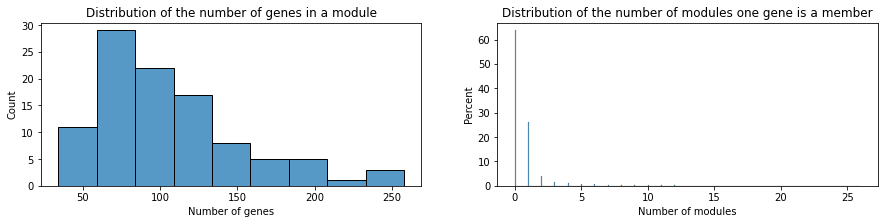

Number of genes in a module : 
- Mean : 105.29 
- Median : 98.0 
- Max : 258 
- Min : 34 

Number of modules per gene : 
- Mean : 0.72 
- Median : 0.0 
- Max : 26 
- Min : 0 

63.73 % of genes are not included in any module.
26.04 % of genes are included in only one module.
10.23 % of genes are included in more than one module.


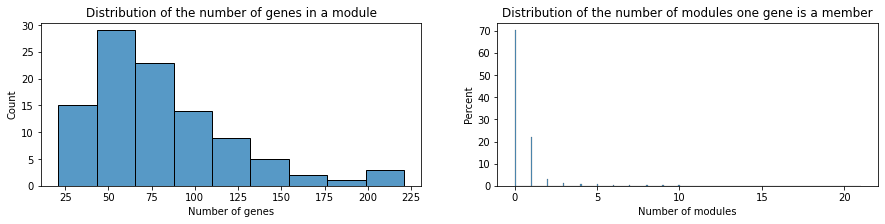

Number of genes in a module : 
- Mean : 80.98 
- Median : 73.0 
- Max : 221 
- Min : 21 

Number of modules per gene : 
- Mean : 0.55 
- Median : 0.0 
- Max : 21 
- Min : 0 

70.12 % of genes are not included in any module.
22.01 % of genes are included in only one module.
7.87 % of genes are included in more than one module.


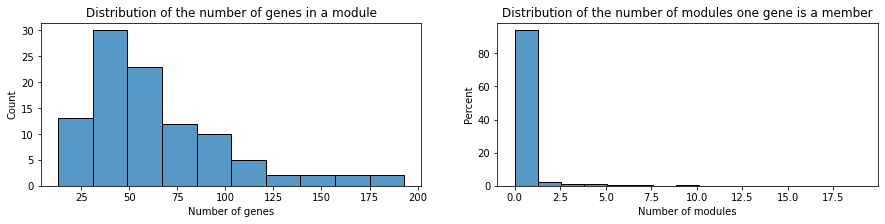

Number of genes in a module : 
- Mean : 63.67 
- Median : 56.0 
- Max : 193 
- Min : 13 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 19 
- Min : 0 

75.25 % of genes are not included in any module.
18.48 % of genes are included in only one module.
6.27 % of genes are included in more than one module.


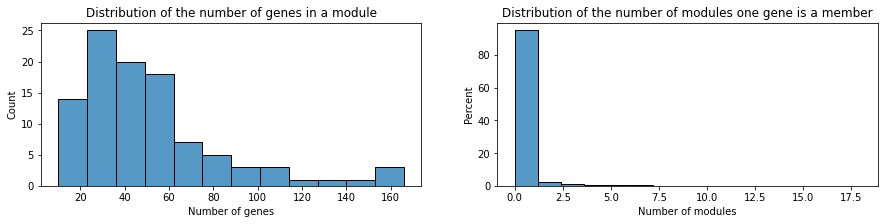

Number of genes in a module : 
- Mean : 50.79 
- Median : 43.0 
- Max : 166 
- Min : 10 

Number of modules per gene : 
- Mean : 0.35 
- Median : 0.0 
- Max : 18 
- Min : 0 

79.14 % of genes are not included in any module.
15.84 % of genes are included in only one module.
5.02 % of genes are included in more than one module.


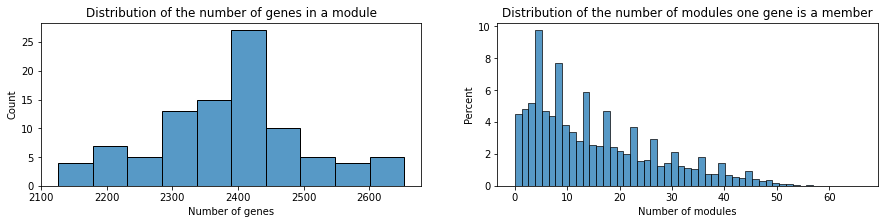

Number of genes in a module : 
- Mean : 2385.52 
- Median : 2397.0 
- Max : 2653 
- Min : 2126 

Number of modules per gene : 
- Mean : 15.30 
- Median : 12.0 
- Max : 66 
- Min : 0 

0.71 % of genes are not included in any module.
3.78 % of genes are included in only one module.
95.51 % of genes are included in more than one module.


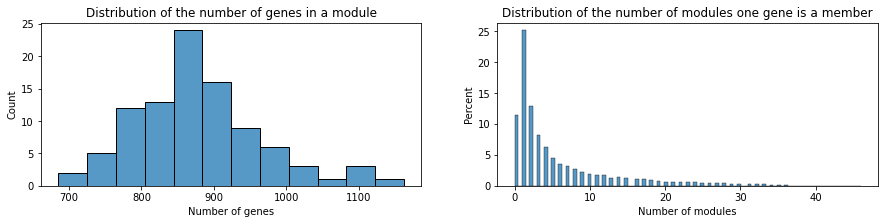

Number of genes in a module : 
- Mean : 876.87 
- Median : 860.0 
- Max : 1163 
- Min : 685 

Number of modules per gene : 
- Mean : 5.63 
- Median : 3.0 
- Max : 46 
- Min : 0 

11.45 % of genes are not included in any module.
25.13 % of genes are included in only one module.
63.43 % of genes are included in more than one module.


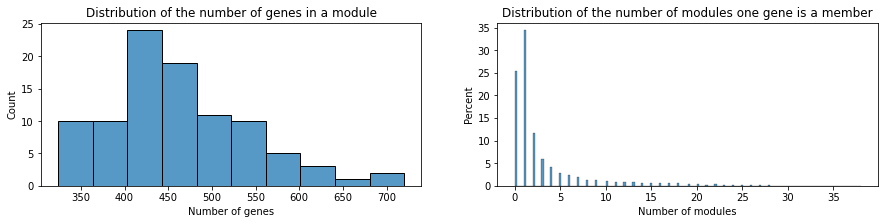

Number of genes in a module : 
- Mean : 464.36 
- Median : 449.0 
- Max : 720 
- Min : 324 

Number of modules per gene : 
- Mean : 2.98 
- Median : 1.0 
- Max : 38 
- Min : 0 

25.32 % of genes are not included in any module.
34.34 % of genes are included in only one module.
40.33 % of genes are included in more than one module.


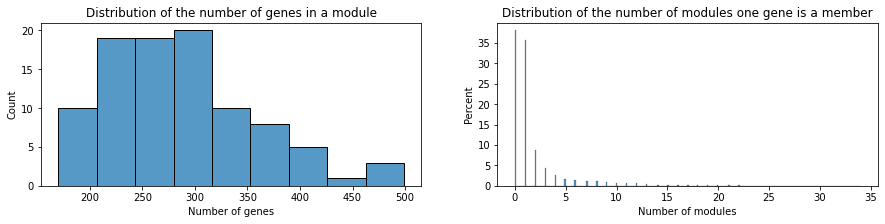

Number of genes in a module : 
- Mean : 287.91 
- Median : 272.0 
- Max : 499 
- Min : 170 

Number of modules per gene : 
- Mean : 1.85 
- Median : 1.0 
- Max : 34 
- Min : 0 

38.02 % of genes are not included in any module.
35.57 % of genes are included in only one module.
26.40 % of genes are included in more than one module.


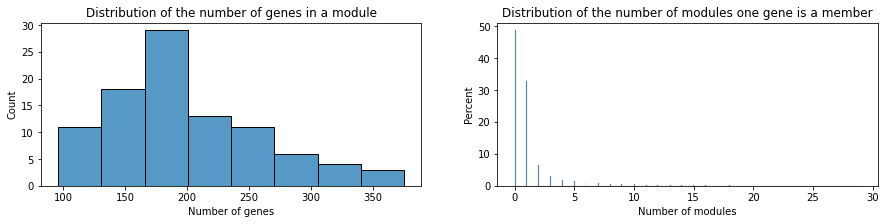

Number of genes in a module : 
- Mean : 198.67 
- Median : 183.0 
- Max : 375 
- Min : 96 

Number of modules per gene : 
- Mean : 1.27 
- Median : 1.0 
- Max : 29 
- Min : 0 

48.69 % of genes are not included in any module.
32.83 % of genes are included in only one module.
18.48 % of genes are included in more than one module.


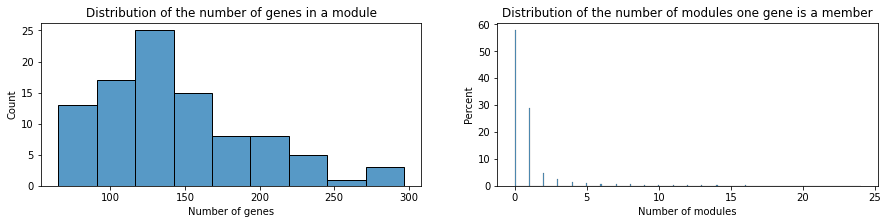

Number of genes in a module : 
- Mean : 144.71 
- Median : 134.0 
- Max : 297 
- Min : 65 

Number of modules per gene : 
- Mean : 0.93 
- Median : 0.0 
- Max : 24 
- Min : 0 

57.62 % of genes are not included in any module.
28.98 % of genes are included in only one module.
13.40 % of genes are included in more than one module.


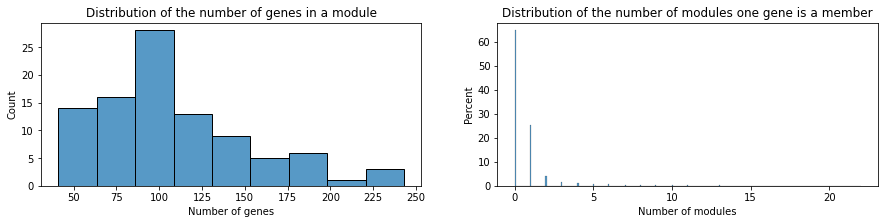

Number of genes in a module : 
- Mean : 109.26 
- Median : 101.0 
- Max : 243 
- Min : 41 

Number of modules per gene : 
- Mean : 0.70 
- Median : 0.0 
- Max : 22 
- Min : 0 

64.68 % of genes are not included in any module.
25.18 % of genes are included in only one module.
10.14 % of genes are included in more than one module.


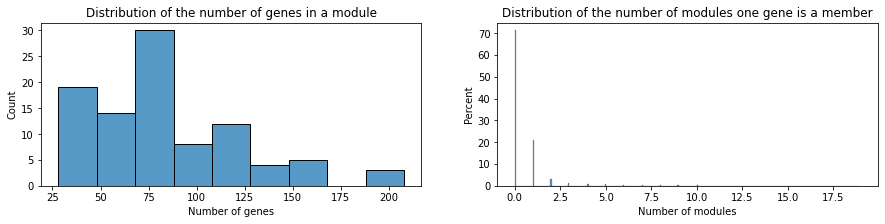

Number of genes in a module : 
- Mean : 83.17 
- Median : 74.0 
- Max : 208 
- Min : 28 

Number of modules per gene : 
- Mean : 0.53 
- Median : 0.0 
- Max : 19 
- Min : 0 

71.17 % of genes are not included in any module.
21.12 % of genes are included in only one module.
7.72 % of genes are included in more than one module.


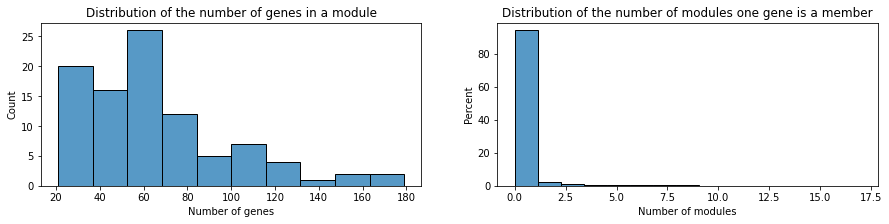

Number of genes in a module : 
- Mean : 65.77 
- Median : 57.0 
- Max : 179 
- Min : 21 

Number of modules per gene : 
- Mean : 0.42 
- Median : 0.0 
- Max : 17 
- Min : 0 

75.95 % of genes are not included in any module.
18.04 % of genes are included in only one module.
6.01 % of genes are included in more than one module.


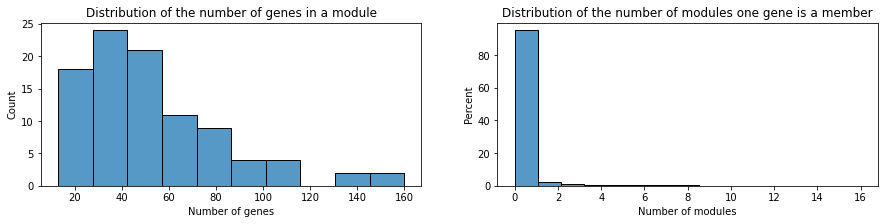

Number of genes in a module : 
- Mean : 52.80 
- Median : 44.0 
- Max : 160 
- Min : 13 

Number of modules per gene : 
- Mean : 0.34 
- Median : 0.0 
- Max : 16 
- Min : 0 

79.99 % of genes are not included in any module.
15.07 % of genes are included in only one module.
4.94 % of genes are included in more than one module.


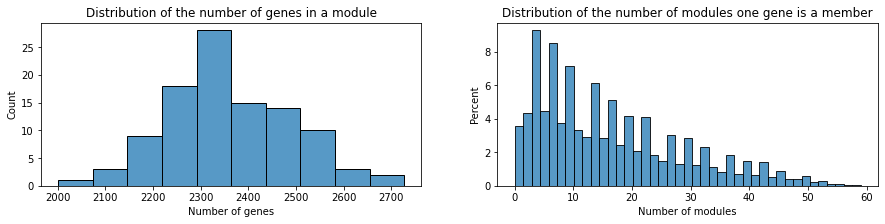

Number of genes in a module : 
- Mean : 2361.13 
- Median : 2344.0 
- Max : 2727 
- Min : 2001 

Number of modules per gene : 
- Mean : 16.42 
- Median : 13.0 
- Max : 59 
- Min : 0 

0.61 % of genes are not included in any module.
2.94 % of genes are included in only one module.
96.45 % of genes are included in more than one module.


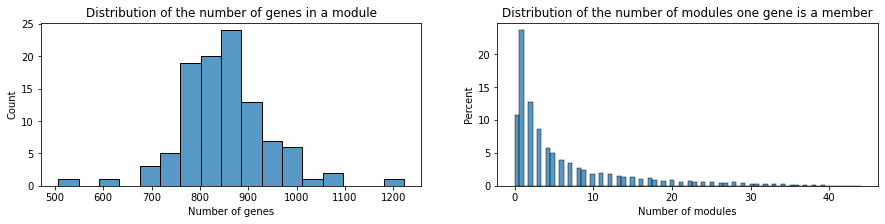

Number of genes in a module : 
- Mean : 853.49 
- Median : 846.0 
- Max : 1222 
- Min : 507 

Number of modules per gene : 
- Mean : 5.94 
- Median : 3.0 
- Max : 44 
- Min : 0 

10.74 % of genes are not included in any module.
23.60 % of genes are included in only one module.
65.66 % of genes are included in more than one module.


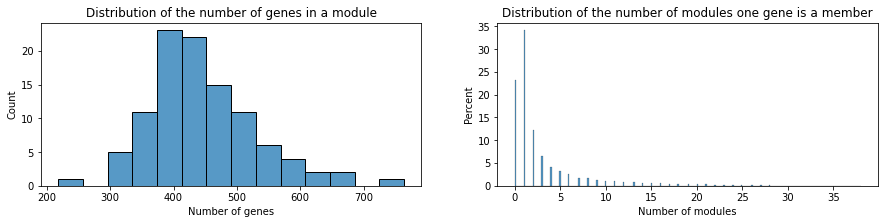

Number of genes in a module : 
- Mean : 446.18 
- Median : 434.0 
- Max : 764 
- Min : 218 

Number of modules per gene : 
- Mean : 3.10 
- Median : 1.0 
- Max : 38 
- Min : 0 

23.29 % of genes are not included in any module.
34.09 % of genes are included in only one module.
42.62 % of genes are included in more than one module.


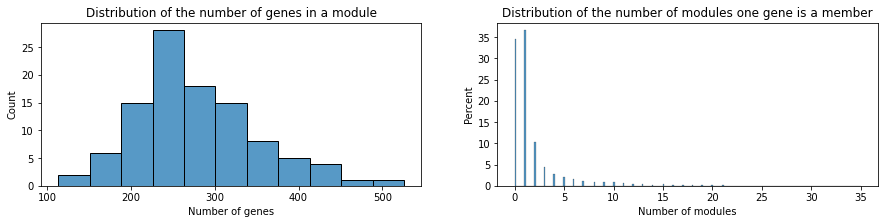

Number of genes in a module : 
- Mean : 279.05 
- Median : 266.0 
- Max : 526 
- Min : 113 

Number of modules per gene : 
- Mean : 1.94 
- Median : 1.0 
- Max : 35 
- Min : 0 

34.62 % of genes are not included in any module.
36.55 % of genes are included in only one module.
28.83 % of genes are included in more than one module.


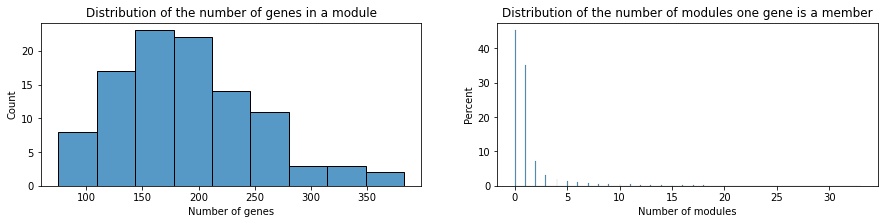

Number of genes in a module : 
- Mean : 189.80 
- Median : 180.0 
- Max : 383 
- Min : 75 

Number of modules per gene : 
- Mean : 1.32 
- Median : 1.0 
- Max : 33 
- Min : 0 

45.24 % of genes are not included in any module.
35.30 % of genes are included in only one module.
19.47 % of genes are included in more than one module.


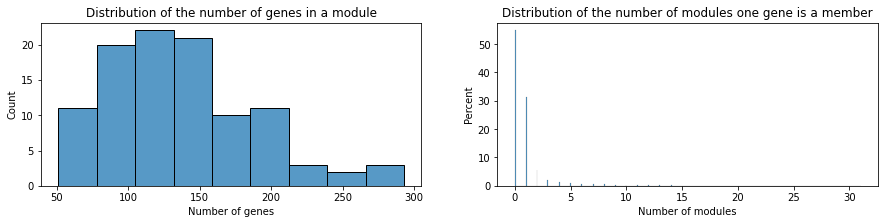

Number of genes in a module : 
- Mean : 137.43 
- Median : 129.0 
- Max : 293 
- Min : 51 

Number of modules per gene : 
- Mean : 0.96 
- Median : 0.0 
- Max : 31 
- Min : 0 

54.78 % of genes are not included in any module.
31.16 % of genes are included in only one module.
14.05 % of genes are included in more than one module.


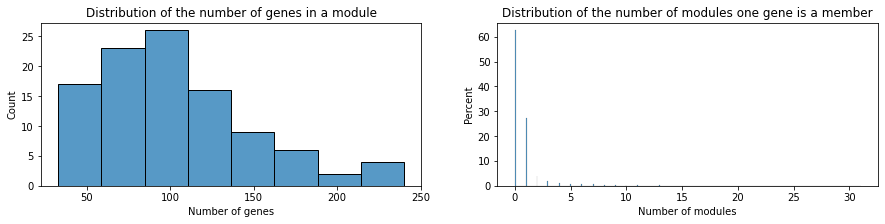

Number of genes in a module : 
- Mean : 103.41 
- Median : 96.0 
- Max : 240 
- Min : 33 

Number of modules per gene : 
- Mean : 0.72 
- Median : 0.0 
- Max : 31 
- Min : 0 

62.50 % of genes are not included in any module.
27.25 % of genes are included in only one module.
10.24 % of genes are included in more than one module.


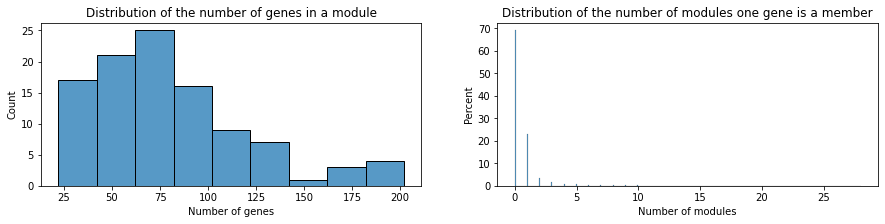

Number of genes in a module : 
- Mean : 79.43 
- Median : 70.0 
- Max : 202 
- Min : 22 

Number of modules per gene : 
- Mean : 0.55 
- Median : 0.0 
- Max : 28 
- Min : 0 

68.99 % of genes are not included in any module.
23.05 % of genes are included in only one module.
7.96 % of genes are included in more than one module.


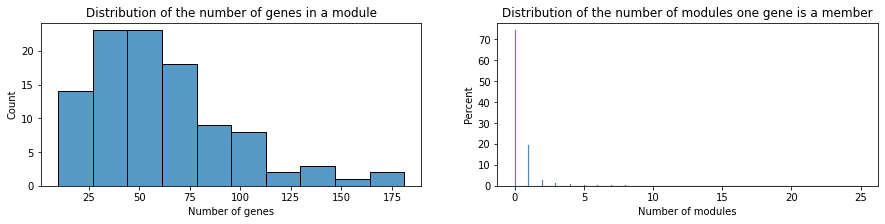

Number of genes in a module : 
- Mean : 62.01 
- Median : 53.0 
- Max : 181 
- Min : 10 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 25 
- Min : 0 

74.25 % of genes are not included in any module.
19.64 % of genes are included in only one module.
6.11 % of genes are included in more than one module.


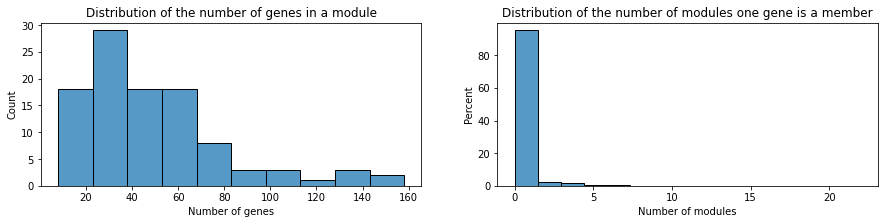

Number of genes in a module : 
- Mean : 49.52 
- Median : 42.0 
- Max : 158 
- Min : 8 

Number of modules per gene : 
- Mean : 0.34 
- Median : 0.0 
- Max : 22 
- Min : 0 

78.40 % of genes are not included in any module.
16.78 % of genes are included in only one module.
4.82 % of genes are included in more than one module.


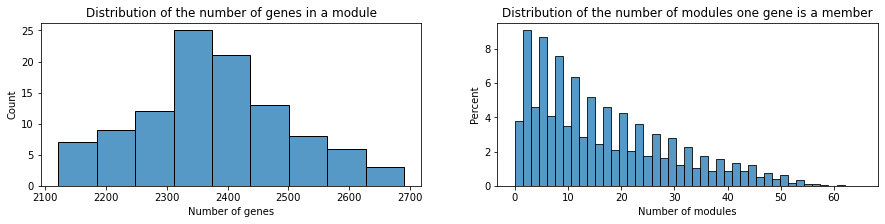

Number of genes in a module : 
- Mean : 2378.45 
- Median : 2366.0 
- Max : 2690 
- Min : 2122 

Number of modules per gene : 
- Mean : 16.70 
- Median : 13.0 
- Max : 65 
- Min : 0 

0.64 % of genes are not included in any module.
3.15 % of genes are included in only one module.
96.21 % of genes are included in more than one module.


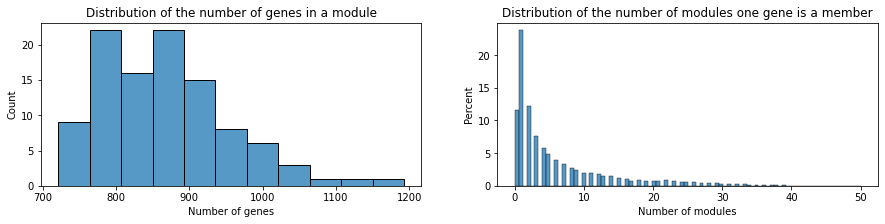

Number of genes in a module : 
- Mean : 868.97 
- Median : 861.0 
- Max : 1193 
- Min : 721 

Number of modules per gene : 
- Mean : 6.10 
- Median : 3.0 
- Max : 50 
- Min : 0 

11.57 % of genes are not included in any module.
23.76 % of genes are included in only one module.
64.66 % of genes are included in more than one module.


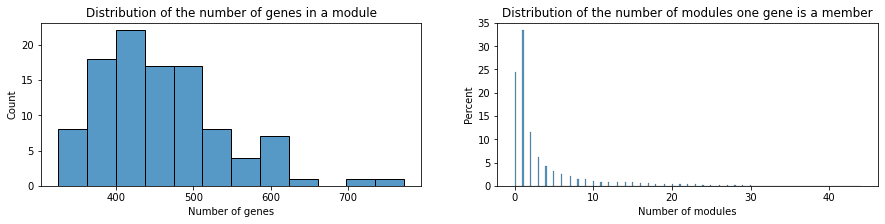

Number of genes in a module : 
- Mean : 457.79 
- Median : 447.0 
- Max : 773 
- Min : 325 

Number of modules per gene : 
- Mean : 3.21 
- Median : 1.0 
- Max : 44 
- Min : 0 

24.32 % of genes are not included in any module.
33.34 % of genes are included in only one module.
42.34 % of genes are included in more than one module.


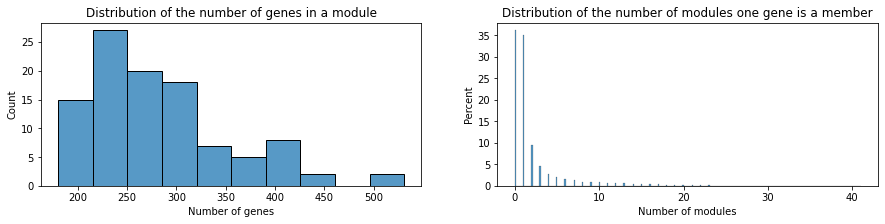

Number of genes in a module : 
- Mean : 284.00 
- Median : 265.0 
- Max : 531 
- Min : 180 

Number of modules per gene : 
- Mean : 1.99 
- Median : 1.0 
- Max : 41 
- Min : 0 

36.17 % of genes are not included in any module.
35.03 % of genes are included in only one module.
28.81 % of genes are included in more than one module.


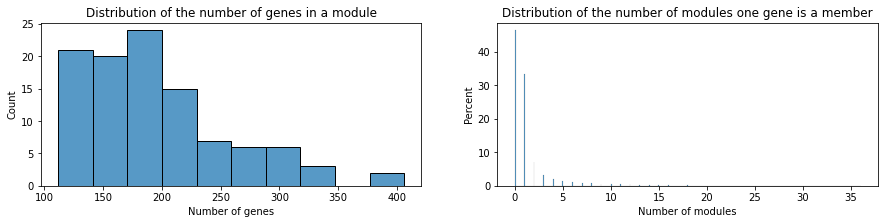

Number of genes in a module : 
- Mean : 195.23 
- Median : 180.0 
- Max : 406 
- Min : 112 

Number of modules per gene : 
- Mean : 1.37 
- Median : 1.0 
- Max : 36 
- Min : 0 

46.42 % of genes are not included in any module.
33.38 % of genes are included in only one module.
20.20 % of genes are included in more than one module.


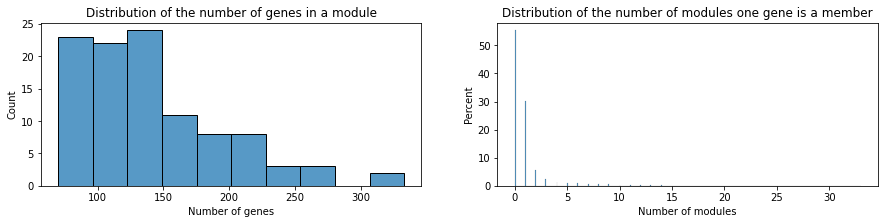

Number of genes in a module : 
- Mean : 141.30 
- Median : 128.0 
- Max : 333 
- Min : 70 

Number of modules per gene : 
- Mean : 0.99 
- Median : 0.0 
- Max : 33 
- Min : 0 

55.29 % of genes are not included in any module.
30.13 % of genes are included in only one module.
14.58 % of genes are included in more than one module.


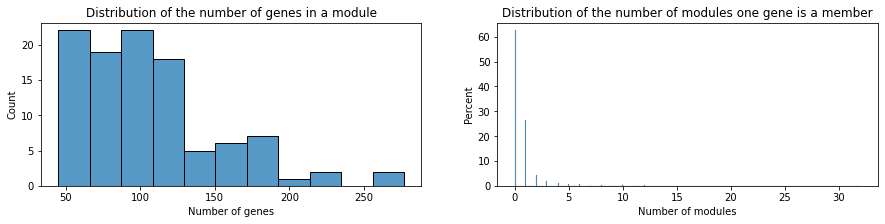

Number of genes in a module : 
- Mean : 106.59 
- Median : 97.0 
- Max : 277 
- Min : 45 

Number of modules per gene : 
- Mean : 0.75 
- Median : 0.0 
- Max : 32 
- Min : 0 

62.54 % of genes are not included in any module.
26.64 % of genes are included in only one module.
10.82 % of genes are included in more than one module.


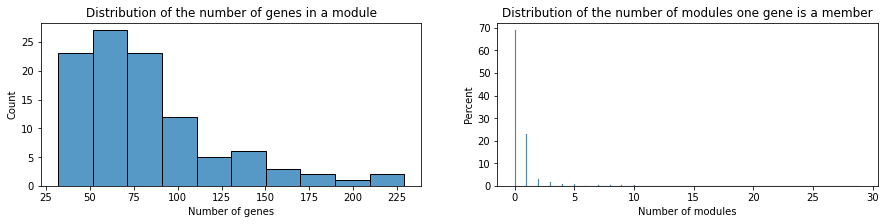

Number of genes in a module : 
- Mean : 82.70 
- Median : 73.0 
- Max : 229 
- Min : 32 

Number of modules per gene : 
- Mean : 0.58 
- Median : 0.0 
- Max : 29 
- Min : 0 

68.80 % of genes are not included in any module.
22.96 % of genes are included in only one module.
8.24 % of genes are included in more than one module.


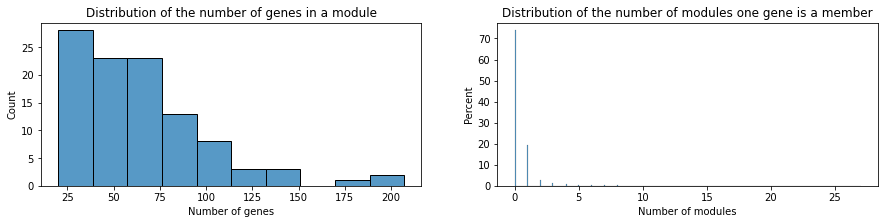

Number of genes in a module : 
- Mean : 65.95 
- Median : 59.0 
- Max : 207 
- Min : 20 

Number of modules per gene : 
- Mean : 0.46 
- Median : 0.0 
- Max : 27 
- Min : 0 

73.79 % of genes are not included in any module.
19.60 % of genes are included in only one module.
6.61 % of genes are included in more than one module.


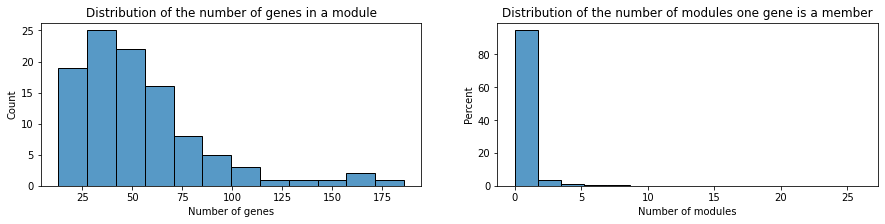

Number of genes in a module : 
- Mean : 53.88 
- Median : 46.0 
- Max : 186 
- Min : 13 

Number of modules per gene : 
- Mean : 0.38 
- Median : 0.0 
- Max : 26 
- Min : 0 

77.64 % of genes are not included in any module.
16.95 % of genes are included in only one module.
5.42 % of genes are included in more than one module.


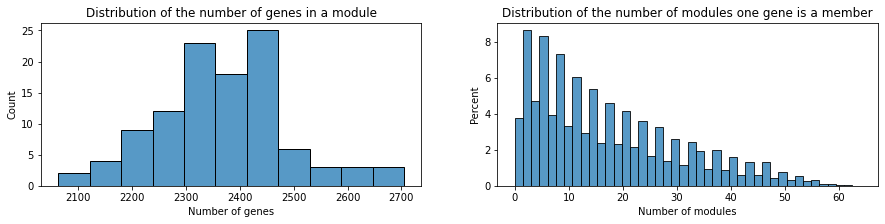

Number of genes in a module : 
- Mean : 2369.84 
- Median : 2367.0 
- Max : 2705 
- Min : 2063 

Number of modules per gene : 
- Mean : 17.28 
- Median : 14.0 
- Max : 64 
- Min : 0 

0.60 % of genes are not included in any module.
3.14 % of genes are included in only one module.
96.26 % of genes are included in more than one module.


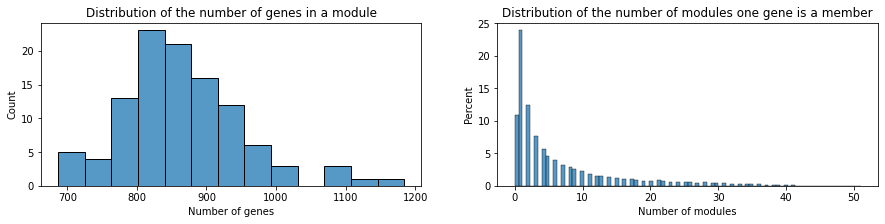

Number of genes in a module : 
- Mean : 866.31 
- Median : 858.5 
- Max : 1184 
- Min : 687 

Number of modules per gene : 
- Mean : 6.32 
- Median : 3.0 
- Max : 51 
- Min : 0 

10.94 % of genes are not included in any module.
23.87 % of genes are included in only one module.
65.19 % of genes are included in more than one module.


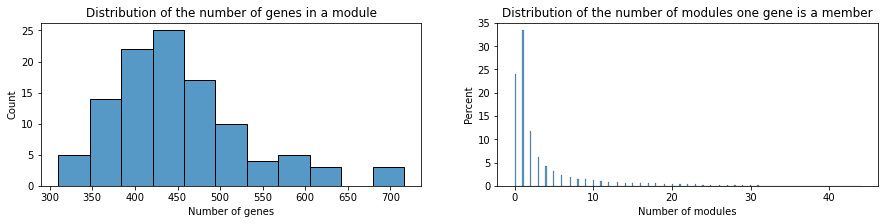

Number of genes in a module : 
- Mean : 454.13 
- Median : 439.5 
- Max : 716 
- Min : 310 

Number of modules per gene : 
- Mean : 3.31 
- Median : 1.0 
- Max : 44 
- Min : 0 

24.03 % of genes are not included in any module.
33.34 % of genes are included in only one module.
42.63 % of genes are included in more than one module.


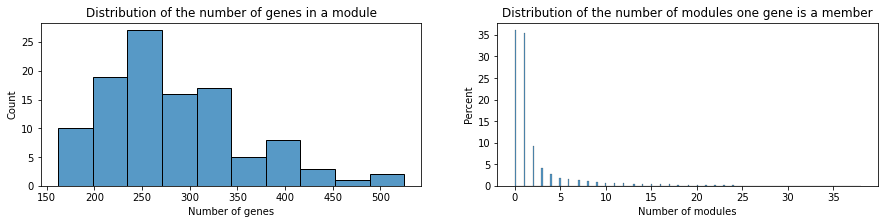

Number of genes in a module : 
- Mean : 284.54 
- Median : 266.0 
- Max : 525 
- Min : 162 

Number of modules per gene : 
- Mean : 2.08 
- Median : 1.0 
- Max : 38 
- Min : 0 

36.03 % of genes are not included in any module.
35.49 % of genes are included in only one module.
28.48 % of genes are included in more than one module.


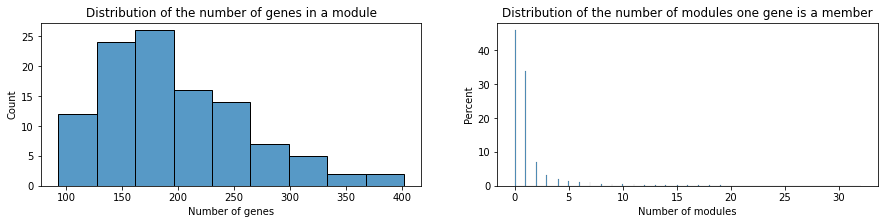

Number of genes in a module : 
- Mean : 197.03 
- Median : 182.0 
- Max : 402 
- Min : 93 

Number of modules per gene : 
- Mean : 1.44 
- Median : 1.0 
- Max : 32 
- Min : 0 

45.89 % of genes are not included in any module.
33.93 % of genes are included in only one module.
20.18 % of genes are included in more than one module.


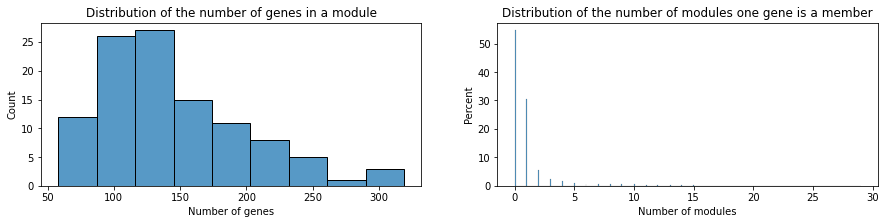

Number of genes in a module : 
- Mean : 144.51 
- Median : 130.0 
- Max : 319 
- Min : 58 

Number of modules per gene : 
- Mean : 1.05 
- Median : 0.0 
- Max : 29 
- Min : 0 

54.62 % of genes are not included in any module.
30.47 % of genes are included in only one module.
14.92 % of genes are included in more than one module.


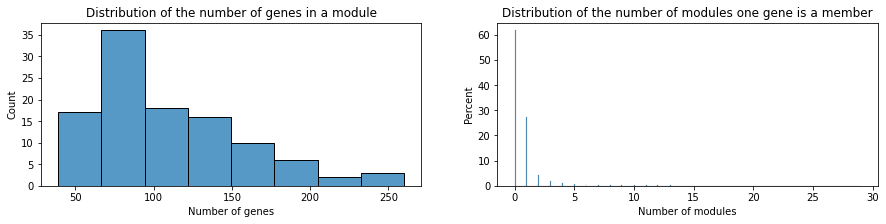

Number of genes in a module : 
- Mean : 110.06 
- Median : 95.5 
- Max : 260 
- Min : 39 

Number of modules per gene : 
- Mean : 0.80 
- Median : 0.0 
- Max : 29 
- Min : 0 

61.67 % of genes are not included in any module.
27.15 % of genes are included in only one module.
11.18 % of genes are included in more than one module.


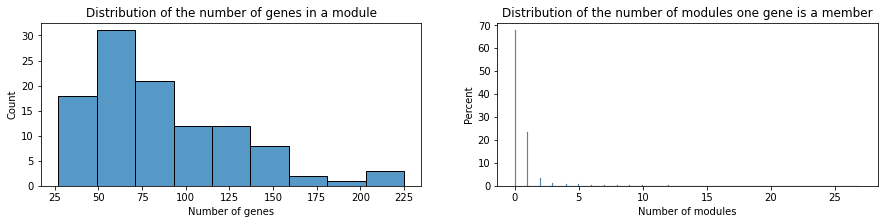

Number of genes in a module : 
- Mean : 85.65 
- Median : 73.5 
- Max : 225 
- Min : 27 

Number of modules per gene : 
- Mean : 0.62 
- Median : 0.0 
- Max : 27 
- Min : 0 

67.62 % of genes are not included in any module.
23.58 % of genes are included in only one module.
8.80 % of genes are included in more than one module.


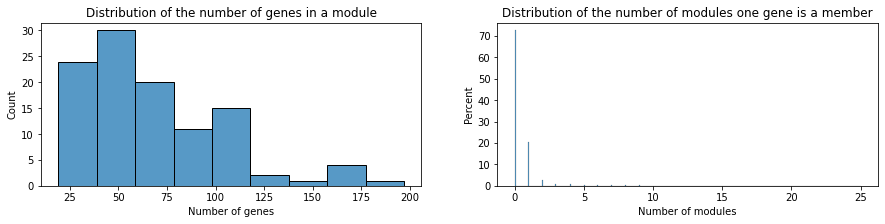

Number of genes in a module : 
- Mean : 68.21 
- Median : 58.0 
- Max : 197 
- Min : 19 

Number of modules per gene : 
- Mean : 0.50 
- Median : 0.0 
- Max : 25 
- Min : 0 

72.50 % of genes are not included in any module.
20.53 % of genes are included in only one module.
6.97 % of genes are included in more than one module.


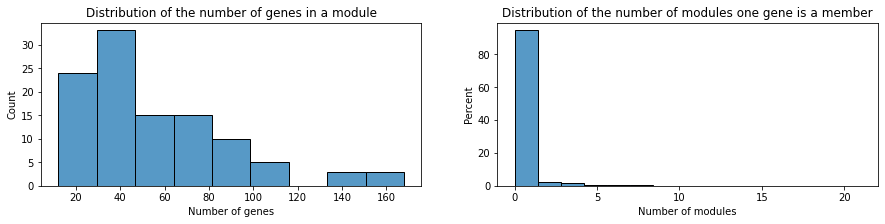

Number of genes in a module : 
- Mean : 55.35 
- Median : 44.0 
- Max : 168 
- Min : 12 

Number of modules per gene : 
- Mean : 0.40 
- Median : 0.0 
- Max : 21 
- Min : 0 

76.66 % of genes are not included in any module.
17.69 % of genes are included in only one module.
5.65 % of genes are included in more than one module.


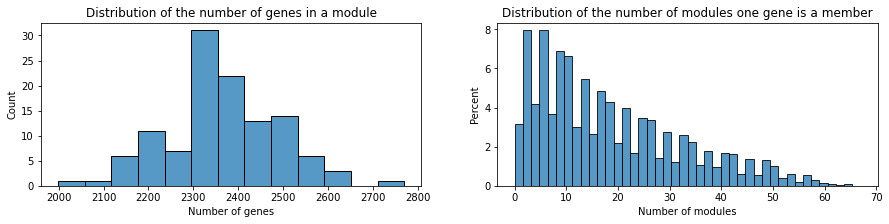

Number of genes in a module : 
- Mean : 2366.14 
- Median : 2357.0 
- Max : 2770 
- Min : 1999 

Number of modules per gene : 
- Mean : 18.53 
- Median : 15.0 
- Max : 67 
- Min : 0 

0.60 % of genes are not included in any module.
2.57 % of genes are included in only one module.
96.83 % of genes are included in more than one module.


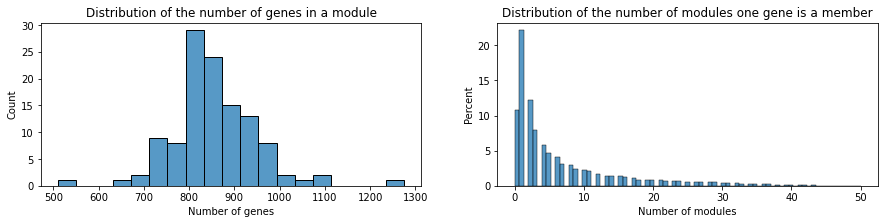

Number of genes in a module : 
- Mean : 856.52 
- Median : 846.0 
- Max : 1275 
- Min : 511 

Number of modules per gene : 
- Mean : 6.71 
- Median : 3.0 
- Max : 50 
- Min : 0 

10.82 % of genes are not included in any module.
22.11 % of genes are included in only one module.
67.07 % of genes are included in more than one module.


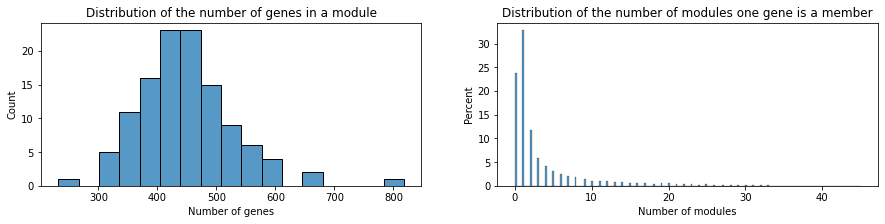

Number of genes in a module : 
- Mean : 448.41 
- Median : 439.5 
- Max : 818 
- Min : 232 

Number of modules per gene : 
- Mean : 3.51 
- Median : 1.0 
- Max : 45 
- Min : 0 

23.69 % of genes are not included in any module.
32.76 % of genes are included in only one module.
43.55 % of genes are included in more than one module.


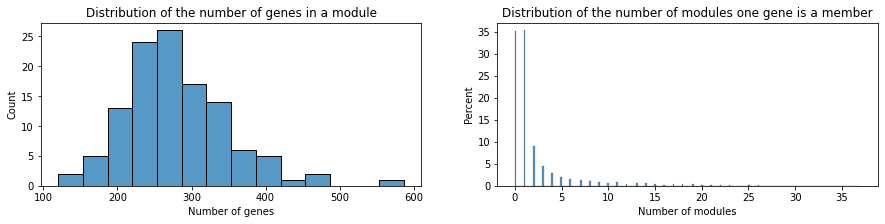

Number of genes in a module : 
- Mean : 279.55 
- Median : 268.5 
- Max : 587 
- Min : 120 

Number of modules per gene : 
- Mean : 2.19 
- Median : 1.0 
- Max : 37 
- Min : 0 

35.12 % of genes are not included in any module.
35.26 % of genes are included in only one module.
29.62 % of genes are included in more than one module.


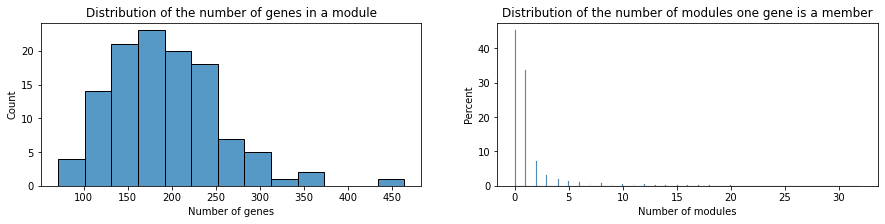

Number of genes in a module : 
- Mean : 192.52 
- Median : 186.0 
- Max : 464 
- Min : 71 

Number of modules per gene : 
- Mean : 1.51 
- Median : 1.0 
- Max : 32 
- Min : 0 

45.23 % of genes are not included in any module.
33.86 % of genes are included in only one module.
20.91 % of genes are included in more than one module.


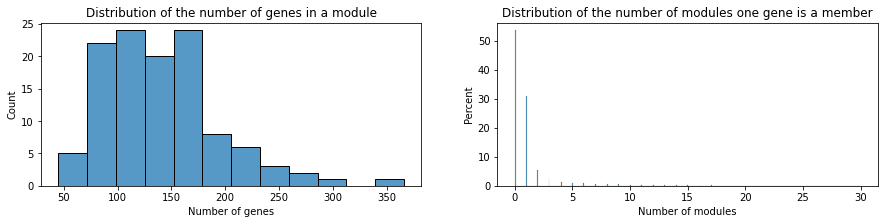

Number of genes in a module : 
- Mean : 140.34 
- Median : 132.5 
- Max : 366 
- Min : 45 

Number of modules per gene : 
- Mean : 1.10 
- Median : 0.0 
- Max : 30 
- Min : 0 

53.52 % of genes are not included in any module.
31.12 % of genes are included in only one module.
15.36 % of genes are included in more than one module.


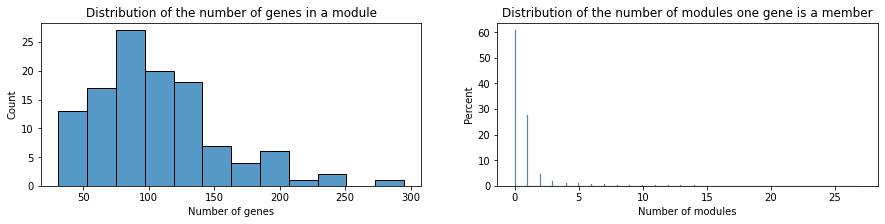

Number of genes in a module : 
- Mean : 106.10 
- Median : 97.0 
- Max : 295 
- Min : 31 

Number of modules per gene : 
- Mean : 0.83 
- Median : 0.0 
- Max : 27 
- Min : 0 

60.65 % of genes are not included in any module.
27.65 % of genes are included in only one module.
11.71 % of genes are included in more than one module.


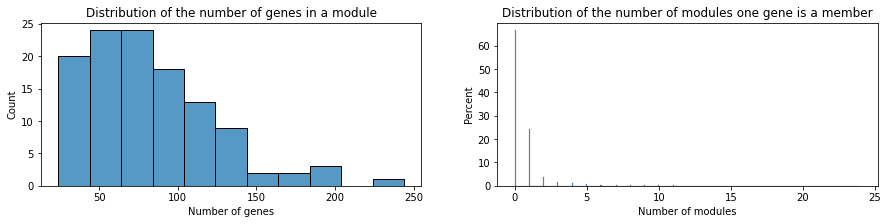

Number of genes in a module : 
- Mean : 82.47 
- Median : 75.0 
- Max : 244 
- Min : 24 

Number of modules per gene : 
- Mean : 0.65 
- Median : 0.0 
- Max : 24 
- Min : 0 

66.55 % of genes are not included in any module.
24.32 % of genes are included in only one module.
9.14 % of genes are included in more than one module.


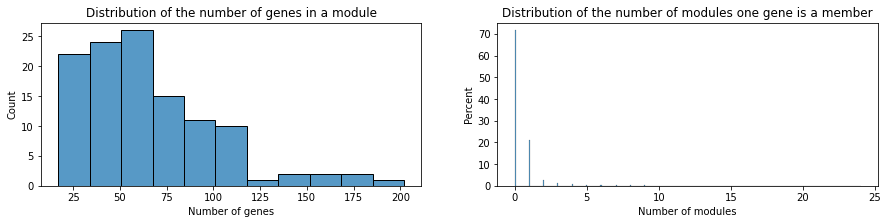

Number of genes in a module : 
- Mean : 65.73 
- Median : 57.5 
- Max : 202 
- Min : 17 

Number of modules per gene : 
- Mean : 0.51 
- Median : 0.0 
- Max : 24 
- Min : 0 

71.62 % of genes are not included in any module.
21.27 % of genes are included in only one module.
7.11 % of genes are included in more than one module.


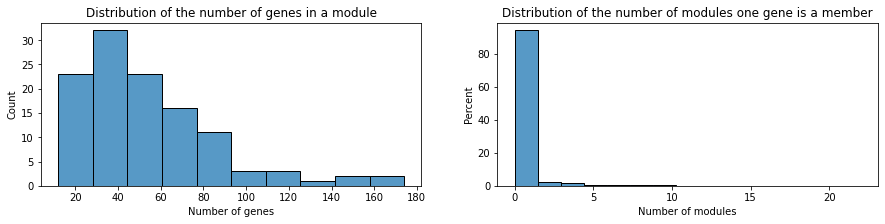

Number of genes in a module : 
- Mean : 53.86 
- Median : 46.0 
- Max : 174 
- Min : 12 

Number of modules per gene : 
- Mean : 0.42 
- Median : 0.0 
- Max : 22 
- Min : 0 

75.82 % of genes are not included in any module.
18.29 % of genes are included in only one module.
5.90 % of genes are included in more than one module.


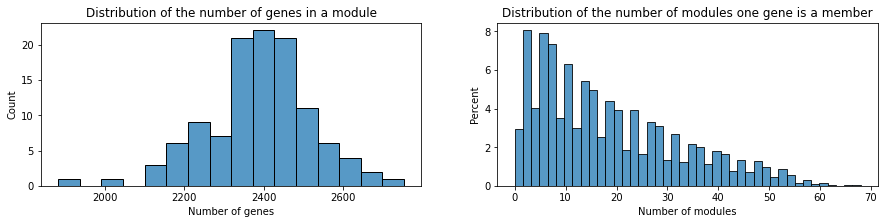

Number of genes in a module : 
- Mean : 2390.63 
- Median : 2399.0 
- Max : 2754 
- Min : 1883 

Number of modules per gene : 
- Mean : 18.56 
- Median : 15.0 
- Max : 68 
- Min : 0 

0.46 % of genes are not included in any module.
2.51 % of genes are included in only one module.
97.04 % of genes are included in more than one module.


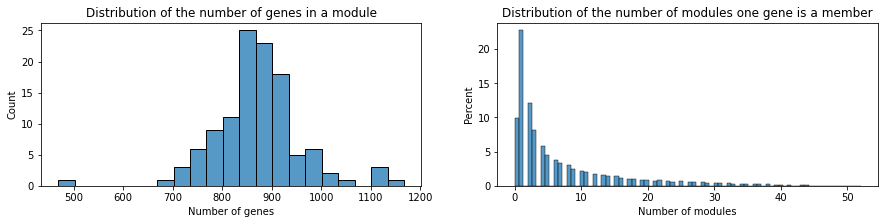

Number of genes in a module : 
- Mean : 870.76 
- Median : 870.0 
- Max : 1167 
- Min : 469 

Number of modules per gene : 
- Mean : 6.76 
- Median : 3.0 
- Max : 52 
- Min : 0 

9.96 % of genes are not included in any module.
22.70 % of genes are included in only one module.
67.34 % of genes are included in more than one module.


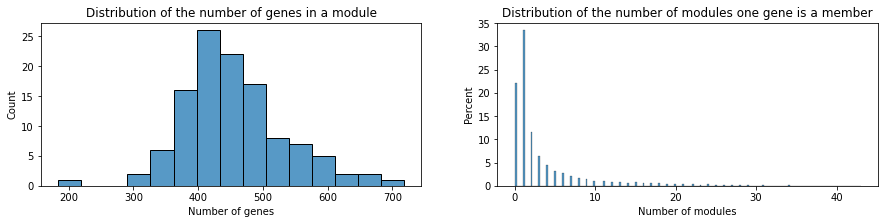

Number of genes in a module : 
- Mean : 454.70 
- Median : 445.0 
- Max : 718 
- Min : 184 

Number of modules per gene : 
- Mean : 3.53 
- Median : 1.0 
- Max : 43 
- Min : 0 

22.14 % of genes are not included in any module.
33.42 % of genes are included in only one module.
44.45 % of genes are included in more than one module.


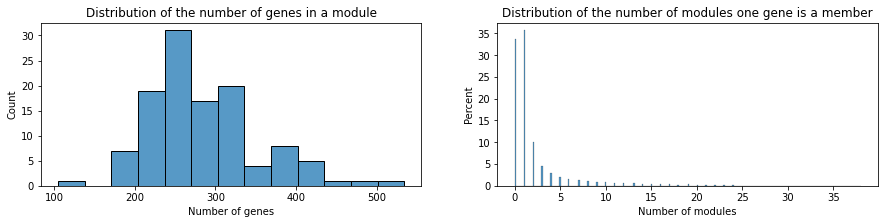

Number of genes in a module : 
- Mean : 283.72 
- Median : 268.0 
- Max : 534 
- Min : 105 

Number of modules per gene : 
- Mean : 2.20 
- Median : 1.0 
- Max : 38 
- Min : 0 

33.74 % of genes are not included in any module.
35.65 % of genes are included in only one module.
30.61 % of genes are included in more than one module.


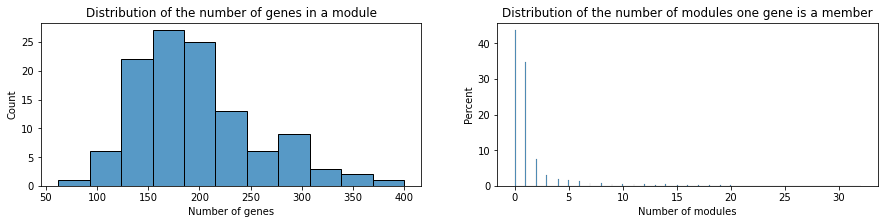

Number of genes in a module : 
- Mean : 196.95 
- Median : 186.0 
- Max : 400 
- Min : 62 

Number of modules per gene : 
- Mean : 1.53 
- Median : 1.0 
- Max : 32 
- Min : 0 

43.63 % of genes are not included in any module.
34.84 % of genes are included in only one module.
21.53 % of genes are included in more than one module.


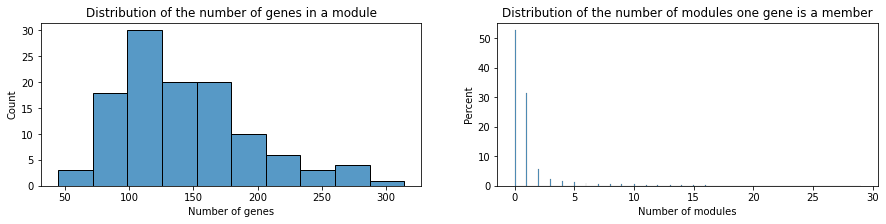

Number of genes in a module : 
- Mean : 143.90 
- Median : 135.0 
- Max : 314 
- Min : 45 

Number of modules per gene : 
- Mean : 1.12 
- Median : 0.0 
- Max : 29 
- Min : 0 

52.64 % of genes are not included in any module.
31.55 % of genes are included in only one module.
15.81 % of genes are included in more than one module.


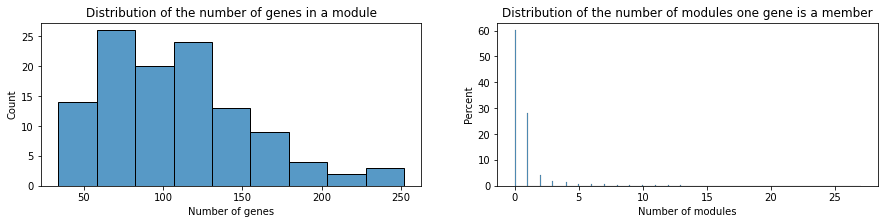

Number of genes in a module : 
- Mean : 108.76 
- Median : 104.0 
- Max : 252 
- Min : 34 

Number of modules per gene : 
- Mean : 0.84 
- Median : 0.0 
- Max : 27 
- Min : 0 

60.01 % of genes are not included in any module.
28.03 % of genes are included in only one module.
11.96 % of genes are included in more than one module.


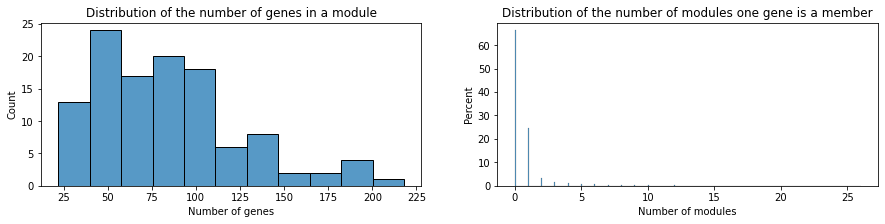

Number of genes in a module : 
- Mean : 84.63 
- Median : 80.0 
- Max : 218 
- Min : 22 

Number of modules per gene : 
- Mean : 0.66 
- Median : 0.0 
- Max : 26 
- Min : 0 

66.24 % of genes are not included in any module.
24.52 % of genes are included in only one module.
9.24 % of genes are included in more than one module.


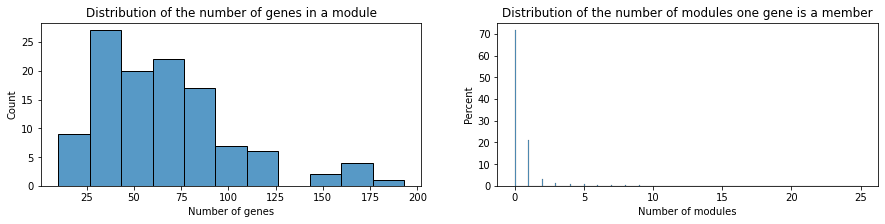

Number of genes in a module : 
- Mean : 66.98 
- Median : 61.0 
- Max : 193 
- Min : 10 

Number of modules per gene : 
- Mean : 0.52 
- Median : 0.0 
- Max : 25 
- Min : 0 

71.54 % of genes are not included in any module.
20.97 % of genes are included in only one module.
7.48 % of genes are included in more than one module.


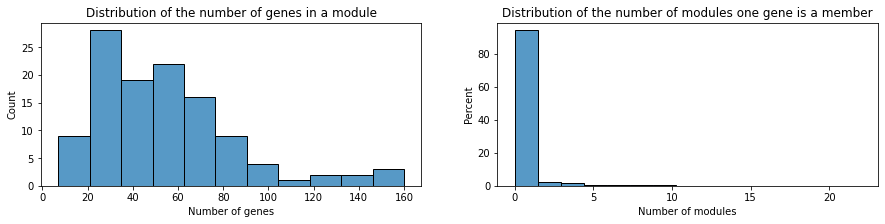

Number of genes in a module : 
- Mean : 54.41 
- Median : 50.0 
- Max : 160 
- Min : 7 

Number of modules per gene : 
- Mean : 0.42 
- Median : 0.0 
- Max : 22 
- Min : 0 

75.60 % of genes are not included in any module.
18.37 % of genes are included in only one module.
6.03 % of genes are included in more than one module.


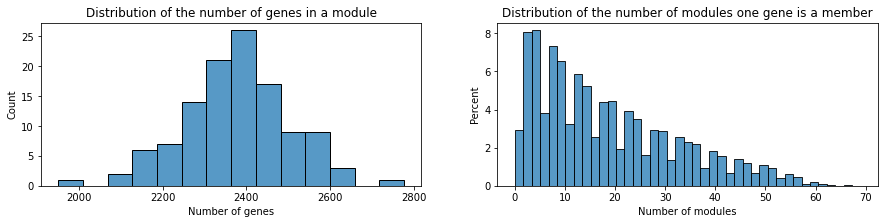

Number of genes in a module : 
- Mean : 2377.94 
- Median : 2375.0 
- Max : 2776 
- Min : 1951 

Number of modules per gene : 
- Mean : 18.63 
- Median : 15.0 
- Max : 69 
- Min : 0 

0.42 % of genes are not included in any module.
2.51 % of genes are included in only one module.
97.07 % of genes are included in more than one module.


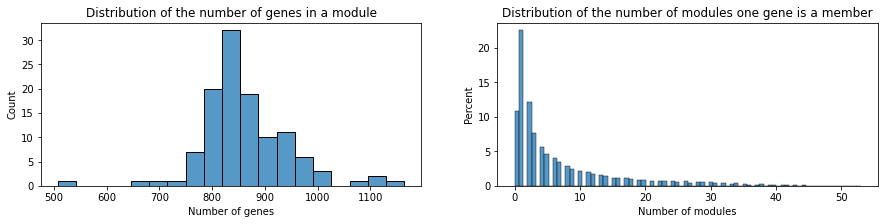

Number of genes in a module : 
- Mean : 862.11 
- Median : 845.5 
- Max : 1164 
- Min : 508 

Number of modules per gene : 
- Mean : 6.75 
- Median : 3.0 
- Max : 53 
- Min : 0 

10.76 % of genes are not included in any module.
22.48 % of genes are included in only one module.
66.76 % of genes are included in more than one module.


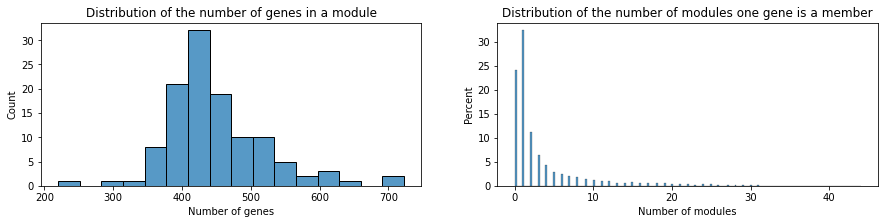

Number of genes in a module : 
- Mean : 448.82 
- Median : 431.0 
- Max : 723 
- Min : 220 

Number of modules per gene : 
- Mean : 3.52 
- Median : 1.0 
- Max : 44 
- Min : 0 

24.13 % of genes are not included in any module.
32.38 % of genes are included in only one module.
43.49 % of genes are included in more than one module.


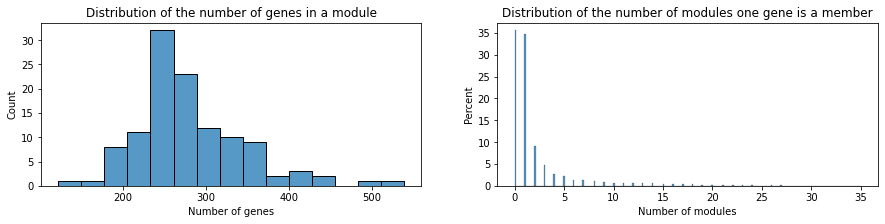

Number of genes in a module : 
- Mean : 281.38 
- Median : 266.5 
- Max : 539 
- Min : 122 

Number of modules per gene : 
- Mean : 2.20 
- Median : 1.0 
- Max : 35 
- Min : 0 

35.56 % of genes are not included in any module.
34.73 % of genes are included in only one module.
29.71 % of genes are included in more than one module.


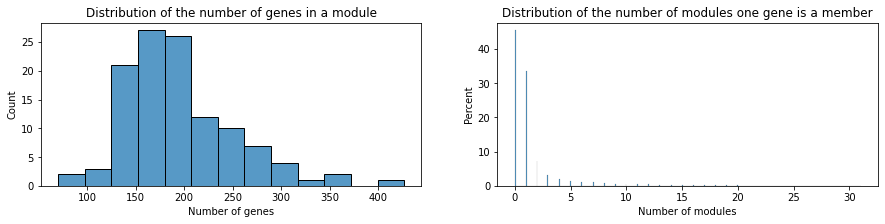

Number of genes in a module : 
- Mean : 195.55 
- Median : 185.5 
- Max : 427 
- Min : 70 

Number of modules per gene : 
- Mean : 1.53 
- Median : 1.0 
- Max : 31 
- Min : 0 

45.36 % of genes are not included in any module.
33.43 % of genes are included in only one module.
21.22 % of genes are included in more than one module.


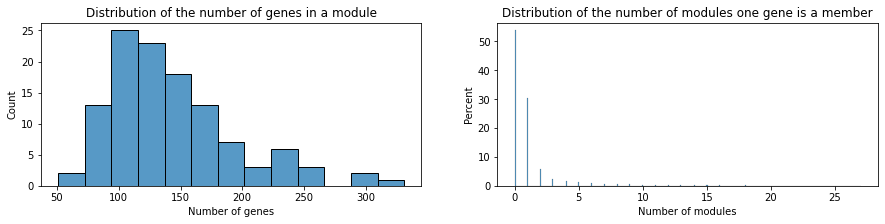

Number of genes in a module : 
- Mean : 143.02 
- Median : 132.5 
- Max : 331 
- Min : 51 

Number of modules per gene : 
- Mean : 1.12 
- Median : 0.0 
- Max : 27 
- Min : 0 

53.74 % of genes are not included in any module.
30.44 % of genes are included in only one module.
15.82 % of genes are included in more than one module.


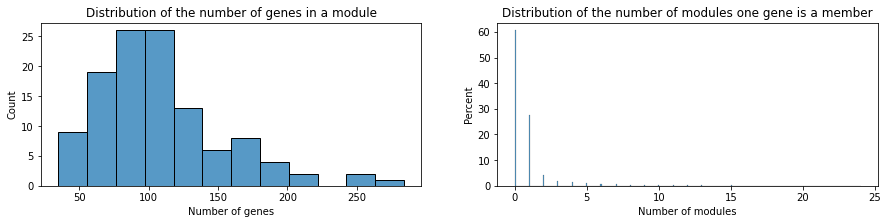

Number of genes in a module : 
- Mean : 108.99 
- Median : 101.0 
- Max : 284 
- Min : 35 

Number of modules per gene : 
- Mean : 0.85 
- Median : 0.0 
- Max : 24 
- Min : 0 

60.54 % of genes are not included in any module.
27.68 % of genes are included in only one module.
11.78 % of genes are included in more than one module.


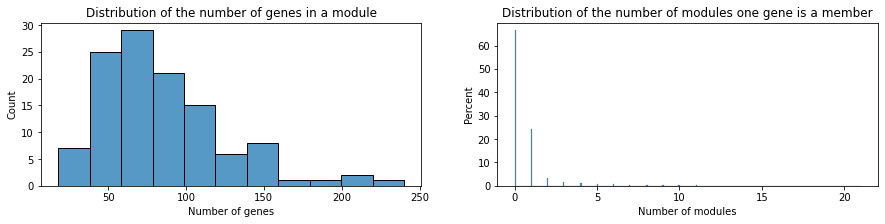

Number of genes in a module : 
- Mean : 85.45 
- Median : 76.0 
- Max : 240 
- Min : 18 

Number of modules per gene : 
- Mean : 0.67 
- Median : 0.0 
- Max : 21 
- Min : 0 

66.49 % of genes are not included in any module.
24.23 % of genes are included in only one module.
9.28 % of genes are included in more than one module.


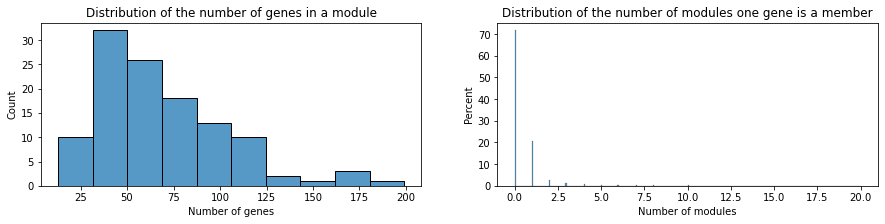

Number of genes in a module : 
- Mean : 68.14 
- Median : 58.0 
- Max : 199 
- Min : 13 

Number of modules per gene : 
- Mean : 0.53 
- Median : 0.0 
- Max : 20 
- Min : 0 

71.64 % of genes are not included in any module.
20.83 % of genes are included in only one module.
7.54 % of genes are included in more than one module.


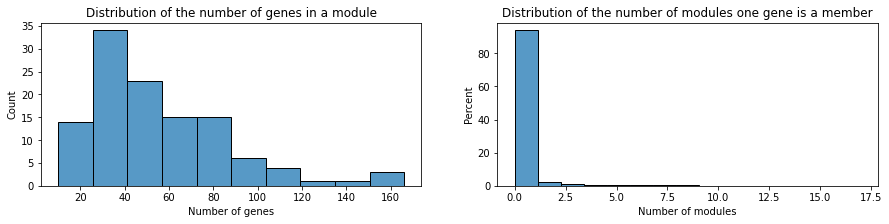

Number of genes in a module : 
- Mean : 55.52 
- Median : 47.0 
- Max : 166 
- Min : 10 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 17 
- Min : 0 

75.46 % of genes are not included in any module.
18.34 % of genes are included in only one module.
6.20 % of genes are included in more than one module.


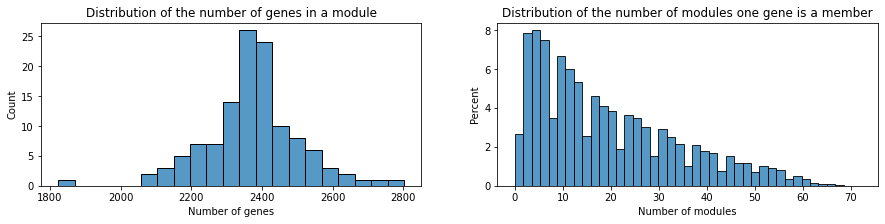

Number of genes in a module : 
- Mean : 2375.21 
- Median : 2375.0 
- Max : 2802 
- Min : 1823 

Number of modules per gene : 
- Mean : 19.41 
- Median : 15.0 
- Max : 72 
- Min : 0 

0.32 % of genes are not included in any module.
2.36 % of genes are included in only one module.
97.32 % of genes are included in more than one module.


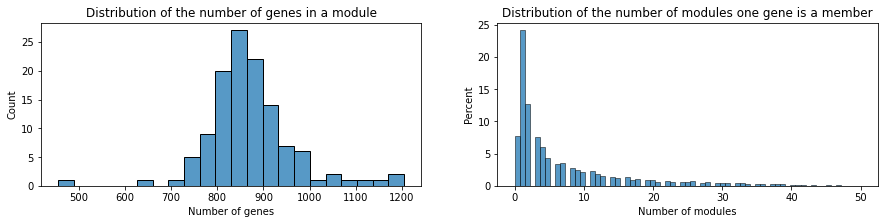

Number of genes in a module : 
- Mean : 870.13 
- Median : 863.0 
- Max : 1205 
- Min : 455 

Number of modules per gene : 
- Mean : 7.11 
- Median : 3.0 
- Max : 50 
- Min : 0 

7.66 % of genes are not included in any module.
24.11 % of genes are included in only one module.
68.23 % of genes are included in more than one module.


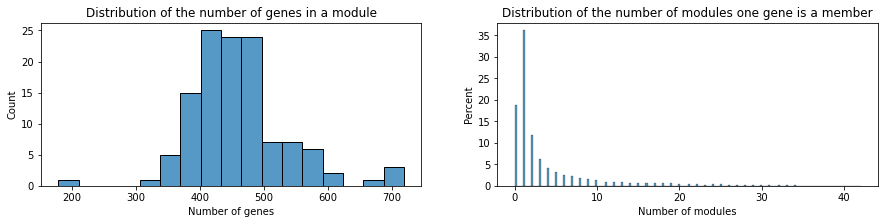

Number of genes in a module : 
- Mean : 459.83 
- Median : 452.0 
- Max : 719 
- Min : 178 

Number of modules per gene : 
- Mean : 3.76 
- Median : 1.0 
- Max : 42 
- Min : 0 

18.85 % of genes are not included in any module.
36.11 % of genes are included in only one module.
45.03 % of genes are included in more than one module.


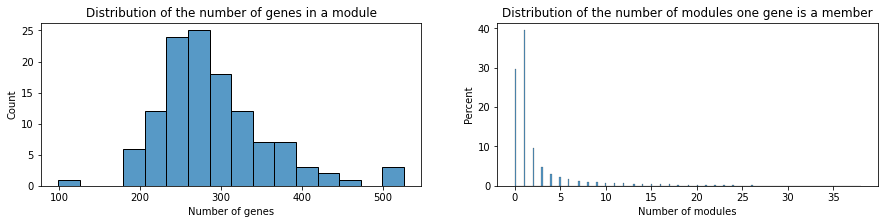

Number of genes in a module : 
- Mean : 289.95 
- Median : 277.0 
- Max : 526 
- Min : 99 

Number of modules per gene : 
- Mean : 2.37 
- Median : 1.0 
- Max : 38 
- Min : 0 

29.58 % of genes are not included in any module.
39.39 % of genes are included in only one module.
31.03 % of genes are included in more than one module.


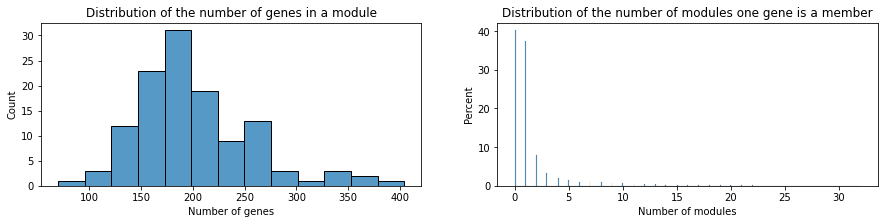

Number of genes in a module : 
- Mean : 201.10 
- Median : 190.0 
- Max : 404 
- Min : 70 

Number of modules per gene : 
- Mean : 1.64 
- Median : 1.0 
- Max : 32 
- Min : 0 

40.14 % of genes are not included in any module.
37.51 % of genes are included in only one module.
22.34 % of genes are included in more than one module.


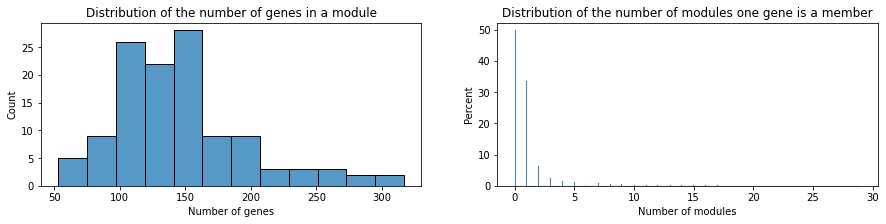

Number of genes in a module : 
- Mean : 146.35 
- Median : 140.0 
- Max : 317 
- Min : 53 

Number of modules per gene : 
- Mean : 1.20 
- Median : 1.0 
- Max : 29 
- Min : 0 

49.73 % of genes are not included in any module.
33.66 % of genes are included in only one module.
16.61 % of genes are included in more than one module.


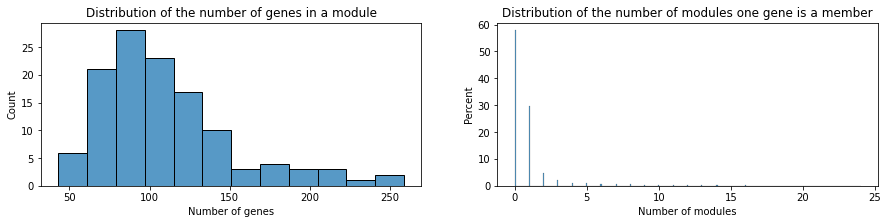

Number of genes in a module : 
- Mean : 109.97 
- Median : 101.0 
- Max : 259 
- Min : 43 

Number of modules per gene : 
- Mean : 0.90 
- Median : 0.0 
- Max : 24 
- Min : 0 

57.81 % of genes are not included in any module.
29.82 % of genes are included in only one module.
12.37 % of genes are included in more than one module.


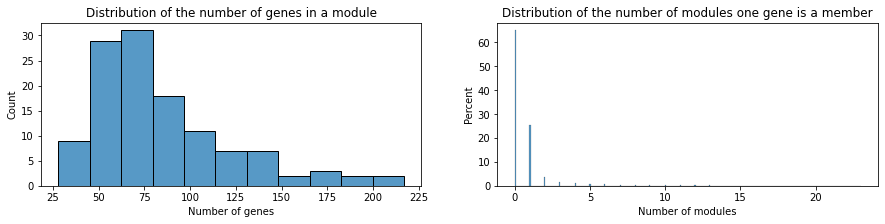

Number of genes in a module : 
- Mean : 84.93 
- Median : 74.0 
- Max : 217 
- Min : 28 

Number of modules per gene : 
- Mean : 0.69 
- Median : 0.0 
- Max : 23 
- Min : 0 

64.95 % of genes are not included in any module.
25.37 % of genes are included in only one module.
9.68 % of genes are included in more than one module.


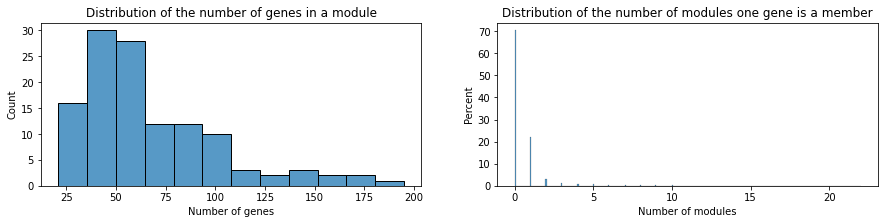

Number of genes in a module : 
- Mean : 67.12 
- Median : 58.0 
- Max : 195 
- Min : 21 

Number of modules per gene : 
- Mean : 0.55 
- Median : 0.0 
- Max : 22 
- Min : 0 

70.32 % of genes are not included in any module.
21.91 % of genes are included in only one module.
7.77 % of genes are included in more than one module.


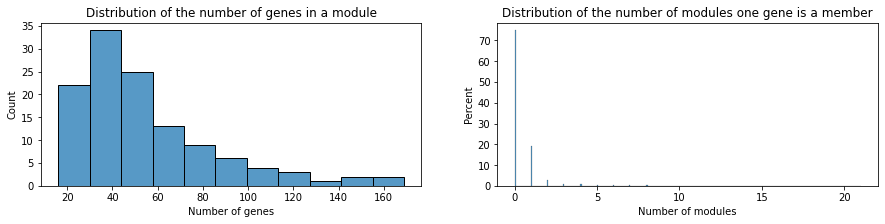

Number of genes in a module : 
- Mean : 54.21 
- Median : 45.0 
- Max : 169 
- Min : 16 

Number of modules per gene : 
- Mean : 0.44 
- Median : 0.0 
- Max : 21 
- Min : 0 

74.81 % of genes are not included in any module.
18.96 % of genes are included in only one module.
6.23 % of genes are included in more than one module.


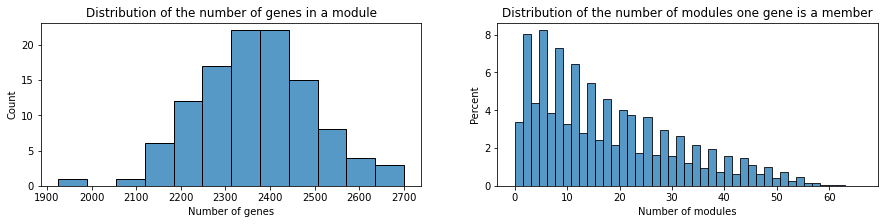

Number of genes in a module : 
- Mean : 2367.68 
- Median : 2371.0 
- Max : 2701 
- Min : 1925 

Number of modules per gene : 
- Mean : 17.75 
- Median : 14.0 
- Max : 66 
- Min : 0 

0.58 % of genes are not included in any module.
2.80 % of genes are included in only one module.
96.62 % of genes are included in more than one module.


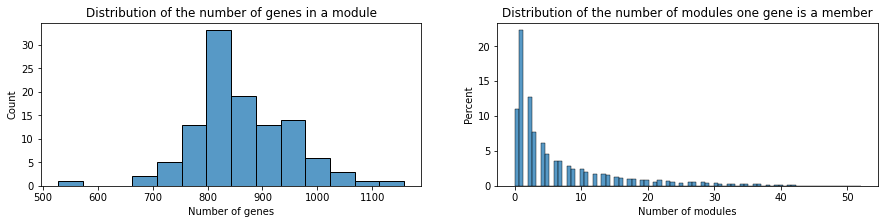

Number of genes in a module : 
- Mean : 861.40 
- Median : 845.0 
- Max : 1158 
- Min : 528 

Number of modules per gene : 
- Mean : 6.46 
- Median : 3.0 
- Max : 52 
- Min : 0 

10.92 % of genes are not included in any module.
22.22 % of genes are included in only one module.
66.86 % of genes are included in more than one module.


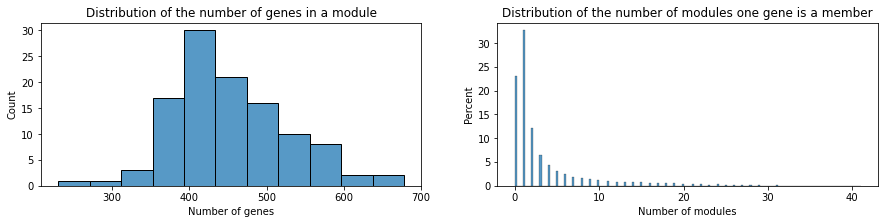

Number of genes in a module : 
- Mean : 453.02 
- Median : 438.0 
- Max : 678 
- Min : 230 

Number of modules per gene : 
- Mean : 3.40 
- Median : 1.0 
- Max : 41 
- Min : 0 

23.16 % of genes are not included in any module.
32.65 % of genes are included in only one module.
44.19 % of genes are included in more than one module.


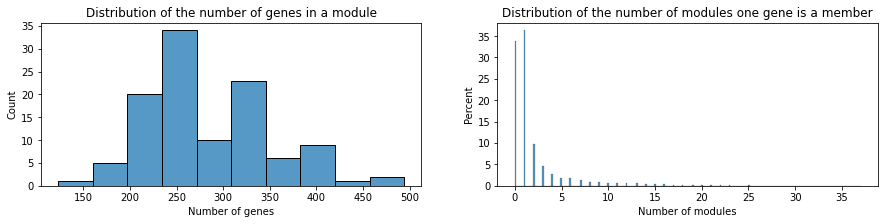

Number of genes in a module : 
- Mean : 284.10 
- Median : 265.0 
- Max : 494 
- Min : 123 

Number of modules per gene : 
- Mean : 2.13 
- Median : 1.0 
- Max : 37 
- Min : 0 

33.83 % of genes are not included in any module.
36.30 % of genes are included in only one module.
29.87 % of genes are included in more than one module.


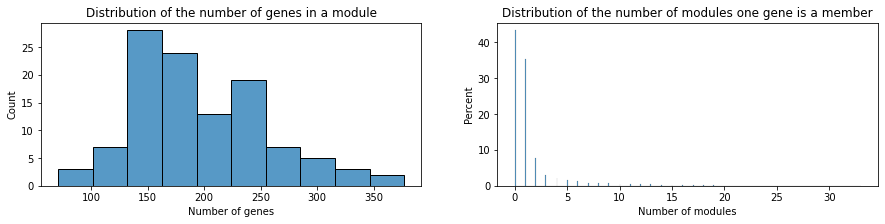

Number of genes in a module : 
- Mean : 196.67 
- Median : 184.0 
- Max : 377 
- Min : 71 

Number of modules per gene : 
- Mean : 1.47 
- Median : 1.0 
- Max : 33 
- Min : 0 

43.35 % of genes are not included in any module.
35.51 % of genes are included in only one module.
21.14 % of genes are included in more than one module.


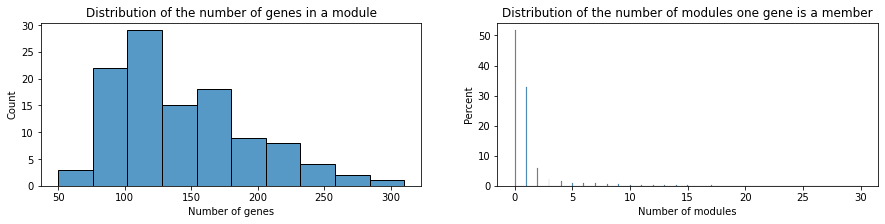

Number of genes in a module : 
- Mean : 144.11 
- Median : 130.0 
- Max : 310 
- Min : 50 

Number of modules per gene : 
- Mean : 1.08 
- Median : 0.0 
- Max : 30 
- Min : 0 

51.64 % of genes are not included in any module.
32.83 % of genes are included in only one module.
15.52 % of genes are included in more than one module.


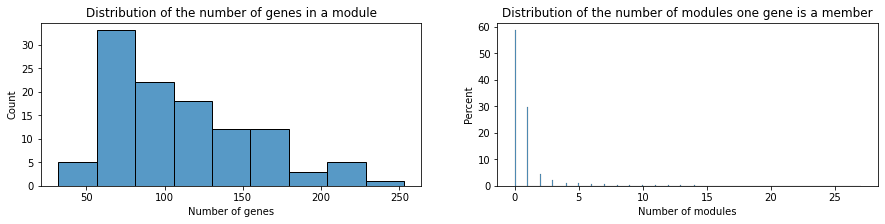

Number of genes in a module : 
- Mean : 110.60 
- Median : 97.0 
- Max : 253 
- Min : 32 

Number of modules per gene : 
- Mean : 0.83 
- Median : 0.0 
- Max : 27 
- Min : 0 

58.55 % of genes are not included in any module.
29.83 % of genes are included in only one module.
11.63 % of genes are included in more than one module.


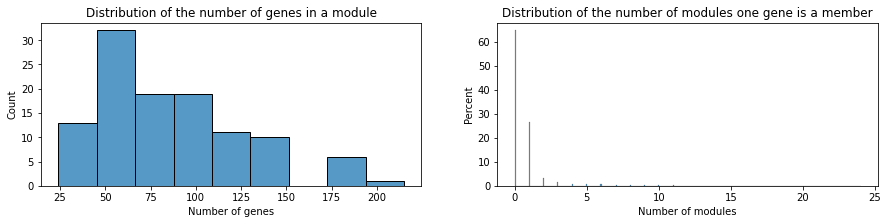

Number of genes in a module : 
- Mean : 86.41 
- Median : 75.0 
- Max : 215 
- Min : 24 

Number of modules per gene : 
- Mean : 0.65 
- Median : 0.0 
- Max : 24 
- Min : 0 

64.70 % of genes are not included in any module.
26.46 % of genes are included in only one module.
8.83 % of genes are included in more than one module.


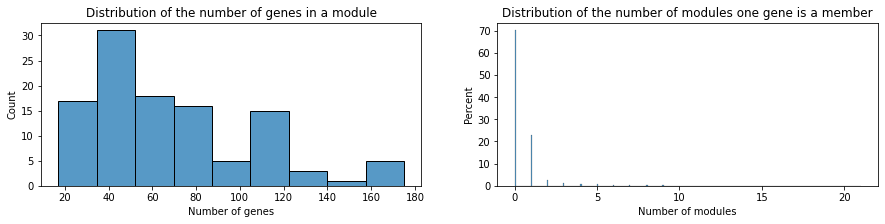

Number of genes in a module : 
- Mean : 69.35 
- Median : 58.0 
- Max : 175 
- Min : 17 

Number of modules per gene : 
- Mean : 0.52 
- Median : 0.0 
- Max : 21 
- Min : 0 

70.07 % of genes are not included in any module.
22.83 % of genes are included in only one module.
7.10 % of genes are included in more than one module.


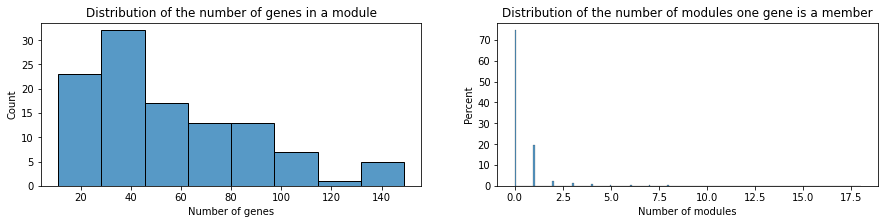

Number of genes in a module : 
- Mean : 56.09 
- Median : 47.0 
- Max : 149 
- Min : 11 

Number of modules per gene : 
- Mean : 0.42 
- Median : 0.0 
- Max : 18 
- Min : 0 

74.56 % of genes are not included in any module.
19.72 % of genes are included in only one module.
5.72 % of genes are included in more than one module.


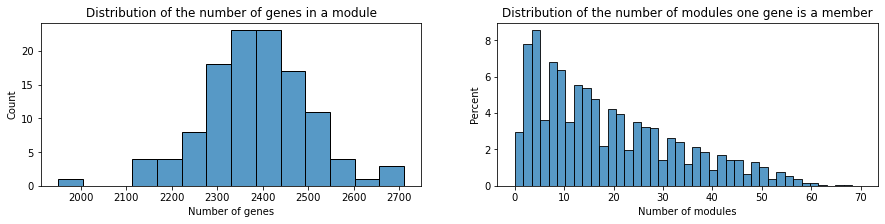

Number of genes in a module : 
- Mean : 2385.49 
- Median : 2386.0 
- Max : 2711 
- Min : 1951 

Number of modules per gene : 
- Mean : 18.85 
- Median : 15.0 
- Max : 70 
- Min : 0 

0.47 % of genes are not included in any module.
2.51 % of genes are included in only one module.
97.02 % of genes are included in more than one module.


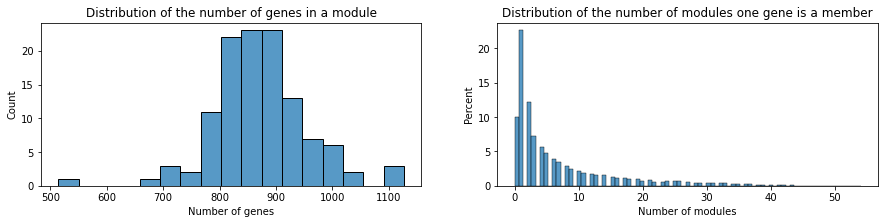

Number of genes in a module : 
- Mean : 870.14 
- Median : 867.0 
- Max : 1127 
- Min : 514 

Number of modules per gene : 
- Mean : 6.87 
- Median : 3.0 
- Max : 54 
- Min : 0 

10.03 % of genes are not included in any module.
22.62 % of genes are included in only one module.
67.35 % of genes are included in more than one module.


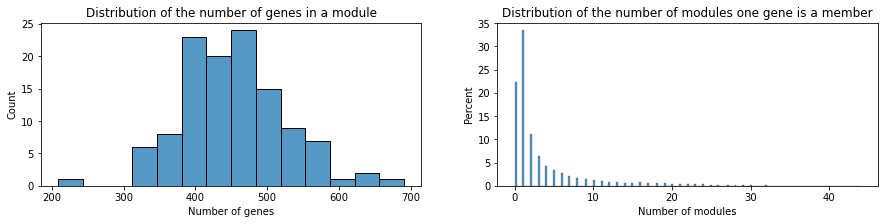

Number of genes in a module : 
- Mean : 454.86 
- Median : 454.0 
- Max : 691 
- Min : 209 

Number of modules per gene : 
- Mean : 3.59 
- Median : 1.0 
- Max : 44 
- Min : 0 

22.28 % of genes are not included in any module.
33.42 % of genes are included in only one module.
44.30 % of genes are included in more than one module.


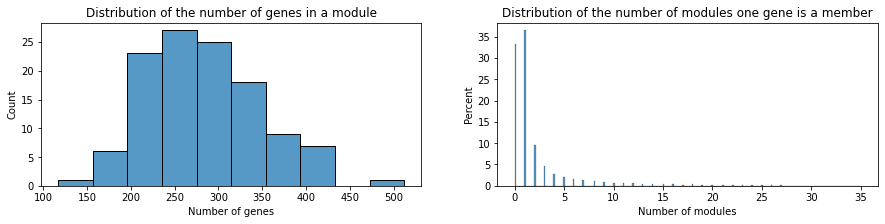

Number of genes in a module : 
- Mean : 285.23 
- Median : 277.0 
- Max : 512 
- Min : 117 

Number of modules per gene : 
- Mean : 2.25 
- Median : 1.0 
- Max : 35 
- Min : 0 

33.21 % of genes are not included in any module.
36.43 % of genes are included in only one module.
30.36 % of genes are included in more than one module.


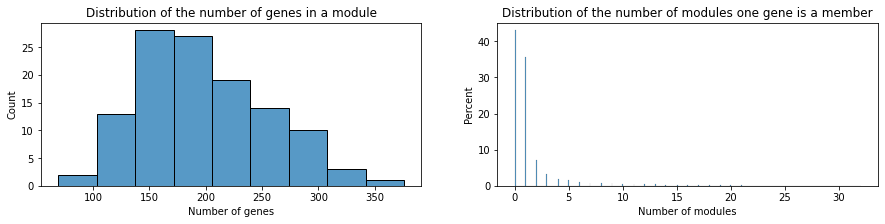

Number of genes in a module : 
- Mean : 196.27 
- Median : 190.0 
- Max : 376 
- Min : 69 

Number of modules per gene : 
- Mean : 1.55 
- Median : 1.0 
- Max : 32 
- Min : 0 

42.97 % of genes are not included in any module.
35.68 % of genes are included in only one module.
21.35 % of genes are included in more than one module.


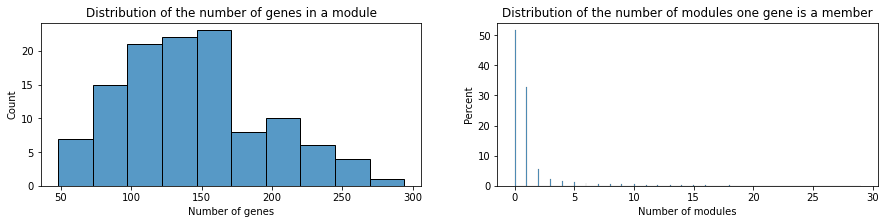

Number of genes in a module : 
- Mean : 143.51 
- Median : 139.0 
- Max : 294 
- Min : 48 

Number of modules per gene : 
- Mean : 1.13 
- Median : 0.0 
- Max : 29 
- Min : 0 

51.52 % of genes are not included in any module.
32.76 % of genes are included in only one module.
15.72 % of genes are included in more than one module.


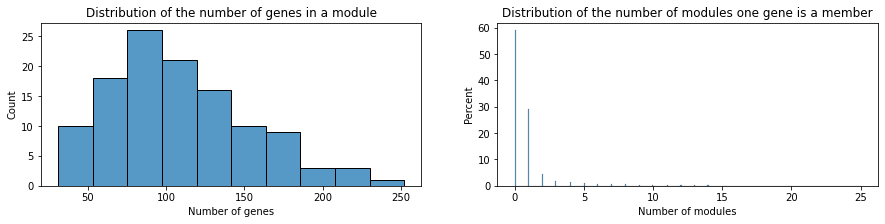

Number of genes in a module : 
- Mean : 109.05 
- Median : 104.0 
- Max : 252 
- Min : 31 

Number of modules per gene : 
- Mean : 0.86 
- Median : 0.0 
- Max : 25 
- Min : 0 

58.96 % of genes are not included in any module.
29.16 % of genes are included in only one module.
11.88 % of genes are included in more than one module.


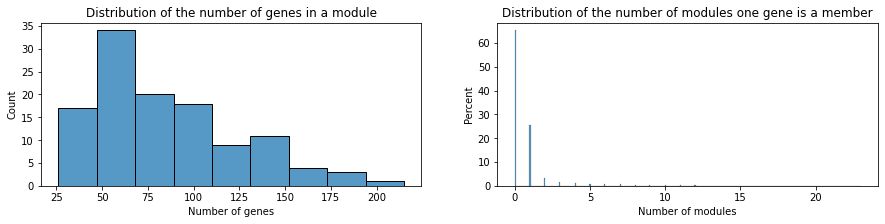

Number of genes in a module : 
- Mean : 85.55 
- Median : 77.0 
- Max : 215 
- Min : 26 

Number of modules per gene : 
- Mean : 0.68 
- Median : 0.0 
- Max : 23 
- Min : 0 

65.24 % of genes are not included in any module.
25.42 % of genes are included in only one module.
9.35 % of genes are included in more than one module.


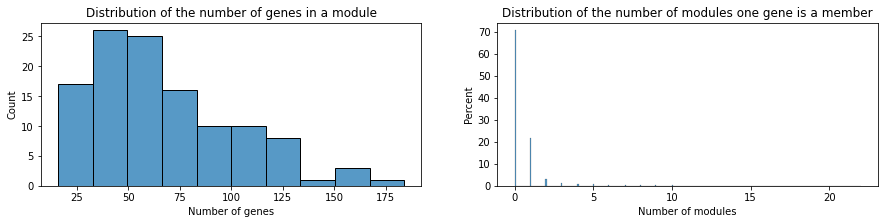

Number of genes in a module : 
- Mean : 67.76 
- Median : 60.0 
- Max : 184 
- Min : 16 

Number of modules per gene : 
- Mean : 0.54 
- Median : 0.0 
- Max : 22 
- Min : 0 

70.60 % of genes are not included in any module.
21.79 % of genes are included in only one module.
7.61 % of genes are included in more than one module.


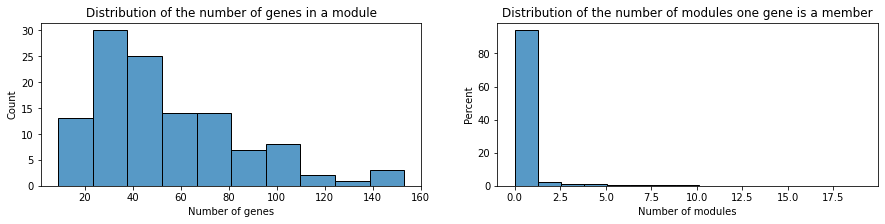

Number of genes in a module : 
- Mean : 54.42 
- Median : 47.0 
- Max : 153 
- Min : 9 

Number of modules per gene : 
- Mean : 0.43 
- Median : 0.0 
- Max : 19 
- Min : 0 

75.18 % of genes are not included in any module.
18.70 % of genes are included in only one module.
6.12 % of genes are included in more than one module.


In [270]:
unclust_cutn = []
for i in range(len(n_)):
    unclust_cut = []
    for j in range(len(cutoff_)):
        unclust_ = moduleSummary(mod_cutn[i][j], returnUnclust=True)
        unclust_cut.append(unclust_)
    unclust_cutn.append(unclust_cut)

In [272]:
unclust_cutn_df = pd.DataFrame(unclust_cutn, columns=cutoff_, index=n_)

<AxesSubplot:>

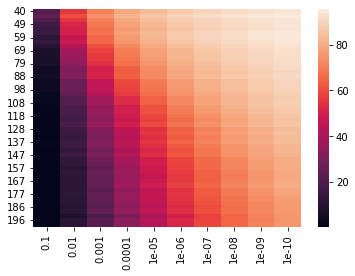

In [273]:
sns.heatmap(unclust_cutn_df)

In [341]:
unclust_cutn_df

,1.000000e-01,1.000000e-02,1.000000e-03,1.000000e-04,1.000000e-05,1.000000e-06,1.000000e-07,1.000000e-08,1.000000e-09,1.000000e-10
40,20.852184,55.898440,70.781282,78.931731,83.665339,87.007901,89.411844,91.140523,92.605848,93.720035
43,25.281923,60.172868,74.171112,81.619286,86.109798,89.283544,91.451145,93.098791,94.429063,95.475724
46,19.960835,55.290702,70.713755,79.276116,84.252819,87.548113,89.884530,91.707745,93.220339,94.314268
49,16.186103,51.597002,68.417854,77.311095,82.740226,86.575731,89.026943,91.214802,92.734148,93.922615
53,14.464177,49.841313,66.608144,75.602674,81.599028,85.772166,88.439462,90.640827,92.268215,93.584982
56,15.423054,50.077655,67.783105,77.331353,83.010332,87.075427,89.898035,92.025120,93.733540,94.922007
59,11.688838,45.945033,64.886218,75.805254,82.125734,86.609494,89.675198,91.721251,93.328381,94.739685
62,13.464785,47.849281,65.196840,74.704572,81.207374,85.731650,89.101222,91.214802,92.862449,94.321021
66,9.953407,42.818556,60.962928,72.084543,78.992505,84.077250,87.433318,89.925046,91.667229,93.146060
69,7.340131,39.057330,58.214599,69.714363,77.189547,82.476872,86.231346,88.824364,90.890675,92.551827


In [316]:
mi = unclust_cutn_df.idxmin()

In [335]:
Mi = [(mi.iat[i],mi.index[i]) for i in range(len(mi))]

In [339]:
mo = []
for i in range(len(Mi)):
    mo.append(unclust_cutn_df.at[Mi[i]])

In [340]:
mo

[0.31737456951853604,
 7.657505570936593,
 18.853399959484097,
 29.58336146937673,
 40.144506718887165,
 49.72651765818084,
 57.80944020528057,
 64.70389627928962,
 70.0655007090283,
 74.55601323519481]

In [241]:
minFDR = np.argmin(FDR_n[i], axis=1)
k = 0
FDR_n[i][k,minFDR[k]]

0.004587860437768931

In [ ]:
for i in range(len(n_)):
    np.savetxt('S_n_'+str(i)+'.csv', S_n_[i], delimiter=",")

In [ ]:
FDR_n

In [260]:
lab_cutn = []
for i in range(len(n_)):
    lab_cut = []
    for j in range(len(cutoff_)):
        minFDR = np.argmin(FDR_n[i], axis=1)
        lab_ = []
        for k in range(FDR_n[i].shape[0]):
            if FDR_n[i][k,minFDR[k]]<cutoff_[j]:
                lab_.append(minFDR[k])
            else:
                lab_.append(-1)
        lab_cut.append(lab_)
    lab_cutn.append(lab_cut)

In [248]:
from sklearn.metrics import calinski_harabasz_score

In [314]:
chs = np.empty((len(n_),len(cutoff_)))
pval = np.empty((len(n_),len(cutoff_)))
for i in range(len(n_)):
    for j in range(len(cutoff_)):
        m1 = np.array(lab_cutn[i][j])>-1 # removing genes that are not in any clusters
        lab = np.array(lab_cutn[i][j])[m1]
        gen = rna.iloc[m1,:]
        chs[i,j] = calinski_harabasz_score(rna,lab_cutn[i][j])
        
        b = []
        for a in range(100):    
            lab_rand = np.random.permutation(lab_cutn[i][j])
            m1 = lab_rand>-1 # removing genes that are not in any clusters
            lab = lab_rand[m1]
            gen = rna.iloc[m1,:]
            b.append(calinski_harabasz_score(rna,lab_rand))
            pval[i,j] = sum(b>=chs[i,j])/len(b)

<AxesSubplot:>

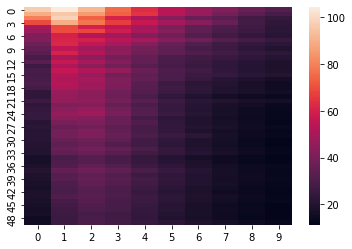

In [290]:
sns.heatmap(chs)

In [271]:
np.argmax(chs[1])

1

In [273]:
n_[1]

43

In [274]:
cutoff_[1]

0.01

In [172]:
def enrClustFrac(enrich, alpha = 0.1):
    enrClust = []
    for i in range(len(enrich)):
        enrClust.append(min(enrich[i].loc[:,"Adjusted P-value"])<=alpha)
    return sum(enrClust)/len(enrClust)

In [223]:
enrFrac_cutn = []
for i in range(len(enrFrac_cutn), len(n_)):
    #print("n =",i)
    enrFrac_cut = []
    for j in range(len(enrFrac_cut), len(cutoff_)):
        #print("cut =",j)
        enr = utilsClust.runEnrichr(mod_cutn[i][j], ("ICA_mod_"+str(i)+str(j)), 
                                    lib = "GO", date = "2021")
        enrFrac_cut.append(enrClustFrac(enr, alpha = 0.1))
    enrFrac_cutn.append(enrFrac_cut)

2022-06-13 12:30:50,103 Error fetching enrichment results: GO_Biological_Process_2021
2022-06-13 12:30:50,304 Error fetching enrichment results: GO_Biological_Process_2021


JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [184]:
from importlib import reload

In [222]:
reload(utilsClust)

<module 'utilsClust' from '/home/ldap/ipellet/Documents/Clustering/utilsClust.py'>

In [182]:
fileParm = open("ICAparmTunning_rna.txt", "a")
fileParm.write("enrFrac_cutn = " + repr(enrFrac_cutn) + "\n")
fileParm.close()

In [224]:
enrFrac_cutn

[]

## ICA analysis on Gene2vec dataset

In [66]:
data_noOut = g2v
#dist = g2vDist

In [22]:
# SVD
U,s,VT = svd(data_noOut)
sRand = randDataSVD(data_noOut, K=10)

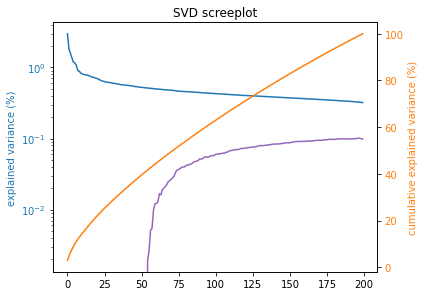

Optimal number of components : 200


In [23]:
nComp = plotSVDscreeplot(s, sRand)

In [24]:
# ICA
ICA = FastICA(n_components=nComp, fun='logcosh')
S_ = ICA.fit_transform(data_noOut)  # Reconstruct signals

In [65]:
IndivSpe = 0.10

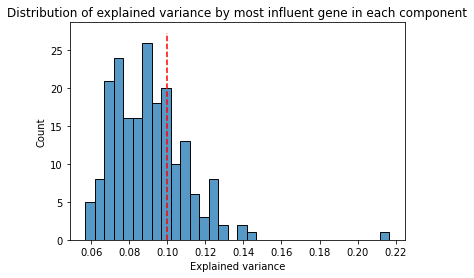

In [64]:
h = sns.histplot(np.amax(np.abs(S_), axis=0), binwidth=0.005)
plt.vlines(IndivSpe, ymin=h.get_ylim()[0], ymax=h.get_ylim()[1], ls="--", color="r")
plt.title("Distribution of explained variance by most influent gene in each component")
plt.xlabel("Explained variance")
plt.show()

In [25]:
# Individual-specific components removal
S_delIndiv,_ = delIndivSpe(S_, threshold=IndivSpe)

52 components are characterized by a single gene who explain more than 10.0 % of the variability of the pattern in the population.
After romving those components, 148 components remain.


In [42]:
kurt = stats.kurtosis(S_delIndiv)

In [52]:
ktsmin = 10

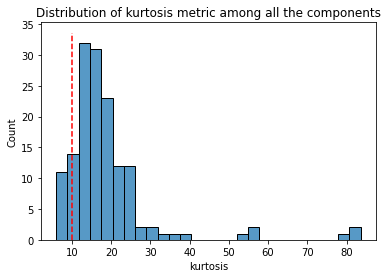

In [53]:
h = sns.histplot(kurt)
plt.vlines(ktsmin, ymin=h.get_ylim()[0], ymax=h.get_ylim()[1], ls="--", color="r")
plt.title("Distribution of kurtosis metric among all the components")
plt.xlabel("kurtosis")
plt.show()

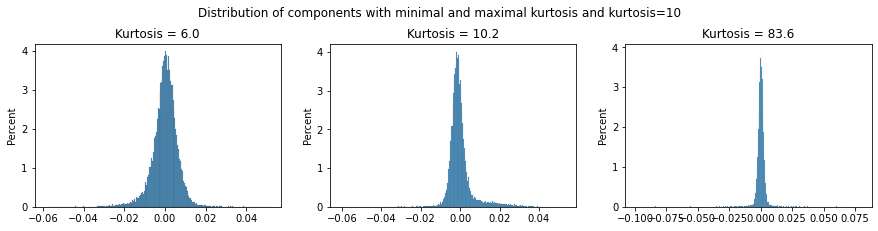

In [54]:
plotKurt(S_delIndiv, kurt, ktsmin = ktsmin)

In [55]:
# Gaussian component removal
S_delKurt,_ = delKurtosis(S_delIndiv, ktsmin=ktsmin)

15 components are characterized by a kurtosis < 10 and will be removed.
After romving those components, 133 components remain.


In [56]:
# FDR module definition
S_fdr = runFDRanalysis(S_delKurt)

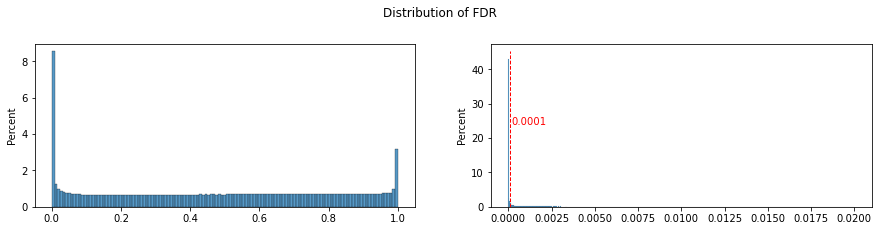

In [57]:
FDRmax = 1e-4
plotFDR(S_fdr.flat, FDRmax = FDRmax)

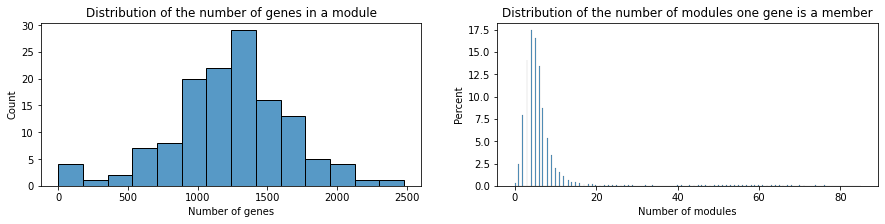

Number of genes in a module : 
- Mean : 1232.69 
- Median : 1270.0 
- Max : 2481 
- Min : 0 

Number of modules per gene : 
- Mean : 6.71 
- Median : 5.0 
- Max : 85 
- Min : 0 

0.34 % of genes are not included in any module.
2.47 % of genes are included in only one module.
97.19 % of genes are included in more than one module.


In [58]:
modules = pd.DataFrame((S_fdr<FDRmax).astype(int), index=g2v.index)
moduleSummary(modules)

Much much overlapp... It's weird...

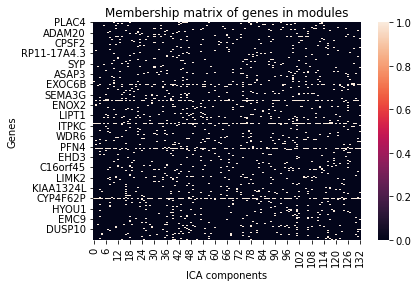

In [59]:
sns.heatmap(modules)
plt.title("Membership matrix of genes in modules")
plt.xlabel("ICA components")
plt.ylabel("Genes")
plt.show()

In [71]:
minAdjPval = runEnrichr(modules, 'g2vICA_GOenrichr', lib = "GO", date = "2021")

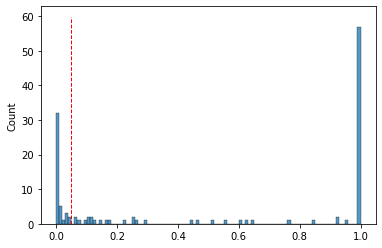

In [72]:
h = sns.histplot(minAdjPval, binwidth=0.01)
plt.vlines(0.05, ymin=h.get_ylim()[0], ymax=h.get_ylim()[1], color = 'r', lw=1, ls="--")

In [86]:
minAdjPval = np.array(minAdjPval)
minAdjPval[minAdjPval==None] = 1

In [88]:
sum(minAdjPval<0.05)/len(minAdjPval)

0.3233082706766917

In [89]:
modules.to_csv("../data/ICAmodules_g2v.csv", header=True, index=True)

In [3]:
modules = pd.read_csv("../data/ICAmodules_g2v.csv", index_col=0)

# Miscelanious tests

### Non-included genes VS 

In [27]:
FDRmax = 1e-3

In [81]:
rnaICA200 = FastICA(n_components=200, fun='logcosh')
rnaS_200 = rnaICA200.fit_transform(rna)  # Reconstruct signals

In [82]:
rnaS200_fdr = ica.runFDRanalysis(rnaS_200)

In [30]:
rnaModules200 = pd.DataFrame((rnaS200_fdr<FDRmax).astype(int), index=rna.index)

In [44]:
FDRmax_ = np.logspace(-14,1,1000)

In [45]:
unclust_ = []
for fdrm in FDRmax_:
    mod_ = pd.DataFrame((rnaS200_fdr<fdrm).astype(int), index=rna.index)
    ModulesPerGene = np.sum(mod_, axis=1)
    unclust_.append(sum(ModulesPerGene==0)/len(ModulesPerGene))

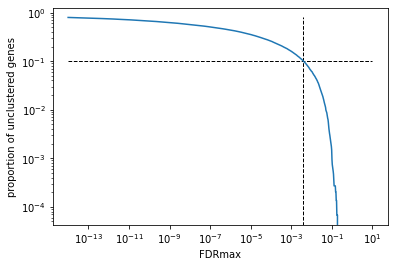

In [67]:
plt.plot(FDRmax_, unclust_)
plt.hlines(1e-1, xmin=min(FDRmax_), xmax=max(FDRmax_), linewidth=1, linestyle='--', color='black')
seuil = FDRmax_[np.argmin([abs(i-1e-1) for i in unclust_])]
plt.vlines(seuil, ymin=min(unclust_), ymax=max(unclust_), linewidth=1, linestyle='--', color='black')
plt.xscale('log')
plt.xlabel('FDRmax')
plt.ylabel('proportion of unclustered genes')
plt.yscale('log')
plt.show()

In [85]:
rnaFDRmax = 1e-2

In [86]:
rna_mm = pd.DataFrame((rnaS200_fdr<rnaFDRmax).astype(int), index=rna.index)

In [83]:
g2vICA200 = FastICA(n_components=200, fun='logcosh')
g2vS_200 = g2vICA200.fit_transform(g2v)  # Reconstruct signals

In [84]:
g2vS200_fdr = ica.runFDRanalysis(g2vS_200)

In [72]:
g2v_unclust_ = []
for fdrm in FDRmax_:
    mod_ = pd.DataFrame((g2vS200_fdr<fdrm).astype(int), index=g2v.index)
    ModulesPerGene = np.sum(mod_, axis=1)
    g2v_unclust_.append(sum(ModulesPerGene==0)/len(ModulesPerGene))

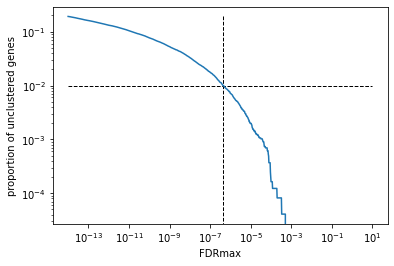

In [74]:
plt.plot(FDRmax_, g2v_unclust_)
plt.hlines(1e-2, xmin=min(FDRmax_), xmax=max(FDRmax_), linewidth=1, linestyle='--', color='black')
g2v_seuil = FDRmax_[np.argmin([abs(i-1e-2) for i in g2v_unclust_])]
plt.vlines(g2v_seuil, ymin=min(g2v_unclust_), ymax=max(g2v_unclust_), linewidth=1, linestyle='--', color='black')
plt.xscale('log')
plt.xlabel('FDRmax')
plt.ylabel('proportion of unclustered genes')
plt.yscale('log')
plt.show()

In [87]:
g2vFDRmax = 1e-6

In [88]:
g2v_mm = pd.DataFrame((g2vS200_fdr<g2vFDRmax).astype(int), index=g2v.index)

In [ ]:
rna_mm.to_csv("./ModuleMatrix/ICA_rna_1e-2.csv", header=True, index=True)
g2v_mm.to_csv("./ModuleMatrix/ICA_g2v_1e-6.csv", header=True, index=True)

## References
**[Rotival 2011]** Rotival M, Zeller T, Wild PS, Maouche S, Szymczak S, Schillert A, et al. (2011) *Integrating Genome-Wide Genetic Variations and Monocyte Expression Data Reveals Trans-Regulated Gene Modules in Humans.* PLoS Genet 7(12): e1002367. https://doi.org/10.1371/journal.pgen.1002367

**[Horn 1965]** Horn JL (1965) *A Rationale and Test for the Number of Factors in Factor Analysis.* Psychometrika 30:179-185.

**[Strimmer 2008]** Strimmer K (2008) *A unified approach to false discovery rate estimation.* BMC Bioinformatics 9: 303